<font size="5">**Introduction**</font>

Land Use/Land Cover (LULC) classification plays a critical role in understanding and managing the Earth's resources, particularly in the context of environmental monitoring and urban planning. In this project, I focused on classifying land cover into four distinct classes: Water, Vegetation, Construction, and Bareland. Leveraging advanced machine learning techniques, specifically XGBoost and RandomForest, I aimed to create an accurate and unbiased classification model.

The raster data for this project was sourced from the Copernicus Sentinel-2 satellite, renowned for its high-resolution imagery and extensive spectral coverage. To prepare the training data, I utilized ArcGIS Pro to extract raster values for each pixel, ensuring that each of the four classes had an equivalent number of data points. This careful balancing was crucial in avoiding class bias and ensuring robust model performance.

Upon training the models, I assessed their performance using a range of metrics, including Cohen's Kappa Score, Omission Error, Commission Error, Producer's Accuracy, and User's Accuracy. Additionally, to provide a clear representation of the classified areas, I plotted a bar graph showing the distribution of land cover classes in square kilometers, and a pie chart illustrating the proportion of surface area covered by each class.

<font size="5">**Program**</font>

<font size="3">Importing libraries</font>

In [1]:
import rasterio
from rasterio.plot import show
import xgboost as xgb
from matplotlib import pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib import cm
import seaborn as sns
import pandas as pd
import numpy as np
import geopandas as gpd
from sklearn.model_selection import train_test_split

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\matplotlib\projections\__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


<font size="3">Fetching and reading the raster data</font>

In [2]:
src = rasterio.open('rasterData.tif')

In [3]:
img = src.read()

In [4]:
print('Number of bands: {}'.format(img.shape[0]))
print('Raster data (width): {}'.format(img.shape[1]))
print('Raster data (height): {}'.format(img.shape[2]))

Number of bands: 11
Raster data (width): 5363
Raster data (height): 5621


In [5]:
#img = np.moveaxis(img, [0,1,2], [2,1,0])
img = img.transpose([1,2,0])
img.shape

(5363, 5621, 11)

In order to display the TCI (True Color Image), we will have to stack the bands 02(Blue), 03(Green) and 04(Red) together i.e. (BGR)

In [6]:
b = img[:,:,1]
g = img[:,:,2]
r = img[:,:,3]

Since stacking the required bands together wasn't enough as the pixel values were exceeding the value 255 making it a complete white image, hence normalizing image is crucial

In [7]:
def normalize(band):
    band_min, band_max = (band.min(), band.max())
    return ((band-band_min)/((band_max - band_min)))
def brighten(band):
    alpha=0.05
    beta=70
    return np.clip(alpha*band+beta, 0,255)

In [8]:
red_b=brighten(r)
blue_b=brighten(b)
green_b=brighten(g)

red_n = normalize(red_b)
green_n = normalize(green_b)
blue_n = normalize(blue_b)

Stacking the bands and displaying the TCI (True Color Image)

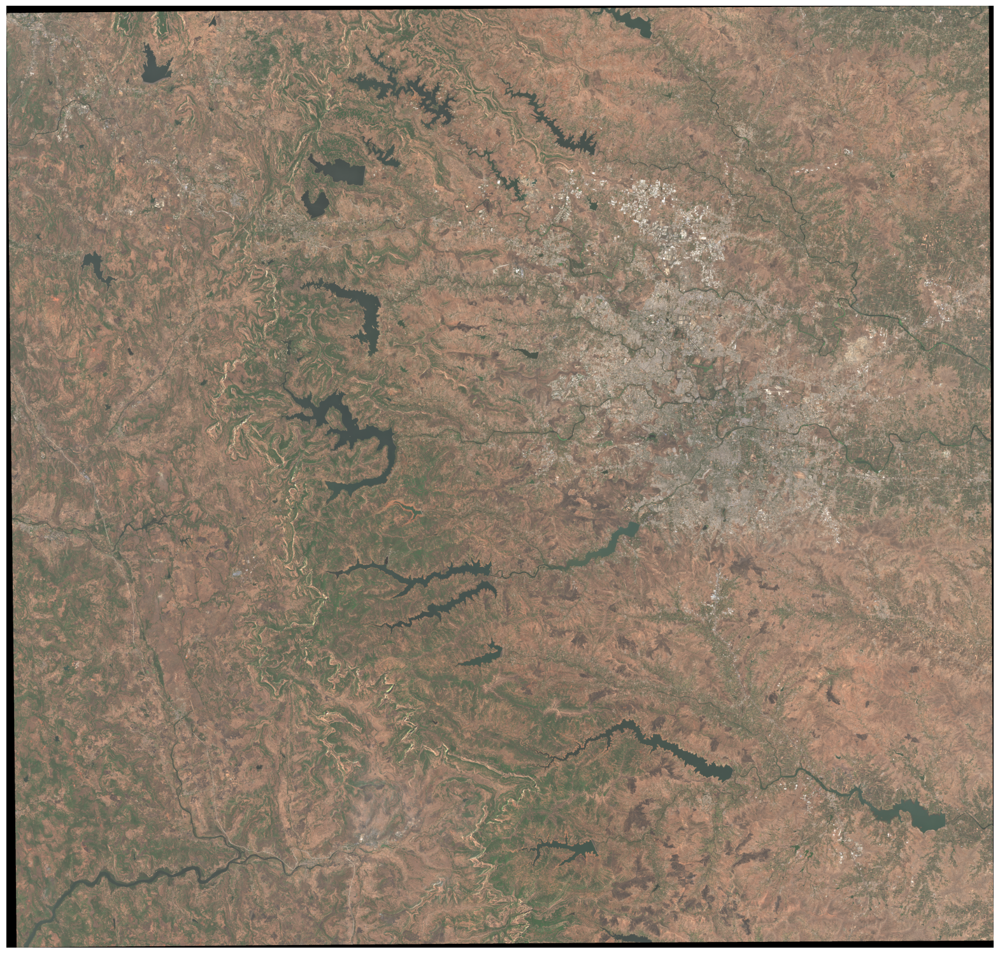

In [9]:
rgb = np.dstack((red_n,green_n,blue_n))
fig = plt.figure(figsize = (20,20))
fig.add_subplot(1,1,1)
plt.imshow(rgb)
plt.axis('off')
plt.show()

<font size="3">Reading the shapefile</font>

In [10]:
data = gpd.read_file('Data2/data.shp')

<font size="3">Data Wrangling</font>

In [11]:
data = data.drop(['OBJECTID'], axis = 1)
data = gpd.GeoDataFrame(data, geometry='geometry')
data

,B01,B02,B03,B04,B05,B06,B07,B08,B09,B11,B12,Class,ClassName,geometry
0,1228,1214,1256,1110,1105,1090,1092,1088,1035,1069,1063,1,Water,POINT Z (316111.610 2092584.656 0.000)
1,1230,1209,1248,1100,1078,1061,1066,1055,1008,1086,1081,1,Water,POINT Z (316280.247 2094228.875 0.000)
2,1222,1213,1261,1119,1111,1069,1082,1072,1023,1095,1081,1,Water,POINT Z (317619.771 2093202.882 0.000)
3,1103,1087,1166,1036,1008,971,984,998,941,1110,1118,1,Water,POINT Z (323059.353 2098659.732 0.000)
4,1108,1088,1179,1037,1022,978,971,1004,962,1132,1129,1,Water,POINT Z (323266.576 2098884.223 0.000)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
386,1419,1498,1738,2266,2597,2893,3111,3375,3635,4341,3283,4,Bareland,POINT Z (366354.016 2031250.066 0.000)
387,1370,1498,1742,2092,2405,2602,2748,2980,3141,4256,3369,4,Bareland,POINT Z (365170.263 2032597.904 0.000)
388,1560,1730,2004,2466,2833,2969,3093,3203,3423,4819,3881,4,Bareland,POINT Z (367262.342 2033424.187 0.000)
389,1384,1493,1692,2076,2358,2546,2707,2985,3037,4140,3272,4,Bareland,POINT Z (368164.807 2034086.386 0.000)


The below histogram represents that the supervised dataset in balanced

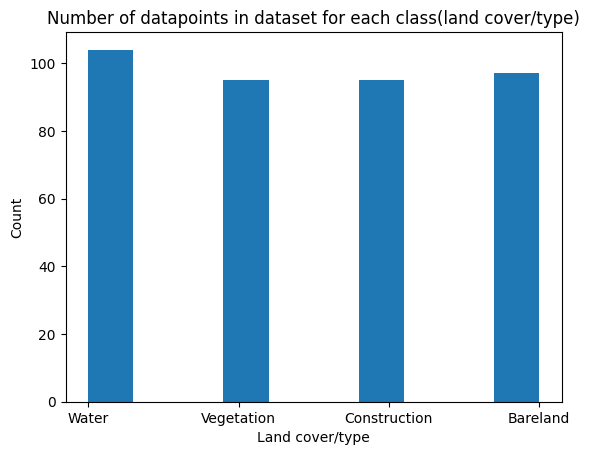

In [12]:
plt.hist(data['ClassName'])
plt.title('Number of datapoints in dataset for each class(land cover/type)')
plt.xlabel('Land cover/type')
plt.ylabel('Count')
plt.show()

Setting the CRS (Coordinate Reference System) same as the raster data, here 4326

In [13]:
data = data.to_crs('EPSG:4326')

In [14]:
#from rasterio.crs import CRS
#import rioxarray as rxr

#raster = rxr.open_rasterio('dataset.img', masked=True).squeeze()
#raster_new = raster.rio.reproject(CRS.from_string('EPSG:4326'))

print(src.crs)

EPSG:4326


In [15]:
cmap = ListedColormap(['yellow', 'red', 'lime', 'cyan'])

Plotting the data points on the raster data based on the values read from the shapefile/supervised dataset

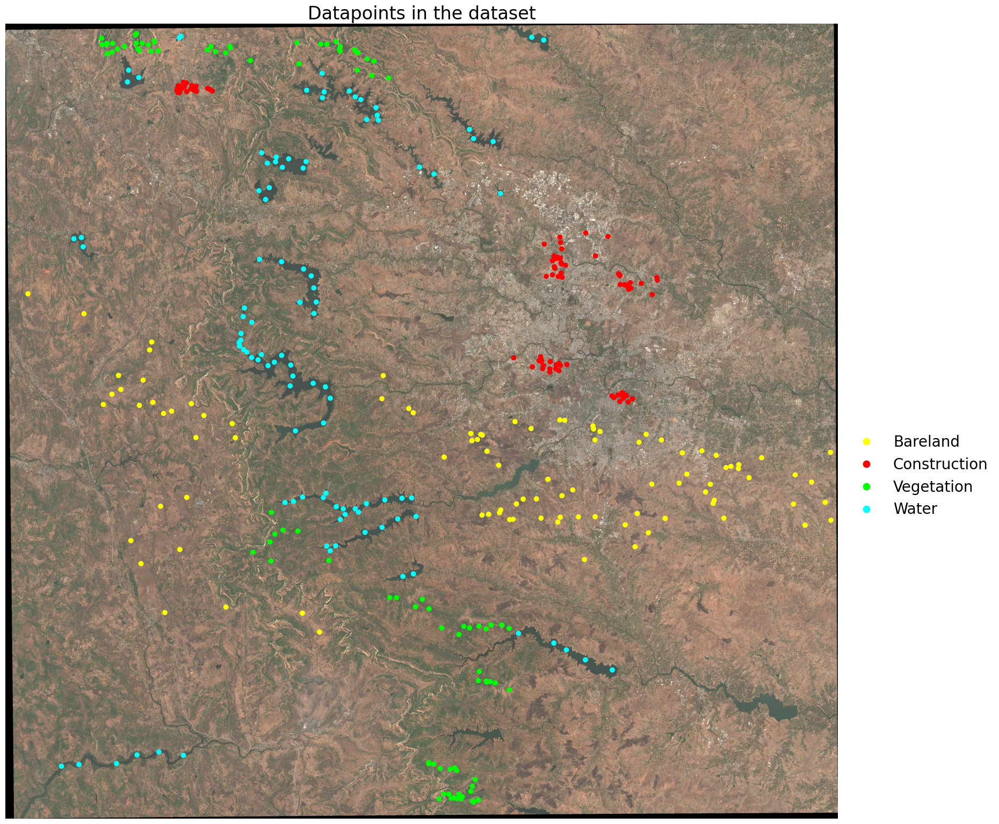

In [16]:
fig, ax = plt.subplots(figsize = (20,20))
data.plot(column = 'ClassName', categorical = True, cmap = cmap, legend = True, legend_kwds = {'bbox_to_anchor':(1,0.5), 'loc':'upper left', 'fontsize': 20, 'frameon': False}, ax = ax)

show(rgb.transpose([2,0,1]), transform = src.transform, ax = ax)
plt.title('Datapoints in the dataset', fontsize = '24')
ax.axis('off')
plt.show()

Extracting the x and y cooridnates of each point and storing the raster value of all bands associated with each coordinate

In [17]:
arr_data = []
for point in data['geometry']:
    x = point.xy[0][0]
    y = point.xy[1][0]
    row, col = src.index(x,y)
    band_value = []
    for i in range(src.count):
        band_value.append(src.read(i+1)[row,col])
    arr_data.append(band_value)

In [18]:
X = np.array(arr_data)

In [19]:
pd.DataFrame(X).head()

,0,1,2,3,4,5,6,7,8,9,10
0,1228,1228,1260,1119,1105,1090,1092,1090,1035,1069,1063
1,1230,1218,1238,1100,1078,1061,1066,1056,1008,1086,1081
2,1222,1209,1259,1113,1115,1070,1074,1077,1023,1089,1082
3,1103,1101,1170,1037,1010,967,986,998,941,1106,1109
4,1106,1097,1160,1034,1019,994,1001,1005,962,1139,1131


In [20]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [21]:
Y = data['ClassName'].values

In [22]:
labelEncoder = LabelEncoder()

In [23]:
Y = labelEncoder.fit_transform(Y)

In [24]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 42)

# XGBoost

In [25]:
clf = xgb.XGBClassifier(objective = "multi:softprob", random_state = 42, verbosity = 3, n_estimators = 500, max_depth = 10, n_thread = 8, n_jobs = 8, learning_rate = 0.01)

In [26]:
history = clf.fit(X_train, Y_train)

[11:18:33] ======== Monitor (0): HostSketchContainer ========
[11:18:33] AllReduce: 0.000185s, 1 calls @ 185us

[11:18:33] MakeCuts: 0.000603s, 1 calls @ 603us

[11:18:33] DEBUG: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\gbm\gbtree.cc:130: Using tree method: 0


C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:18:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:18:33] ======== Monitor (0): Learner ========
[11:18:33] Configure: 0.029179s, 1 calls @ 29179us

[11:18:33] EvalOneIter: 0.001996s, 500 calls @ 1996us

[11:18:33] GetGradient: 0.005728s, 500 calls @ 5728us

[11:18:33] PredictRaw: 0.000265s, 500 calls @ 265us

[11:18:33] UpdateOneIter: 0.39898s, 500 calls @ 398980us

[11:18:33] ======== Monitor (0): GBTree ========
[11:18:33] BoostNewTrees: 0.362523s, 500 calls @ 362523us

[11:18:33] CommitModel: 0.000155s, 500 calls @ 155us

[11:18:33] ======== Monitor (0): HistUpdater ========
[11:18:33] BuildHistogram: 0.093436s, 6263 calls @ 93436us

[11:18:33] EvaluateSplits: 0.157268s, 8263 calls @ 157268us

[11:18:33] InitData: 0.010348s, 2000 calls @ 10348us

[11:18:33] InitRoot: 0.067815s, 2000 calls @ 67815us

[11:18:33] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:18:33] UpdatePosition: 0.030942s, 6263 calls @ 30942us

[11:18:33] UpdatePredictionCache: 0.007083s, 2000 calls @ 7083us

[11:18:33] UpdateTree: 0.346324s, 2000 calls @ 34

In [27]:
Y_predict = clf.predict(X_test)

[11:18:33] DEBUG: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\gbm\gbtree.cc:130: Using tree method: 0


In [28]:
predict_img = np.nan_to_num(img)

In [29]:
predict_img.shape

(5363, 5621, 11)

In [30]:
predict_img = predict_img.reshape(img.shape[0]*img.shape[1], img.shape[2])
predict_img.shape

(30145423, 11)

In [31]:
array_pred = clf.predict(predict_img)

In [32]:
array_pred = array_pred.reshape(img.shape[0], img.shape[1])

### Model Evaluation

<font size="3">Classification Report</font>

In [33]:
print(classification_report(Y_test, Y_predict))

              precision    recall  f1-score   support

           0       1.00      0.94      0.97        18
           1       0.88      1.00      0.94        15
           2       1.00      0.95      0.97        19
           3       1.00      1.00      1.00        27

    accuracy                           0.97        79
   macro avg       0.97      0.97      0.97        79
weighted avg       0.98      0.97      0.98        79



Coefficient of determination of the predictions:

<font size="3">Training data:</font>

In [34]:
print('Training data:',clf.score(X_train, Y_train))

Training data: 1.0


<font size="3">Testing data:</font>

In [35]:
print('Testing data:',clf.score(X_test, Y_test))

Testing data: 0.9746835443037974


<font size="3">Accuracy score of training and testing data</font>

[11:19:53] ======== Monitor (0): HostSketchContainer ========
[11:19:53] AllReduce: 0.000302s, 1 calls @ 302us

[11:19:53] MakeCuts: 0.000375s, 1 calls @ 375us

[11:19:53] DEBUG: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\gbm\gbtree.cc:130: Using tree method: 0


C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:19:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:19:53] ======== Monitor (0): Learner ========
[11:19:53] Configure: 0.000737s, 1 calls @ 737us

[11:19:53] EvalOneIter: 0.001645s, 500 calls @ 1645us

[11:19:53] GetGradient: 0.006684s, 500 calls @ 6684us

[11:19:53] PredictRaw: 0.000276s, 500 calls @ 276us

[11:19:53] UpdateOneIter: 0.133269s, 500 calls @ 133269us

[11:19:53] ======== Monitor (0): GBTree ========
[11:19:53] BoostNewTrees: 0.124184s, 500 calls @ 124184us

[11:19:53] CommitModel: 0.000172s, 500 calls @ 172us

[11:19:53] ======== Monitor (0): HistUpdater ========
[11:19:53] EvaluateSplits: 0.036485s, 2000 calls @ 36485us

[11:19:53] InitData: 0.010663s, 2000 calls @ 10663us

[11:19:53] InitRoot: 0.078415s, 2000 calls @ 78415us

[11:19:53] LeafPartition: 0.000177s, 2000 calls @ 177us

[11:19:53] UpdatePosition: 0.013987s, 2000 calls @ 13987us

[11:19:53] UpdatePredictionCache: 0.005782s, 2000 calls @ 5782us

[11:19:53] UpdateTree: 0.108294s, 2000 calls @ 108294us

[11:19:53] DEBUG: C:\buildkite-agent\builds\buildkite-

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:19:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:19:53] ======== Monitor (0): Learner ========
[11:19:53] Configure: 0.000445s, 1 calls @ 445us

[11:19:53] EvalOneIter: 0.001627s, 500 calls @ 1627us

[11:19:53] GetGradient: 0.005477s, 500 calls @ 5477us

[11:19:53] PredictRaw: 0.000279s, 500 calls @ 279us

[11:19:53] UpdateOneIter: 0.204142s, 500 calls @ 204142us

[11:19:53] ======== Monitor (0): GBTree ========
[11:19:53] BoostNewTrees: 0.196561s, 500 calls @ 196561us

[11:19:53] CommitModel: 0.00025s, 500 calls @ 250us

[11:19:53] ======== Monitor (0): HistUpdater ========
[11:19:53] BuildHistogram: 0.031943s, 2000 calls @ 31943us

[11:19:53] EvaluateSplits: 0.073699s, 4000 calls @ 73699us

[11:19:53] InitData: 0.00913s, 2000 calls @ 9130us

[11:19:53] InitRoot: 0.070365s, 2000 calls @ 70365us

[11:19:53] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:19:53] UpdatePosition: 0.020088s, 3500 calls @ 20088us

[11:19:53] UpdatePredictionCache: 0.005443s, 2000 calls @ 5443us

[11:19:53] UpdateTree: 0.182778s, 2000 calls @ 182778u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:19:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:19:54] ======== Monitor (0): Learner ========
[11:19:54] Configure: 0.000472s, 1 calls @ 472us

[11:19:54] EvalOneIter: 0.001568s, 500 calls @ 1568us

[11:19:54] GetGradient: 0.004987s, 500 calls @ 4987us

[11:19:54] PredictRaw: 0.000256s, 500 calls @ 256us

[11:19:54] UpdateOneIter: 0.271562s, 500 calls @ 271562us

[11:19:54] ======== Monitor (0): GBTree ========
[11:19:54] BoostNewTrees: 0.264532s, 500 calls @ 264532us

[11:19:54] CommitModel: 0.00016s, 500 calls @ 160us

[11:19:54] ======== Monitor (0): HistUpdater ========
[11:19:54] BuildHistogram: 0.053679s, 3500 calls @ 53679us

[11:19:54] EvaluateSplits: 0.110273s, 5500 calls @ 110273us

[11:19:54] InitData: 0.010249s, 2000 calls @ 10249us

[11:19:54] InitRoot: 0.067651s, 2000 calls @ 67651us

[11:19:54] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:19:54] UpdatePosition: 0.025613s, 4847 calls @ 25613us

[11:19:54] UpdatePredictionCache: 0.005582s, 2000 calls @ 5582us

[11:19:54] UpdateTree: 0.250451s, 2000 calls @ 2504

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:19:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:19:54] ======== Monitor (0): Learner ========
[11:19:54] Configure: 0.000436s, 1 calls @ 436us

[11:19:54] EvalOneIter: 0.001514s, 500 calls @ 1514us

[11:19:54] GetGradient: 0.004905s, 500 calls @ 4905us

[11:19:54] PredictRaw: 0.000246s, 500 calls @ 246us

[11:19:54] UpdateOneIter: 0.317659s, 500 calls @ 317659us

[11:19:54] ======== Monitor (0): GBTree ========
[11:19:54] BoostNewTrees: 0.310855s, 500 calls @ 310855us

[11:19:54] CommitModel: 0.000157s, 500 calls @ 157us

[11:19:54] ======== Monitor (0): HistUpdater ========
[11:19:54] BuildHistogram: 0.072032s, 4856 calls @ 72032us

[11:19:54] EvaluateSplits: 0.135552s, 6856 calls @ 135552us

[11:19:54] InitData: 0.010162s, 2000 calls @ 10162us

[11:19:54] InitRoot: 0.065325s, 2000 calls @ 65325us

[11:19:54] LeafPartition: 0.000185s, 2000 calls @ 185us

[11:19:54] UpdatePosition: 0.027575s, 5737 calls @ 27575us

[11:19:54] UpdatePredictionCache: 0.005967s, 2000 calls @ 5967us

[11:19:54] UpdateTree: 0.296572s, 2000 calls @ 296

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:19:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:19:55] ======== Monitor (0): Learner ========
[11:19:55] Configure: 0.000464s, 1 calls @ 464us

[11:19:55] EvalOneIter: 0.001581s, 500 calls @ 1581us

[11:19:55] GetGradient: 0.005195s, 500 calls @ 5195us

[11:19:55] PredictRaw: 0.000258s, 500 calls @ 258us

[11:19:55] UpdateOneIter: 0.344714s, 500 calls @ 344714us

[11:19:55] ======== Monitor (0): GBTree ========
[11:19:55] BoostNewTrees: 0.337511s, 500 calls @ 337511us

[11:19:55] CommitModel: 0.000154s, 500 calls @ 154us

[11:19:55] ======== Monitor (0): HistUpdater ========
[11:19:55] BuildHistogram: 0.083875s, 5680 calls @ 83875us

[11:19:55] EvaluateSplits: 0.145707s, 7680 calls @ 145707us

[11:19:55] InitData: 0.011135s, 2000 calls @ 11135us

[11:19:55] InitRoot: 0.065883s, 2000 calls @ 65883us

[11:19:55] LeafPartition: 0.000197s, 2000 calls @ 197us

[11:19:55] UpdatePosition: 0.029439s, 5972 calls @ 29439us

[11:19:55] UpdatePredictionCache: 0.005713s, 2000 calls @ 5713us

[11:19:55] UpdateTree: 0.323186s, 2000 calls @ 323

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:19:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:19:55] ======== Monitor (0): Learner ========
[11:19:55] Configure: 0.000447s, 1 calls @ 447us

[11:19:55] EvalOneIter: 0.0016s, 500 calls @ 1600us

[11:19:55] GetGradient: 0.005187s, 500 calls @ 5187us

[11:19:55] PredictRaw: 0.000268s, 500 calls @ 268us

[11:19:55] UpdateOneIter: 0.358605s, 500 calls @ 358605us

[11:19:55] ======== Monitor (0): GBTree ========
[11:19:55] BoostNewTrees: 0.351337s, 500 calls @ 351337us

[11:19:55] CommitModel: 0.00017s, 500 calls @ 170us

[11:19:55] ======== Monitor (0): HistUpdater ========
[11:19:55] BuildHistogram: 0.088224s, 5978 calls @ 88224us

[11:19:55] EvaluateSplits: 0.152008s, 7978 calls @ 152008us

[11:19:55] InitData: 0.011159s, 2000 calls @ 11159us

[11:19:55] InitRoot: 0.067453s, 2000 calls @ 67453us

[11:19:55] LeafPartition: 0.000179s, 2000 calls @ 179us

[11:19:55] UpdatePosition: 0.030658s, 6144 calls @ 30658us

[11:19:55] UpdatePredictionCache: 0.00617s, 2000 calls @ 6170us

[11:19:55] UpdateTree: 0.336398s, 2000 calls @ 336398u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:19:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:19:56] ======== Monitor (0): Learner ========
[11:19:56] Configure: 0.00046s, 1 calls @ 460us

[11:19:56] EvalOneIter: 0.001805s, 500 calls @ 1805us

[11:19:56] GetGradient: 0.00529s, 500 calls @ 5290us

[11:19:56] PredictRaw: 0.000313s, 500 calls @ 313us

[11:19:56] UpdateOneIter: 0.3782s, 500 calls @ 378200us

[11:19:56] ======== Monitor (0): GBTree ========
[11:19:56] BoostNewTrees: 0.370683s, 500 calls @ 370683us

[11:19:56] CommitModel: 0.000179s, 500 calls @ 179us

[11:19:56] ======== Monitor (0): HistUpdater ========
[11:19:56] BuildHistogram: 0.093039s, 6176 calls @ 93039us

[11:19:56] EvaluateSplits: 0.158821s, 8176 calls @ 158821us

[11:19:56] InitData: 0.012039s, 2000 calls @ 12039us

[11:19:56] InitRoot: 0.068988s, 2000 calls @ 68988us

[11:19:56] LeafPartition: 0.00018s, 2000 calls @ 180us

[11:19:56] UpdatePosition: 0.033485s, 6263 calls @ 33485us

[11:19:56] UpdatePredictionCache: 0.007643s, 2000 calls @ 7643us

[11:19:56] UpdateTree: 0.353674s, 2000 calls @ 353674us

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:19:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:19:56] ======== Monitor (0): Learner ========
[11:19:56] Configure: 0.00044s, 1 calls @ 440us

[11:19:56] EvalOneIter: 0.001563s, 500 calls @ 1563us

[11:19:56] GetGradient: 0.005298s, 500 calls @ 5298us

[11:19:56] PredictRaw: 0.000255s, 500 calls @ 255us

[11:19:56] UpdateOneIter: 0.361174s, 500 calls @ 361174us

[11:19:56] ======== Monitor (0): GBTree ========
[11:19:56] BoostNewTrees: 0.353935s, 500 calls @ 353935us

[11:19:56] CommitModel: 0.000157s, 500 calls @ 157us

[11:19:56] ======== Monitor (0): HistUpdater ========
[11:19:56] BuildHistogram: 0.0918s, 6263 calls @ 91800us

[11:19:56] EvaluateSplits: 0.152254s, 8263 calls @ 152254us

[11:19:56] InitData: 0.0111s, 2000 calls @ 11100us

[11:19:56] InitRoot: 0.065664s, 2000 calls @ 65664us

[11:19:56] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:19:56] UpdatePosition: 0.030795s, 6263 calls @ 30795us

[11:19:56] UpdatePredictionCache: 0.005862s, 2000 calls @ 5862us

[11:19:56] UpdateTree: 0.33978s, 2000 calls @ 339780us



C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:19:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:19:57] ======== Monitor (0): Learner ========
[11:19:57] Configure: 0.000443s, 1 calls @ 443us

[11:19:57] EvalOneIter: 0.001656s, 500 calls @ 1656us

[11:19:57] GetGradient: 0.005034s, 500 calls @ 5034us

[11:19:57] PredictRaw: 0.000255s, 500 calls @ 255us

[11:19:57] UpdateOneIter: 0.363216s, 500 calls @ 363216us

[11:19:57] ======== Monitor (0): GBTree ========
[11:19:57] BoostNewTrees: 0.356147s, 500 calls @ 356147us

[11:19:57] CommitModel: 0.00021s, 500 calls @ 210us

[11:19:57] ======== Monitor (0): HistUpdater ========
[11:19:57] BuildHistogram: 0.092796s, 6263 calls @ 92796us

[11:19:57] EvaluateSplits: 0.153635s, 8263 calls @ 153635us

[11:19:57] InitData: 0.010457s, 2000 calls @ 10457us

[11:19:57] InitRoot: 0.066599s, 2000 calls @ 66599us

[11:19:57] LeafPartition: 0.00019s, 2000 calls @ 190us

[11:19:57] UpdatePosition: 0.03096s, 6263 calls @ 30960us

[11:19:57] UpdatePredictionCache: 0.006344s, 2000 calls @ 6344us

[11:19:57] UpdateTree: 0.341189s, 2000 calls @ 341189

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:19:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:19:57] ======== Monitor (0): Learner ========
[11:19:57] Configure: 0.000479s, 1 calls @ 479us

[11:19:57] EvalOneIter: 0.001556s, 500 calls @ 1556us

[11:19:57] GetGradient: 0.005253s, 500 calls @ 5253us

[11:19:57] PredictRaw: 0.000245s, 500 calls @ 245us

[11:19:57] UpdateOneIter: 0.35576s, 500 calls @ 355760us

[11:19:57] ======== Monitor (0): GBTree ========
[11:19:57] BoostNewTrees: 0.348536s, 500 calls @ 348536us

[11:19:57] CommitModel: 0.000157s, 500 calls @ 157us

[11:19:57] ======== Monitor (0): HistUpdater ========
[11:19:57] BuildHistogram: 0.090602s, 6263 calls @ 90602us

[11:19:57] EvaluateSplits: 0.152629s, 8263 calls @ 152629us

[11:19:57] InitData: 0.009771s, 2000 calls @ 9771us

[11:19:57] InitRoot: 0.065435s, 2000 calls @ 65435us

[11:19:57] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:19:57] UpdatePosition: 0.029279s, 6263 calls @ 29279us

[11:19:57] UpdatePredictionCache: 0.005998s, 2000 calls @ 5998us

[11:19:57] UpdateTree: 0.333901s, 2000 calls @ 33390

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:19:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:19:58] ======== Monitor (0): Learner ========
[11:19:58] Configure: 0.000426s, 1 calls @ 426us

[11:19:58] EvalOneIter: 0.001566s, 500 calls @ 1566us

[11:19:58] GetGradient: 0.005116s, 500 calls @ 5116us

[11:19:58] PredictRaw: 0.000253s, 500 calls @ 253us

[11:19:58] UpdateOneIter: 0.346619s, 500 calls @ 346619us

[11:19:58] ======== Monitor (0): GBTree ========
[11:19:58] BoostNewTrees: 0.339611s, 500 calls @ 339611us

[11:19:58] CommitModel: 0.000152s, 500 calls @ 152us

[11:19:58] ======== Monitor (0): HistUpdater ========
[11:19:58] BuildHistogram: 0.08807s, 6263 calls @ 88070us

[11:19:58] EvaluateSplits: 0.148956s, 8263 calls @ 148956us

[11:19:58] InitData: 0.009388s, 2000 calls @ 9388us

[11:19:58] InitRoot: 0.064016s, 2000 calls @ 64016us

[11:19:58] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:19:58] UpdatePosition: 0.029033s, 6263 calls @ 29033us

[11:19:58] UpdatePredictionCache: 0.005634s, 2000 calls @ 5634us

[11:19:58] UpdateTree: 0.325601s, 2000 calls @ 325601

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:19:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:19:58] ======== Monitor (0): Learner ========
[11:19:58] Configure: 0.000449s, 1 calls @ 449us

[11:19:58] EvalOneIter: 0.001746s, 500 calls @ 1746us

[11:19:58] GetGradient: 0.005327s, 500 calls @ 5327us

[11:19:58] PredictRaw: 0.000267s, 500 calls @ 267us

[11:19:58] UpdateOneIter: 0.377211s, 500 calls @ 377211us

[11:19:58] ======== Monitor (0): GBTree ========
[11:19:58] BoostNewTrees: 0.36984s, 500 calls @ 369840us

[11:19:58] CommitModel: 0.00018s, 500 calls @ 180us

[11:19:58] ======== Monitor (0): HistUpdater ========
[11:19:58] BuildHistogram: 0.093961s, 6263 calls @ 93961us

[11:19:58] EvaluateSplits: 0.15689s, 8263 calls @ 156890us

[11:19:58] InitData: 0.010826s, 2000 calls @ 10826us

[11:19:58] InitRoot: 0.068263s, 2000 calls @ 68263us

[11:19:58] LeafPartition: 0.000182s, 2000 calls @ 182us

[11:19:58] UpdatePosition: 0.036505s, 6263 calls @ 36505us

[11:19:58] UpdatePredictionCache: 0.006523s, 2000 calls @ 6523us

[11:19:58] UpdateTree: 0.353842s, 2000 calls @ 353842

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:19:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:19:58] ======== Monitor (0): Learner ========
[11:19:58] Configure: 0.000429s, 1 calls @ 429us

[11:19:58] EvalOneIter: 0.001567s, 500 calls @ 1567us

[11:19:58] GetGradient: 0.004976s, 500 calls @ 4976us

[11:19:58] PredictRaw: 0.000251s, 500 calls @ 251us

[11:19:58] UpdateOneIter: 0.346777s, 500 calls @ 346777us

[11:19:58] ======== Monitor (0): GBTree ========
[11:19:58] BoostNewTrees: 0.339863s, 500 calls @ 339863us

[11:19:58] CommitModel: 0.00016s, 500 calls @ 160us

[11:19:58] ======== Monitor (0): HistUpdater ========
[11:19:58] BuildHistogram: 0.089725s, 6263 calls @ 89725us

[11:19:58] EvaluateSplits: 0.147026s, 8263 calls @ 147026us

[11:19:58] InitData: 0.009545s, 2000 calls @ 9545us

[11:19:58] InitRoot: 0.064415s, 2000 calls @ 64415us

[11:19:58] LeafPartition: 0.000166s, 2000 calls @ 166us

[11:19:58] UpdatePosition: 0.028502s, 6263 calls @ 28502us

[11:19:58] UpdatePredictionCache: 0.005995s, 2000 calls @ 5995us

[11:19:58] UpdateTree: 0.32548s, 2000 calls @ 325480

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:19:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:19:59] ======== Monitor (0): Learner ========
[11:19:59] Configure: 0.00044s, 1 calls @ 440us

[11:19:59] EvalOneIter: 0.001499s, 500 calls @ 1499us

[11:19:59] GetGradient: 0.005112s, 500 calls @ 5112us

[11:19:59] PredictRaw: 0.000245s, 500 calls @ 245us

[11:19:59] UpdateOneIter: 0.350081s, 500 calls @ 350081us

[11:19:59] ======== Monitor (0): GBTree ========
[11:19:59] BoostNewTrees: 0.343069s, 500 calls @ 343069us

[11:19:59] CommitModel: 0.000156s, 500 calls @ 156us

[11:19:59] ======== Monitor (0): HistUpdater ========
[11:19:59] BuildHistogram: 0.088933s, 6263 calls @ 88933us

[11:19:59] EvaluateSplits: 0.149082s, 8263 calls @ 149082us

[11:19:59] InitData: 0.009538s, 2000 calls @ 9538us

[11:19:59] InitRoot: 0.065203s, 2000 calls @ 65203us

[11:19:59] LeafPartition: 0.000171s, 2000 calls @ 171us

[11:19:59] UpdatePosition: 0.028887s, 6263 calls @ 28887us

[11:19:59] UpdatePredictionCache: 0.005677s, 2000 calls @ 5677us

[11:19:59] UpdateTree: 0.329165s, 2000 calls @ 32916

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:19:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:19:59] ======== Monitor (0): Learner ========
[11:19:59] Configure: 0.000494s, 1 calls @ 494us

[11:19:59] EvalOneIter: 0.001572s, 500 calls @ 1572us

[11:19:59] GetGradient: 0.004962s, 500 calls @ 4962us

[11:19:59] PredictRaw: 0.000258s, 500 calls @ 258us

[11:19:59] UpdateOneIter: 0.358578s, 500 calls @ 358578us

[11:19:59] ======== Monitor (0): GBTree ========
[11:19:59] BoostNewTrees: 0.351591s, 500 calls @ 351591us

[11:19:59] CommitModel: 0.000159s, 500 calls @ 159us

[11:19:59] ======== Monitor (0): HistUpdater ========
[11:19:59] BuildHistogram: 0.090077s, 6263 calls @ 90077us

[11:19:59] EvaluateSplits: 0.155413s, 8263 calls @ 155413us

[11:19:59] InitData: 0.009451s, 2000 calls @ 9451us

[11:19:59] InitRoot: 0.066093s, 2000 calls @ 66093us

[11:19:59] LeafPartition: 0.000178s, 2000 calls @ 178us

[11:19:59] UpdatePosition: 0.028964s, 6263 calls @ 28964us

[11:19:59] UpdatePredictionCache: 0.006333s, 2000 calls @ 6333us

[11:19:59] UpdateTree: 0.336849s, 2000 calls @ 3368

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:19:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:00] ======== Monitor (0): Learner ========
[11:20:00] Configure: 0.000454s, 1 calls @ 454us

[11:20:00] EvalOneIter: 0.001589s, 500 calls @ 1589us

[11:20:00] GetGradient: 0.005118s, 500 calls @ 5118us

[11:20:00] PredictRaw: 0.000253s, 500 calls @ 253us

[11:20:00] UpdateOneIter: 0.356929s, 500 calls @ 356929us

[11:20:00] ======== Monitor (0): GBTree ========
[11:20:00] BoostNewTrees: 0.349829s, 500 calls @ 349829us

[11:20:00] CommitModel: 0.000156s, 500 calls @ 156us

[11:20:00] ======== Monitor (0): HistUpdater ========
[11:20:00] BuildHistogram: 0.091147s, 6263 calls @ 91147us

[11:20:00] EvaluateSplits: 0.15273s, 8263 calls @ 152730us

[11:20:00] InitData: 0.010032s, 2000 calls @ 10032us

[11:20:00] InitRoot: 0.0662s, 2000 calls @ 66200us

[11:20:00] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:20:00] UpdatePosition: 0.029633s, 6263 calls @ 29633us

[11:20:00] UpdatePredictionCache: 0.005833s, 2000 calls @ 5833us

[11:20:00] UpdateTree: 0.33561s, 2000 calls @ 335610u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:00] ======== Monitor (0): Learner ========
[11:20:00] Configure: 0.000489s, 1 calls @ 489us

[11:20:00] EvalOneIter: 0.001571s, 500 calls @ 1571us

[11:20:00] GetGradient: 0.005006s, 500 calls @ 5006us

[11:20:00] PredictRaw: 0.000254s, 500 calls @ 254us

[11:20:00] UpdateOneIter: 0.357246s, 500 calls @ 357246us

[11:20:00] ======== Monitor (0): GBTree ========
[11:20:00] BoostNewTrees: 0.350199s, 500 calls @ 350199us

[11:20:00] CommitModel: 0.00017s, 500 calls @ 170us

[11:20:00] ======== Monitor (0): HistUpdater ========
[11:20:00] BuildHistogram: 0.091571s, 6263 calls @ 91571us

[11:20:00] EvaluateSplits: 0.152147s, 8263 calls @ 152147us

[11:20:00] InitData: 0.009927s, 2000 calls @ 9927us

[11:20:00] InitRoot: 0.066014s, 2000 calls @ 66014us

[11:20:00] LeafPartition: 0.000169s, 2000 calls @ 169us

[11:20:00] UpdatePosition: 0.030154s, 6263 calls @ 30154us

[11:20:00] UpdatePredictionCache: 0.005793s, 2000 calls @ 5793us

[11:20:00] UpdateTree: 0.335844s, 2000 calls @ 33584

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:01] ======== Monitor (0): Learner ========
[11:20:01] Configure: 0.000466s, 1 calls @ 466us

[11:20:01] EvalOneIter: 0.001557s, 500 calls @ 1557us

[11:20:01] GetGradient: 0.005191s, 500 calls @ 5191us

[11:20:01] PredictRaw: 0.000247s, 500 calls @ 247us

[11:20:01] UpdateOneIter: 0.355989s, 500 calls @ 355989us

[11:20:01] ======== Monitor (0): GBTree ========
[11:20:01] BoostNewTrees: 0.348824s, 500 calls @ 348824us

[11:20:01] CommitModel: 0.000153s, 500 calls @ 153us

[11:20:01] ======== Monitor (0): HistUpdater ========
[11:20:01] BuildHistogram: 0.090665s, 6263 calls @ 90665us

[11:20:01] EvaluateSplits: 0.152261s, 8263 calls @ 152261us

[11:20:01] InitData: 0.009314s, 2000 calls @ 9314us

[11:20:01] InitRoot: 0.064963s, 2000 calls @ 64963us

[11:20:01] LeafPartition: 0.000172s, 2000 calls @ 172us

[11:20:01] UpdatePosition: 0.029622s, 6263 calls @ 29622us

[11:20:01] UpdatePredictionCache: 0.005697s, 2000 calls @ 5697us

[11:20:01] UpdateTree: 0.334629s, 2000 calls @ 3346

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:01] ======== Monitor (0): Learner ========
[11:20:01] Configure: 0.000434s, 1 calls @ 434us

[11:20:01] EvalOneIter: 0.001574s, 500 calls @ 1574us

[11:20:01] GetGradient: 0.005068s, 500 calls @ 5068us

[11:20:01] PredictRaw: 0.000256s, 500 calls @ 256us

[11:20:01] UpdateOneIter: 0.350618s, 500 calls @ 350618us

[11:20:01] ======== Monitor (0): GBTree ========
[11:20:01] BoostNewTrees: 0.343615s, 500 calls @ 343615us

[11:20:01] CommitModel: 0.000155s, 500 calls @ 155us

[11:20:01] ======== Monitor (0): HistUpdater ========
[11:20:01] BuildHistogram: 0.087971s, 6263 calls @ 87971us

[11:20:01] EvaluateSplits: 0.151289s, 8263 calls @ 151289us

[11:20:01] InitData: 0.010171s, 2000 calls @ 10171us

[11:20:01] InitRoot: 0.06482s, 2000 calls @ 64820us

[11:20:01] LeafPartition: 0.000176s, 2000 calls @ 176us

[11:20:01] UpdatePosition: 0.028943s, 6263 calls @ 28943us

[11:20:01] UpdatePredictionCache: 0.006161s, 2000 calls @ 6161us

[11:20:01] UpdateTree: 0.329115s, 2000 calls @ 3291

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:02] ======== Monitor (0): Learner ========
[11:20:02] Configure: 0.000499s, 1 calls @ 499us

[11:20:02] EvalOneIter: 0.001621s, 500 calls @ 1621us

[11:20:02] GetGradient: 0.005476s, 500 calls @ 5476us

[11:20:02] PredictRaw: 0.000257s, 500 calls @ 257us

[11:20:02] UpdateOneIter: 0.369109s, 500 calls @ 369109us

[11:20:02] ======== Monitor (0): GBTree ========
[11:20:02] BoostNewTrees: 0.361569s, 500 calls @ 361569us

[11:20:02] CommitModel: 0.00017s, 500 calls @ 170us

[11:20:02] ======== Monitor (0): HistUpdater ========
[11:20:02] BuildHistogram: 0.093272s, 6263 calls @ 93272us

[11:20:02] EvaluateSplits: 0.157392s, 8263 calls @ 157392us

[11:20:02] InitData: 0.010269s, 2000 calls @ 10269us

[11:20:02] InitRoot: 0.06741s, 2000 calls @ 67410us

[11:20:02] LeafPartition: 0.000182s, 2000 calls @ 182us

[11:20:02] UpdatePosition: 0.031197s, 6263 calls @ 31197us

[11:20:02] UpdatePredictionCache: 0.006447s, 2000 calls @ 6447us

[11:20:02] UpdateTree: 0.345818s, 2000 calls @ 34581

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:02] ======== Monitor (0): Learner ========
[11:20:02] Configure: 0.000508s, 1 calls @ 508us

[11:20:02] EvalOneIter: 0.001594s, 500 calls @ 1594us

[11:20:02] GetGradient: 0.005765s, 500 calls @ 5765us

[11:20:02] PredictRaw: 0.000262s, 500 calls @ 262us

[11:20:02] UpdateOneIter: 0.357229s, 500 calls @ 357229us

[11:20:02] ======== Monitor (0): GBTree ========
[11:20:02] BoostNewTrees: 0.349385s, 500 calls @ 349385us

[11:20:02] CommitModel: 0.0002s, 500 calls @ 200us

[11:20:02] ======== Monitor (0): HistUpdater ========
[11:20:02] BuildHistogram: 0.089202s, 6263 calls @ 89202us

[11:20:02] EvaluateSplits: 0.153087s, 8263 calls @ 153087us

[11:20:02] InitData: 0.009957s, 2000 calls @ 9957us

[11:20:02] InitRoot: 0.066179s, 2000 calls @ 66179us

[11:20:02] LeafPartition: 0.000176s, 2000 calls @ 176us

[11:20:02] UpdatePosition: 0.029409s, 6263 calls @ 29409us

[11:20:02] UpdatePredictionCache: 0.005987s, 2000 calls @ 5987us

[11:20:02] UpdateTree: 0.334488s, 2000 calls @ 334488

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:03] ======== Monitor (0): Learner ========
[11:20:03] Configure: 0.000465s, 1 calls @ 465us

[11:20:03] EvalOneIter: 0.001519s, 500 calls @ 1519us

[11:20:03] GetGradient: 0.00496s, 500 calls @ 4960us

[11:20:03] PredictRaw: 0.000247s, 500 calls @ 247us

[11:20:03] UpdateOneIter: 0.356001s, 500 calls @ 356001us

[11:20:03] ======== Monitor (0): GBTree ========
[11:20:03] BoostNewTrees: 0.349096s, 500 calls @ 349096us

[11:20:03] CommitModel: 0.000155s, 500 calls @ 155us

[11:20:03] ======== Monitor (0): HistUpdater ========
[11:20:03] BuildHistogram: 0.090336s, 6263 calls @ 90336us

[11:20:03] EvaluateSplits: 0.15183s, 8263 calls @ 151830us

[11:20:03] InitData: 0.00986s, 2000 calls @ 9860us

[11:20:03] InitRoot: 0.065826s, 2000 calls @ 65826us

[11:20:03] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:20:03] UpdatePosition: 0.02984s, 6263 calls @ 29840us

[11:20:03] UpdatePredictionCache: 0.00645s, 2000 calls @ 6450us

[11:20:03] UpdateTree: 0.334318s, 2000 calls @ 334318us


C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:03] ======== Monitor (0): Learner ========
[11:20:03] Configure: 0.000527s, 1 calls @ 527us

[11:20:03] EvalOneIter: 0.001559s, 500 calls @ 1559us

[11:20:03] GetGradient: 0.004774s, 500 calls @ 4774us

[11:20:03] PredictRaw: 0.000248s, 500 calls @ 248us

[11:20:03] UpdateOneIter: 0.35153s, 500 calls @ 351530us

[11:20:03] ======== Monitor (0): GBTree ========
[11:20:03] BoostNewTrees: 0.344764s, 500 calls @ 344764us

[11:20:03] CommitModel: 0.000155s, 500 calls @ 155us

[11:20:03] ======== Monitor (0): HistUpdater ========
[11:20:03] BuildHistogram: 0.089045s, 6263 calls @ 89045us

[11:20:03] EvaluateSplits: 0.151901s, 8263 calls @ 151901us

[11:20:03] InitData: 0.009621s, 2000 calls @ 9621us

[11:20:03] InitRoot: 0.06529s, 2000 calls @ 65290us

[11:20:03] LeafPartition: 0.000176s, 2000 calls @ 176us

[11:20:03] UpdatePosition: 0.028769s, 6263 calls @ 28769us

[11:20:03] UpdatePredictionCache: 0.005703s, 2000 calls @ 5703us

[11:20:03] UpdateTree: 0.330772s, 2000 calls @ 330772

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:04] ======== Monitor (0): Learner ========
[11:20:04] Configure: 0.00047s, 1 calls @ 470us

[11:20:04] EvalOneIter: 0.001549s, 500 calls @ 1549us

[11:20:04] GetGradient: 0.005108s, 500 calls @ 5108us

[11:20:04] PredictRaw: 0.000251s, 500 calls @ 251us

[11:20:04] UpdateOneIter: 0.349494s, 500 calls @ 349494us

[11:20:04] ======== Monitor (0): GBTree ========
[11:20:04] BoostNewTrees: 0.34242s, 500 calls @ 342420us

[11:20:04] CommitModel: 0.000154s, 500 calls @ 154us

[11:20:04] ======== Monitor (0): HistUpdater ========
[11:20:04] BuildHistogram: 0.088626s, 6263 calls @ 88626us

[11:20:04] EvaluateSplits: 0.15028s, 8263 calls @ 150280us

[11:20:04] InitData: 0.009572s, 2000 calls @ 9572us

[11:20:04] InitRoot: 0.065765s, 2000 calls @ 65765us

[11:20:04] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:20:04] UpdatePosition: 0.028723s, 6263 calls @ 28723us

[11:20:04] UpdatePredictionCache: 0.005679s, 2000 calls @ 5679us

[11:20:04] UpdateTree: 0.328367s, 2000 calls @ 328367u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:04] ======== Monitor (0): Learner ========
[11:20:04] Configure: 0.000461s, 1 calls @ 461us

[11:20:04] EvalOneIter: 0.00155s, 500 calls @ 1550us

[11:20:04] GetGradient: 0.004898s, 500 calls @ 4898us

[11:20:04] PredictRaw: 0.000242s, 500 calls @ 242us

[11:20:04] UpdateOneIter: 0.348095s, 500 calls @ 348095us

[11:20:04] ======== Monitor (0): GBTree ========
[11:20:04] BoostNewTrees: 0.341284s, 500 calls @ 341284us

[11:20:04] CommitModel: 0.000147s, 500 calls @ 147us

[11:20:04] ======== Monitor (0): HistUpdater ========
[11:20:04] BuildHistogram: 0.089397s, 6263 calls @ 89397us

[11:20:04] EvaluateSplits: 0.150142s, 8263 calls @ 150142us

[11:20:04] InitData: 0.009398s, 2000 calls @ 9398us

[11:20:04] InitRoot: 0.064991s, 2000 calls @ 64991us

[11:20:04] LeafPartition: 0.000163s, 2000 calls @ 163us

[11:20:04] UpdatePosition: 0.02753s, 6263 calls @ 27530us

[11:20:04] UpdatePredictionCache: 0.005555s, 2000 calls @ 5555us

[11:20:04] UpdateTree: 0.327312s, 2000 calls @ 327312

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:05] ======== Monitor (0): Learner ========
[11:20:05] Configure: 0.000429s, 1 calls @ 429us

[11:20:05] EvalOneIter: 0.001508s, 500 calls @ 1508us

[11:20:05] GetGradient: 0.005321s, 500 calls @ 5321us

[11:20:05] PredictRaw: 0.00026s, 500 calls @ 260us

[11:20:05] UpdateOneIter: 0.355153s, 500 calls @ 355153us

[11:20:05] ======== Monitor (0): GBTree ========
[11:20:05] BoostNewTrees: 0.347868s, 500 calls @ 347868us

[11:20:05] CommitModel: 0.000152s, 500 calls @ 152us

[11:20:05] ======== Monitor (0): HistUpdater ========
[11:20:05] BuildHistogram: 0.089502s, 6263 calls @ 89502us

[11:20:05] EvaluateSplits: 0.154196s, 8263 calls @ 154196us

[11:20:05] InitData: 0.009721s, 2000 calls @ 9721us

[11:20:05] InitRoot: 0.065328s, 2000 calls @ 65328us

[11:20:05] LeafPartition: 0.000173s, 2000 calls @ 173us

[11:20:05] UpdatePosition: 0.028657s, 6263 calls @ 28657us

[11:20:05] UpdatePredictionCache: 0.005949s, 2000 calls @ 5949us

[11:20:05] UpdateTree: 0.333461s, 2000 calls @ 33346

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:05] ======== Monitor (0): Learner ========
[11:20:05] Configure: 0.000524s, 1 calls @ 524us

[11:20:05] EvalOneIter: 0.001504s, 500 calls @ 1504us

[11:20:05] GetGradient: 0.004852s, 500 calls @ 4852us

[11:20:05] PredictRaw: 0.000244s, 500 calls @ 244us

[11:20:05] UpdateOneIter: 0.352949s, 500 calls @ 352949us

[11:20:05] ======== Monitor (0): GBTree ========
[11:20:05] BoostNewTrees: 0.346086s, 500 calls @ 346086us

[11:20:05] CommitModel: 0.000161s, 500 calls @ 161us

[11:20:05] ======== Monitor (0): HistUpdater ========
[11:20:05] BuildHistogram: 0.089658s, 6263 calls @ 89658us

[11:20:05] EvaluateSplits: 0.151063s, 8263 calls @ 151063us

[11:20:05] InitData: 0.009627s, 2000 calls @ 9627us

[11:20:05] InitRoot: 0.065686s, 2000 calls @ 65686us

[11:20:05] LeafPartition: 0.000179s, 2000 calls @ 179us

[11:20:05] UpdatePosition: 0.029493s, 6263 calls @ 29493us

[11:20:05] UpdatePredictionCache: 0.005743s, 2000 calls @ 5743us

[11:20:05] UpdateTree: 0.332084s, 2000 calls @ 3320

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:06] ======== Monitor (0): Learner ========
[11:20:06] Configure: 0.00044s, 1 calls @ 440us

[11:20:06] EvalOneIter: 0.001515s, 500 calls @ 1515us

[11:20:06] GetGradient: 0.005149s, 500 calls @ 5149us

[11:20:06] PredictRaw: 0.000246s, 500 calls @ 246us

[11:20:06] UpdateOneIter: 0.348178s, 500 calls @ 348178us

[11:20:06] ======== Monitor (0): GBTree ========
[11:20:06] BoostNewTrees: 0.341136s, 500 calls @ 341136us

[11:20:06] CommitModel: 0.000153s, 500 calls @ 153us

[11:20:06] ======== Monitor (0): HistUpdater ========
[11:20:06] BuildHistogram: 0.087668s, 6263 calls @ 87668us

[11:20:06] EvaluateSplits: 0.149894s, 8263 calls @ 149894us

[11:20:06] InitData: 0.009872s, 2000 calls @ 9872us

[11:20:06] InitRoot: 0.064694s, 2000 calls @ 64694us

[11:20:06] LeafPartition: 0.000172s, 2000 calls @ 172us

[11:20:06] UpdatePosition: 0.028623s, 6263 calls @ 28623us

[11:20:06] UpdatePredictionCache: 0.005972s, 2000 calls @ 5972us

[11:20:06] UpdateTree: 0.326755s, 2000 calls @ 32675

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:06] ======== Monitor (0): Learner ========
[11:20:06] Configure: 0.000445s, 1 calls @ 445us

[11:20:06] EvalOneIter: 0.001563s, 500 calls @ 1563us

[11:20:06] GetGradient: 0.005252s, 500 calls @ 5252us

[11:20:06] PredictRaw: 0.000257s, 500 calls @ 257us

[11:20:06] UpdateOneIter: 0.361053s, 500 calls @ 361053us

[11:20:06] ======== Monitor (0): GBTree ========
[11:20:06] BoostNewTrees: 0.353818s, 500 calls @ 353818us

[11:20:06] CommitModel: 0.000161s, 500 calls @ 161us

[11:20:06] ======== Monitor (0): HistUpdater ========
[11:20:06] BuildHistogram: 0.092155s, 6263 calls @ 92155us

[11:20:06] EvaluateSplits: 0.154472s, 8263 calls @ 154472us

[11:20:06] InitData: 0.009937s, 2000 calls @ 9937us

[11:20:06] InitRoot: 0.066213s, 2000 calls @ 66213us

[11:20:06] LeafPartition: 0.000178s, 2000 calls @ 178us

[11:20:06] UpdatePosition: 0.029294s, 6263 calls @ 29294us

[11:20:06] UpdatePredictionCache: 0.006007s, 2000 calls @ 6007us

[11:20:06] UpdateTree: 0.339366s, 2000 calls @ 3393

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:07] ======== Monitor (0): Learner ========
[11:20:07] Configure: 0.000441s, 1 calls @ 441us

[11:20:07] EvalOneIter: 0.001561s, 500 calls @ 1561us

[11:20:07] GetGradient: 0.004963s, 500 calls @ 4963us

[11:20:07] PredictRaw: 0.000252s, 500 calls @ 252us

[11:20:07] UpdateOneIter: 0.357957s, 500 calls @ 357957us

[11:20:07] ======== Monitor (0): GBTree ========
[11:20:07] BoostNewTrees: 0.351031s, 500 calls @ 351031us

[11:20:07] CommitModel: 0.000161s, 500 calls @ 161us

[11:20:07] ======== Monitor (0): HistUpdater ========
[11:20:07] BuildHistogram: 0.089734s, 6263 calls @ 89734us

[11:20:07] EvaluateSplits: 0.15598s, 8263 calls @ 155980us

[11:20:07] InitData: 0.009197s, 2000 calls @ 9197us

[11:20:07] InitRoot: 0.067202s, 2000 calls @ 67202us

[11:20:07] LeafPartition: 0.000177s, 2000 calls @ 177us

[11:20:07] UpdatePosition: 0.028639s, 6263 calls @ 28639us

[11:20:07] UpdatePredictionCache: 0.006417s, 2000 calls @ 6417us

[11:20:07] UpdateTree: 0.336214s, 2000 calls @ 33621

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:07] ======== Monitor (0): Learner ========
[11:20:07] Configure: 0.000459s, 1 calls @ 459us

[11:20:07] EvalOneIter: 0.001605s, 500 calls @ 1605us

[11:20:07] GetGradient: 0.004905s, 500 calls @ 4905us

[11:20:07] PredictRaw: 0.000247s, 500 calls @ 247us

[11:20:07] UpdateOneIter: 0.343579s, 500 calls @ 343579us

[11:20:07] ======== Monitor (0): GBTree ========
[11:20:07] BoostNewTrees: 0.336746s, 500 calls @ 336746us

[11:20:07] CommitModel: 0.000154s, 500 calls @ 154us

[11:20:07] ======== Monitor (0): HistUpdater ========
[11:20:07] BuildHistogram: 0.088393s, 6263 calls @ 88393us

[11:20:07] EvaluateSplits: 0.147046s, 8263 calls @ 147046us

[11:20:07] InitData: 0.009523s, 2000 calls @ 9523us

[11:20:07] InitRoot: 0.064091s, 2000 calls @ 64091us

[11:20:07] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:20:07] UpdatePosition: 0.027763s, 6263 calls @ 27763us

[11:20:07] UpdatePredictionCache: 0.005642s, 2000 calls @ 5642us

[11:20:07] UpdateTree: 0.322975s, 2000 calls @ 3229

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:08] ======== Monitor (0): Learner ========
[11:20:08] Configure: 0.000453s, 1 calls @ 453us

[11:20:08] EvalOneIter: 0.001536s, 500 calls @ 1536us

[11:20:08] GetGradient: 0.00499s, 500 calls @ 4990us

[11:20:08] PredictRaw: 0.000266s, 500 calls @ 266us

[11:20:08] UpdateOneIter: 0.351189s, 500 calls @ 351189us

[11:20:08] ======== Monitor (0): GBTree ========
[11:20:08] BoostNewTrees: 0.34424s, 500 calls @ 344240us

[11:20:08] CommitModel: 0.00015s, 500 calls @ 150us

[11:20:08] ======== Monitor (0): HistUpdater ========
[11:20:08] BuildHistogram: 0.089767s, 6263 calls @ 89767us

[11:20:08] EvaluateSplits: 0.151331s, 8263 calls @ 151331us

[11:20:08] InitData: 0.009196s, 2000 calls @ 9196us

[11:20:08] InitRoot: 0.065424s, 2000 calls @ 65424us

[11:20:08] LeafPartition: 0.000171s, 2000 calls @ 171us

[11:20:08] UpdatePosition: 0.028305s, 6263 calls @ 28305us

[11:20:08] UpdatePredictionCache: 0.005888s, 2000 calls @ 5888us

[11:20:08] UpdateTree: 0.330075s, 2000 calls @ 330075u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:08] ======== Monitor (0): Learner ========
[11:20:08] Configure: 0.000376s, 1 calls @ 376us

[11:20:08] EvalOneIter: 0.001497s, 500 calls @ 1497us

[11:20:08] GetGradient: 0.005311s, 500 calls @ 5311us

[11:20:08] PredictRaw: 0.000241s, 500 calls @ 241us

[11:20:08] UpdateOneIter: 0.358019s, 500 calls @ 358019us

[11:20:08] ======== Monitor (0): GBTree ========
[11:20:08] BoostNewTrees: 0.35086s, 500 calls @ 350860us

[11:20:08] CommitModel: 0.000148s, 500 calls @ 148us

[11:20:08] ======== Monitor (0): HistUpdater ========
[11:20:08] BuildHistogram: 0.098404s, 6263 calls @ 98404us

[11:20:08] EvaluateSplits: 0.150181s, 8263 calls @ 150181us

[11:20:08] InitData: 0.009166s, 2000 calls @ 9166us

[11:20:08] InitRoot: 0.064544s, 2000 calls @ 64544us

[11:20:08] LeafPartition: 0.000162s, 2000 calls @ 162us

[11:20:08] UpdatePosition: 0.027533s, 6263 calls @ 27533us

[11:20:08] UpdatePredictionCache: 0.005959s, 2000 calls @ 5959us

[11:20:08] UpdateTree: 0.33686s, 2000 calls @ 336860

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:09] ======== Monitor (0): Learner ========
[11:20:09] Configure: 0.000457s, 1 calls @ 457us

[11:20:09] EvalOneIter: 0.001504s, 500 calls @ 1504us

[11:20:09] GetGradient: 0.004822s, 500 calls @ 4822us

[11:20:09] PredictRaw: 0.000239s, 500 calls @ 239us

[11:20:09] UpdateOneIter: 0.350975s, 500 calls @ 350975us

[11:20:09] ======== Monitor (0): GBTree ========
[11:20:09] BoostNewTrees: 0.344253s, 500 calls @ 344253us

[11:20:09] CommitModel: 0.000168s, 500 calls @ 168us

[11:20:09] ======== Monitor (0): HistUpdater ========
[11:20:09] BuildHistogram: 0.089694s, 6263 calls @ 89694us

[11:20:09] EvaluateSplits: 0.15124s, 8263 calls @ 151240us

[11:20:09] InitData: 0.009364s, 2000 calls @ 9364us

[11:20:09] InitRoot: 0.064174s, 2000 calls @ 64174us

[11:20:09] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:20:09] UpdatePosition: 0.028803s, 6263 calls @ 28803us

[11:20:09] UpdatePredictionCache: 0.005481s, 2000 calls @ 5481us

[11:20:09] UpdateTree: 0.330789s, 2000 calls @ 33078

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:09] ======== Monitor (0): Learner ========
[11:20:09] Configure: 0.000431s, 1 calls @ 431us

[11:20:09] EvalOneIter: 0.001524s, 500 calls @ 1524us

[11:20:09] GetGradient: 0.005049s, 500 calls @ 5049us

[11:20:09] PredictRaw: 0.000259s, 500 calls @ 259us

[11:20:09] UpdateOneIter: 0.350563s, 500 calls @ 350563us

[11:20:09] ======== Monitor (0): GBTree ========
[11:20:09] BoostNewTrees: 0.343584s, 500 calls @ 343584us

[11:20:09] CommitModel: 0.000159s, 500 calls @ 159us

[11:20:09] ======== Monitor (0): HistUpdater ========
[11:20:09] BuildHistogram: 0.089241s, 6263 calls @ 89241us

[11:20:09] EvaluateSplits: 0.150022s, 8263 calls @ 150022us

[11:20:09] InitData: 0.00971s, 2000 calls @ 9710us

[11:20:09] InitRoot: 0.065622s, 2000 calls @ 65622us

[11:20:09] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:20:09] UpdatePosition: 0.028828s, 6263 calls @ 28828us

[11:20:09] UpdatePredictionCache: 0.005998s, 2000 calls @ 5998us

[11:20:09] UpdateTree: 0.329509s, 2000 calls @ 32950

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:09] ======== Monitor (0): Learner ========
[11:20:09] Configure: 0.000364s, 1 calls @ 364us

[11:20:09] EvalOneIter: 0.001504s, 500 calls @ 1504us

[11:20:09] GetGradient: 0.004867s, 500 calls @ 4867us

[11:20:09] PredictRaw: 0.000238s, 500 calls @ 238us

[11:20:09] UpdateOneIter: 0.346826s, 500 calls @ 346826us

[11:20:09] ======== Monitor (0): GBTree ========
[11:20:09] BoostNewTrees: 0.340144s, 500 calls @ 340144us

[11:20:09] CommitModel: 0.000151s, 500 calls @ 151us

[11:20:09] ======== Monitor (0): HistUpdater ========
[11:20:09] BuildHistogram: 0.089146s, 6263 calls @ 89146us

[11:20:09] EvaluateSplits: 0.149145s, 8263 calls @ 149145us

[11:20:09] InitData: 0.009478s, 2000 calls @ 9478us

[11:20:09] InitRoot: 0.063625s, 2000 calls @ 63625us

[11:20:09] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:20:09] UpdatePosition: 0.028264s, 6263 calls @ 28264us

[11:20:09] UpdatePredictionCache: 0.005913s, 2000 calls @ 5913us

[11:20:09] UpdateTree: 0.326209s, 2000 calls @ 32620

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:10] ======== Monitor (0): Learner ========
[11:20:10] Configure: 0.000447s, 1 calls @ 447us

[11:20:10] EvalOneIter: 0.001512s, 500 calls @ 1512us

[11:20:10] GetGradient: 0.004987s, 500 calls @ 4987us

[11:20:10] PredictRaw: 0.000239s, 500 calls @ 239us

[11:20:10] UpdateOneIter: 0.348555s, 500 calls @ 348555us

[11:20:10] ======== Monitor (0): GBTree ========
[11:20:10] BoostNewTrees: 0.341674s, 500 calls @ 341674us

[11:20:10] CommitModel: 0.000145s, 500 calls @ 145us

[11:20:10] ======== Monitor (0): HistUpdater ========
[11:20:10] BuildHistogram: 0.089092s, 6263 calls @ 89092us

[11:20:10] EvaluateSplits: 0.149579s, 8263 calls @ 149579us

[11:20:10] InitData: 0.009254s, 2000 calls @ 9254us

[11:20:10] InitRoot: 0.064529s, 2000 calls @ 64529us

[11:20:10] LeafPartition: 0.00016s, 2000 calls @ 160us

[11:20:10] UpdatePosition: 0.027461s, 6263 calls @ 27461us

[11:20:10] UpdatePredictionCache: 0.006097s, 2000 calls @ 6097us

[11:20:10] UpdateTree: 0.327554s, 2000 calls @ 32755

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:10] ======== Monitor (0): Learner ========
[11:20:10] Configure: 0.00044s, 1 calls @ 440us

[11:20:10] EvalOneIter: 0.001531s, 500 calls @ 1531us

[11:20:10] GetGradient: 0.004948s, 500 calls @ 4948us

[11:20:10] PredictRaw: 0.000239s, 500 calls @ 239us

[11:20:10] UpdateOneIter: 0.35335s, 500 calls @ 353350us

[11:20:10] ======== Monitor (0): GBTree ========
[11:20:10] BoostNewTrees: 0.346479s, 500 calls @ 346479us

[11:20:10] CommitModel: 0.000156s, 500 calls @ 156us

[11:20:10] ======== Monitor (0): HistUpdater ========
[11:20:10] BuildHistogram: 0.089108s, 6263 calls @ 89108us

[11:20:10] EvaluateSplits: 0.154055s, 8263 calls @ 154055us

[11:20:10] InitData: 0.009387s, 2000 calls @ 9387us

[11:20:10] InitRoot: 0.065255s, 2000 calls @ 65255us

[11:20:10] LeafPartition: 0.000177s, 2000 calls @ 177us

[11:20:10] UpdatePosition: 0.028473s, 6263 calls @ 28473us

[11:20:10] UpdatePredictionCache: 0.00626s, 2000 calls @ 6260us

[11:20:10] UpdateTree: 0.331734s, 2000 calls @ 331734u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:11] ======== Monitor (0): Learner ========
[11:20:11] Configure: 0.000434s, 1 calls @ 434us

[11:20:11] EvalOneIter: 0.001528s, 500 calls @ 1528us

[11:20:11] GetGradient: 0.005284s, 500 calls @ 5284us

[11:20:11] PredictRaw: 0.000245s, 500 calls @ 245us

[11:20:11] UpdateOneIter: 0.35539s, 500 calls @ 355390us

[11:20:11] ======== Monitor (0): GBTree ========
[11:20:11] BoostNewTrees: 0.348182s, 500 calls @ 348182us

[11:20:11] CommitModel: 0.000156s, 500 calls @ 156us

[11:20:11] ======== Monitor (0): HistUpdater ========
[11:20:11] BuildHistogram: 0.090453s, 6263 calls @ 90453us

[11:20:11] EvaluateSplits: 0.151777s, 8263 calls @ 151777us

[11:20:11] InitData: 0.009577s, 2000 calls @ 9577us

[11:20:11] InitRoot: 0.065421s, 2000 calls @ 65421us

[11:20:11] LeafPartition: 0.000176s, 2000 calls @ 176us

[11:20:11] UpdatePosition: 0.028269s, 6263 calls @ 28269us

[11:20:11] UpdatePredictionCache: 0.005904s, 2000 calls @ 5904us

[11:20:11] UpdateTree: 0.333815s, 2000 calls @ 33381

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:11] ======== Monitor (0): Learner ========
[11:20:11] Configure: 0.000367s, 1 calls @ 367us

[11:20:11] EvalOneIter: 0.00152s, 500 calls @ 1520us

[11:20:11] GetGradient: 0.004759s, 500 calls @ 4759us

[11:20:11] PredictRaw: 0.00025s, 500 calls @ 250us

[11:20:11] UpdateOneIter: 0.347885s, 500 calls @ 347885us

[11:20:11] ======== Monitor (0): GBTree ========
[11:20:11] BoostNewTrees: 0.341258s, 500 calls @ 341258us

[11:20:11] CommitModel: 0.000143s, 500 calls @ 143us

[11:20:11] ======== Monitor (0): HistUpdater ========
[11:20:11] BuildHistogram: 0.089122s, 6263 calls @ 89122us

[11:20:11] EvaluateSplits: 0.149463s, 8263 calls @ 149463us

[11:20:11] InitData: 0.009795s, 2000 calls @ 9795us

[11:20:11] InitRoot: 0.064558s, 2000 calls @ 64558us

[11:20:11] LeafPartition: 0.000166s, 2000 calls @ 166us

[11:20:11] UpdatePosition: 0.027909s, 6263 calls @ 27909us

[11:20:11] UpdatePredictionCache: 0.005866s, 2000 calls @ 5866us

[11:20:11] UpdateTree: 0.327207s, 2000 calls @ 327207

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:12] ======== Monitor (0): Learner ========
[11:20:12] Configure: 0.000434s, 1 calls @ 434us

[11:20:12] EvalOneIter: 0.001518s, 500 calls @ 1518us

[11:20:12] GetGradient: 0.005018s, 500 calls @ 5018us

[11:20:12] PredictRaw: 0.00025s, 500 calls @ 250us

[11:20:12] UpdateOneIter: 0.355585s, 500 calls @ 355585us

[11:20:12] ======== Monitor (0): GBTree ========
[11:20:12] BoostNewTrees: 0.348667s, 500 calls @ 348667us

[11:20:12] CommitModel: 0.000149s, 500 calls @ 149us

[11:20:12] ======== Monitor (0): HistUpdater ========
[11:20:12] BuildHistogram: 0.090889s, 6263 calls @ 90889us

[11:20:12] EvaluateSplits: 0.152055s, 8263 calls @ 152055us

[11:20:12] InitData: 0.009442s, 2000 calls @ 9442us

[11:20:12] InitRoot: 0.066097s, 2000 calls @ 66097us

[11:20:12] LeafPartition: 0.000188s, 2000 calls @ 188us

[11:20:12] UpdatePosition: 0.029353s, 6263 calls @ 29353us

[11:20:12] UpdatePredictionCache: 0.00576s, 2000 calls @ 5760us

[11:20:12] UpdateTree: 0.334733s, 2000 calls @ 334733

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:12] ======== Monitor (0): Learner ========
[11:20:12] Configure: 0.000435s, 1 calls @ 435us

[11:20:12] EvalOneIter: 0.001547s, 500 calls @ 1547us

[11:20:12] GetGradient: 0.004795s, 500 calls @ 4795us

[11:20:12] PredictRaw: 0.000249s, 500 calls @ 249us

[11:20:12] UpdateOneIter: 0.351868s, 500 calls @ 351868us

[11:20:12] ======== Monitor (0): GBTree ========
[11:20:12] BoostNewTrees: 0.345166s, 500 calls @ 345166us

[11:20:12] CommitModel: 0.000154s, 500 calls @ 154us

[11:20:12] ======== Monitor (0): HistUpdater ========
[11:20:12] BuildHistogram: 0.089092s, 6263 calls @ 89092us

[11:20:12] EvaluateSplits: 0.150306s, 8263 calls @ 150306us

[11:20:12] InitData: 0.009634s, 2000 calls @ 9634us

[11:20:12] InitRoot: 0.06513s, 2000 calls @ 65130us

[11:20:12] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:20:12] UpdatePosition: 0.028957s, 6263 calls @ 28957us

[11:20:12] UpdatePredictionCache: 0.005727s, 2000 calls @ 5727us

[11:20:12] UpdateTree: 0.330923s, 2000 calls @ 33092

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:13] ======== Monitor (0): Learner ========
[11:20:13] Configure: 0.000442s, 1 calls @ 442us

[11:20:13] EvalOneIter: 0.001604s, 500 calls @ 1604us

[11:20:13] GetGradient: 0.005001s, 500 calls @ 5001us

[11:20:13] PredictRaw: 0.000249s, 500 calls @ 249us

[11:20:13] UpdateOneIter: 0.354081s, 500 calls @ 354081us

[11:20:13] ======== Monitor (0): GBTree ========
[11:20:13] BoostNewTrees: 0.347183s, 500 calls @ 347183us

[11:20:13] CommitModel: 0.000156s, 500 calls @ 156us

[11:20:13] ======== Monitor (0): HistUpdater ========
[11:20:13] BuildHistogram: 0.089012s, 6263 calls @ 89012us

[11:20:13] EvaluateSplits: 0.152731s, 8263 calls @ 152731us

[11:20:13] InitData: 0.009563s, 2000 calls @ 9563us

[11:20:13] InitRoot: 0.065444s, 2000 calls @ 65444us

[11:20:13] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:20:13] UpdatePosition: 0.030059s, 6263 calls @ 30059us

[11:20:13] UpdatePredictionCache: 0.00566s, 2000 calls @ 5660us

[11:20:13] UpdateTree: 0.333364s, 2000 calls @ 33336

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:13] ======== Monitor (0): Learner ========
[11:20:13] Configure: 0.000438s, 1 calls @ 438us

[11:20:13] EvalOneIter: 0.001547s, 500 calls @ 1547us

[11:20:13] GetGradient: 0.005184s, 500 calls @ 5184us

[11:20:13] PredictRaw: 0.000246s, 500 calls @ 246us

[11:20:13] UpdateOneIter: 0.350987s, 500 calls @ 350987us

[11:20:13] ======== Monitor (0): GBTree ========
[11:20:13] BoostNewTrees: 0.343812s, 500 calls @ 343812us

[11:20:13] CommitModel: 0.000148s, 500 calls @ 148us

[11:20:13] ======== Monitor (0): HistUpdater ========
[11:20:13] BuildHistogram: 0.089661s, 6263 calls @ 89661us

[11:20:13] EvaluateSplits: 0.151208s, 8263 calls @ 151208us

[11:20:13] InitData: 0.009384s, 2000 calls @ 9384us

[11:20:13] InitRoot: 0.063937s, 2000 calls @ 63937us

[11:20:13] LeafPartition: 0.000163s, 2000 calls @ 163us

[11:20:13] UpdatePosition: 0.028258s, 6263 calls @ 28258us

[11:20:13] UpdatePredictionCache: 0.005609s, 2000 calls @ 5609us

[11:20:13] UpdateTree: 0.329955s, 2000 calls @ 3299

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:14] ======== Monitor (0): Learner ========
[11:20:14] Configure: 0.000435s, 1 calls @ 435us

[11:20:14] EvalOneIter: 0.001564s, 500 calls @ 1564us

[11:20:14] GetGradient: 0.005153s, 500 calls @ 5153us

[11:20:14] PredictRaw: 0.000248s, 500 calls @ 248us

[11:20:14] UpdateOneIter: 0.353849s, 500 calls @ 353849us

[11:20:14] ======== Monitor (0): GBTree ========
[11:20:14] BoostNewTrees: 0.346787s, 500 calls @ 346787us

[11:20:14] CommitModel: 0.000154s, 500 calls @ 154us

[11:20:14] ======== Monitor (0): HistUpdater ========
[11:20:14] BuildHistogram: 0.089292s, 6263 calls @ 89292us

[11:20:14] EvaluateSplits: 0.152082s, 8263 calls @ 152082us

[11:20:14] InitData: 0.009567s, 2000 calls @ 9567us

[11:20:14] InitRoot: 0.066641s, 2000 calls @ 66641us

[11:20:14] LeafPartition: 0.000177s, 2000 calls @ 177us

[11:20:14] UpdatePosition: 0.02792s, 6263 calls @ 27920us

[11:20:14] UpdatePredictionCache: 0.005808s, 2000 calls @ 5808us

[11:20:14] UpdateTree: 0.332616s, 2000 calls @ 33261

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:14] ======== Monitor (0): Learner ========
[11:20:14] Configure: 0.00043s, 1 calls @ 430us

[11:20:14] EvalOneIter: 0.00147s, 500 calls @ 1470us

[11:20:14] GetGradient: 0.004734s, 500 calls @ 4734us

[11:20:14] PredictRaw: 0.000241s, 500 calls @ 241us

[11:20:14] UpdateOneIter: 0.342898s, 500 calls @ 342898us

[11:20:14] ======== Monitor (0): GBTree ========
[11:20:14] BoostNewTrees: 0.336302s, 500 calls @ 336302us

[11:20:14] CommitModel: 0.000149s, 500 calls @ 149us

[11:20:14] ======== Monitor (0): HistUpdater ========
[11:20:14] BuildHistogram: 0.088601s, 6263 calls @ 88601us

[11:20:14] EvaluateSplits: 0.148204s, 8263 calls @ 148204us

[11:20:14] InitData: 0.009199s, 2000 calls @ 9199us

[11:20:14] InitRoot: 0.06297s, 2000 calls @ 62970us

[11:20:14] LeafPartition: 0.000165s, 2000 calls @ 165us

[11:20:14] UpdatePosition: 0.02782s, 6263 calls @ 27820us

[11:20:14] UpdatePredictionCache: 0.005766s, 2000 calls @ 5766us

[11:20:14] UpdateTree: 0.322464s, 2000 calls @ 322464us

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:15] ======== Monitor (0): Learner ========
[11:20:15] Configure: 0.000541s, 1 calls @ 541us

[11:20:15] EvalOneIter: 0.00162s, 500 calls @ 1620us

[11:20:15] GetGradient: 0.005235s, 500 calls @ 5235us

[11:20:15] PredictRaw: 0.000255s, 500 calls @ 255us

[11:20:15] UpdateOneIter: 0.356745s, 500 calls @ 356745us

[11:20:15] ======== Monitor (0): GBTree ========
[11:20:15] BoostNewTrees: 0.349445s, 500 calls @ 349445us

[11:20:15] CommitModel: 0.000156s, 500 calls @ 156us

[11:20:15] ======== Monitor (0): HistUpdater ========
[11:20:15] BuildHistogram: 0.092105s, 6263 calls @ 92105us

[11:20:15] EvaluateSplits: 0.152663s, 8263 calls @ 152663us

[11:20:15] InitData: 0.009869s, 2000 calls @ 9869us

[11:20:15] InitRoot: 0.065038s, 2000 calls @ 65038us

[11:20:15] LeafPartition: 0.000178s, 2000 calls @ 178us

[11:20:15] UpdatePosition: 0.02881s, 6263 calls @ 28810us

[11:20:15] UpdatePredictionCache: 0.005905s, 2000 calls @ 5905us

[11:20:15] UpdateTree: 0.334977s, 2000 calls @ 334977

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:15] ======== Monitor (0): Learner ========
[11:20:15] Configure: 0.000447s, 1 calls @ 447us

[11:20:15] EvalOneIter: 0.001552s, 500 calls @ 1552us

[11:20:15] GetGradient: 0.005114s, 500 calls @ 5114us

[11:20:15] PredictRaw: 0.00025s, 500 calls @ 250us

[11:20:15] UpdateOneIter: 0.353056s, 500 calls @ 353056us

[11:20:15] ======== Monitor (0): GBTree ========
[11:20:15] BoostNewTrees: 0.346028s, 500 calls @ 346028us

[11:20:15] CommitModel: 0.000149s, 500 calls @ 149us

[11:20:15] ======== Monitor (0): HistUpdater ========
[11:20:15] BuildHistogram: 0.090186s, 6263 calls @ 90186us

[11:20:15] EvaluateSplits: 0.151429s, 8263 calls @ 151429us

[11:20:15] InitData: 0.009754s, 2000 calls @ 9754us

[11:20:15] InitRoot: 0.065283s, 2000 calls @ 65283us

[11:20:15] LeafPartition: 0.000172s, 2000 calls @ 172us

[11:20:15] UpdatePosition: 0.028878s, 6263 calls @ 28878us

[11:20:15] UpdatePredictionCache: 0.005976s, 2000 calls @ 5976us

[11:20:15] UpdateTree: 0.331724s, 2000 calls @ 33172

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:16] ======== Monitor (0): Learner ========
[11:20:16] Configure: 0.000425s, 1 calls @ 425us

[11:20:16] EvalOneIter: 0.001526s, 500 calls @ 1526us

[11:20:16] GetGradient: 0.005293s, 500 calls @ 5293us

[11:20:16] PredictRaw: 0.000255s, 500 calls @ 255us

[11:20:16] UpdateOneIter: 0.355482s, 500 calls @ 355482us

[11:20:16] ======== Monitor (0): GBTree ========
[11:20:16] BoostNewTrees: 0.348257s, 500 calls @ 348257us

[11:20:16] CommitModel: 0.000148s, 500 calls @ 148us

[11:20:16] ======== Monitor (0): HistUpdater ========
[11:20:16] BuildHistogram: 0.09062s, 6263 calls @ 90620us

[11:20:16] EvaluateSplits: 0.152628s, 8263 calls @ 152628us

[11:20:16] InitData: 0.009592s, 2000 calls @ 9592us

[11:20:16] InitRoot: 0.064428s, 2000 calls @ 64428us

[11:20:16] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:20:16] UpdatePosition: 0.029376s, 6263 calls @ 29376us

[11:20:16] UpdatePredictionCache: 0.006116s, 2000 calls @ 6116us

[11:20:16] UpdateTree: 0.333712s, 2000 calls @ 33371

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:16] ======== Monitor (0): Learner ========
[11:20:16] Configure: 0.000439s, 1 calls @ 439us

[11:20:16] EvalOneIter: 0.001545s, 500 calls @ 1545us

[11:20:16] GetGradient: 0.004896s, 500 calls @ 4896us

[11:20:16] PredictRaw: 0.00025s, 500 calls @ 250us

[11:20:16] UpdateOneIter: 0.355812s, 500 calls @ 355812us

[11:20:16] ======== Monitor (0): GBTree ========
[11:20:16] BoostNewTrees: 0.349002s, 500 calls @ 349002us

[11:20:16] CommitModel: 0.000152s, 500 calls @ 152us

[11:20:16] ======== Monitor (0): HistUpdater ========
[11:20:16] BuildHistogram: 0.090473s, 6263 calls @ 90473us

[11:20:16] EvaluateSplits: 0.15207s, 8263 calls @ 152070us

[11:20:16] InitData: 0.010137s, 2000 calls @ 10137us

[11:20:16] InitRoot: 0.065559s, 2000 calls @ 65559us

[11:20:16] LeafPartition: 0.00018s, 2000 calls @ 180us

[11:20:16] UpdatePosition: 0.028792s, 6263 calls @ 28792us

[11:20:16] UpdatePredictionCache: 0.005853s, 2000 calls @ 5853us

[11:20:16] UpdateTree: 0.334883s, 2000 calls @ 334883

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:17] ======== Monitor (0): Learner ========
[11:20:17] Configure: 0.000351s, 1 calls @ 351us

[11:20:17] EvalOneIter: 0.001542s, 500 calls @ 1542us

[11:20:17] GetGradient: 0.004966s, 500 calls @ 4966us

[11:20:17] PredictRaw: 0.000267s, 500 calls @ 267us

[11:20:17] UpdateOneIter: 0.354943s, 500 calls @ 354943us

[11:20:17] ======== Monitor (0): GBTree ========
[11:20:17] BoostNewTrees: 0.348125s, 500 calls @ 348125us

[11:20:17] CommitModel: 0.000154s, 500 calls @ 154us

[11:20:17] ======== Monitor (0): HistUpdater ========
[11:20:17] BuildHistogram: 0.08962s, 6263 calls @ 89620us

[11:20:17] EvaluateSplits: 0.151298s, 8263 calls @ 151298us

[11:20:17] InitData: 0.010151s, 2000 calls @ 10151us

[11:20:17] InitRoot: 0.064473s, 2000 calls @ 64473us

[11:20:17] LeafPartition: 0.000181s, 2000 calls @ 181us

[11:20:17] UpdatePosition: 0.030291s, 6263 calls @ 30291us

[11:20:17] UpdatePredictionCache: 0.006023s, 2000 calls @ 6023us

[11:20:17] UpdateTree: 0.333745s, 2000 calls @ 3337

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:17] ======== Monitor (0): Learner ========
[11:20:17] Configure: 0.000466s, 1 calls @ 466us

[11:20:17] EvalOneIter: 0.001489s, 500 calls @ 1489us

[11:20:17] GetGradient: 0.004935s, 500 calls @ 4935us

[11:20:17] PredictRaw: 0.00024s, 500 calls @ 240us

[11:20:17] UpdateOneIter: 0.343636s, 500 calls @ 343636us

[11:20:17] ======== Monitor (0): GBTree ========
[11:20:17] BoostNewTrees: 0.336765s, 500 calls @ 336765us

[11:20:17] CommitModel: 0.000149s, 500 calls @ 149us

[11:20:17] ======== Monitor (0): HistUpdater ========
[11:20:17] BuildHistogram: 0.088147s, 6263 calls @ 88147us

[11:20:17] EvaluateSplits: 0.147587s, 8263 calls @ 147587us

[11:20:17] InitData: 0.009421s, 2000 calls @ 9421us

[11:20:17] InitRoot: 0.064083s, 2000 calls @ 64083us

[11:20:17] LeafPartition: 0.000165s, 2000 calls @ 165us

[11:20:17] UpdatePosition: 0.027821s, 6263 calls @ 27821us

[11:20:17] UpdatePredictionCache: 0.005521s, 2000 calls @ 5521us

[11:20:17] UpdateTree: 0.323337s, 2000 calls @ 32333

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:18] ======== Monitor (0): Learner ========
[11:20:18] Configure: 0.000497s, 1 calls @ 497us

[11:20:18] EvalOneIter: 0.001518s, 500 calls @ 1518us

[11:20:18] GetGradient: 0.004718s, 500 calls @ 4718us

[11:20:18] PredictRaw: 0.00024s, 500 calls @ 240us

[11:20:18] UpdateOneIter: 0.35206s, 500 calls @ 352060us

[11:20:18] ======== Monitor (0): GBTree ========
[11:20:18] BoostNewTrees: 0.345385s, 500 calls @ 345385us

[11:20:18] CommitModel: 0.000148s, 500 calls @ 148us

[11:20:18] ======== Monitor (0): HistUpdater ========
[11:20:18] BuildHistogram: 0.090217s, 6263 calls @ 90217us

[11:20:18] EvaluateSplits: 0.149777s, 8263 calls @ 149777us

[11:20:18] InitData: 0.009367s, 2000 calls @ 9367us

[11:20:18] InitRoot: 0.065166s, 2000 calls @ 65166us

[11:20:18] LeafPartition: 0.000164s, 2000 calls @ 164us

[11:20:18] UpdatePosition: 0.02933s, 6263 calls @ 29330us

[11:20:18] UpdatePredictionCache: 0.005551s, 2000 calls @ 5551us

[11:20:18] UpdateTree: 0.331722s, 2000 calls @ 331722u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:18] ======== Monitor (0): Learner ========
[11:20:18] Configure: 0.0005s, 1 calls @ 500us

[11:20:18] EvalOneIter: 0.001592s, 500 calls @ 1592us

[11:20:18] GetGradient: 0.005118s, 500 calls @ 5118us

[11:20:18] PredictRaw: 0.000257s, 500 calls @ 257us

[11:20:18] UpdateOneIter: 0.363162s, 500 calls @ 363162us

[11:20:18] ======== Monitor (0): GBTree ========
[11:20:18] BoostNewTrees: 0.355998s, 500 calls @ 355998us

[11:20:18] CommitModel: 0.00017s, 500 calls @ 170us

[11:20:18] ======== Monitor (0): HistUpdater ========
[11:20:18] BuildHistogram: 0.09086s, 6263 calls @ 90860us

[11:20:18] EvaluateSplits: 0.156419s, 8263 calls @ 156419us

[11:20:18] InitData: 0.010034s, 2000 calls @ 10034us

[11:20:18] InitRoot: 0.066963s, 2000 calls @ 66963us

[11:20:18] LeafPartition: 0.000178s, 2000 calls @ 178us

[11:20:18] UpdatePosition: 0.029984s, 6263 calls @ 29984us

[11:20:18] UpdatePredictionCache: 0.006284s, 2000 calls @ 6284us

[11:20:18] UpdateTree: 0.34121s, 2000 calls @ 341210us

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:19] ======== Monitor (0): Learner ========
[11:20:19] Configure: 0.000484s, 1 calls @ 484us

[11:20:19] EvalOneIter: 0.001761s, 500 calls @ 1761us

[11:20:19] GetGradient: 0.005346s, 500 calls @ 5346us

[11:20:19] PredictRaw: 0.000285s, 500 calls @ 285us

[11:20:19] UpdateOneIter: 0.372075s, 500 calls @ 372075us

[11:20:19] ======== Monitor (0): GBTree ========
[11:20:19] BoostNewTrees: 0.36458s, 500 calls @ 364580us

[11:20:19] CommitModel: 0.000181s, 500 calls @ 181us

[11:20:19] ======== Monitor (0): HistUpdater ========
[11:20:19] BuildHistogram: 0.093228s, 6263 calls @ 93228us

[11:20:19] EvaluateSplits: 0.157966s, 8263 calls @ 157966us

[11:20:19] InitData: 0.010471s, 2000 calls @ 10471us

[11:20:19] InitRoot: 0.067335s, 2000 calls @ 67335us

[11:20:19] LeafPartition: 0.000182s, 2000 calls @ 182us

[11:20:19] UpdatePosition: 0.033551s, 6263 calls @ 33551us

[11:20:19] UpdatePredictionCache: 0.006705s, 2000 calls @ 6705us

[11:20:19] UpdateTree: 0.348895s, 2000 calls @ 3488

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:19] ======== Monitor (0): Learner ========
[11:20:19] Configure: 0.000438s, 1 calls @ 438us

[11:20:19] EvalOneIter: 0.001578s, 500 calls @ 1578us

[11:20:19] GetGradient: 0.005121s, 500 calls @ 5121us

[11:20:19] PredictRaw: 0.000268s, 500 calls @ 268us

[11:20:19] UpdateOneIter: 0.349825s, 500 calls @ 349825us

[11:20:19] ======== Monitor (0): GBTree ========
[11:20:19] BoostNewTrees: 0.342729s, 500 calls @ 342729us

[11:20:19] CommitModel: 0.000149s, 500 calls @ 149us

[11:20:19] ======== Monitor (0): HistUpdater ========
[11:20:19] BuildHistogram: 0.089253s, 6263 calls @ 89253us

[11:20:19] EvaluateSplits: 0.148679s, 8263 calls @ 148679us

[11:20:19] InitData: 0.00989s, 2000 calls @ 9890us

[11:20:19] InitRoot: 0.065443s, 2000 calls @ 65443us

[11:20:19] LeafPartition: 0.000166s, 2000 calls @ 166us

[11:20:19] UpdatePosition: 0.029454s, 6263 calls @ 29454us

[11:20:19] UpdatePredictionCache: 0.005724s, 2000 calls @ 5724us

[11:20:19] UpdateTree: 0.328287s, 2000 calls @ 32828

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:19] ======== Monitor (0): Learner ========
[11:20:19] Configure: 0.000434s, 1 calls @ 434us

[11:20:19] EvalOneIter: 0.001588s, 500 calls @ 1588us

[11:20:19] GetGradient: 0.005123s, 500 calls @ 5123us

[11:20:19] PredictRaw: 0.000252s, 500 calls @ 252us

[11:20:19] UpdateOneIter: 0.350968s, 500 calls @ 350968us

[11:20:19] ======== Monitor (0): GBTree ========
[11:20:19] BoostNewTrees: 0.34393s, 500 calls @ 343930us

[11:20:19] CommitModel: 0.000161s, 500 calls @ 161us

[11:20:19] ======== Monitor (0): HistUpdater ========
[11:20:19] BuildHistogram: 0.088226s, 6263 calls @ 88226us

[11:20:19] EvaluateSplits: 0.151363s, 8263 calls @ 151363us

[11:20:19] InitData: 0.009946s, 2000 calls @ 9946us

[11:20:19] InitRoot: 0.0657s, 2000 calls @ 65700us

[11:20:19] LeafPartition: 0.000172s, 2000 calls @ 172us

[11:20:19] UpdatePosition: 0.030008s, 6263 calls @ 30008us

[11:20:19] UpdatePredictionCache: 0.005673s, 2000 calls @ 5673us

[11:20:19] UpdateTree: 0.330236s, 2000 calls @ 330236u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:20] ======== Monitor (0): Learner ========
[11:20:20] Configure: 0.000457s, 1 calls @ 457us

[11:20:20] EvalOneIter: 0.001612s, 500 calls @ 1612us

[11:20:20] GetGradient: 0.005243s, 500 calls @ 5243us

[11:20:20] PredictRaw: 0.000261s, 500 calls @ 261us

[11:20:20] UpdateOneIter: 0.366462s, 500 calls @ 366462us

[11:20:20] ======== Monitor (0): GBTree ========
[11:20:20] BoostNewTrees: 0.359171s, 500 calls @ 359171us

[11:20:20] CommitModel: 0.000165s, 500 calls @ 165us

[11:20:20] ======== Monitor (0): HistUpdater ========
[11:20:20] BuildHistogram: 0.091616s, 6263 calls @ 91616us

[11:20:20] EvaluateSplits: 0.157219s, 8263 calls @ 157219us

[11:20:20] InitData: 0.010697s, 2000 calls @ 10697us

[11:20:20] InitRoot: 0.067294s, 2000 calls @ 67294us

[11:20:20] LeafPartition: 0.000181s, 2000 calls @ 181us

[11:20:20] UpdatePosition: 0.030427s, 6263 calls @ 30427us

[11:20:20] UpdatePredictionCache: 0.006779s, 2000 calls @ 6779us

[11:20:20] UpdateTree: 0.343431s, 2000 calls @ 343

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:20] ======== Monitor (0): Learner ========
[11:20:20] Configure: 0.000454s, 1 calls @ 454us

[11:20:20] EvalOneIter: 0.00166s, 500 calls @ 1660us

[11:20:20] GetGradient: 0.005966s, 500 calls @ 5966us

[11:20:20] PredictRaw: 0.000263s, 500 calls @ 263us

[11:20:20] UpdateOneIter: 0.364489s, 500 calls @ 364489us

[11:20:20] ======== Monitor (0): GBTree ========
[11:20:20] BoostNewTrees: 0.356513s, 500 calls @ 356513us

[11:20:20] CommitModel: 0.000165s, 500 calls @ 165us

[11:20:20] ======== Monitor (0): HistUpdater ========
[11:20:20] BuildHistogram: 0.091649s, 6263 calls @ 91649us

[11:20:20] EvaluateSplits: 0.154293s, 8263 calls @ 154293us

[11:20:20] InitData: 0.010096s, 2000 calls @ 10096us

[11:20:20] InitRoot: 0.068435s, 2000 calls @ 68435us

[11:20:20] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:20:20] UpdatePosition: 0.030698s, 6263 calls @ 30698us

[11:20:20] UpdatePredictionCache: 0.006051s, 2000 calls @ 6051us

[11:20:20] UpdateTree: 0.34152s, 2000 calls @ 34152

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:21] ======== Monitor (0): Learner ========
[11:20:21] Configure: 0.000459s, 1 calls @ 459us

[11:20:21] EvalOneIter: 0.001543s, 500 calls @ 1543us

[11:20:21] GetGradient: 0.014456s, 500 calls @ 14456us

[11:20:21] PredictRaw: 0.000245s, 500 calls @ 245us

[11:20:21] UpdateOneIter: 0.361223s, 500 calls @ 361223us

[11:20:21] ======== Monitor (0): GBTree ========
[11:20:21] BoostNewTrees: 0.344818s, 500 calls @ 344818us

[11:20:21] CommitModel: 0.000162s, 500 calls @ 162us

[11:20:21] ======== Monitor (0): HistUpdater ========
[11:20:21] BuildHistogram: 0.090126s, 6263 calls @ 90126us

[11:20:21] EvaluateSplits: 0.151989s, 8263 calls @ 151989us

[11:20:21] InitData: 0.009557s, 2000 calls @ 9557us

[11:20:21] InitRoot: 0.064785s, 2000 calls @ 64785us

[11:20:21] LeafPartition: 0.000181s, 2000 calls @ 181us

[11:20:21] UpdatePosition: 0.028826s, 6263 calls @ 28826us

[11:20:21] UpdatePredictionCache: 0.005629s, 2000 calls @ 5629us

[11:20:21] UpdateTree: 0.331045s, 2000 calls @ 331

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:21] ======== Monitor (0): Learner ========
[11:20:21] Configure: 0.000435s, 1 calls @ 435us

[11:20:21] EvalOneIter: 0.00159s, 500 calls @ 1590us

[11:20:21] GetGradient: 0.0056s, 500 calls @ 5600us

[11:20:21] PredictRaw: 0.00025s, 500 calls @ 250us

[11:20:21] UpdateOneIter: 0.355042s, 500 calls @ 355042us

[11:20:21] ======== Monitor (0): GBTree ========
[11:20:21] BoostNewTrees: 0.347483s, 500 calls @ 347483us

[11:20:21] CommitModel: 0.00018s, 500 calls @ 180us

[11:20:21] ======== Monitor (0): HistUpdater ========
[11:20:21] BuildHistogram: 0.09079s, 6263 calls @ 90790us

[11:20:21] EvaluateSplits: 0.15177s, 8263 calls @ 151770us

[11:20:21] InitData: 0.009825s, 2000 calls @ 9825us

[11:20:21] InitRoot: 0.065528s, 2000 calls @ 65528us

[11:20:21] LeafPartition: 0.000171s, 2000 calls @ 171us

[11:20:21] UpdatePosition: 0.029076s, 6263 calls @ 29076us

[11:20:21] UpdatePredictionCache: 0.005728s, 2000 calls @ 5728us

[11:20:21] UpdateTree: 0.333325s, 2000 calls @ 333325us

[

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:22] ======== Monitor (0): Learner ========
[11:20:22] Configure: 0.000445s, 1 calls @ 445us

[11:20:22] EvalOneIter: 0.001501s, 500 calls @ 1501us

[11:20:22] GetGradient: 0.004978s, 500 calls @ 4978us

[11:20:22] PredictRaw: 0.00024s, 500 calls @ 240us

[11:20:22] UpdateOneIter: 0.347217s, 500 calls @ 347217us

[11:20:22] ======== Monitor (0): GBTree ========
[11:20:22] BoostNewTrees: 0.340316s, 500 calls @ 340316us

[11:20:22] CommitModel: 0.00015s, 500 calls @ 150us

[11:20:22] ======== Monitor (0): HistUpdater ========
[11:20:22] BuildHistogram: 0.088617s, 6263 calls @ 88617us

[11:20:22] EvaluateSplits: 0.149742s, 8263 calls @ 149742us

[11:20:22] InitData: 0.009317s, 2000 calls @ 9317us

[11:20:22] InitRoot: 0.064703s, 2000 calls @ 64703us

[11:20:22] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:20:22] UpdatePosition: 0.027835s, 6263 calls @ 27835us

[11:20:22] UpdatePredictionCache: 0.005786s, 2000 calls @ 5786us

[11:20:22] UpdateTree: 0.325998s, 2000 calls @ 325998

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:22] ======== Monitor (0): Learner ========
[11:20:22] Configure: 0.000438s, 1 calls @ 438us

[11:20:22] EvalOneIter: 0.001502s, 500 calls @ 1502us

[11:20:22] GetGradient: 0.004999s, 500 calls @ 4999us

[11:20:22] PredictRaw: 0.000242s, 500 calls @ 242us

[11:20:22] UpdateOneIter: 0.351517s, 500 calls @ 351517us

[11:20:22] ======== Monitor (0): GBTree ========
[11:20:22] BoostNewTrees: 0.344615s, 500 calls @ 344615us

[11:20:22] CommitModel: 0.000158s, 500 calls @ 158us

[11:20:22] ======== Monitor (0): HistUpdater ========
[11:20:22] BuildHistogram: 0.089744s, 6263 calls @ 89744us

[11:20:22] EvaluateSplits: 0.151276s, 8263 calls @ 151276us

[11:20:22] InitData: 0.009643s, 2000 calls @ 9643us

[11:20:22] InitRoot: 0.06461s, 2000 calls @ 64610us

[11:20:22] LeafPartition: 0.000172s, 2000 calls @ 172us

[11:20:22] UpdatePosition: 0.029004s, 6263 calls @ 29004us

[11:20:22] UpdatePredictionCache: 0.005741s, 2000 calls @ 5741us

[11:20:22] UpdateTree: 0.330784s, 2000 calls @ 33078

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:23] ======== Monitor (0): Learner ========
[11:20:23] Configure: 0.000459s, 1 calls @ 459us

[11:20:23] EvalOneIter: 0.001523s, 500 calls @ 1523us

[11:20:23] GetGradient: 0.004852s, 500 calls @ 4852us

[11:20:23] PredictRaw: 0.000244s, 500 calls @ 244us

[11:20:23] UpdateOneIter: 0.354773s, 500 calls @ 354773us

[11:20:23] ======== Monitor (0): GBTree ========
[11:20:23] BoostNewTrees: 0.347961s, 500 calls @ 347961us

[11:20:23] CommitModel: 0.000173s, 500 calls @ 173us

[11:20:23] ======== Monitor (0): HistUpdater ========
[11:20:23] BuildHistogram: 0.089945s, 6263 calls @ 89945us

[11:20:23] EvaluateSplits: 0.152295s, 8263 calls @ 152295us

[11:20:23] InitData: 0.010019s, 2000 calls @ 10019us

[11:20:23] InitRoot: 0.065415s, 2000 calls @ 65415us

[11:20:23] LeafPartition: 0.000181s, 2000 calls @ 181us

[11:20:23] UpdatePosition: 0.028761s, 6263 calls @ 28761us

[11:20:23] UpdatePredictionCache: 0.006207s, 2000 calls @ 6207us

[11:20:23] UpdateTree: 0.333272s, 2000 calls @ 333

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:23] ======== Monitor (0): Learner ========
[11:20:23] Configure: 0.000434s, 1 calls @ 434us

[11:20:23] EvalOneIter: 0.00153s, 500 calls @ 1530us

[11:20:23] GetGradient: 0.004911s, 500 calls @ 4911us

[11:20:23] PredictRaw: 0.000242s, 500 calls @ 242us

[11:20:23] UpdateOneIter: 0.344306s, 500 calls @ 344306us

[11:20:23] ======== Monitor (0): GBTree ========
[11:20:23] BoostNewTrees: 0.337505s, 500 calls @ 337505us

[11:20:23] CommitModel: 0.000154s, 500 calls @ 154us

[11:20:23] ======== Monitor (0): HistUpdater ========
[11:20:23] BuildHistogram: 0.088072s, 6263 calls @ 88072us

[11:20:23] EvaluateSplits: 0.14801s, 8263 calls @ 148010us

[11:20:23] InitData: 0.009286s, 2000 calls @ 9286us

[11:20:23] InitRoot: 0.063972s, 2000 calls @ 63972us

[11:20:23] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:20:23] UpdatePosition: 0.027765s, 6263 calls @ 27765us

[11:20:23] UpdatePredictionCache: 0.005599s, 2000 calls @ 5599us

[11:20:23] UpdateTree: 0.323498s, 2000 calls @ 323498

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:24] ======== Monitor (0): Learner ========
[11:20:24] Configure: 0.000439s, 1 calls @ 439us

[11:20:24] EvalOneIter: 0.001556s, 500 calls @ 1556us

[11:20:24] GetGradient: 0.005209s, 500 calls @ 5209us

[11:20:24] PredictRaw: 0.00026s, 500 calls @ 260us

[11:20:24] UpdateOneIter: 0.352667s, 500 calls @ 352667us

[11:20:24] ======== Monitor (0): GBTree ========
[11:20:24] BoostNewTrees: 0.345495s, 500 calls @ 345495us

[11:20:24] CommitModel: 0.000156s, 500 calls @ 156us

[11:20:24] ======== Monitor (0): HistUpdater ========
[11:20:24] BuildHistogram: 0.088508s, 6263 calls @ 88508us

[11:20:24] EvaluateSplits: 0.151549s, 8263 calls @ 151549us

[11:20:24] InitData: 0.010318s, 2000 calls @ 10318us

[11:20:24] InitRoot: 0.066036s, 2000 calls @ 66036us

[11:20:24] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:20:24] UpdatePosition: 0.028212s, 6263 calls @ 28212us

[11:20:24] UpdatePredictionCache: 0.005989s, 2000 calls @ 5989us

[11:20:24] UpdateTree: 0.330949s, 2000 calls @ 33094

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:24] ======== Monitor (0): Learner ========
[11:20:24] Configure: 0.000433s, 1 calls @ 433us

[11:20:24] EvalOneIter: 0.001508s, 500 calls @ 1508us

[11:20:24] GetGradient: 0.005191s, 500 calls @ 5191us

[11:20:24] PredictRaw: 0.000249s, 500 calls @ 249us

[11:20:24] UpdateOneIter: 0.352285s, 500 calls @ 352285us

[11:20:24] ======== Monitor (0): GBTree ========
[11:20:24] BoostNewTrees: 0.345181s, 500 calls @ 345181us

[11:20:24] CommitModel: 0.000158s, 500 calls @ 158us

[11:20:24] ======== Monitor (0): HistUpdater ========
[11:20:24] BuildHistogram: 0.090149s, 6263 calls @ 90149us

[11:20:24] EvaluateSplits: 0.150116s, 8263 calls @ 150116us

[11:20:24] InitData: 0.009452s, 2000 calls @ 9452us

[11:20:24] InitRoot: 0.065099s, 2000 calls @ 65099us

[11:20:24] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:20:24] UpdatePosition: 0.028053s, 6263 calls @ 28053us

[11:20:24] UpdatePredictionCache: 0.005966s, 2000 calls @ 5966us

[11:20:24] UpdateTree: 0.33083s, 2000 calls @ 33083

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:25] ======== Monitor (0): Learner ========
[11:20:25] Configure: 0.000469s, 1 calls @ 469us

[11:20:25] EvalOneIter: 0.001577s, 500 calls @ 1577us

[11:20:25] GetGradient: 0.005045s, 500 calls @ 5045us

[11:20:25] PredictRaw: 0.000247s, 500 calls @ 247us

[11:20:25] UpdateOneIter: 0.367241s, 500 calls @ 367241us

[11:20:25] ======== Monitor (0): GBTree ========
[11:20:25] BoostNewTrees: 0.360251s, 500 calls @ 360251us

[11:20:25] CommitModel: 0.000164s, 500 calls @ 164us

[11:20:25] ======== Monitor (0): HistUpdater ========
[11:20:25] BuildHistogram: 0.098695s, 6263 calls @ 98695us

[11:20:25] EvaluateSplits: 0.152446s, 8263 calls @ 152446us

[11:20:25] InitData: 0.00954s, 2000 calls @ 9540us

[11:20:25] InitRoot: 0.065515s, 2000 calls @ 65515us

[11:20:25] LeafPartition: 0.000166s, 2000 calls @ 166us

[11:20:25] UpdatePosition: 0.034437s, 6263 calls @ 34437us

[11:20:25] UpdatePredictionCache: 0.005808s, 2000 calls @ 5808us

[11:20:25] UpdateTree: 0.346302s, 2000 calls @ 34630

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:25] ======== Monitor (0): Learner ========
[11:20:25] Configure: 0.000443s, 1 calls @ 443us

[11:20:25] EvalOneIter: 0.001572s, 500 calls @ 1572us

[11:20:25] GetGradient: 0.00487s, 500 calls @ 4870us

[11:20:25] PredictRaw: 0.000258s, 500 calls @ 258us

[11:20:25] UpdateOneIter: 0.351535s, 500 calls @ 351535us

[11:20:25] ======== Monitor (0): GBTree ========
[11:20:25] BoostNewTrees: 0.344718s, 500 calls @ 344718us

[11:20:25] CommitModel: 0.00015s, 500 calls @ 150us

[11:20:25] ======== Monitor (0): HistUpdater ========
[11:20:25] BuildHistogram: 0.088633s, 6263 calls @ 88633us

[11:20:25] EvaluateSplits: 0.150082s, 8263 calls @ 150082us

[11:20:25] InitData: 0.010299s, 2000 calls @ 10299us

[11:20:25] InitRoot: 0.064295s, 2000 calls @ 64295us

[11:20:25] LeafPartition: 0.000171s, 2000 calls @ 171us

[11:20:25] UpdatePosition: 0.029507s, 6263 calls @ 29507us

[11:20:25] UpdatePredictionCache: 0.005987s, 2000 calls @ 5987us

[11:20:25] UpdateTree: 0.330226s, 2000 calls @ 33022

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:26] ======== Monitor (0): Learner ========
[11:20:26] Configure: 0.000461s, 1 calls @ 461us

[11:20:26] EvalOneIter: 0.001524s, 500 calls @ 1524us

[11:20:26] GetGradient: 0.005301s, 500 calls @ 5301us

[11:20:26] PredictRaw: 0.000244s, 500 calls @ 244us

[11:20:26] UpdateOneIter: 0.352796s, 500 calls @ 352796us

[11:20:26] ======== Monitor (0): GBTree ========
[11:20:26] BoostNewTrees: 0.345571s, 500 calls @ 345571us

[11:20:26] CommitModel: 0.000154s, 500 calls @ 154us

[11:20:26] ======== Monitor (0): HistUpdater ========
[11:20:26] BuildHistogram: 0.089613s, 6263 calls @ 89613us

[11:20:26] EvaluateSplits: 0.151634s, 8263 calls @ 151634us

[11:20:26] InitData: 0.00998s, 2000 calls @ 9980us

[11:20:26] InitRoot: 0.065442s, 2000 calls @ 65442us

[11:20:26] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:20:26] UpdatePosition: 0.028793s, 6263 calls @ 28793us

[11:20:26] UpdatePredictionCache: 0.005834s, 2000 calls @ 5834us

[11:20:26] UpdateTree: 0.331571s, 2000 calls @ 331571

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:26] ======== Monitor (0): Learner ========
[11:20:26] Configure: 0.000359s, 1 calls @ 359us

[11:20:26] EvalOneIter: 0.00153s, 500 calls @ 1530us

[11:20:26] GetGradient: 0.004944s, 500 calls @ 4944us

[11:20:26] PredictRaw: 0.000241s, 500 calls @ 241us

[11:20:26] UpdateOneIter: 0.352339s, 500 calls @ 352339us

[11:20:26] ======== Monitor (0): GBTree ========
[11:20:26] BoostNewTrees: 0.345553s, 500 calls @ 345553us

[11:20:26] CommitModel: 0.000158s, 500 calls @ 158us

[11:20:26] ======== Monitor (0): HistUpdater ========
[11:20:26] BuildHistogram: 0.089585s, 6263 calls @ 89585us

[11:20:26] EvaluateSplits: 0.151287s, 8263 calls @ 151287us

[11:20:26] InitData: 0.010067s, 2000 calls @ 10067us

[11:20:26] InitRoot: 0.0653s, 2000 calls @ 65300us

[11:20:26] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:20:26] UpdatePosition: 0.029448s, 6263 calls @ 29448us

[11:20:26] UpdatePredictionCache: 0.005648s, 2000 calls @ 5648us

[11:20:26] UpdateTree: 0.33178s, 2000 calls @ 331780u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:27] ======== Monitor (0): Learner ========
[11:20:27] Configure: 0.000459s, 1 calls @ 459us

[11:20:27] EvalOneIter: 0.001553s, 500 calls @ 1553us

[11:20:27] GetGradient: 0.005135s, 500 calls @ 5135us

[11:20:27] PredictRaw: 0.000252s, 500 calls @ 252us

[11:20:27] UpdateOneIter: 0.355995s, 500 calls @ 355995us

[11:20:27] ======== Monitor (0): GBTree ========
[11:20:27] BoostNewTrees: 0.348899s, 500 calls @ 348899us

[11:20:27] CommitModel: 0.00018s, 500 calls @ 180us

[11:20:27] ======== Monitor (0): HistUpdater ========
[11:20:27] BuildHistogram: 0.089933s, 6263 calls @ 89933us

[11:20:27] EvaluateSplits: 0.1515s, 8263 calls @ 151500us

[11:20:27] InitData: 0.009938s, 2000 calls @ 9938us

[11:20:27] InitRoot: 0.065302s, 2000 calls @ 65302us

[11:20:27] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:20:27] UpdatePosition: 0.02995s, 6263 calls @ 29950us

[11:20:27] UpdatePredictionCache: 0.006056s, 2000 calls @ 6056us

[11:20:27] UpdateTree: 0.334411s, 2000 calls @ 334411us


C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:27] ======== Monitor (0): Learner ========
[11:20:27] Configure: 0.000438s, 1 calls @ 438us

[11:20:27] EvalOneIter: 0.001555s, 500 calls @ 1555us

[11:20:27] GetGradient: 0.005173s, 500 calls @ 5173us

[11:20:27] PredictRaw: 0.000249s, 500 calls @ 249us

[11:20:27] UpdateOneIter: 0.357876s, 500 calls @ 357876us

[11:20:27] ======== Monitor (0): GBTree ========
[11:20:27] BoostNewTrees: 0.35075s, 500 calls @ 350750us

[11:20:27] CommitModel: 0.000155s, 500 calls @ 155us

[11:20:27] ======== Monitor (0): HistUpdater ========
[11:20:27] BuildHistogram: 0.090963s, 6263 calls @ 90963us

[11:20:27] EvaluateSplits: 0.152101s, 8263 calls @ 152101us

[11:20:27] InitData: 0.009954s, 2000 calls @ 9954us

[11:20:27] InitRoot: 0.066547s, 2000 calls @ 66547us

[11:20:27] LeafPartition: 0.000171s, 2000 calls @ 171us

[11:20:27] UpdatePosition: 0.029641s, 6263 calls @ 29641us

[11:20:27] UpdatePredictionCache: 0.006038s, 2000 calls @ 6038us

[11:20:27] UpdateTree: 0.336184s, 2000 calls @ 33618

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:28] ======== Monitor (0): Learner ========
[11:20:28] Configure: 0.000443s, 1 calls @ 443us

[11:20:28] EvalOneIter: 0.001556s, 500 calls @ 1556us

[11:20:28] GetGradient: 0.005011s, 500 calls @ 5011us

[11:20:28] PredictRaw: 0.000251s, 500 calls @ 251us

[11:20:28] UpdateOneIter: 0.353406s, 500 calls @ 353406us

[11:20:28] ======== Monitor (0): GBTree ========
[11:20:28] BoostNewTrees: 0.34646s, 500 calls @ 346460us

[11:20:28] CommitModel: 0.000156s, 500 calls @ 156us

[11:20:28] ======== Monitor (0): HistUpdater ========
[11:20:28] BuildHistogram: 0.089839s, 6263 calls @ 89839us

[11:20:28] EvaluateSplits: 0.150638s, 8263 calls @ 150638us

[11:20:28] InitData: 0.009874s, 2000 calls @ 9874us

[11:20:28] InitRoot: 0.064729s, 2000 calls @ 64729us

[11:20:28] LeafPartition: 0.000169s, 2000 calls @ 169us

[11:20:28] UpdatePosition: 0.029067s, 6263 calls @ 29067us

[11:20:28] UpdatePredictionCache: 0.00583s, 2000 calls @ 5830us

[11:20:28] UpdateTree: 0.332326s, 2000 calls @ 332326

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:28] ======== Monitor (0): Learner ========
[11:20:28] Configure: 0.000446s, 1 calls @ 446us

[11:20:28] EvalOneIter: 0.001513s, 500 calls @ 1513us

[11:20:28] GetGradient: 0.004961s, 500 calls @ 4961us

[11:20:28] PredictRaw: 0.000243s, 500 calls @ 243us

[11:20:28] UpdateOneIter: 0.354182s, 500 calls @ 354182us

[11:20:28] ======== Monitor (0): GBTree ========
[11:20:28] BoostNewTrees: 0.347323s, 500 calls @ 347323us

[11:20:28] CommitModel: 0.000155s, 500 calls @ 155us

[11:20:28] ======== Monitor (0): HistUpdater ========
[11:20:28] BuildHistogram: 0.088838s, 6263 calls @ 88838us

[11:20:28] EvaluateSplits: 0.153161s, 8263 calls @ 153161us

[11:20:28] InitData: 0.010186s, 2000 calls @ 10186us

[11:20:28] InitRoot: 0.065662s, 2000 calls @ 65662us

[11:20:28] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:20:28] UpdatePosition: 0.029107s, 6263 calls @ 29107us

[11:20:28] UpdatePredictionCache: 0.005736s, 2000 calls @ 5736us

[11:20:28] UpdateTree: 0.333065s, 2000 calls @ 333

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:29] ======== Monitor (0): Learner ========
[11:20:29] Configure: 0.000453s, 1 calls @ 453us

[11:20:29] EvalOneIter: 0.001528s, 500 calls @ 1528us

[11:20:29] GetGradient: 0.004783s, 500 calls @ 4783us

[11:20:29] PredictRaw: 0.000242s, 500 calls @ 242us

[11:20:29] UpdateOneIter: 0.349666s, 500 calls @ 349666us

[11:20:29] ======== Monitor (0): GBTree ========
[11:20:29] BoostNewTrees: 0.342983s, 500 calls @ 342983us

[11:20:29] CommitModel: 0.000147s, 500 calls @ 147us

[11:20:29] ======== Monitor (0): HistUpdater ========
[11:20:29] BuildHistogram: 0.088941s, 6263 calls @ 88941us

[11:20:29] EvaluateSplits: 0.150454s, 8263 calls @ 150454us

[11:20:29] InitData: 0.009683s, 2000 calls @ 9683us

[11:20:29] InitRoot: 0.064736s, 2000 calls @ 64736us

[11:20:29] LeafPartition: 0.000159s, 2000 calls @ 159us

[11:20:29] UpdatePosition: 0.028136s, 6263 calls @ 28136us

[11:20:29] UpdatePredictionCache: 0.005648s, 2000 calls @ 5648us

[11:20:29] UpdateTree: 0.329226s, 2000 calls @ 3292

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:29] ======== Monitor (0): Learner ========
[11:20:29] Configure: 0.000358s, 1 calls @ 358us

[11:20:29] EvalOneIter: 0.001486s, 500 calls @ 1486us

[11:20:29] GetGradient: 0.005063s, 500 calls @ 5063us

[11:20:29] PredictRaw: 0.000235s, 500 calls @ 235us

[11:20:29] UpdateOneIter: 0.34785s, 500 calls @ 347850us

[11:20:29] ======== Monitor (0): GBTree ========
[11:20:29] BoostNewTrees: 0.340998s, 500 calls @ 340998us

[11:20:29] CommitModel: 0.00015s, 500 calls @ 150us

[11:20:29] ======== Monitor (0): HistUpdater ========
[11:20:29] BuildHistogram: 0.087802s, 6263 calls @ 87802us

[11:20:29] EvaluateSplits: 0.150235s, 8263 calls @ 150235us

[11:20:29] InitData: 0.009559s, 2000 calls @ 9559us

[11:20:29] InitRoot: 0.063807s, 2000 calls @ 63807us

[11:20:29] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:20:29] UpdatePosition: 0.029263s, 6263 calls @ 29263us

[11:20:29] UpdatePredictionCache: 0.005556s, 2000 calls @ 5556us

[11:20:29] UpdateTree: 0.327322s, 2000 calls @ 327322u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:29] ======== Monitor (0): Learner ========
[11:20:29] Configure: 0.000438s, 1 calls @ 438us

[11:20:29] EvalOneIter: 0.001505s, 500 calls @ 1505us

[11:20:29] GetGradient: 0.005044s, 500 calls @ 5044us

[11:20:29] PredictRaw: 0.000249s, 500 calls @ 249us

[11:20:29] UpdateOneIter: 0.348487s, 500 calls @ 348487us

[11:20:29] ======== Monitor (0): GBTree ========
[11:20:29] BoostNewTrees: 0.341511s, 500 calls @ 341511us

[11:20:29] CommitModel: 0.000152s, 500 calls @ 152us

[11:20:29] ======== Monitor (0): HistUpdater ========
[11:20:29] BuildHistogram: 0.088346s, 6263 calls @ 88346us

[11:20:29] EvaluateSplits: 0.14931s, 8263 calls @ 149310us

[11:20:29] InitData: 0.010212s, 2000 calls @ 10212us

[11:20:29] InitRoot: 0.065142s, 2000 calls @ 65142us

[11:20:29] LeafPartition: 0.000171s, 2000 calls @ 171us

[11:20:29] UpdatePosition: 0.028764s, 6263 calls @ 28764us

[11:20:29] UpdatePredictionCache: 0.005511s, 2000 calls @ 5511us

[11:20:29] UpdateTree: 0.327911s, 2000 calls @ 3279

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:30] ======== Monitor (0): Learner ========
[11:20:30] Configure: 0.000433s, 1 calls @ 433us

[11:20:30] EvalOneIter: 0.001512s, 500 calls @ 1512us

[11:20:30] GetGradient: 0.005118s, 500 calls @ 5118us

[11:20:30] PredictRaw: 0.000242s, 500 calls @ 242us

[11:20:30] UpdateOneIter: 0.351633s, 500 calls @ 351633us

[11:20:30] ======== Monitor (0): GBTree ========
[11:20:30] BoostNewTrees: 0.344595s, 500 calls @ 344595us

[11:20:30] CommitModel: 0.000155s, 500 calls @ 155us

[11:20:30] ======== Monitor (0): HistUpdater ========
[11:20:30] BuildHistogram: 0.090089s, 6263 calls @ 90089us

[11:20:30] EvaluateSplits: 0.151919s, 8263 calls @ 151919us

[11:20:30] InitData: 0.009557s, 2000 calls @ 9557us

[11:20:30] InitRoot: 0.064534s, 2000 calls @ 64534us

[11:20:30] LeafPartition: 0.000171s, 2000 calls @ 171us

[11:20:30] UpdatePosition: 0.028334s, 6263 calls @ 28334us

[11:20:30] UpdatePredictionCache: 0.00575s, 2000 calls @ 5750us

[11:20:30] UpdateTree: 0.330433s, 2000 calls @ 33043

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:30] ======== Monitor (0): Learner ========
[11:20:30] Configure: 0.000457s, 1 calls @ 457us

[11:20:30] EvalOneIter: 0.00155s, 500 calls @ 1550us

[11:20:30] GetGradient: 0.004892s, 500 calls @ 4892us

[11:20:30] PredictRaw: 0.000242s, 500 calls @ 242us

[11:20:30] UpdateOneIter: 0.351999s, 500 calls @ 351999us

[11:20:30] ======== Monitor (0): GBTree ========
[11:20:30] BoostNewTrees: 0.345133s, 500 calls @ 345133us

[11:20:30] CommitModel: 0.000158s, 500 calls @ 158us

[11:20:30] ======== Monitor (0): HistUpdater ========
[11:20:30] BuildHistogram: 0.089718s, 6263 calls @ 89718us

[11:20:30] EvaluateSplits: 0.15109s, 8263 calls @ 151090us

[11:20:30] InitData: 0.009597s, 2000 calls @ 9597us

[11:20:30] InitRoot: 0.065313s, 2000 calls @ 65313us

[11:20:30] LeafPartition: 0.000171s, 2000 calls @ 171us

[11:20:30] UpdatePosition: 0.028371s, 6263 calls @ 28371us

[11:20:30] UpdatePredictionCache: 0.005903s, 2000 calls @ 5903us

[11:20:30] UpdateTree: 0.331021s, 2000 calls @ 331021

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:31] ======== Monitor (0): Learner ========
[11:20:31] Configure: 0.000436s, 1 calls @ 436us

[11:20:31] EvalOneIter: 0.001553s, 500 calls @ 1553us

[11:20:31] GetGradient: 0.005207s, 500 calls @ 5207us

[11:20:31] PredictRaw: 0.000247s, 500 calls @ 247us

[11:20:31] UpdateOneIter: 0.355391s, 500 calls @ 355391us

[11:20:31] ======== Monitor (0): GBTree ========
[11:20:31] BoostNewTrees: 0.34827s, 500 calls @ 348270us

[11:20:31] CommitModel: 0.000154s, 500 calls @ 154us

[11:20:31] ======== Monitor (0): HistUpdater ========
[11:20:31] BuildHistogram: 0.090441s, 6263 calls @ 90441us

[11:20:31] EvaluateSplits: 0.152485s, 8263 calls @ 152485us

[11:20:31] InitData: 0.010097s, 2000 calls @ 10097us

[11:20:31] InitRoot: 0.064991s, 2000 calls @ 64991us

[11:20:31] LeafPartition: 0.000176s, 2000 calls @ 176us

[11:20:31] UpdatePosition: 0.028983s, 6263 calls @ 28983us

[11:20:31] UpdatePredictionCache: 0.006205s, 2000 calls @ 6205us

[11:20:31] UpdateTree: 0.333622s, 2000 calls @ 3336

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:31] ======== Monitor (0): Learner ========
[11:20:31] Configure: 0.000444s, 1 calls @ 444us

[11:20:31] EvalOneIter: 0.001546s, 500 calls @ 1546us

[11:20:31] GetGradient: 0.005181s, 500 calls @ 5181us

[11:20:31] PredictRaw: 0.000241s, 500 calls @ 241us

[11:20:31] UpdateOneIter: 0.350443s, 500 calls @ 350443us

[11:20:31] ======== Monitor (0): GBTree ========
[11:20:31] BoostNewTrees: 0.343361s, 500 calls @ 343361us

[11:20:31] CommitModel: 0.000158s, 500 calls @ 158us

[11:20:31] ======== Monitor (0): HistUpdater ========
[11:20:31] BuildHistogram: 0.088956s, 6263 calls @ 88956us

[11:20:31] EvaluateSplits: 0.150714s, 8263 calls @ 150714us

[11:20:31] InitData: 0.009438s, 2000 calls @ 9438us

[11:20:31] InitRoot: 0.064969s, 2000 calls @ 64969us

[11:20:31] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:20:31] UpdatePosition: 0.028691s, 6263 calls @ 28691us

[11:20:31] UpdatePredictionCache: 0.006254s, 2000 calls @ 6254us

[11:20:31] UpdateTree: 0.32896s, 2000 calls @ 32896

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:32] ======== Monitor (0): Learner ========
[11:20:32] Configure: 0.000439s, 1 calls @ 439us

[11:20:32] EvalOneIter: 0.001543s, 500 calls @ 1543us

[11:20:32] GetGradient: 0.004892s, 500 calls @ 4892us

[11:20:32] PredictRaw: 0.000291s, 500 calls @ 291us

[11:20:32] UpdateOneIter: 0.351772s, 500 calls @ 351772us

[11:20:32] ======== Monitor (0): GBTree ========
[11:20:32] BoostNewTrees: 0.344932s, 500 calls @ 344932us

[11:20:32] CommitModel: 0.000149s, 500 calls @ 149us

[11:20:32] ======== Monitor (0): HistUpdater ========
[11:20:32] BuildHistogram: 0.090051s, 6263 calls @ 90051us

[11:20:32] EvaluateSplits: 0.150776s, 8263 calls @ 150776us

[11:20:32] InitData: 0.00981s, 2000 calls @ 9810us

[11:20:32] InitRoot: 0.064566s, 2000 calls @ 64566us

[11:20:32] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:20:32] UpdatePosition: 0.029039s, 6263 calls @ 29039us

[11:20:32] UpdatePredictionCache: 0.005784s, 2000 calls @ 5784us

[11:20:32] UpdateTree: 0.33084s, 2000 calls @ 330840

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:32] ======== Monitor (0): Learner ========
[11:20:32] Configure: 0.00044s, 1 calls @ 440us

[11:20:32] EvalOneIter: 0.001531s, 500 calls @ 1531us

[11:20:32] GetGradient: 0.005619s, 500 calls @ 5619us

[11:20:32] PredictRaw: 0.00025s, 500 calls @ 250us

[11:20:32] UpdateOneIter: 0.353644s, 500 calls @ 353644us

[11:20:32] ======== Monitor (0): GBTree ========
[11:20:32] BoostNewTrees: 0.346049s, 500 calls @ 346049us

[11:20:32] CommitModel: 0.000149s, 500 calls @ 149us

[11:20:32] ======== Monitor (0): HistUpdater ========
[11:20:32] BuildHistogram: 0.090474s, 6263 calls @ 90474us

[11:20:32] EvaluateSplits: 0.149182s, 8263 calls @ 149182us

[11:20:32] InitData: 0.009917s, 2000 calls @ 9917us

[11:20:32] InitRoot: 0.065495s, 2000 calls @ 65495us

[11:20:32] LeafPartition: 0.000186s, 2000 calls @ 186us

[11:20:32] UpdatePosition: 0.028789s, 6263 calls @ 28789us

[11:20:32] UpdatePredictionCache: 0.006042s, 2000 calls @ 6042us

[11:20:32] UpdateTree: 0.331741s, 2000 calls @ 331741

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:33] ======== Monitor (0): Learner ========
[11:20:33] Configure: 0.000431s, 1 calls @ 431us

[11:20:33] EvalOneIter: 0.001594s, 500 calls @ 1594us

[11:20:33] GetGradient: 0.005499s, 500 calls @ 5499us

[11:20:33] PredictRaw: 0.000254s, 500 calls @ 254us

[11:20:33] UpdateOneIter: 0.361711s, 500 calls @ 361711us

[11:20:33] ======== Monitor (0): GBTree ========
[11:20:33] BoostNewTrees: 0.354274s, 500 calls @ 354274us

[11:20:33] CommitModel: 0.000156s, 500 calls @ 156us

[11:20:33] ======== Monitor (0): HistUpdater ========
[11:20:33] BuildHistogram: 0.091194s, 6263 calls @ 91194us

[11:20:33] EvaluateSplits: 0.155489s, 8263 calls @ 155489us

[11:20:33] InitData: 0.009955s, 2000 calls @ 9955us

[11:20:33] InitRoot: 0.066679s, 2000 calls @ 66679us

[11:20:33] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:20:33] UpdatePosition: 0.028949s, 6263 calls @ 28949us

[11:20:33] UpdatePredictionCache: 0.006013s, 2000 calls @ 6013us

[11:20:33] UpdateTree: 0.339789s, 2000 calls @ 3397

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:33] ======== Monitor (0): Learner ========
[11:20:33] Configure: 0.000433s, 1 calls @ 433us

[11:20:33] EvalOneIter: 0.001594s, 500 calls @ 1594us

[11:20:33] GetGradient: 0.005055s, 500 calls @ 5055us

[11:20:33] PredictRaw: 0.000247s, 500 calls @ 247us

[11:20:33] UpdateOneIter: 0.355006s, 500 calls @ 355006us

[11:20:33] ======== Monitor (0): GBTree ========
[11:20:33] BoostNewTrees: 0.348044s, 500 calls @ 348044us

[11:20:33] CommitModel: 0.000157s, 500 calls @ 157us

[11:20:33] ======== Monitor (0): HistUpdater ========
[11:20:33] BuildHistogram: 0.089494s, 6263 calls @ 89494us

[11:20:33] EvaluateSplits: 0.152555s, 8263 calls @ 152555us

[11:20:33] InitData: 0.009766s, 2000 calls @ 9766us

[11:20:33] InitRoot: 0.064705s, 2000 calls @ 64705us

[11:20:33] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:20:33] UpdatePosition: 0.029234s, 6263 calls @ 29234us

[11:20:33] UpdatePredictionCache: 0.005935s, 2000 calls @ 5935us

[11:20:33] UpdateTree: 0.333744s, 2000 calls @ 3337

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:34] ======== Monitor (0): Learner ========
[11:20:34] Configure: 0.000348s, 1 calls @ 348us

[11:20:34] EvalOneIter: 0.001514s, 500 calls @ 1514us

[11:20:34] GetGradient: 0.004949s, 500 calls @ 4949us

[11:20:34] PredictRaw: 0.000247s, 500 calls @ 247us

[11:20:34] UpdateOneIter: 0.350445s, 500 calls @ 350445us

[11:20:34] ======== Monitor (0): GBTree ========
[11:20:34] BoostNewTrees: 0.343656s, 500 calls @ 343656us

[11:20:34] CommitModel: 0.000157s, 500 calls @ 157us

[11:20:34] ======== Monitor (0): HistUpdater ========
[11:20:34] BuildHistogram: 0.088698s, 6263 calls @ 88698us

[11:20:34] EvaluateSplits: 0.150609s, 8263 calls @ 150609us

[11:20:34] InitData: 0.009965s, 2000 calls @ 9965us

[11:20:34] InitRoot: 0.064809s, 2000 calls @ 64809us

[11:20:34] LeafPartition: 0.000162s, 2000 calls @ 162us

[11:20:34] UpdatePosition: 0.028292s, 6263 calls @ 28292us

[11:20:34] UpdatePredictionCache: 0.005623s, 2000 calls @ 5623us

[11:20:34] UpdateTree: 0.329836s, 2000 calls @ 3298

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:34] ======== Monitor (0): Learner ========
[11:20:34] Configure: 0.000431s, 1 calls @ 431us

[11:20:34] EvalOneIter: 0.001505s, 500 calls @ 1505us

[11:20:34] GetGradient: 0.005076s, 500 calls @ 5076us

[11:20:34] PredictRaw: 0.00024s, 500 calls @ 240us

[11:20:34] UpdateOneIter: 0.348915s, 500 calls @ 348915us

[11:20:34] ======== Monitor (0): GBTree ========
[11:20:34] BoostNewTrees: 0.341956s, 500 calls @ 341956us

[11:20:34] CommitModel: 0.000158s, 500 calls @ 158us

[11:20:34] ======== Monitor (0): HistUpdater ========
[11:20:34] BuildHistogram: 0.088162s, 6263 calls @ 88162us

[11:20:34] EvaluateSplits: 0.150909s, 8263 calls @ 150909us

[11:20:34] InitData: 0.009202s, 2000 calls @ 9202us

[11:20:34] InitRoot: 0.064094s, 2000 calls @ 64094us

[11:20:34] LeafPartition: 0.000179s, 2000 calls @ 179us

[11:20:34] UpdatePosition: 0.029191s, 6263 calls @ 29191us

[11:20:34] UpdatePredictionCache: 0.005929s, 2000 calls @ 5929us

[11:20:34] UpdateTree: 0.327898s, 2000 calls @ 32789

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:35] ======== Monitor (0): Learner ========
[11:20:35] Configure: 0.000444s, 1 calls @ 444us

[11:20:35] EvalOneIter: 0.001589s, 500 calls @ 1589us

[11:20:35] GetGradient: 0.004986s, 500 calls @ 4986us

[11:20:35] PredictRaw: 0.000246s, 500 calls @ 246us

[11:20:35] UpdateOneIter: 0.355277s, 500 calls @ 355277us

[11:20:35] ======== Monitor (0): GBTree ========
[11:20:35] BoostNewTrees: 0.348343s, 500 calls @ 348343us

[11:20:35] CommitModel: 0.000161s, 500 calls @ 161us

[11:20:35] ======== Monitor (0): HistUpdater ========
[11:20:35] BuildHistogram: 0.089749s, 6263 calls @ 89749us

[11:20:35] EvaluateSplits: 0.152377s, 8263 calls @ 152377us

[11:20:35] InitData: 0.009814s, 2000 calls @ 9814us

[11:20:35] InitRoot: 0.066082s, 2000 calls @ 66082us

[11:20:35] LeafPartition: 0.00018s, 2000 calls @ 180us

[11:20:35] UpdatePosition: 0.028768s, 6263 calls @ 28768us

[11:20:35] UpdatePredictionCache: 0.006432s, 2000 calls @ 6432us

[11:20:35] UpdateTree: 0.333352s, 2000 calls @ 33335

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:35] ======== Monitor (0): Learner ========
[11:20:35] Configure: 0.000439s, 1 calls @ 439us

[11:20:35] EvalOneIter: 0.001544s, 500 calls @ 1544us

[11:20:35] GetGradient: 0.004977s, 500 calls @ 4977us

[11:20:35] PredictRaw: 0.000246s, 500 calls @ 246us

[11:20:35] UpdateOneIter: 0.35285s, 500 calls @ 352850us

[11:20:35] ======== Monitor (0): GBTree ========
[11:20:35] BoostNewTrees: 0.345972s, 500 calls @ 345972us

[11:20:35] CommitModel: 0.000152s, 500 calls @ 152us

[11:20:35] ======== Monitor (0): HistUpdater ========
[11:20:35] BuildHistogram: 0.088969s, 6263 calls @ 88969us

[11:20:35] EvaluateSplits: 0.151983s, 8263 calls @ 151983us

[11:20:35] InitData: 0.009622s, 2000 calls @ 9622us

[11:20:35] InitRoot: 0.065488s, 2000 calls @ 65488us

[11:20:35] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:20:35] UpdatePosition: 0.028522s, 6263 calls @ 28522us

[11:20:35] UpdatePredictionCache: 0.005779s, 2000 calls @ 5779us

[11:20:35] UpdateTree: 0.331977s, 2000 calls @ 331977

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:36] ======== Monitor (0): Learner ========
[11:20:36] Configure: 0.000459s, 1 calls @ 459us

[11:20:36] EvalOneIter: 0.001538s, 500 calls @ 1538us

[11:20:36] GetGradient: 0.005009s, 500 calls @ 5009us

[11:20:36] PredictRaw: 0.000245s, 500 calls @ 245us

[11:20:36] UpdateOneIter: 0.350498s, 500 calls @ 350498us

[11:20:36] ======== Monitor (0): GBTree ========
[11:20:36] BoostNewTrees: 0.343562s, 500 calls @ 343562us

[11:20:36] CommitModel: 0.000155s, 500 calls @ 155us

[11:20:36] ======== Monitor (0): HistUpdater ========
[11:20:36] BuildHistogram: 0.089723s, 6263 calls @ 89723us

[11:20:36] EvaluateSplits: 0.149926s, 8263 calls @ 149926us

[11:20:36] InitData: 0.009873s, 2000 calls @ 9873us

[11:20:36] InitRoot: 0.06513s, 2000 calls @ 65130us

[11:20:36] LeafPartition: 0.000172s, 2000 calls @ 172us

[11:20:36] UpdatePosition: 0.028631s, 6263 calls @ 28631us

[11:20:36] UpdatePredictionCache: 0.005588s, 2000 calls @ 5588us

[11:20:36] UpdateTree: 0.32967s, 2000 calls @ 329670

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:36] ======== Monitor (0): Learner ========
[11:20:36] Configure: 0.000458s, 1 calls @ 458us

[11:20:36] EvalOneIter: 0.00156s, 500 calls @ 1560us

[11:20:36] GetGradient: 0.005098s, 500 calls @ 5098us

[11:20:36] PredictRaw: 0.000252s, 500 calls @ 252us

[11:20:36] UpdateOneIter: 0.356093s, 500 calls @ 356093us

[11:20:36] ======== Monitor (0): GBTree ========
[11:20:36] BoostNewTrees: 0.349032s, 500 calls @ 349032us

[11:20:36] CommitModel: 0.000159s, 500 calls @ 159us

[11:20:36] ======== Monitor (0): HistUpdater ========
[11:20:36] BuildHistogram: 0.090385s, 6263 calls @ 90385us

[11:20:36] EvaluateSplits: 0.15263s, 8263 calls @ 152630us

[11:20:36] InitData: 0.009799s, 2000 calls @ 9799us

[11:20:36] InitRoot: 0.066143s, 2000 calls @ 66143us

[11:20:36] LeafPartition: 0.000178s, 2000 calls @ 178us

[11:20:36] UpdatePosition: 0.029124s, 6263 calls @ 29124us

[11:20:36] UpdatePredictionCache: 0.006172s, 2000 calls @ 6172us

[11:20:36] UpdateTree: 0.334286s, 2000 calls @ 334286

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:37] ======== Monitor (0): Learner ========
[11:20:37] Configure: 0.000454s, 1 calls @ 454us

[11:20:37] EvalOneIter: 0.001539s, 500 calls @ 1539us

[11:20:37] GetGradient: 0.005105s, 500 calls @ 5105us

[11:20:37] PredictRaw: 0.000244s, 500 calls @ 244us

[11:20:37] UpdateOneIter: 0.357438s, 500 calls @ 357438us

[11:20:37] ======== Monitor (0): GBTree ========
[11:20:37] BoostNewTrees: 0.350403s, 500 calls @ 350403us

[11:20:37] CommitModel: 0.000149s, 500 calls @ 149us

[11:20:37] ======== Monitor (0): HistUpdater ========
[11:20:37] BuildHistogram: 0.09074s, 6263 calls @ 90740us

[11:20:37] EvaluateSplits: 0.153311s, 8263 calls @ 153311us

[11:20:37] InitData: 0.009813s, 2000 calls @ 9813us

[11:20:37] InitRoot: 0.066509s, 2000 calls @ 66509us

[11:20:37] LeafPartition: 0.000172s, 2000 calls @ 172us

[11:20:37] UpdatePosition: 0.02913s, 6263 calls @ 29130us

[11:20:37] UpdatePredictionCache: 0.006112s, 2000 calls @ 6112us

[11:20:37] UpdateTree: 0.335979s, 2000 calls @ 335979

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:37] ======== Monitor (0): Learner ========
[11:20:37] Configure: 0.000453s, 1 calls @ 453us

[11:20:37] EvalOneIter: 0.001542s, 500 calls @ 1542us

[11:20:37] GetGradient: 0.004864s, 500 calls @ 4864us

[11:20:37] PredictRaw: 0.000248s, 500 calls @ 248us

[11:20:37] UpdateOneIter: 0.3552s, 500 calls @ 355200us

[11:20:37] ======== Monitor (0): GBTree ========
[11:20:37] BoostNewTrees: 0.348396s, 500 calls @ 348396us

[11:20:37] CommitModel: 0.000154s, 500 calls @ 154us

[11:20:37] ======== Monitor (0): HistUpdater ========
[11:20:37] BuildHistogram: 0.090249s, 6263 calls @ 90249us

[11:20:37] EvaluateSplits: 0.152879s, 8263 calls @ 152879us

[11:20:37] InitData: 0.009399s, 2000 calls @ 9399us

[11:20:37] InitRoot: 0.065046s, 2000 calls @ 65046us

[11:20:37] LeafPartition: 0.000182s, 2000 calls @ 182us

[11:20:37] UpdatePosition: 0.029969s, 6263 calls @ 29969us

[11:20:37] UpdatePredictionCache: 0.005801s, 2000 calls @ 5801us

[11:20:37] UpdateTree: 0.334133s, 2000 calls @ 334133

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:38] ======== Monitor (0): Learner ========
[11:20:38] Configure: 0.000436s, 1 calls @ 436us

[11:20:38] EvalOneIter: 0.001508s, 500 calls @ 1508us

[11:20:38] GetGradient: 0.004994s, 500 calls @ 4994us

[11:20:38] PredictRaw: 0.000242s, 500 calls @ 242us

[11:20:38] UpdateOneIter: 0.35253s, 500 calls @ 352530us

[11:20:38] ======== Monitor (0): GBTree ========
[11:20:38] BoostNewTrees: 0.345632s, 500 calls @ 345632us

[11:20:38] CommitModel: 0.000159s, 500 calls @ 159us

[11:20:38] ======== Monitor (0): HistUpdater ========
[11:20:38] BuildHistogram: 0.088992s, 6263 calls @ 88992us

[11:20:38] EvaluateSplits: 0.151562s, 8263 calls @ 151562us

[11:20:38] InitData: 0.00965s, 2000 calls @ 9650us

[11:20:38] InitRoot: 0.066151s, 2000 calls @ 66151us

[11:20:38] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:20:38] UpdatePosition: 0.028455s, 6263 calls @ 28455us

[11:20:38] UpdatePredictionCache: 0.005583s, 2000 calls @ 5583us

[11:20:38] UpdateTree: 0.331943s, 2000 calls @ 331943

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:38] ======== Monitor (0): Learner ========
[11:20:38] Configure: 0.000478s, 1 calls @ 478us

[11:20:38] EvalOneIter: 0.001523s, 500 calls @ 1523us

[11:20:38] GetGradient: 0.005392s, 500 calls @ 5392us

[11:20:38] PredictRaw: 0.000249s, 500 calls @ 249us

[11:20:38] UpdateOneIter: 0.351763s, 500 calls @ 351763us

[11:20:38] ======== Monitor (0): GBTree ========
[11:20:38] BoostNewTrees: 0.344403s, 500 calls @ 344403us

[11:20:38] CommitModel: 0.000152s, 500 calls @ 152us

[11:20:38] ======== Monitor (0): HistUpdater ========
[11:20:38] BuildHistogram: 0.089758s, 6263 calls @ 89758us

[11:20:38] EvaluateSplits: 0.150268s, 8263 calls @ 150268us

[11:20:38] InitData: 0.009585s, 2000 calls @ 9585us

[11:20:38] InitRoot: 0.065457s, 2000 calls @ 65457us

[11:20:38] LeafPartition: 0.000177s, 2000 calls @ 177us

[11:20:38] UpdatePosition: 0.028897s, 6263 calls @ 28897us

[11:20:38] UpdatePredictionCache: 0.005813s, 2000 calls @ 5813us

[11:20:38] UpdateTree: 0.330267s, 2000 calls @ 3302

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:38] ======== Monitor (0): Learner ========
[11:20:38] Configure: 0.00043s, 1 calls @ 430us

[11:20:38] EvalOneIter: 0.001511s, 500 calls @ 1511us

[11:20:38] GetGradient: 0.005168s, 500 calls @ 5168us

[11:20:38] PredictRaw: 0.000245s, 500 calls @ 245us

[11:20:38] UpdateOneIter: 0.349095s, 500 calls @ 349095us

[11:20:38] ======== Monitor (0): GBTree ========
[11:20:38] BoostNewTrees: 0.342006s, 500 calls @ 342006us

[11:20:38] CommitModel: 0.000153s, 500 calls @ 153us

[11:20:38] ======== Monitor (0): HistUpdater ========
[11:20:38] BuildHistogram: 0.089516s, 6263 calls @ 89516us

[11:20:38] EvaluateSplits: 0.149781s, 8263 calls @ 149781us

[11:20:38] InitData: 0.009583s, 2000 calls @ 9583us

[11:20:38] InitRoot: 0.064687s, 2000 calls @ 64687us

[11:20:38] LeafPartition: 0.000169s, 2000 calls @ 169us

[11:20:38] UpdatePosition: 0.028844s, 6263 calls @ 28844us

[11:20:38] UpdatePredictionCache: 0.005486s, 2000 calls @ 5486us

[11:20:38] UpdateTree: 0.328458s, 2000 calls @ 32845

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:39] ======== Monitor (0): Learner ========
[11:20:39] Configure: 0.000438s, 1 calls @ 438us

[11:20:39] EvalOneIter: 0.001533s, 500 calls @ 1533us

[11:20:39] GetGradient: 0.00501s, 500 calls @ 5010us

[11:20:39] PredictRaw: 0.000244s, 500 calls @ 244us

[11:20:39] UpdateOneIter: 0.345537s, 500 calls @ 345537us

[11:20:39] ======== Monitor (0): GBTree ========
[11:20:39] BoostNewTrees: 0.338627s, 500 calls @ 338627us

[11:20:39] CommitModel: 0.000153s, 500 calls @ 153us

[11:20:39] ======== Monitor (0): HistUpdater ========
[11:20:39] BuildHistogram: 0.088263s, 6263 calls @ 88263us

[11:20:39] EvaluateSplits: 0.147752s, 8263 calls @ 147752us

[11:20:39] InitData: 0.009304s, 2000 calls @ 9304us

[11:20:39] InitRoot: 0.063953s, 2000 calls @ 63953us

[11:20:39] LeafPartition: 0.000159s, 2000 calls @ 159us

[11:20:39] UpdatePosition: 0.027847s, 6263 calls @ 27847us

[11:20:39] UpdatePredictionCache: 0.005645s, 2000 calls @ 5645us

[11:20:39] UpdateTree: 0.324878s, 2000 calls @ 32487

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:39] ======== Monitor (0): Learner ========
[11:20:39] Configure: 0.000469s, 1 calls @ 469us

[11:20:39] EvalOneIter: 0.001519s, 500 calls @ 1519us

[11:20:39] GetGradient: 0.004756s, 500 calls @ 4756us

[11:20:39] PredictRaw: 0.000238s, 500 calls @ 238us

[11:20:39] UpdateOneIter: 0.34683s, 500 calls @ 346830us

[11:20:39] ======== Monitor (0): GBTree ========
[11:20:39] BoostNewTrees: 0.340166s, 500 calls @ 340166us

[11:20:39] CommitModel: 0.000149s, 500 calls @ 149us

[11:20:39] ======== Monitor (0): HistUpdater ========
[11:20:39] BuildHistogram: 0.088837s, 6263 calls @ 88837us

[11:20:39] EvaluateSplits: 0.149296s, 8263 calls @ 149296us

[11:20:39] InitData: 0.009268s, 2000 calls @ 9268us

[11:20:39] InitRoot: 0.064134s, 2000 calls @ 64134us

[11:20:39] LeafPartition: 0.000167s, 2000 calls @ 167us

[11:20:39] UpdatePosition: 0.027773s, 6263 calls @ 27773us

[11:20:39] UpdatePredictionCache: 0.005743s, 2000 calls @ 5743us

[11:20:39] UpdateTree: 0.326359s, 2000 calls @ 32635

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:40] ======== Monitor (0): Learner ========
[11:20:40] Configure: 0.00043s, 1 calls @ 430us

[11:20:40] EvalOneIter: 0.001551s, 500 calls @ 1551us

[11:20:40] GetGradient: 0.005104s, 500 calls @ 5104us

[11:20:40] PredictRaw: 0.000252s, 500 calls @ 252us

[11:20:40] UpdateOneIter: 0.356181s, 500 calls @ 356181us

[11:20:40] ======== Monitor (0): GBTree ========
[11:20:40] BoostNewTrees: 0.349111s, 500 calls @ 349111us

[11:20:40] CommitModel: 0.000159s, 500 calls @ 159us

[11:20:40] ======== Monitor (0): HistUpdater ========
[11:20:40] BuildHistogram: 0.09069s, 6263 calls @ 90690us

[11:20:40] EvaluateSplits: 0.152271s, 8263 calls @ 152271us

[11:20:40] InitData: 0.009942s, 2000 calls @ 9942us

[11:20:40] InitRoot: 0.065725s, 2000 calls @ 65725us

[11:20:40] LeafPartition: 0.00018s, 2000 calls @ 180us

[11:20:40] UpdatePosition: 0.029503s, 6263 calls @ 29503us

[11:20:40] UpdatePredictionCache: 0.005867s, 2000 calls @ 5867us

[11:20:40] UpdateTree: 0.334822s, 2000 calls @ 334822u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:40] ======== Monitor (0): Learner ========
[11:20:40] Configure: 0.000433s, 1 calls @ 433us

[11:20:40] EvalOneIter: 0.001523s, 500 calls @ 1523us

[11:20:40] GetGradient: 0.004958s, 500 calls @ 4958us

[11:20:40] PredictRaw: 0.000245s, 500 calls @ 245us

[11:20:40] UpdateOneIter: 0.354477s, 500 calls @ 354477us

[11:20:40] ======== Monitor (0): GBTree ========
[11:20:40] BoostNewTrees: 0.347585s, 500 calls @ 347585us

[11:20:40] CommitModel: 0.000164s, 500 calls @ 164us

[11:20:40] ======== Monitor (0): HistUpdater ========
[11:20:40] BuildHistogram: 0.090573s, 6263 calls @ 90573us

[11:20:40] EvaluateSplits: 0.15187s, 8263 calls @ 151870us

[11:20:40] InitData: 0.009856s, 2000 calls @ 9856us

[11:20:40] InitRoot: 0.065129s, 2000 calls @ 65129us

[11:20:40] LeafPartition: 0.000178s, 2000 calls @ 178us

[11:20:40] UpdatePosition: 0.029235s, 6263 calls @ 29235us

[11:20:40] UpdatePredictionCache: 0.005823s, 2000 calls @ 5823us

[11:20:40] UpdateTree: 0.333084s, 2000 calls @ 33308

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:41] ======== Monitor (0): Learner ========
[11:20:41] Configure: 0.000445s, 1 calls @ 445us

[11:20:41] EvalOneIter: 0.001493s, 500 calls @ 1493us

[11:20:41] GetGradient: 0.005092s, 500 calls @ 5092us

[11:20:41] PredictRaw: 0.000243s, 500 calls @ 243us

[11:20:41] UpdateOneIter: 0.344611s, 500 calls @ 344611us

[11:20:41] ======== Monitor (0): GBTree ========
[11:20:41] BoostNewTrees: 0.337614s, 500 calls @ 337614us

[11:20:41] CommitModel: 0.000148s, 500 calls @ 148us

[11:20:41] ======== Monitor (0): HistUpdater ========
[11:20:41] BuildHistogram: 0.087469s, 6263 calls @ 87469us

[11:20:41] EvaluateSplits: 0.148074s, 8263 calls @ 148074us

[11:20:41] InitData: 0.009579s, 2000 calls @ 9579us

[11:20:41] InitRoot: 0.064863s, 2000 calls @ 64863us

[11:20:41] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:20:41] UpdatePosition: 0.028073s, 6263 calls @ 28073us

[11:20:41] UpdatePredictionCache: 0.005947s, 2000 calls @ 5947us

[11:20:41] UpdateTree: 0.323363s, 2000 calls @ 32336

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:41] ======== Monitor (0): Learner ========
[11:20:41] Configure: 0.000464s, 1 calls @ 464us

[11:20:41] EvalOneIter: 0.001559s, 500 calls @ 1559us

[11:20:41] GetGradient: 0.005179s, 500 calls @ 5179us

[11:20:41] PredictRaw: 0.00025s, 500 calls @ 250us

[11:20:41] UpdateOneIter: 0.355453s, 500 calls @ 355453us

[11:20:41] ======== Monitor (0): GBTree ========
[11:20:41] BoostNewTrees: 0.348299s, 500 calls @ 348299us

[11:20:41] CommitModel: 0.000176s, 500 calls @ 176us

[11:20:41] ======== Monitor (0): HistUpdater ========
[11:20:41] BuildHistogram: 0.08999s, 6263 calls @ 89990us

[11:20:41] EvaluateSplits: 0.152859s, 8263 calls @ 152859us

[11:20:41] InitData: 0.010203s, 2000 calls @ 10203us

[11:20:41] InitRoot: 0.065633s, 2000 calls @ 65633us

[11:20:41] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:20:41] UpdatePosition: 0.029097s, 6263 calls @ 29097us

[11:20:41] UpdatePredictionCache: 0.005996s, 2000 calls @ 5996us

[11:20:41] UpdateTree: 0.333822s, 2000 calls @ 33382

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:42] ======== Monitor (0): Learner ========
[11:20:42] Configure: 0.000445s, 1 calls @ 445us

[11:20:42] EvalOneIter: 0.001572s, 500 calls @ 1572us

[11:20:42] GetGradient: 0.004905s, 500 calls @ 4905us

[11:20:42] PredictRaw: 0.000251s, 500 calls @ 251us

[11:20:42] UpdateOneIter: 0.358827s, 500 calls @ 358827us

[11:20:42] ======== Monitor (0): GBTree ========
[11:20:42] BoostNewTrees: 0.35198s, 500 calls @ 351980us

[11:20:42] CommitModel: 0.000161s, 500 calls @ 161us

[11:20:42] ======== Monitor (0): HistUpdater ========
[11:20:42] BuildHistogram: 0.090607s, 6263 calls @ 90607us

[11:20:42] EvaluateSplits: 0.153984s, 8263 calls @ 153984us

[11:20:42] InitData: 0.010028s, 2000 calls @ 10028us

[11:20:42] InitRoot: 0.065438s, 2000 calls @ 65438us

[11:20:42] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:20:42] UpdatePosition: 0.029572s, 6263 calls @ 29572us

[11:20:42] UpdatePredictionCache: 0.006315s, 2000 calls @ 6315us

[11:20:42] UpdateTree: 0.337323s, 2000 calls @ 3373

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:42] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:42] ======== Monitor (0): Learner ========
[11:20:42] Configure: 0.000437s, 1 calls @ 437us

[11:20:42] EvalOneIter: 0.001605s, 500 calls @ 1605us

[11:20:42] GetGradient: 0.005019s, 500 calls @ 5019us

[11:20:42] PredictRaw: 0.000243s, 500 calls @ 243us

[11:20:42] UpdateOneIter: 0.3796s, 500 calls @ 379600us

[11:20:42] ======== Monitor (0): GBTree ========
[11:20:42] BoostNewTrees: 0.37265s, 500 calls @ 372650us

[11:20:42] CommitModel: 0.000161s, 500 calls @ 161us

[11:20:42] ======== Monitor (0): HistUpdater ========
[11:20:42] BuildHistogram: 0.101996s, 6263 calls @ 101996us

[11:20:42] EvaluateSplits: 0.158023s, 8263 calls @ 158023us

[11:20:42] InitData: 0.010178s, 2000 calls @ 10178us

[11:20:42] InitRoot: 0.066959s, 2000 calls @ 66959us

[11:20:42] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:20:42] UpdatePosition: 0.034446s, 6263 calls @ 34446us

[11:20:42] UpdatePredictionCache: 0.006411s, 2000 calls @ 6411us

[11:20:42] UpdateTree: 0.357668s, 2000 calls @ 357668

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:42] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:43] ======== Monitor (0): Learner ========
[11:20:43] Configure: 0.000432s, 1 calls @ 432us

[11:20:43] EvalOneIter: 0.001522s, 500 calls @ 1522us

[11:20:43] GetGradient: 0.005018s, 500 calls @ 5018us

[11:20:43] PredictRaw: 0.000249s, 500 calls @ 249us

[11:20:43] UpdateOneIter: 0.348472s, 500 calls @ 348472us

[11:20:43] ======== Monitor (0): GBTree ========
[11:20:43] BoostNewTrees: 0.341562s, 500 calls @ 341562us

[11:20:43] CommitModel: 0.000157s, 500 calls @ 157us

[11:20:43] ======== Monitor (0): HistUpdater ========
[11:20:43] BuildHistogram: 0.088501s, 6263 calls @ 88501us

[11:20:43] EvaluateSplits: 0.148406s, 8263 calls @ 148406us

[11:20:43] InitData: 0.009677s, 2000 calls @ 9677us

[11:20:43] InitRoot: 0.064045s, 2000 calls @ 64045us

[11:20:43] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:20:43] UpdatePosition: 0.028899s, 6263 calls @ 28899us

[11:20:43] UpdatePredictionCache: 0.005579s, 2000 calls @ 5579us

[11:20:43] UpdateTree: 0.327534s, 2000 calls @ 3275

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:43] ======== Monitor (0): Learner ========
[11:20:43] Configure: 0.000477s, 1 calls @ 477us

[11:20:43] EvalOneIter: 0.001555s, 500 calls @ 1555us

[11:20:43] GetGradient: 0.005726s, 500 calls @ 5726us

[11:20:43] PredictRaw: 0.000253s, 500 calls @ 253us

[11:20:43] UpdateOneIter: 0.35642s, 500 calls @ 356420us

[11:20:43] ======== Monitor (0): GBTree ========
[11:20:43] BoostNewTrees: 0.348727s, 500 calls @ 348727us

[11:20:43] CommitModel: 0.000149s, 500 calls @ 149us

[11:20:43] ======== Monitor (0): HistUpdater ========
[11:20:43] BuildHistogram: 0.090856s, 6263 calls @ 90856us

[11:20:43] EvaluateSplits: 0.152124s, 8263 calls @ 152124us

[11:20:43] InitData: 0.009758s, 2000 calls @ 9758us

[11:20:43] InitRoot: 0.06542s, 2000 calls @ 65420us

[11:20:43] LeafPartition: 0.000172s, 2000 calls @ 172us

[11:20:43] UpdatePosition: 0.029005s, 6263 calls @ 29005us

[11:20:43] UpdatePredictionCache: 0.00586s, 2000 calls @ 5860us

[11:20:43] UpdateTree: 0.334418s, 2000 calls @ 334418u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:44] ======== Monitor (0): Learner ========
[11:20:44] Configure: 0.000444s, 1 calls @ 444us

[11:20:44] EvalOneIter: 0.001478s, 500 calls @ 1478us

[11:20:44] GetGradient: 0.004823s, 500 calls @ 4823us

[11:20:44] PredictRaw: 0.000238s, 500 calls @ 238us

[11:20:44] UpdateOneIter: 0.348332s, 500 calls @ 348332us

[11:20:44] ======== Monitor (0): GBTree ========
[11:20:44] BoostNewTrees: 0.341574s, 500 calls @ 341574us

[11:20:44] CommitModel: 0.000155s, 500 calls @ 155us

[11:20:44] ======== Monitor (0): HistUpdater ========
[11:20:44] BuildHistogram: 0.088602s, 6263 calls @ 88602us

[11:20:44] EvaluateSplits: 0.150284s, 8263 calls @ 150284us

[11:20:44] InitData: 0.009582s, 2000 calls @ 9582us

[11:20:44] InitRoot: 0.064117s, 2000 calls @ 64117us

[11:20:44] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:20:44] UpdatePosition: 0.028944s, 6263 calls @ 28944us

[11:20:44] UpdatePredictionCache: 0.005782s, 2000 calls @ 5782us

[11:20:44] UpdateTree: 0.327652s, 2000 calls @ 32765

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:44] ======== Monitor (0): Learner ========
[11:20:44] Configure: 0.000452s, 1 calls @ 452us

[11:20:44] EvalOneIter: 0.001502s, 500 calls @ 1502us

[11:20:44] GetGradient: 0.004949s, 500 calls @ 4949us

[11:20:44] PredictRaw: 0.000244s, 500 calls @ 244us

[11:20:44] UpdateOneIter: 0.347953s, 500 calls @ 347953us

[11:20:44] ======== Monitor (0): GBTree ========
[11:20:44] BoostNewTrees: 0.341085s, 500 calls @ 341085us

[11:20:44] CommitModel: 0.000165s, 500 calls @ 165us

[11:20:44] ======== Monitor (0): HistUpdater ========
[11:20:44] BuildHistogram: 0.088118s, 6263 calls @ 88118us

[11:20:44] EvaluateSplits: 0.149956s, 8263 calls @ 149956us

[11:20:44] InitData: 0.00939s, 2000 calls @ 9390us

[11:20:44] InitRoot: 0.064113s, 2000 calls @ 64113us

[11:20:44] LeafPartition: 0.000163s, 2000 calls @ 163us

[11:20:44] UpdatePosition: 0.028464s, 6263 calls @ 28464us

[11:20:44] UpdatePredictionCache: 0.005722s, 2000 calls @ 5722us

[11:20:44] UpdateTree: 0.327283s, 2000 calls @ 32728

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:45] ======== Monitor (0): Learner ========
[11:20:45] Configure: 0.000482s, 1 calls @ 482us

[11:20:45] EvalOneIter: 0.001516s, 500 calls @ 1516us

[11:20:45] GetGradient: 0.004963s, 500 calls @ 4963us

[11:20:45] PredictRaw: 0.00024s, 500 calls @ 240us

[11:20:45] UpdateOneIter: 0.352188s, 500 calls @ 352188us

[11:20:45] ======== Monitor (0): GBTree ========
[11:20:45] BoostNewTrees: 0.345293s, 500 calls @ 345293us

[11:20:45] CommitModel: 0.000157s, 500 calls @ 157us

[11:20:45] ======== Monitor (0): HistUpdater ========
[11:20:45] BuildHistogram: 0.090047s, 6263 calls @ 90047us

[11:20:45] EvaluateSplits: 0.151874s, 8263 calls @ 151874us

[11:20:45] InitData: 0.009772s, 2000 calls @ 9772us

[11:20:45] InitRoot: 0.064445s, 2000 calls @ 64445us

[11:20:45] LeafPartition: 0.000176s, 2000 calls @ 176us

[11:20:45] UpdatePosition: 0.028465s, 6263 calls @ 28465us

[11:20:45] UpdatePredictionCache: 0.005843s, 2000 calls @ 5843us

[11:20:45] UpdateTree: 0.331145s, 2000 calls @ 33114

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:45] ======== Monitor (0): Learner ========
[11:20:45] Configure: 0.00058s, 1 calls @ 580us

[11:20:45] EvalOneIter: 0.001526s, 500 calls @ 1526us

[11:20:45] GetGradient: 0.005544s, 500 calls @ 5544us

[11:20:45] PredictRaw: 0.000252s, 500 calls @ 252us

[11:20:45] UpdateOneIter: 0.365052s, 500 calls @ 365052us

[11:20:45] ======== Monitor (0): GBTree ========
[11:20:45] BoostNewTrees: 0.357393s, 500 calls @ 357393us

[11:20:45] CommitModel: 0.000156s, 500 calls @ 156us

[11:20:45] ======== Monitor (0): HistUpdater ========
[11:20:45] BuildHistogram: 0.089206s, 6263 calls @ 89206us

[11:20:45] EvaluateSplits: 0.152384s, 8263 calls @ 152384us

[11:20:45] InitData: 0.009548s, 2000 calls @ 9548us

[11:20:45] InitRoot: 0.064407s, 2000 calls @ 64407us

[11:20:45] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:20:45] UpdatePosition: 0.040285s, 6263 calls @ 40285us

[11:20:45] UpdatePredictionCache: 0.005723s, 2000 calls @ 5723us

[11:20:45] UpdateTree: 0.343276s, 2000 calls @ 34327

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:46] ======== Monitor (0): Learner ========
[11:20:46] Configure: 0.000443s, 1 calls @ 443us

[11:20:46] EvalOneIter: 0.001471s, 500 calls @ 1471us

[11:20:46] GetGradient: 0.004857s, 500 calls @ 4857us

[11:20:46] PredictRaw: 0.000239s, 500 calls @ 239us

[11:20:46] UpdateOneIter: 0.346375s, 500 calls @ 346375us

[11:20:46] ======== Monitor (0): GBTree ========
[11:20:46] BoostNewTrees: 0.339655s, 500 calls @ 339655us

[11:20:46] CommitModel: 0.000146s, 500 calls @ 146us

[11:20:46] ======== Monitor (0): HistUpdater ========
[11:20:46] BuildHistogram: 0.088095s, 6263 calls @ 88095us

[11:20:46] EvaluateSplits: 0.150178s, 8263 calls @ 150178us

[11:20:46] InitData: 0.009133s, 2000 calls @ 9133us

[11:20:46] InitRoot: 0.063782s, 2000 calls @ 63782us

[11:20:46] LeafPartition: 0.000167s, 2000 calls @ 167us

[11:20:46] UpdatePosition: 0.028682s, 6263 calls @ 28682us

[11:20:46] UpdatePredictionCache: 0.006012s, 2000 calls @ 6012us

[11:20:46] UpdateTree: 0.325611s, 2000 calls @ 3256

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:46] ======== Monitor (0): Learner ========
[11:20:46] Configure: 0.000458s, 1 calls @ 458us

[11:20:46] EvalOneIter: 0.001521s, 500 calls @ 1521us

[11:20:46] GetGradient: 0.005138s, 500 calls @ 5138us

[11:20:46] PredictRaw: 0.000241s, 500 calls @ 241us

[11:20:46] UpdateOneIter: 0.348411s, 500 calls @ 348411us

[11:20:46] ======== Monitor (0): GBTree ========
[11:20:46] BoostNewTrees: 0.341346s, 500 calls @ 341346us

[11:20:46] CommitModel: 0.000154s, 500 calls @ 154us

[11:20:46] ======== Monitor (0): HistUpdater ========
[11:20:46] BuildHistogram: 0.089221s, 6263 calls @ 89221us

[11:20:46] EvaluateSplits: 0.150488s, 8263 calls @ 150488us

[11:20:46] InitData: 0.009479s, 2000 calls @ 9479us

[11:20:46] InitRoot: 0.064396s, 2000 calls @ 64396us

[11:20:46] LeafPartition: 0.000222s, 2000 calls @ 222us

[11:20:46] UpdatePosition: 0.027772s, 6263 calls @ 27772us

[11:20:46] UpdatePredictionCache: 0.00571s, 2000 calls @ 5710us

[11:20:46] UpdateTree: 0.327427s, 2000 calls @ 32742

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:47] ======== Monitor (0): Learner ========
[11:20:47] Configure: 0.000434s, 1 calls @ 434us

[11:20:47] EvalOneIter: 0.001533s, 500 calls @ 1533us

[11:20:47] GetGradient: 0.004946s, 500 calls @ 4946us

[11:20:47] PredictRaw: 0.000247s, 500 calls @ 247us

[11:20:47] UpdateOneIter: 0.34695s, 500 calls @ 346950us

[11:20:47] ======== Monitor (0): GBTree ========
[11:20:47] BoostNewTrees: 0.340117s, 500 calls @ 340117us

[11:20:47] CommitModel: 0.000153s, 500 calls @ 153us

[11:20:47] ======== Monitor (0): HistUpdater ========
[11:20:47] BuildHistogram: 0.08848s, 6263 calls @ 88480us

[11:20:47] EvaluateSplits: 0.150113s, 8263 calls @ 150113us

[11:20:47] InitData: 0.009158s, 2000 calls @ 9158us

[11:20:47] InitRoot: 0.06498s, 2000 calls @ 64980us

[11:20:47] LeafPartition: 0.000164s, 2000 calls @ 164us

[11:20:47] UpdatePosition: 0.027847s, 6263 calls @ 27847us

[11:20:47] UpdatePredictionCache: 0.006075s, 2000 calls @ 6075us

[11:20:47] UpdateTree: 0.325832s, 2000 calls @ 325832u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:47] ======== Monitor (0): Learner ========
[11:20:47] Configure: 0.000455s, 1 calls @ 455us

[11:20:47] EvalOneIter: 0.001529s, 500 calls @ 1529us

[11:20:47] GetGradient: 0.004725s, 500 calls @ 4725us

[11:20:47] PredictRaw: 0.000269s, 500 calls @ 269us

[11:20:47] UpdateOneIter: 0.345968s, 500 calls @ 345968us

[11:20:47] ======== Monitor (0): GBTree ========
[11:20:47] BoostNewTrees: 0.339295s, 500 calls @ 339295us

[11:20:47] CommitModel: 0.000145s, 500 calls @ 145us

[11:20:47] ======== Monitor (0): HistUpdater ========
[11:20:47] BuildHistogram: 0.088436s, 6263 calls @ 88436us

[11:20:47] EvaluateSplits: 0.148861s, 8263 calls @ 148861us

[11:20:47] InitData: 0.009387s, 2000 calls @ 9387us

[11:20:47] InitRoot: 0.064204s, 2000 calls @ 64204us

[11:20:47] LeafPartition: 0.000183s, 2000 calls @ 183us

[11:20:47] UpdatePosition: 0.028551s, 6263 calls @ 28551us

[11:20:47] UpdatePredictionCache: 0.005535s, 2000 calls @ 5535us

[11:20:47] UpdateTree: 0.325544s, 2000 calls @ 3255

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:47] ======== Monitor (0): Learner ========
[11:20:47] Configure: 0.000425s, 1 calls @ 425us

[11:20:47] EvalOneIter: 0.001513s, 500 calls @ 1513us

[11:20:47] GetGradient: 0.005153s, 500 calls @ 5153us

[11:20:47] PredictRaw: 0.000265s, 500 calls @ 265us

[11:20:47] UpdateOneIter: 0.353388s, 500 calls @ 353388us

[11:20:47] ======== Monitor (0): GBTree ========
[11:20:47] BoostNewTrees: 0.346325s, 500 calls @ 346325us

[11:20:47] CommitModel: 0.000155s, 500 calls @ 155us

[11:20:47] ======== Monitor (0): HistUpdater ========
[11:20:47] BuildHistogram: 0.089895s, 6263 calls @ 89895us

[11:20:47] EvaluateSplits: 0.150895s, 8263 calls @ 150895us

[11:20:47] InitData: 0.010055s, 2000 calls @ 10055us

[11:20:47] InitRoot: 0.065385s, 2000 calls @ 65385us

[11:20:47] LeafPartition: 0.000169s, 2000 calls @ 169us

[11:20:47] UpdatePosition: 0.029234s, 6263 calls @ 29234us

[11:20:47] UpdatePredictionCache: 0.006095s, 2000 calls @ 6095us

[11:20:47] UpdateTree: 0.332017s, 2000 calls @ 332

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:48] ======== Monitor (0): Learner ========
[11:20:48] Configure: 0.000489s, 1 calls @ 489us

[11:20:48] EvalOneIter: 0.001503s, 500 calls @ 1503us

[11:20:48] GetGradient: 0.005014s, 500 calls @ 5014us

[11:20:48] PredictRaw: 0.000239s, 500 calls @ 239us

[11:20:48] UpdateOneIter: 0.351232s, 500 calls @ 351232us

[11:20:48] ======== Monitor (0): GBTree ========
[11:20:48] BoostNewTrees: 0.344263s, 500 calls @ 344263us

[11:20:48] CommitModel: 0.000149s, 500 calls @ 149us

[11:20:48] ======== Monitor (0): HistUpdater ========
[11:20:48] BuildHistogram: 0.089816s, 6263 calls @ 89816us

[11:20:48] EvaluateSplits: 0.150233s, 8263 calls @ 150233us

[11:20:48] InitData: 0.009779s, 2000 calls @ 9779us

[11:20:48] InitRoot: 0.066544s, 2000 calls @ 66544us

[11:20:48] LeafPartition: 0.000176s, 2000 calls @ 176us

[11:20:48] UpdatePosition: 0.028303s, 6263 calls @ 28303us

[11:20:48] UpdatePredictionCache: 0.005891s, 2000 calls @ 5891us

[11:20:48] UpdateTree: 0.330088s, 2000 calls @ 3300

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:48] ======== Monitor (0): Learner ========
[11:20:48] Configure: 0.000436s, 1 calls @ 436us

[11:20:48] EvalOneIter: 0.001546s, 500 calls @ 1546us

[11:20:48] GetGradient: 0.004862s, 500 calls @ 4862us

[11:20:48] PredictRaw: 0.000251s, 500 calls @ 251us

[11:20:48] UpdateOneIter: 0.357421s, 500 calls @ 357421us

[11:20:48] ======== Monitor (0): GBTree ========
[11:20:48] BoostNewTrees: 0.350591s, 500 calls @ 350591us

[11:20:48] CommitModel: 0.000177s, 500 calls @ 177us

[11:20:48] ======== Monitor (0): HistUpdater ========
[11:20:48] BuildHistogram: 0.089539s, 6263 calls @ 89539us

[11:20:48] EvaluateSplits: 0.15512s, 8263 calls @ 155120us

[11:20:48] InitData: 0.009588s, 2000 calls @ 9588us

[11:20:48] InitRoot: 0.065888s, 2000 calls @ 65888us

[11:20:48] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:20:48] UpdatePosition: 0.030133s, 6263 calls @ 30133us

[11:20:48] UpdatePredictionCache: 0.006242s, 2000 calls @ 6242us

[11:20:48] UpdateTree: 0.336026s, 2000 calls @ 33602

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:49] ======== Monitor (0): Learner ========
[11:20:49] Configure: 0.000431s, 1 calls @ 431us

[11:20:49] EvalOneIter: 0.001555s, 500 calls @ 1555us

[11:20:49] GetGradient: 0.005044s, 500 calls @ 5044us

[11:20:49] PredictRaw: 0.000248s, 500 calls @ 248us

[11:20:49] UpdateOneIter: 0.355469s, 500 calls @ 355469us

[11:20:49] ======== Monitor (0): GBTree ========
[11:20:49] BoostNewTrees: 0.348503s, 500 calls @ 348503us

[11:20:49] CommitModel: 0.000153s, 500 calls @ 153us

[11:20:49] ======== Monitor (0): HistUpdater ========
[11:20:49] BuildHistogram: 0.090916s, 6263 calls @ 90916us

[11:20:49] EvaluateSplits: 0.151364s, 8263 calls @ 151364us

[11:20:49] InitData: 0.009903s, 2000 calls @ 9903us

[11:20:49] InitRoot: 0.064908s, 2000 calls @ 64908us

[11:20:49] LeafPartition: 0.000176s, 2000 calls @ 176us

[11:20:49] UpdatePosition: 0.028564s, 6263 calls @ 28564us

[11:20:49] UpdatePredictionCache: 0.00593s, 2000 calls @ 5930us

[11:20:49] UpdateTree: 0.334218s, 2000 calls @ 33421

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:49] ======== Monitor (0): Learner ========
[11:20:49] Configure: 0.000429s, 1 calls @ 429us

[11:20:49] EvalOneIter: 0.00153s, 500 calls @ 1530us

[11:20:49] GetGradient: 0.004833s, 500 calls @ 4833us

[11:20:49] PredictRaw: 0.000243s, 500 calls @ 243us

[11:20:49] UpdateOneIter: 0.358655s, 500 calls @ 358655us

[11:20:49] ======== Monitor (0): GBTree ========
[11:20:49] BoostNewTrees: 0.351933s, 500 calls @ 351933us

[11:20:49] CommitModel: 0.00015s, 500 calls @ 150us

[11:20:49] ======== Monitor (0): HistUpdater ========
[11:20:49] BuildHistogram: 0.09063s, 6263 calls @ 90630us

[11:20:49] EvaluateSplits: 0.153064s, 8263 calls @ 153064us

[11:20:49] InitData: 0.010167s, 2000 calls @ 10167us

[11:20:49] InitRoot: 0.065735s, 2000 calls @ 65735us

[11:20:49] LeafPartition: 0.000173s, 2000 calls @ 173us

[11:20:49] UpdatePosition: 0.029685s, 6263 calls @ 29685us

[11:20:49] UpdatePredictionCache: 0.006033s, 2000 calls @ 6033us

[11:20:49] UpdateTree: 0.337431s, 2000 calls @ 337431

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:50] ======== Monitor (0): Learner ========
[11:20:50] Configure: 0.000438s, 1 calls @ 438us

[11:20:50] EvalOneIter: 0.001506s, 500 calls @ 1506us

[11:20:50] GetGradient: 0.005111s, 500 calls @ 5111us

[11:20:50] PredictRaw: 0.00025s, 500 calls @ 250us

[11:20:50] UpdateOneIter: 0.349369s, 500 calls @ 349369us

[11:20:50] ======== Monitor (0): GBTree ========
[11:20:50] BoostNewTrees: 0.342208s, 500 calls @ 342208us

[11:20:50] CommitModel: 0.000165s, 500 calls @ 165us

[11:20:50] ======== Monitor (0): HistUpdater ========
[11:20:50] BuildHistogram: 0.088462s, 6263 calls @ 88462us

[11:20:50] EvaluateSplits: 0.150271s, 8263 calls @ 150271us

[11:20:50] InitData: 0.00953s, 2000 calls @ 9530us

[11:20:50] InitRoot: 0.065052s, 2000 calls @ 65052us

[11:20:50] LeafPartition: 0.000171s, 2000 calls @ 171us

[11:20:50] UpdatePosition: 0.028635s, 6263 calls @ 28635us

[11:20:50] UpdatePredictionCache: 0.005813s, 2000 calls @ 5813us

[11:20:50] UpdateTree: 0.328226s, 2000 calls @ 328226

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:50] ======== Monitor (0): Learner ========
[11:20:50] Configure: 0.000374s, 1 calls @ 374us

[11:20:50] EvalOneIter: 0.001543s, 500 calls @ 1543us

[11:20:50] GetGradient: 0.005126s, 500 calls @ 5126us

[11:20:50] PredictRaw: 0.000247s, 500 calls @ 247us

[11:20:50] UpdateOneIter: 0.355166s, 500 calls @ 355166us

[11:20:50] ======== Monitor (0): GBTree ========
[11:20:50] BoostNewTrees: 0.34817s, 500 calls @ 348170us

[11:20:50] CommitModel: 0.000154s, 500 calls @ 154us

[11:20:50] ======== Monitor (0): HistUpdater ========
[11:20:50] BuildHistogram: 0.089543s, 6263 calls @ 89543us

[11:20:50] EvaluateSplits: 0.153047s, 8263 calls @ 153047us

[11:20:50] InitData: 0.009922s, 2000 calls @ 9922us

[11:20:50] InitRoot: 0.065224s, 2000 calls @ 65224us

[11:20:50] LeafPartition: 0.00018s, 2000 calls @ 180us

[11:20:50] UpdatePosition: 0.029616s, 6263 calls @ 29616us

[11:20:50] UpdatePredictionCache: 0.005969s, 2000 calls @ 5969us

[11:20:50] UpdateTree: 0.333978s, 2000 calls @ 333978

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:51] ======== Monitor (0): Learner ========
[11:20:51] Configure: 0.000436s, 1 calls @ 436us

[11:20:51] EvalOneIter: 0.001489s, 500 calls @ 1489us

[11:20:51] GetGradient: 0.00483s, 500 calls @ 4830us

[11:20:51] PredictRaw: 0.000241s, 500 calls @ 241us

[11:20:51] UpdateOneIter: 0.343223s, 500 calls @ 343223us

[11:20:51] ======== Monitor (0): GBTree ========
[11:20:51] BoostNewTrees: 0.336529s, 500 calls @ 336529us

[11:20:51] CommitModel: 0.000144s, 500 calls @ 144us

[11:20:51] ======== Monitor (0): HistUpdater ========
[11:20:51] BuildHistogram: 0.087862s, 6263 calls @ 87862us

[11:20:51] EvaluateSplits: 0.148928s, 8263 calls @ 148928us

[11:20:51] InitData: 0.009131s, 2000 calls @ 9131us

[11:20:51] InitRoot: 0.063518s, 2000 calls @ 63518us

[11:20:51] LeafPartition: 0.000159s, 2000 calls @ 159us

[11:20:51] UpdatePosition: 0.027582s, 6263 calls @ 27582us

[11:20:51] UpdatePredictionCache: 0.005732s, 2000 calls @ 5732us

[11:20:51] UpdateTree: 0.322901s, 2000 calls @ 32290

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:51] ======== Monitor (0): Learner ========
[11:20:51] Configure: 0.000431s, 1 calls @ 431us

[11:20:51] EvalOneIter: 0.001531s, 500 calls @ 1531us

[11:20:51] GetGradient: 0.004787s, 500 calls @ 4787us

[11:20:51] PredictRaw: 0.00024s, 500 calls @ 240us

[11:20:51] UpdateOneIter: 0.345232s, 500 calls @ 345232us

[11:20:51] ======== Monitor (0): GBTree ========
[11:20:51] BoostNewTrees: 0.33856s, 500 calls @ 338560us

[11:20:51] CommitModel: 0.000157s, 500 calls @ 157us

[11:20:51] ======== Monitor (0): HistUpdater ========
[11:20:51] BuildHistogram: 0.089286s, 6263 calls @ 89286us

[11:20:51] EvaluateSplits: 0.146736s, 8263 calls @ 146736us

[11:20:51] InitData: 0.009382s, 2000 calls @ 9382us

[11:20:51] InitRoot: 0.063227s, 2000 calls @ 63227us

[11:20:51] LeafPartition: 0.000177s, 2000 calls @ 177us

[11:20:51] UpdatePosition: 0.028066s, 6263 calls @ 28066us

[11:20:51] UpdatePredictionCache: 0.005822s, 2000 calls @ 5822us

[11:20:51] UpdateTree: 0.324561s, 2000 calls @ 324561

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:52] ======== Monitor (0): Learner ========
[11:20:52] Configure: 0.000496s, 1 calls @ 496us

[11:20:52] EvalOneIter: 0.001544s, 500 calls @ 1544us

[11:20:52] GetGradient: 0.004926s, 500 calls @ 4926us

[11:20:52] PredictRaw: 0.000241s, 500 calls @ 241us

[11:20:52] UpdateOneIter: 0.353131s, 500 calls @ 353131us

[11:20:52] ======== Monitor (0): GBTree ========
[11:20:52] BoostNewTrees: 0.34625s, 500 calls @ 346250us

[11:20:52] CommitModel: 0.000158s, 500 calls @ 158us

[11:20:52] ======== Monitor (0): HistUpdater ========
[11:20:52] BuildHistogram: 0.090083s, 6263 calls @ 90083us

[11:20:52] EvaluateSplits: 0.151716s, 8263 calls @ 151716us

[11:20:52] InitData: 0.009658s, 2000 calls @ 9658us

[11:20:52] InitRoot: 0.065437s, 2000 calls @ 65437us

[11:20:52] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:20:52] UpdatePosition: 0.028652s, 6263 calls @ 28652us

[11:20:52] UpdatePredictionCache: 0.005548s, 2000 calls @ 5548us

[11:20:52] UpdateTree: 0.332225s, 2000 calls @ 33222

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:52] ======== Monitor (0): Learner ========
[11:20:52] Configure: 0.000442s, 1 calls @ 442us

[11:20:52] EvalOneIter: 0.001511s, 500 calls @ 1511us

[11:20:52] GetGradient: 0.004923s, 500 calls @ 4923us

[11:20:52] PredictRaw: 0.000243s, 500 calls @ 243us

[11:20:52] UpdateOneIter: 0.351187s, 500 calls @ 351187us

[11:20:52] ======== Monitor (0): GBTree ========
[11:20:52] BoostNewTrees: 0.34436s, 500 calls @ 344360us

[11:20:52] CommitModel: 0.000154s, 500 calls @ 154us

[11:20:52] ======== Monitor (0): HistUpdater ========
[11:20:52] BuildHistogram: 0.090198s, 6263 calls @ 90198us

[11:20:52] EvaluateSplits: 0.149828s, 8263 calls @ 149828us

[11:20:52] InitData: 0.009256s, 2000 calls @ 9256us

[11:20:52] InitRoot: 0.064594s, 2000 calls @ 64594us

[11:20:52] LeafPartition: 0.000173s, 2000 calls @ 173us

[11:20:52] UpdatePosition: 0.030364s, 6263 calls @ 30364us

[11:20:52] UpdatePredictionCache: 0.005715s, 2000 calls @ 5715us

[11:20:52] UpdateTree: 0.33049s, 2000 calls @ 330490

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:53] ======== Monitor (0): Learner ========
[11:20:53] Configure: 0.000477s, 1 calls @ 477us

[11:20:53] EvalOneIter: 0.001503s, 500 calls @ 1503us

[11:20:53] GetGradient: 0.00505s, 500 calls @ 5050us

[11:20:53] PredictRaw: 0.000251s, 500 calls @ 251us

[11:20:53] UpdateOneIter: 0.357433s, 500 calls @ 357433us

[11:20:53] ======== Monitor (0): GBTree ========
[11:20:53] BoostNewTrees: 0.350419s, 500 calls @ 350419us

[11:20:53] CommitModel: 0.000152s, 500 calls @ 152us

[11:20:53] ======== Monitor (0): HistUpdater ========
[11:20:53] BuildHistogram: 0.090496s, 6263 calls @ 90496us

[11:20:53] EvaluateSplits: 0.152481s, 8263 calls @ 152481us

[11:20:53] InitData: 0.010094s, 2000 calls @ 10094us

[11:20:53] InitRoot: 0.066107s, 2000 calls @ 66107us

[11:20:53] LeafPartition: 0.000177s, 2000 calls @ 177us

[11:20:53] UpdatePosition: 0.028801s, 6263 calls @ 28801us

[11:20:53] UpdatePredictionCache: 0.005963s, 2000 calls @ 5963us

[11:20:53] UpdateTree: 0.336083s, 2000 calls @ 3360

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:53] ======== Monitor (0): Learner ========
[11:20:53] Configure: 0.00044s, 1 calls @ 440us

[11:20:53] EvalOneIter: 0.00153s, 500 calls @ 1530us

[11:20:53] GetGradient: 0.00488s, 500 calls @ 4880us

[11:20:53] PredictRaw: 0.000247s, 500 calls @ 247us

[11:20:53] UpdateOneIter: 0.347085s, 500 calls @ 347085us

[11:20:53] ======== Monitor (0): GBTree ========
[11:20:53] BoostNewTrees: 0.340307s, 500 calls @ 340307us

[11:20:53] CommitModel: 0.000146s, 500 calls @ 146us

[11:20:53] ======== Monitor (0): HistUpdater ========
[11:20:53] BuildHistogram: 0.087832s, 6263 calls @ 87832us

[11:20:53] EvaluateSplits: 0.149568s, 8263 calls @ 149568us

[11:20:53] InitData: 0.009409s, 2000 calls @ 9409us

[11:20:53] InitRoot: 0.064262s, 2000 calls @ 64262us

[11:20:53] LeafPartition: 0.000171s, 2000 calls @ 171us

[11:20:53] UpdatePosition: 0.029092s, 6263 calls @ 29092us

[11:20:53] UpdatePredictionCache: 0.005696s, 2000 calls @ 5696us

[11:20:53] UpdateTree: 0.32643s, 2000 calls @ 326430us

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:54] ======== Monitor (0): Learner ========
[11:20:54] Configure: 0.00046s, 1 calls @ 460us

[11:20:54] EvalOneIter: 0.001487s, 500 calls @ 1487us

[11:20:54] GetGradient: 0.00523s, 500 calls @ 5230us

[11:20:54] PredictRaw: 0.000241s, 500 calls @ 241us

[11:20:54] UpdateOneIter: 0.351947s, 500 calls @ 351947us

[11:20:54] ======== Monitor (0): GBTree ========
[11:20:54] BoostNewTrees: 0.344768s, 500 calls @ 344768us

[11:20:54] CommitModel: 0.000173s, 500 calls @ 173us

[11:20:54] ======== Monitor (0): HistUpdater ========
[11:20:54] BuildHistogram: 0.089949s, 6263 calls @ 89949us

[11:20:54] EvaluateSplits: 0.150321s, 8263 calls @ 150321us

[11:20:54] InitData: 0.00945s, 2000 calls @ 9450us

[11:20:54] InitRoot: 0.064696s, 2000 calls @ 64696us

[11:20:54] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:20:54] UpdatePosition: 0.028395s, 6263 calls @ 28395us

[11:20:54] UpdatePredictionCache: 0.005978s, 2000 calls @ 5978us

[11:20:54] UpdateTree: 0.330436s, 2000 calls @ 330436u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:54] ======== Monitor (0): Learner ========
[11:20:54] Configure: 0.000439s, 1 calls @ 439us

[11:20:54] EvalOneIter: 0.001506s, 500 calls @ 1506us

[11:20:54] GetGradient: 0.005034s, 500 calls @ 5034us

[11:20:54] PredictRaw: 0.000243s, 500 calls @ 243us

[11:20:54] UpdateOneIter: 0.34762s, 500 calls @ 347620us

[11:20:54] ======== Monitor (0): GBTree ========
[11:20:54] BoostNewTrees: 0.340693s, 500 calls @ 340693us

[11:20:54] CommitModel: 0.000154s, 500 calls @ 154us

[11:20:54] ======== Monitor (0): HistUpdater ========
[11:20:54] BuildHistogram: 0.089174s, 6263 calls @ 89174us

[11:20:54] EvaluateSplits: 0.148288s, 8263 calls @ 148288us

[11:20:54] InitData: 0.009504s, 2000 calls @ 9504us

[11:20:54] InitRoot: 0.064404s, 2000 calls @ 64404us

[11:20:54] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:20:54] UpdatePosition: 0.027956s, 6263 calls @ 27956us

[11:20:54] UpdatePredictionCache: 0.005571s, 2000 calls @ 5571us

[11:20:54] UpdateTree: 0.327049s, 2000 calls @ 32704

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:55] ======== Monitor (0): Learner ========
[11:20:55] Configure: 0.00048s, 1 calls @ 480us

[11:20:55] EvalOneIter: 0.00151s, 500 calls @ 1510us

[11:20:55] GetGradient: 0.005035s, 500 calls @ 5035us

[11:20:55] PredictRaw: 0.000251s, 500 calls @ 251us

[11:20:55] UpdateOneIter: 0.35711s, 500 calls @ 357110us

[11:20:55] ======== Monitor (0): GBTree ========
[11:20:55] BoostNewTrees: 0.350087s, 500 calls @ 350087us

[11:20:55] CommitModel: 0.000151s, 500 calls @ 151us

[11:20:55] ======== Monitor (0): HistUpdater ========
[11:20:55] BuildHistogram: 0.090358s, 6263 calls @ 90358us

[11:20:55] EvaluateSplits: 0.151754s, 8263 calls @ 151754us

[11:20:55] InitData: 0.009722s, 2000 calls @ 9722us

[11:20:55] InitRoot: 0.065439s, 2000 calls @ 65439us

[11:20:55] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:20:55] UpdatePosition: 0.030132s, 6263 calls @ 30132us

[11:20:55] UpdatePredictionCache: 0.00574s, 2000 calls @ 5740us

[11:20:55] UpdateTree: 0.336033s, 2000 calls @ 336033us

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:55] ======== Monitor (0): Learner ========
[11:20:55] Configure: 0.000442s, 1 calls @ 442us

[11:20:55] EvalOneIter: 0.001502s, 500 calls @ 1502us

[11:20:55] GetGradient: 0.0049s, 500 calls @ 4900us

[11:20:55] PredictRaw: 0.000244s, 500 calls @ 244us

[11:20:55] UpdateOneIter: 0.346318s, 500 calls @ 346318us

[11:20:55] ======== Monitor (0): GBTree ========
[11:20:55] BoostNewTrees: 0.339535s, 500 calls @ 339535us

[11:20:55] CommitModel: 0.000148s, 500 calls @ 148us

[11:20:55] ======== Monitor (0): HistUpdater ========
[11:20:55] BuildHistogram: 0.089142s, 6263 calls @ 89142us

[11:20:55] EvaluateSplits: 0.148285s, 8263 calls @ 148285us

[11:20:55] InitData: 0.009301s, 2000 calls @ 9301us

[11:20:55] InitRoot: 0.063658s, 2000 calls @ 63658us

[11:20:55] LeafPartition: 0.000164s, 2000 calls @ 164us

[11:20:55] UpdatePosition: 0.027601s, 6263 calls @ 27601us

[11:20:55] UpdatePredictionCache: 0.005707s, 2000 calls @ 5707us

[11:20:55] UpdateTree: 0.325761s, 2000 calls @ 325761

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:56] ======== Monitor (0): Learner ========
[11:20:56] Configure: 0.000436s, 1 calls @ 436us

[11:20:56] EvalOneIter: 0.001545s, 500 calls @ 1545us

[11:20:56] GetGradient: 0.005046s, 500 calls @ 5046us

[11:20:56] PredictRaw: 0.000245s, 500 calls @ 245us

[11:20:56] UpdateOneIter: 0.348943s, 500 calls @ 348943us

[11:20:56] ======== Monitor (0): GBTree ========
[11:20:56] BoostNewTrees: 0.341981s, 500 calls @ 341981us

[11:20:56] CommitModel: 0.000155s, 500 calls @ 155us

[11:20:56] ======== Monitor (0): HistUpdater ========
[11:20:56] BuildHistogram: 0.088639s, 6263 calls @ 88639us

[11:20:56] EvaluateSplits: 0.148987s, 8263 calls @ 148987us

[11:20:56] InitData: 0.009669s, 2000 calls @ 9669us

[11:20:56] InitRoot: 0.065023s, 2000 calls @ 65023us

[11:20:56] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:20:56] UpdatePosition: 0.029139s, 6263 calls @ 29139us

[11:20:56] UpdatePredictionCache: 0.005762s, 2000 calls @ 5762us

[11:20:56] UpdateTree: 0.327926s, 2000 calls @ 32792

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:56] ======== Monitor (0): Learner ========
[11:20:56] Configure: 0.000533s, 1 calls @ 533us

[11:20:56] EvalOneIter: 0.001499s, 500 calls @ 1499us

[11:20:56] GetGradient: 0.004833s, 500 calls @ 4833us

[11:20:56] PredictRaw: 0.000245s, 500 calls @ 245us

[11:20:56] UpdateOneIter: 0.356413s, 500 calls @ 356413us

[11:20:56] ======== Monitor (0): GBTree ========
[11:20:56] BoostNewTrees: 0.349542s, 500 calls @ 349542us

[11:20:56] CommitModel: 0.000162s, 500 calls @ 162us

[11:20:56] ======== Monitor (0): HistUpdater ========
[11:20:56] BuildHistogram: 0.089839s, 6263 calls @ 89839us

[11:20:56] EvaluateSplits: 0.153156s, 8263 calls @ 153156us

[11:20:56] InitData: 0.009941s, 2000 calls @ 9941us

[11:20:56] InitRoot: 0.066044s, 2000 calls @ 66044us

[11:20:56] LeafPartition: 0.000186s, 2000 calls @ 186us

[11:20:56] UpdatePosition: 0.029649s, 6263 calls @ 29649us

[11:20:56] UpdatePredictionCache: 0.006095s, 2000 calls @ 6095us

[11:20:56] UpdateTree: 0.335205s, 2000 calls @ 3352

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:56] ======== Monitor (0): Learner ========
[11:20:56] Configure: 0.000597s, 1 calls @ 597us

[11:20:56] EvalOneIter: 0.001502s, 500 calls @ 1502us

[11:20:56] GetGradient: 0.004973s, 500 calls @ 4973us

[11:20:56] PredictRaw: 0.000239s, 500 calls @ 239us

[11:20:56] UpdateOneIter: 0.3476s, 500 calls @ 347600us

[11:20:56] ======== Monitor (0): GBTree ========
[11:20:56] BoostNewTrees: 0.340587s, 500 calls @ 340587us

[11:20:56] CommitModel: 0.00015s, 500 calls @ 150us

[11:20:56] ======== Monitor (0): HistUpdater ========
[11:20:56] BuildHistogram: 0.088194s, 6263 calls @ 88194us

[11:20:56] EvaluateSplits: 0.149827s, 8263 calls @ 149827us

[11:20:56] InitData: 0.009284s, 2000 calls @ 9284us

[11:20:56] InitRoot: 0.063612s, 2000 calls @ 63612us

[11:20:56] LeafPartition: 0.000162s, 2000 calls @ 162us

[11:20:56] UpdatePosition: 0.027887s, 6263 calls @ 27887us

[11:20:56] UpdatePredictionCache: 0.005762s, 2000 calls @ 5762us

[11:20:56] UpdateTree: 0.326638s, 2000 calls @ 326638u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:57] ======== Monitor (0): Learner ========
[11:20:57] Configure: 0.000432s, 1 calls @ 432us

[11:20:57] EvalOneIter: 0.001564s, 500 calls @ 1564us

[11:20:57] GetGradient: 0.004862s, 500 calls @ 4862us

[11:20:57] PredictRaw: 0.000249s, 500 calls @ 249us

[11:20:57] UpdateOneIter: 0.35338s, 500 calls @ 353380us

[11:20:57] ======== Monitor (0): GBTree ========
[11:20:57] BoostNewTrees: 0.346621s, 500 calls @ 346621us

[11:20:57] CommitModel: 0.000167s, 500 calls @ 167us

[11:20:57] ======== Monitor (0): HistUpdater ========
[11:20:57] BuildHistogram: 0.089405s, 6263 calls @ 89405us

[11:20:57] EvaluateSplits: 0.151739s, 8263 calls @ 151739us

[11:20:57] InitData: 0.009851s, 2000 calls @ 9851us

[11:20:57] InitRoot: 0.065404s, 2000 calls @ 65404us

[11:20:57] LeafPartition: 0.000187s, 2000 calls @ 187us

[11:20:57] UpdatePosition: 0.028244s, 6263 calls @ 28244us

[11:20:57] UpdatePredictionCache: 0.005858s, 2000 calls @ 5858us

[11:20:57] UpdateTree: 0.332531s, 2000 calls @ 33253

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:57] ======== Monitor (0): Learner ========
[11:20:57] Configure: 0.000424s, 1 calls @ 424us

[11:20:57] EvalOneIter: 0.001572s, 500 calls @ 1572us

[11:20:57] GetGradient: 0.00525s, 500 calls @ 5250us

[11:20:57] PredictRaw: 0.000255s, 500 calls @ 255us

[11:20:57] UpdateOneIter: 0.366477s, 500 calls @ 366477us

[11:20:57] ======== Monitor (0): GBTree ========
[11:20:57] BoostNewTrees: 0.359252s, 500 calls @ 359252us

[11:20:57] CommitModel: 0.000167s, 500 calls @ 167us

[11:20:57] ======== Monitor (0): HistUpdater ========
[11:20:57] BuildHistogram: 0.092734s, 6263 calls @ 92734us

[11:20:57] EvaluateSplits: 0.155634s, 8263 calls @ 155634us

[11:20:57] InitData: 0.010389s, 2000 calls @ 10389us

[11:20:57] InitRoot: 0.067056s, 2000 calls @ 67056us

[11:20:57] LeafPartition: 0.000187s, 2000 calls @ 187us

[11:20:57] UpdatePosition: 0.030244s, 6263 calls @ 30244us

[11:20:57] UpdatePredictionCache: 0.005983s, 2000 calls @ 5983us

[11:20:57] UpdateTree: 0.344536s, 2000 calls @ 3445

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:58] ======== Monitor (0): Learner ========
[11:20:58] Configure: 0.000506s, 1 calls @ 506us

[11:20:58] EvalOneIter: 0.001483s, 500 calls @ 1483us

[11:20:58] GetGradient: 0.004827s, 500 calls @ 4827us

[11:20:58] PredictRaw: 0.000235s, 500 calls @ 235us

[11:20:58] UpdateOneIter: 0.345741s, 500 calls @ 345741us

[11:20:58] ======== Monitor (0): GBTree ========
[11:20:58] BoostNewTrees: 0.338972s, 500 calls @ 338972us

[11:20:58] CommitModel: 0.000148s, 500 calls @ 148us

[11:20:58] ======== Monitor (0): HistUpdater ========
[11:20:58] BuildHistogram: 0.087167s, 6263 calls @ 87167us

[11:20:58] EvaluateSplits: 0.148953s, 8263 calls @ 148953us

[11:20:58] InitData: 0.009846s, 2000 calls @ 9846us

[11:20:58] InitRoot: 0.064256s, 2000 calls @ 64256us

[11:20:58] LeafPartition: 0.000164s, 2000 calls @ 164us

[11:20:58] UpdatePosition: 0.02826s, 6263 calls @ 28260us

[11:20:58] UpdatePredictionCache: 0.005689s, 2000 calls @ 5689us

[11:20:58] UpdateTree: 0.32508s, 2000 calls @ 325080

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:58] ======== Monitor (0): Learner ========
[11:20:58] Configure: 0.00079s, 1 calls @ 790us

[11:20:58] EvalOneIter: 0.001491s, 500 calls @ 1491us

[11:20:58] GetGradient: 0.005149s, 500 calls @ 5149us

[11:20:58] PredictRaw: 0.000243s, 500 calls @ 243us

[11:20:58] UpdateOneIter: 0.356019s, 500 calls @ 356019us

[11:20:58] ======== Monitor (0): GBTree ========
[11:20:58] BoostNewTrees: 0.348603s, 500 calls @ 348603us

[11:20:58] CommitModel: 0.000148s, 500 calls @ 148us

[11:20:58] ======== Monitor (0): HistUpdater ========
[11:20:58] BuildHistogram: 0.08955s, 6263 calls @ 89550us

[11:20:58] EvaluateSplits: 0.153774s, 8263 calls @ 153774us

[11:20:58] InitData: 0.009711s, 2000 calls @ 9711us

[11:20:58] InitRoot: 0.06468s, 2000 calls @ 64680us

[11:20:58] LeafPartition: 0.000176s, 2000 calls @ 176us

[11:20:58] UpdatePosition: 0.029571s, 6263 calls @ 29571us

[11:20:58] UpdatePredictionCache: 0.006173s, 2000 calls @ 6173us

[11:20:58] UpdateTree: 0.334071s, 2000 calls @ 334071u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:59] ======== Monitor (0): Learner ========
[11:20:59] Configure: 0.000435s, 1 calls @ 435us

[11:20:59] EvalOneIter: 0.001464s, 500 calls @ 1464us

[11:20:59] GetGradient: 0.005064s, 500 calls @ 5064us

[11:20:59] PredictRaw: 0.00023s, 500 calls @ 230us

[11:20:59] UpdateOneIter: 0.342656s, 500 calls @ 342656us

[11:20:59] ======== Monitor (0): GBTree ========
[11:20:59] BoostNewTrees: 0.335735s, 500 calls @ 335735us

[11:20:59] CommitModel: 0.000144s, 500 calls @ 144us

[11:20:59] ======== Monitor (0): HistUpdater ========
[11:20:59] BuildHistogram: 0.087068s, 6263 calls @ 87068us

[11:20:59] EvaluateSplits: 0.147997s, 8263 calls @ 147997us

[11:20:59] InitData: 0.009029s, 2000 calls @ 9029us

[11:20:59] InitRoot: 0.063525s, 2000 calls @ 63525us

[11:20:59] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:20:59] UpdatePosition: 0.028155s, 6263 calls @ 28155us

[11:20:59] UpdatePredictionCache: 0.005787s, 2000 calls @ 5787us

[11:20:59] UpdateTree: 0.32188s, 2000 calls @ 321880

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:20:59] ======== Monitor (0): Learner ========
[11:20:59] Configure: 0.000429s, 1 calls @ 429us

[11:20:59] EvalOneIter: 0.001542s, 500 calls @ 1542us

[11:20:59] GetGradient: 0.004881s, 500 calls @ 4881us

[11:20:59] PredictRaw: 0.000242s, 500 calls @ 242us

[11:20:59] UpdateOneIter: 0.350535s, 500 calls @ 350535us

[11:20:59] ======== Monitor (0): GBTree ========
[11:20:59] BoostNewTrees: 0.343772s, 500 calls @ 343772us

[11:20:59] CommitModel: 0.000147s, 500 calls @ 147us

[11:20:59] ======== Monitor (0): HistUpdater ========
[11:20:59] BuildHistogram: 0.089566s, 6263 calls @ 89566us

[11:20:59] EvaluateSplits: 0.149894s, 8263 calls @ 149894us

[11:20:59] InitData: 0.009433s, 2000 calls @ 9433us

[11:20:59] InitRoot: 0.064645s, 2000 calls @ 64645us

[11:20:59] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:20:59] UpdatePosition: 0.028297s, 6263 calls @ 28297us

[11:20:59] UpdatePredictionCache: 0.006003s, 2000 calls @ 6003us

[11:20:59] UpdateTree: 0.329695s, 2000 calls @ 3296

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:20:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:00] ======== Monitor (0): Learner ========
[11:21:00] Configure: 0.000438s, 1 calls @ 438us

[11:21:00] EvalOneIter: 0.001563s, 500 calls @ 1563us

[11:21:00] GetGradient: 0.005457s, 500 calls @ 5457us

[11:21:00] PredictRaw: 0.000243s, 500 calls @ 243us

[11:21:00] UpdateOneIter: 0.38715s, 500 calls @ 387150us

[11:21:00] ======== Monitor (0): GBTree ========
[11:21:00] BoostNewTrees: 0.37977s, 500 calls @ 379770us

[11:21:00] CommitModel: 0.000159s, 500 calls @ 159us

[11:21:00] ======== Monitor (0): HistUpdater ========
[11:21:00] BuildHistogram: 0.095417s, 6263 calls @ 95417us

[11:21:00] EvaluateSplits: 0.159402s, 8263 calls @ 159402us

[11:21:00] InitData: 0.009786s, 2000 calls @ 9786us

[11:21:00] InitRoot: 0.078655s, 2000 calls @ 78655us

[11:21:00] LeafPartition: 0.000177s, 2000 calls @ 177us

[11:21:00] UpdatePosition: 0.042574s, 6263 calls @ 42574us

[11:21:00] UpdatePredictionCache: 0.006077s, 2000 calls @ 6077us

[11:21:00] UpdateTree: 0.365337s, 2000 calls @ 365337

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:00] ======== Monitor (0): Learner ========
[11:21:00] Configure: 0.000456s, 1 calls @ 456us

[11:21:00] EvalOneIter: 0.001506s, 500 calls @ 1506us

[11:21:00] GetGradient: 0.004782s, 500 calls @ 4782us

[11:21:00] PredictRaw: 0.000247s, 500 calls @ 247us

[11:21:00] UpdateOneIter: 0.348099s, 500 calls @ 348099us

[11:21:00] ======== Monitor (0): GBTree ========
[11:21:00] BoostNewTrees: 0.341394s, 500 calls @ 341394us

[11:21:00] CommitModel: 0.000144s, 500 calls @ 144us

[11:21:00] ======== Monitor (0): HistUpdater ========
[11:21:00] BuildHistogram: 0.088716s, 6263 calls @ 88716us

[11:21:00] EvaluateSplits: 0.149127s, 8263 calls @ 149127us

[11:21:00] InitData: 0.010168s, 2000 calls @ 10168us

[11:21:00] InitRoot: 0.063554s, 2000 calls @ 63554us

[11:21:00] LeafPartition: 0.000161s, 2000 calls @ 161us

[11:21:00] UpdatePosition: 0.028157s, 6263 calls @ 28157us

[11:21:00] UpdatePredictionCache: 0.005772s, 2000 calls @ 5772us

[11:21:00] UpdateTree: 0.327508s, 2000 calls @ 327

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:01] ======== Monitor (0): Learner ========
[11:21:01] Configure: 0.000443s, 1 calls @ 443us

[11:21:01] EvalOneIter: 0.001511s, 500 calls @ 1511us

[11:21:01] GetGradient: 0.005149s, 500 calls @ 5149us

[11:21:01] PredictRaw: 0.000248s, 500 calls @ 248us

[11:21:01] UpdateOneIter: 0.355021s, 500 calls @ 355021us

[11:21:01] ======== Monitor (0): GBTree ========
[11:21:01] BoostNewTrees: 0.347947s, 500 calls @ 347947us

[11:21:01] CommitModel: 0.000149s, 500 calls @ 149us

[11:21:01] ======== Monitor (0): HistUpdater ========
[11:21:01] BuildHistogram: 0.089746s, 6263 calls @ 89746us

[11:21:01] EvaluateSplits: 0.15116s, 8263 calls @ 151160us

[11:21:01] InitData: 0.010268s, 2000 calls @ 10268us

[11:21:01] InitRoot: 0.064723s, 2000 calls @ 64723us

[11:21:01] LeafPartition: 0.000173s, 2000 calls @ 173us

[11:21:01] UpdatePosition: 0.03028s, 6263 calls @ 30280us

[11:21:01] UpdatePredictionCache: 0.005724s, 2000 calls @ 5724us

[11:21:01] UpdateTree: 0.333679s, 2000 calls @ 33367

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:01] ======== Monitor (0): Learner ========
[11:21:01] Configure: 0.000433s, 1 calls @ 433us

[11:21:01] EvalOneIter: 0.001559s, 500 calls @ 1559us

[11:21:01] GetGradient: 0.005114s, 500 calls @ 5114us

[11:21:01] PredictRaw: 0.00025s, 500 calls @ 250us

[11:21:01] UpdateOneIter: 0.357613s, 500 calls @ 357613us

[11:21:01] ======== Monitor (0): GBTree ========
[11:21:01] BoostNewTrees: 0.350536s, 500 calls @ 350536us

[11:21:01] CommitModel: 0.000167s, 500 calls @ 167us

[11:21:01] ======== Monitor (0): HistUpdater ========
[11:21:01] BuildHistogram: 0.090212s, 6263 calls @ 90212us

[11:21:01] EvaluateSplits: 0.153852s, 8263 calls @ 153852us

[11:21:01] InitData: 0.010196s, 2000 calls @ 10196us

[11:21:01] InitRoot: 0.065112s, 2000 calls @ 65112us

[11:21:01] LeafPartition: 0.000177s, 2000 calls @ 177us

[11:21:01] UpdatePosition: 0.03016s, 6263 calls @ 30160us

[11:21:01] UpdatePredictionCache: 0.006058s, 2000 calls @ 6058us

[11:21:01] UpdateTree: 0.335903s, 2000 calls @ 33590

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:02] ======== Monitor (0): Learner ========
[11:21:02] Configure: 0.000442s, 1 calls @ 442us

[11:21:02] EvalOneIter: 0.001562s, 500 calls @ 1562us

[11:21:02] GetGradient: 0.004938s, 500 calls @ 4938us

[11:21:02] PredictRaw: 0.000264s, 500 calls @ 264us

[11:21:02] UpdateOneIter: 0.356764s, 500 calls @ 356764us

[11:21:02] ======== Monitor (0): GBTree ========
[11:21:02] BoostNewTrees: 0.349854s, 500 calls @ 349854us

[11:21:02] CommitModel: 0.000159s, 500 calls @ 159us

[11:21:02] ======== Monitor (0): HistUpdater ========
[11:21:02] BuildHistogram: 0.089442s, 6263 calls @ 89442us

[11:21:02] EvaluateSplits: 0.153509s, 8263 calls @ 153509us

[11:21:02] InitData: 0.009967s, 2000 calls @ 9967us

[11:21:02] InitRoot: 0.065608s, 2000 calls @ 65608us

[11:21:02] LeafPartition: 0.000187s, 2000 calls @ 187us

[11:21:02] UpdatePosition: 0.03025s, 6263 calls @ 30250us

[11:21:02] UpdatePredictionCache: 0.006104s, 2000 calls @ 6104us

[11:21:02] UpdateTree: 0.335329s, 2000 calls @ 33532

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:02] ======== Monitor (0): Learner ========
[11:21:02] Configure: 0.000435s, 1 calls @ 435us

[11:21:02] EvalOneIter: 0.001503s, 500 calls @ 1503us

[11:21:02] GetGradient: 0.005099s, 500 calls @ 5099us

[11:21:02] PredictRaw: 0.00024s, 500 calls @ 240us

[11:21:02] UpdateOneIter: 0.345113s, 500 calls @ 345113us

[11:21:02] ======== Monitor (0): GBTree ========
[11:21:02] BoostNewTrees: 0.338141s, 500 calls @ 338141us

[11:21:02] CommitModel: 0.000149s, 500 calls @ 149us

[11:21:02] ======== Monitor (0): HistUpdater ========
[11:21:02] BuildHistogram: 0.088496s, 6263 calls @ 88496us

[11:21:02] EvaluateSplits: 0.148387s, 8263 calls @ 148387us

[11:21:02] InitData: 0.009734s, 2000 calls @ 9734us

[11:21:02] InitRoot: 0.063828s, 2000 calls @ 63828us

[11:21:02] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:21:02] UpdatePosition: 0.028171s, 6263 calls @ 28171us

[11:21:02] UpdatePredictionCache: 0.00547s, 2000 calls @ 5470us

[11:21:02] UpdateTree: 0.324569s, 2000 calls @ 324569

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:03] ======== Monitor (0): Learner ========
[11:21:03] Configure: 0.000483s, 1 calls @ 483us

[11:21:03] EvalOneIter: 0.00153s, 500 calls @ 1530us

[11:21:03] GetGradient: 0.005279s, 500 calls @ 5279us

[11:21:03] PredictRaw: 0.000258s, 500 calls @ 258us

[11:21:03] UpdateOneIter: 0.355702s, 500 calls @ 355702us

[11:21:03] ======== Monitor (0): GBTree ========
[11:21:03] BoostNewTrees: 0.348382s, 500 calls @ 348382us

[11:21:03] CommitModel: 0.000159s, 500 calls @ 159us

[11:21:03] ======== Monitor (0): HistUpdater ========
[11:21:03] BuildHistogram: 0.089399s, 6263 calls @ 89399us

[11:21:03] EvaluateSplits: 0.152656s, 8263 calls @ 152656us

[11:21:03] InitData: 0.009925s, 2000 calls @ 9925us

[11:21:03] InitRoot: 0.065581s, 2000 calls @ 65581us

[11:21:03] LeafPartition: 0.000171s, 2000 calls @ 171us

[11:21:03] UpdatePosition: 0.028988s, 6263 calls @ 28988us

[11:21:03] UpdatePredictionCache: 0.006123s, 2000 calls @ 6123us

[11:21:03] UpdateTree: 0.333872s, 2000 calls @ 33387

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:03] ======== Monitor (0): Learner ========
[11:21:03] Configure: 0.00046s, 1 calls @ 460us

[11:21:03] EvalOneIter: 0.001498s, 500 calls @ 1498us

[11:21:03] GetGradient: 0.004828s, 500 calls @ 4828us

[11:21:03] PredictRaw: 0.000245s, 500 calls @ 245us

[11:21:03] UpdateOneIter: 0.349696s, 500 calls @ 349696us

[11:21:03] ======== Monitor (0): GBTree ========
[11:21:03] BoostNewTrees: 0.342954s, 500 calls @ 342954us

[11:21:03] CommitModel: 0.000148s, 500 calls @ 148us

[11:21:03] ======== Monitor (0): HistUpdater ========
[11:21:03] BuildHistogram: 0.090091s, 6263 calls @ 90091us

[11:21:03] EvaluateSplits: 0.149266s, 8263 calls @ 149266us

[11:21:03] InitData: 0.009659s, 2000 calls @ 9659us

[11:21:03] InitRoot: 0.064588s, 2000 calls @ 64588us

[11:21:03] LeafPartition: 0.000176s, 2000 calls @ 176us

[11:21:03] UpdatePosition: 0.028739s, 6263 calls @ 28739us

[11:21:03] UpdatePredictionCache: 0.005719s, 2000 calls @ 5719us

[11:21:03] UpdateTree: 0.328916s, 2000 calls @ 32891

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:04] ======== Monitor (0): Learner ========
[11:21:04] Configure: 0.000377s, 1 calls @ 377us

[11:21:04] EvalOneIter: 0.001568s, 500 calls @ 1568us

[11:21:04] GetGradient: 0.005148s, 500 calls @ 5148us

[11:21:04] PredictRaw: 0.000258s, 500 calls @ 258us

[11:21:04] UpdateOneIter: 0.359368s, 500 calls @ 359368us

[11:21:04] ======== Monitor (0): GBTree ========
[11:21:04] BoostNewTrees: 0.35232s, 500 calls @ 352320us

[11:21:04] CommitModel: 0.00015s, 500 calls @ 150us

[11:21:04] ======== Monitor (0): HistUpdater ========
[11:21:04] BuildHistogram: 0.091256s, 6263 calls @ 91256us

[11:21:04] EvaluateSplits: 0.153176s, 8263 calls @ 153176us

[11:21:04] InitData: 0.009841s, 2000 calls @ 9841us

[11:21:04] InitRoot: 0.065895s, 2000 calls @ 65895us

[11:21:04] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:21:04] UpdatePosition: 0.03008s, 6263 calls @ 30080us

[11:21:04] UpdatePredictionCache: 0.005838s, 2000 calls @ 5838us

[11:21:04] UpdateTree: 0.338231s, 2000 calls @ 338231u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:04] ======== Monitor (0): Learner ========
[11:21:04] Configure: 0.00043s, 1 calls @ 430us

[11:21:04] EvalOneIter: 0.001576s, 500 calls @ 1576us

[11:21:04] GetGradient: 0.005096s, 500 calls @ 5096us

[11:21:04] PredictRaw: 0.000258s, 500 calls @ 258us

[11:21:04] UpdateOneIter: 0.355746s, 500 calls @ 355746us

[11:21:04] ======== Monitor (0): GBTree ========
[11:21:04] BoostNewTrees: 0.348677s, 500 calls @ 348677us

[11:21:04] CommitModel: 0.000166s, 500 calls @ 166us

[11:21:04] ======== Monitor (0): HistUpdater ========
[11:21:04] BuildHistogram: 0.089832s, 6263 calls @ 89832us

[11:21:04] EvaluateSplits: 0.153013s, 8263 calls @ 153013us

[11:21:04] InitData: 0.00993s, 2000 calls @ 9930us

[11:21:04] InitRoot: 0.06534s, 2000 calls @ 65340us

[11:21:04] LeafPartition: 0.000181s, 2000 calls @ 181us

[11:21:04] UpdatePosition: 0.029243s, 6263 calls @ 29243us

[11:21:04] UpdatePredictionCache: 0.006591s, 2000 calls @ 6591us

[11:21:04] UpdateTree: 0.333906s, 2000 calls @ 333906u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:05] ======== Monitor (0): Learner ========
[11:21:05] Configure: 0.000428s, 1 calls @ 428us

[11:21:05] EvalOneIter: 0.001499s, 500 calls @ 1499us

[11:21:05] GetGradient: 0.005149s, 500 calls @ 5149us

[11:21:05] PredictRaw: 0.00024s, 500 calls @ 240us

[11:21:05] UpdateOneIter: 0.346096s, 500 calls @ 346096us

[11:21:05] ======== Monitor (0): GBTree ========
[11:21:05] BoostNewTrees: 0.339082s, 500 calls @ 339082us

[11:21:05] CommitModel: 0.000149s, 500 calls @ 149us

[11:21:05] ======== Monitor (0): HistUpdater ========
[11:21:05] BuildHistogram: 0.087993s, 6263 calls @ 87993us

[11:21:05] EvaluateSplits: 0.149834s, 8263 calls @ 149834us

[11:21:05] InitData: 0.009525s, 2000 calls @ 9525us

[11:21:05] InitRoot: 0.063836s, 2000 calls @ 63836us

[11:21:05] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:21:05] UpdatePosition: 0.028005s, 6263 calls @ 28005us

[11:21:05] UpdatePredictionCache: 0.005702s, 2000 calls @ 5702us

[11:21:05] UpdateTree: 0.325172s, 2000 calls @ 325172

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:05] ======== Monitor (0): Learner ========
[11:21:05] Configure: 0.000433s, 1 calls @ 433us

[11:21:05] EvalOneIter: 0.001511s, 500 calls @ 1511us

[11:21:05] GetGradient: 0.004711s, 500 calls @ 4711us

[11:21:05] PredictRaw: 0.000245s, 500 calls @ 245us

[11:21:05] UpdateOneIter: 0.350585s, 500 calls @ 350585us

[11:21:05] ======== Monitor (0): GBTree ========
[11:21:05] BoostNewTrees: 0.343965s, 500 calls @ 343965us

[11:21:05] CommitModel: 0.000154s, 500 calls @ 154us

[11:21:05] ======== Monitor (0): HistUpdater ========
[11:21:05] BuildHistogram: 0.090247s, 6263 calls @ 90247us

[11:21:05] EvaluateSplits: 0.150412s, 8263 calls @ 150412us

[11:21:05] InitData: 0.009667s, 2000 calls @ 9667us

[11:21:05] InitRoot: 0.06482s, 2000 calls @ 64820us

[11:21:05] LeafPartition: 0.000177s, 2000 calls @ 177us

[11:21:05] UpdatePosition: 0.028256s, 6263 calls @ 28256us

[11:21:05] UpdatePredictionCache: 0.005775s, 2000 calls @ 5775us

[11:21:05] UpdateTree: 0.330061s, 2000 calls @ 33006

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:06] ======== Monitor (0): Learner ========
[11:21:06] Configure: 0.000436s, 1 calls @ 436us

[11:21:06] EvalOneIter: 0.001535s, 500 calls @ 1535us

[11:21:06] GetGradient: 0.005187s, 500 calls @ 5187us

[11:21:06] PredictRaw: 0.00025s, 500 calls @ 250us

[11:21:06] UpdateOneIter: 0.347987s, 500 calls @ 347987us

[11:21:06] ======== Monitor (0): GBTree ========
[11:21:06] BoostNewTrees: 0.34089s, 500 calls @ 340890us

[11:21:06] CommitModel: 0.000149s, 500 calls @ 149us

[11:21:06] ======== Monitor (0): HistUpdater ========
[11:21:06] BuildHistogram: 0.088803s, 6263 calls @ 88803us

[11:21:06] EvaluateSplits: 0.150281s, 8263 calls @ 150281us

[11:21:06] InitData: 0.009803s, 2000 calls @ 9803us

[11:21:06] InitRoot: 0.064157s, 2000 calls @ 64157us

[11:21:06] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:21:06] UpdatePosition: 0.027802s, 6263 calls @ 27802us

[11:21:06] UpdatePredictionCache: 0.005677s, 2000 calls @ 5677us

[11:21:06] UpdateTree: 0.327179s, 2000 calls @ 327179u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:06] ======== Monitor (0): Learner ========
[11:21:06] Configure: 0.000437s, 1 calls @ 437us

[11:21:06] EvalOneIter: 0.001518s, 500 calls @ 1518us

[11:21:06] GetGradient: 0.00515s, 500 calls @ 5150us

[11:21:06] PredictRaw: 0.000249s, 500 calls @ 249us

[11:21:06] UpdateOneIter: 0.348826s, 500 calls @ 348826us

[11:21:06] ======== Monitor (0): GBTree ========
[11:21:06] BoostNewTrees: 0.341697s, 500 calls @ 341697us

[11:21:06] CommitModel: 0.000143s, 500 calls @ 143us

[11:21:06] ======== Monitor (0): HistUpdater ========
[11:21:06] BuildHistogram: 0.088972s, 6263 calls @ 88972us

[11:21:06] EvaluateSplits: 0.150027s, 8263 calls @ 150027us

[11:21:06] InitData: 0.010022s, 2000 calls @ 10022us

[11:21:06] InitRoot: 0.064021s, 2000 calls @ 64021us

[11:21:06] LeafPartition: 0.000172s, 2000 calls @ 172us

[11:21:06] UpdatePosition: 0.028408s, 6263 calls @ 28408us

[11:21:06] UpdatePredictionCache: 0.005598s, 2000 calls @ 5598us

[11:21:06] UpdateTree: 0.327406s, 2000 calls @ 3274

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:06] ======== Monitor (0): Learner ========
[11:21:06] Configure: 0.000464s, 1 calls @ 464us

[11:21:06] EvalOneIter: 0.001593s, 500 calls @ 1593us

[11:21:06] GetGradient: 0.005314s, 500 calls @ 5314us

[11:21:06] PredictRaw: 0.000261s, 500 calls @ 261us

[11:21:06] UpdateOneIter: 0.356444s, 500 calls @ 356444us

[11:21:06] ======== Monitor (0): GBTree ========
[11:21:06] BoostNewTrees: 0.349092s, 500 calls @ 349092us

[11:21:06] CommitModel: 0.000179s, 500 calls @ 179us

[11:21:06] ======== Monitor (0): HistUpdater ========
[11:21:06] BuildHistogram: 0.091022s, 6263 calls @ 91022us

[11:21:06] EvaluateSplits: 0.151079s, 8263 calls @ 151079us

[11:21:06] InitData: 0.009946s, 2000 calls @ 9946us

[11:21:06] InitRoot: 0.065322s, 2000 calls @ 65322us

[11:21:06] LeafPartition: 0.000193s, 2000 calls @ 193us

[11:21:06] UpdatePosition: 0.029453s, 6263 calls @ 29453us

[11:21:06] UpdatePredictionCache: 0.005888s, 2000 calls @ 5888us

[11:21:06] UpdateTree: 0.334626s, 2000 calls @ 3346

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:07] ======== Monitor (0): Learner ========
[11:21:07] Configure: 0.00044s, 1 calls @ 440us

[11:21:07] EvalOneIter: 0.001485s, 500 calls @ 1485us

[11:21:07] GetGradient: 0.004798s, 500 calls @ 4798us

[11:21:07] PredictRaw: 0.000244s, 500 calls @ 244us

[11:21:07] UpdateOneIter: 0.345836s, 500 calls @ 345836us

[11:21:07] ======== Monitor (0): GBTree ========
[11:21:07] BoostNewTrees: 0.339153s, 500 calls @ 339153us

[11:21:07] CommitModel: 0.000154s, 500 calls @ 154us

[11:21:07] ======== Monitor (0): HistUpdater ========
[11:21:07] BuildHistogram: 0.089354s, 6263 calls @ 89354us

[11:21:07] EvaluateSplits: 0.148699s, 8263 calls @ 148699us

[11:21:07] InitData: 0.009078s, 2000 calls @ 9078us

[11:21:07] InitRoot: 0.06439s, 2000 calls @ 64390us

[11:21:07] LeafPartition: 0.000173s, 2000 calls @ 173us

[11:21:07] UpdatePosition: 0.027644s, 6263 calls @ 27644us

[11:21:07] UpdatePredictionCache: 0.005728s, 2000 calls @ 5728us

[11:21:07] UpdateTree: 0.325417s, 2000 calls @ 325417

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:07] ======== Monitor (0): Learner ========
[11:21:07] Configure: 0.000443s, 1 calls @ 443us

[11:21:07] EvalOneIter: 0.001545s, 500 calls @ 1545us

[11:21:07] GetGradient: 0.005489s, 500 calls @ 5489us

[11:21:07] PredictRaw: 0.000258s, 500 calls @ 258us

[11:21:07] UpdateOneIter: 0.35693s, 500 calls @ 356930us

[11:21:07] ======== Monitor (0): GBTree ========
[11:21:07] BoostNewTrees: 0.3495s, 500 calls @ 349500us

[11:21:07] CommitModel: 0.000157s, 500 calls @ 157us

[11:21:07] ======== Monitor (0): HistUpdater ========
[11:21:07] BuildHistogram: 0.090397s, 6263 calls @ 90397us

[11:21:07] EvaluateSplits: 0.152194s, 8263 calls @ 152194us

[11:21:07] InitData: 0.009609s, 2000 calls @ 9609us

[11:21:07] InitRoot: 0.065487s, 2000 calls @ 65487us

[11:21:07] LeafPartition: 0.000172s, 2000 calls @ 172us

[11:21:07] UpdatePosition: 0.029261s, 6263 calls @ 29261us

[11:21:07] UpdatePredictionCache: 0.006226s, 2000 calls @ 6226us

[11:21:07] UpdateTree: 0.334807s, 2000 calls @ 334807u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:08] ======== Monitor (0): Learner ========
[11:21:08] Configure: 0.000433s, 1 calls @ 433us

[11:21:08] EvalOneIter: 0.001529s, 500 calls @ 1529us

[11:21:08] GetGradient: 0.004866s, 500 calls @ 4866us

[11:21:08] PredictRaw: 0.000237s, 500 calls @ 237us

[11:21:08] UpdateOneIter: 0.346586s, 500 calls @ 346586us

[11:21:08] ======== Monitor (0): GBTree ========
[11:21:08] BoostNewTrees: 0.339819s, 500 calls @ 339819us

[11:21:08] CommitModel: 0.000162s, 500 calls @ 162us

[11:21:08] ======== Monitor (0): HistUpdater ========
[11:21:08] BuildHistogram: 0.08822s, 6263 calls @ 88220us

[11:21:08] EvaluateSplits: 0.150591s, 8263 calls @ 150591us

[11:21:08] InitData: 0.009259s, 2000 calls @ 9259us

[11:21:08] InitRoot: 0.065379s, 2000 calls @ 65379us

[11:21:08] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:21:08] UpdatePosition: 0.027995s, 6263 calls @ 27995us

[11:21:08] UpdatePredictionCache: 0.005467s, 2000 calls @ 5467us

[11:21:08] UpdateTree: 0.326333s, 2000 calls @ 32633

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:08] ======== Monitor (0): Learner ========
[11:21:08] Configure: 0.000443s, 1 calls @ 443us

[11:21:08] EvalOneIter: 0.001541s, 500 calls @ 1541us

[11:21:08] GetGradient: 0.004787s, 500 calls @ 4787us

[11:21:08] PredictRaw: 0.000241s, 500 calls @ 241us

[11:21:08] UpdateOneIter: 0.358087s, 500 calls @ 358087us

[11:21:08] ======== Monitor (0): GBTree ========
[11:21:08] BoostNewTrees: 0.351421s, 500 calls @ 351421us

[11:21:08] CommitModel: 0.000153s, 500 calls @ 153us

[11:21:08] ======== Monitor (0): HistUpdater ========
[11:21:08] BuildHistogram: 0.089137s, 6263 calls @ 89137us

[11:21:08] EvaluateSplits: 0.149796s, 8263 calls @ 149796us

[11:21:08] InitData: 0.009861s, 2000 calls @ 9861us

[11:21:08] InitRoot: 0.064654s, 2000 calls @ 64654us

[11:21:08] LeafPartition: 0.000173s, 2000 calls @ 173us

[11:21:08] UpdatePosition: 0.028018s, 6263 calls @ 28018us

[11:21:08] UpdatePredictionCache: 0.014384s, 2000 calls @ 14384us

[11:21:08] UpdateTree: 0.328036s, 2000 calls @ 328

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:09] ======== Monitor (0): Learner ========
[11:21:09] Configure: 0.000437s, 1 calls @ 437us

[11:21:09] EvalOneIter: 0.001531s, 500 calls @ 1531us

[11:21:09] GetGradient: 0.00516s, 500 calls @ 5160us

[11:21:09] PredictRaw: 0.000245s, 500 calls @ 245us

[11:21:09] UpdateOneIter: 0.34945s, 500 calls @ 349450us

[11:21:09] ======== Monitor (0): GBTree ========
[11:21:09] BoostNewTrees: 0.3424s, 500 calls @ 342400us

[11:21:09] CommitModel: 0.000151s, 500 calls @ 151us

[11:21:09] ======== Monitor (0): HistUpdater ========
[11:21:09] BuildHistogram: 0.088683s, 6263 calls @ 88683us

[11:21:09] EvaluateSplits: 0.148367s, 8263 calls @ 148367us

[11:21:09] InitData: 0.009897s, 2000 calls @ 9897us

[11:21:09] InitRoot: 0.064028s, 2000 calls @ 64028us

[11:21:09] LeafPartition: 0.000165s, 2000 calls @ 165us

[11:21:09] UpdatePosition: 0.029406s, 6263 calls @ 29406us

[11:21:09] UpdatePredictionCache: 0.005791s, 2000 calls @ 5791us

[11:21:09] UpdateTree: 0.328225s, 2000 calls @ 328225us

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:09] ======== Monitor (0): Learner ========
[11:21:09] Configure: 0.000459s, 1 calls @ 459us

[11:21:09] EvalOneIter: 0.00151s, 500 calls @ 1510us

[11:21:09] GetGradient: 0.005123s, 500 calls @ 5123us

[11:21:09] PredictRaw: 0.000239s, 500 calls @ 239us

[11:21:09] UpdateOneIter: 0.351737s, 500 calls @ 351737us

[11:21:09] ======== Monitor (0): GBTree ========
[11:21:09] BoostNewTrees: 0.344683s, 500 calls @ 344683us

[11:21:09] CommitModel: 0.000155s, 500 calls @ 155us

[11:21:09] ======== Monitor (0): HistUpdater ========
[11:21:09] BuildHistogram: 0.088804s, 6263 calls @ 88804us

[11:21:09] EvaluateSplits: 0.151944s, 8263 calls @ 151944us

[11:21:09] InitData: 0.009605s, 2000 calls @ 9605us

[11:21:09] InitRoot: 0.065602s, 2000 calls @ 65602us

[11:21:09] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:21:09] UpdatePosition: 0.02874s, 6263 calls @ 28740us

[11:21:09] UpdatePredictionCache: 0.006s, 2000 calls @ 6000us

[11:21:09] UpdateTree: 0.330351s, 2000 calls @ 330351us



C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:10] ======== Monitor (0): Learner ========
[11:21:10] Configure: 0.000437s, 1 calls @ 437us

[11:21:10] EvalOneIter: 0.001625s, 500 calls @ 1625us

[11:21:10] GetGradient: 0.005012s, 500 calls @ 5012us

[11:21:10] PredictRaw: 0.000244s, 500 calls @ 244us

[11:21:10] UpdateOneIter: 0.35139s, 500 calls @ 351390us

[11:21:10] ======== Monitor (0): GBTree ========
[11:21:10] BoostNewTrees: 0.344465s, 500 calls @ 344465us

[11:21:10] CommitModel: 0.000156s, 500 calls @ 156us

[11:21:10] ======== Monitor (0): HistUpdater ========
[11:21:10] BuildHistogram: 0.088984s, 6263 calls @ 88984us

[11:21:10] EvaluateSplits: 0.150816s, 8263 calls @ 150816us

[11:21:10] InitData: 0.009621s, 2000 calls @ 9621us

[11:21:10] InitRoot: 0.06517s, 2000 calls @ 65170us

[11:21:10] LeafPartition: 0.000171s, 2000 calls @ 171us

[11:21:10] UpdatePosition: 0.028722s, 6263 calls @ 28722us

[11:21:10] UpdatePredictionCache: 0.005672s, 2000 calls @ 5672us

[11:21:10] UpdateTree: 0.330571s, 2000 calls @ 330571

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:10] ======== Monitor (0): Learner ========
[11:21:10] Configure: 0.000431s, 1 calls @ 431us

[11:21:10] EvalOneIter: 0.001538s, 500 calls @ 1538us

[11:21:10] GetGradient: 0.004965s, 500 calls @ 4965us

[11:21:10] PredictRaw: 0.000238s, 500 calls @ 238us

[11:21:10] UpdateOneIter: 0.348674s, 500 calls @ 348674us

[11:21:10] ======== Monitor (0): GBTree ========
[11:21:10] BoostNewTrees: 0.341847s, 500 calls @ 341847us

[11:21:10] CommitModel: 0.000147s, 500 calls @ 147us

[11:21:10] ======== Monitor (0): HistUpdater ========
[11:21:10] BuildHistogram: 0.089289s, 6263 calls @ 89289us

[11:21:10] EvaluateSplits: 0.149122s, 8263 calls @ 149122us

[11:21:10] InitData: 0.009448s, 2000 calls @ 9448us

[11:21:10] InitRoot: 0.064277s, 2000 calls @ 64277us

[11:21:10] LeafPartition: 0.000163s, 2000 calls @ 163us

[11:21:10] UpdatePosition: 0.027886s, 6263 calls @ 27886us

[11:21:10] UpdatePredictionCache: 0.005736s, 2000 calls @ 5736us

[11:21:10] UpdateTree: 0.327599s, 2000 calls @ 3275

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:11] ======== Monitor (0): Learner ========
[11:21:11] Configure: 0.000348s, 1 calls @ 348us

[11:21:11] EvalOneIter: 0.001533s, 500 calls @ 1533us

[11:21:11] GetGradient: 0.005374s, 500 calls @ 5374us

[11:21:11] PredictRaw: 0.000255s, 500 calls @ 255us

[11:21:11] UpdateOneIter: 0.368484s, 500 calls @ 368484us

[11:21:11] ======== Monitor (0): GBTree ========
[11:21:11] BoostNewTrees: 0.361206s, 500 calls @ 361206us

[11:21:11] CommitModel: 0.000162s, 500 calls @ 162us

[11:21:11] ======== Monitor (0): HistUpdater ========
[11:21:11] BuildHistogram: 0.092119s, 6263 calls @ 92119us

[11:21:11] EvaluateSplits: 0.15864s, 8263 calls @ 158640us

[11:21:11] InitData: 0.010416s, 2000 calls @ 10416us

[11:21:11] InitRoot: 0.06761s, 2000 calls @ 67610us

[11:21:11] LeafPartition: 0.000194s, 2000 calls @ 194us

[11:21:11] UpdatePosition: 0.029818s, 6263 calls @ 29818us

[11:21:11] UpdatePredictionCache: 0.006598s, 2000 calls @ 6598us

[11:21:11] UpdateTree: 0.345899s, 2000 calls @ 34589

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:11] ======== Monitor (0): Learner ========
[11:21:11] Configure: 0.000437s, 1 calls @ 437us

[11:21:11] EvalOneIter: 0.001518s, 500 calls @ 1518us

[11:21:11] GetGradient: 0.004866s, 500 calls @ 4866us

[11:21:11] PredictRaw: 0.000239s, 500 calls @ 239us

[11:21:11] UpdateOneIter: 0.35006s, 500 calls @ 350060us

[11:21:11] ======== Monitor (0): GBTree ========
[11:21:11] BoostNewTrees: 0.343248s, 500 calls @ 343248us

[11:21:11] CommitModel: 0.000152s, 500 calls @ 152us

[11:21:11] ======== Monitor (0): HistUpdater ========
[11:21:11] BuildHistogram: 0.089213s, 6263 calls @ 89213us

[11:21:11] EvaluateSplits: 0.151138s, 8263 calls @ 151138us

[11:21:11] InitData: 0.00952s, 2000 calls @ 9520us

[11:21:11] InitRoot: 0.064915s, 2000 calls @ 64915us

[11:21:11] LeafPartition: 0.00018s, 2000 calls @ 180us

[11:21:11] UpdatePosition: 0.028311s, 6263 calls @ 28311us

[11:21:11] UpdatePredictionCache: 0.005806s, 2000 calls @ 5806us

[11:21:11] UpdateTree: 0.329291s, 2000 calls @ 329291u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:12] ======== Monitor (0): Learner ========
[11:21:12] Configure: 0.000358s, 1 calls @ 358us

[11:21:12] EvalOneIter: 0.001528s, 500 calls @ 1528us

[11:21:12] GetGradient: 0.004754s, 500 calls @ 4754us

[11:21:12] PredictRaw: 0.00024s, 500 calls @ 240us

[11:21:12] UpdateOneIter: 0.351457s, 500 calls @ 351457us

[11:21:12] ======== Monitor (0): GBTree ========
[11:21:12] BoostNewTrees: 0.344862s, 500 calls @ 344862us

[11:21:12] CommitModel: 0.000167s, 500 calls @ 167us

[11:21:12] ======== Monitor (0): HistUpdater ========
[11:21:12] BuildHistogram: 0.090145s, 6263 calls @ 90145us

[11:21:12] EvaluateSplits: 0.151586s, 8263 calls @ 151586us

[11:21:12] InitData: 0.009335s, 2000 calls @ 9335us

[11:21:12] InitRoot: 0.065177s, 2000 calls @ 65177us

[11:21:12] LeafPartition: 0.000169s, 2000 calls @ 169us

[11:21:12] UpdatePosition: 0.02865s, 6263 calls @ 28650us

[11:21:12] UpdatePredictionCache: 0.005927s, 2000 calls @ 5927us

[11:21:12] UpdateTree: 0.330799s, 2000 calls @ 330799

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:12] ======== Monitor (0): Learner ========
[11:21:12] Configure: 0.000468s, 1 calls @ 468us

[11:21:12] EvalOneIter: 0.001517s, 500 calls @ 1517us

[11:21:12] GetGradient: 0.00486s, 500 calls @ 4860us

[11:21:12] PredictRaw: 0.000245s, 500 calls @ 245us

[11:21:12] UpdateOneIter: 0.348056s, 500 calls @ 348056us

[11:21:12] ======== Monitor (0): GBTree ========
[11:21:12] BoostNewTrees: 0.341257s, 500 calls @ 341257us

[11:21:12] CommitModel: 0.000158s, 500 calls @ 158us

[11:21:12] ======== Monitor (0): HistUpdater ========
[11:21:12] BuildHistogram: 0.088819s, 6263 calls @ 88819us

[11:21:12] EvaluateSplits: 0.150151s, 8263 calls @ 150151us

[11:21:12] InitData: 0.009381s, 2000 calls @ 9381us

[11:21:12] InitRoot: 0.064869s, 2000 calls @ 64869us

[11:21:12] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:21:12] UpdatePosition: 0.028248s, 6263 calls @ 28248us

[11:21:12] UpdatePredictionCache: 0.005605s, 2000 calls @ 5605us

[11:21:12] UpdateTree: 0.327464s, 2000 calls @ 32746

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:13] ======== Monitor (0): Learner ========
[11:21:13] Configure: 0.000445s, 1 calls @ 445us

[11:21:13] EvalOneIter: 0.001513s, 500 calls @ 1513us

[11:21:13] GetGradient: 0.00513s, 500 calls @ 5130us

[11:21:13] PredictRaw: 0.000241s, 500 calls @ 241us

[11:21:13] UpdateOneIter: 0.348474s, 500 calls @ 348474us

[11:21:13] ======== Monitor (0): GBTree ========
[11:21:13] BoostNewTrees: 0.34143s, 500 calls @ 341430us

[11:21:13] CommitModel: 0.000162s, 500 calls @ 162us

[11:21:13] ======== Monitor (0): HistUpdater ========
[11:21:13] BuildHistogram: 0.088243s, 6263 calls @ 88243us

[11:21:13] EvaluateSplits: 0.14987s, 8263 calls @ 149870us

[11:21:13] InitData: 0.00945s, 2000 calls @ 9450us

[11:21:13] InitRoot: 0.064692s, 2000 calls @ 64692us

[11:21:13] LeafPartition: 0.000167s, 2000 calls @ 167us

[11:21:13] UpdatePosition: 0.028534s, 6263 calls @ 28534us

[11:21:13] UpdatePredictionCache: 0.005837s, 2000 calls @ 5837us

[11:21:13] UpdateTree: 0.327301s, 2000 calls @ 327301us

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:13] ======== Monitor (0): Learner ========
[11:21:13] Configure: 0.000432s, 1 calls @ 432us

[11:21:13] EvalOneIter: 0.001523s, 500 calls @ 1523us

[11:21:13] GetGradient: 0.004767s, 500 calls @ 4767us

[11:21:13] PredictRaw: 0.000272s, 500 calls @ 272us

[11:21:13] UpdateOneIter: 0.342415s, 500 calls @ 342415us

[11:21:13] ======== Monitor (0): GBTree ========
[11:21:13] BoostNewTrees: 0.33568s, 500 calls @ 335680us

[11:21:13] CommitModel: 0.000157s, 500 calls @ 157us

[11:21:13] ======== Monitor (0): HistUpdater ========
[11:21:13] BuildHistogram: 0.08811s, 6263 calls @ 88110us

[11:21:13] EvaluateSplits: 0.146395s, 8263 calls @ 146395us

[11:21:13] InitData: 0.009052s, 2000 calls @ 9052us

[11:21:13] InitRoot: 0.065038s, 2000 calls @ 65038us

[11:21:13] LeafPartition: 0.000165s, 2000 calls @ 165us

[11:21:13] UpdatePosition: 0.027696s, 6263 calls @ 27696us

[11:21:13] UpdatePredictionCache: 0.005653s, 2000 calls @ 5653us

[11:21:13] UpdateTree: 0.321954s, 2000 calls @ 321954

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:14] ======== Monitor (0): Learner ========
[11:21:14] Configure: 0.000435s, 1 calls @ 435us

[11:21:14] EvalOneIter: 0.001561s, 500 calls @ 1561us

[11:21:14] GetGradient: 0.005258s, 500 calls @ 5258us

[11:21:14] PredictRaw: 0.000252s, 500 calls @ 252us

[11:21:14] UpdateOneIter: 0.351298s, 500 calls @ 351298us

[11:21:14] ======== Monitor (0): GBTree ========
[11:21:14] BoostNewTrees: 0.344102s, 500 calls @ 344102us

[11:21:14] CommitModel: 0.000149s, 500 calls @ 149us

[11:21:14] ======== Monitor (0): HistUpdater ========
[11:21:14] BuildHistogram: 0.088714s, 6263 calls @ 88714us

[11:21:14] EvaluateSplits: 0.151581s, 8263 calls @ 151581us

[11:21:14] InitData: 0.010011s, 2000 calls @ 10011us

[11:21:14] InitRoot: 0.064858s, 2000 calls @ 64858us

[11:21:14] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:21:14] UpdatePosition: 0.028596s, 6263 calls @ 28596us

[11:21:14] UpdatePredictionCache: 0.005721s, 2000 calls @ 5721us

[11:21:14] UpdateTree: 0.329765s, 2000 calls @ 329

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:14] ======== Monitor (0): Learner ========
[11:21:14] Configure: 0.000433s, 1 calls @ 433us

[11:21:14] EvalOneIter: 0.001587s, 500 calls @ 1587us

[11:21:14] GetGradient: 0.005095s, 500 calls @ 5095us

[11:21:14] PredictRaw: 0.000252s, 500 calls @ 252us

[11:21:14] UpdateOneIter: 0.349914s, 500 calls @ 349914us

[11:21:14] ======== Monitor (0): GBTree ========
[11:21:14] BoostNewTrees: 0.342911s, 500 calls @ 342911us

[11:21:14] CommitModel: 0.00015s, 500 calls @ 150us

[11:21:14] ======== Monitor (0): HistUpdater ========
[11:21:14] BuildHistogram: 0.088294s, 6263 calls @ 88294us

[11:21:14] EvaluateSplits: 0.150638s, 8263 calls @ 150638us

[11:21:14] InitData: 0.009698s, 2000 calls @ 9698us

[11:21:14] InitRoot: 0.064938s, 2000 calls @ 64938us

[11:21:14] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:21:14] UpdatePosition: 0.02882s, 6263 calls @ 28820us

[11:21:14] UpdatePredictionCache: 0.005929s, 2000 calls @ 5929us

[11:21:14] UpdateTree: 0.3286s, 2000 calls @ 328600us

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:15] ======== Monitor (0): Learner ========
[11:21:15] Configure: 0.000357s, 1 calls @ 357us

[11:21:15] EvalOneIter: 0.001518s, 500 calls @ 1518us

[11:21:15] GetGradient: 0.004812s, 500 calls @ 4812us

[11:21:15] PredictRaw: 0.000242s, 500 calls @ 242us

[11:21:15] UpdateOneIter: 0.347913s, 500 calls @ 347913us

[11:21:15] ======== Monitor (0): GBTree ========
[11:21:15] BoostNewTrees: 0.341285s, 500 calls @ 341285us

[11:21:15] CommitModel: 0.000153s, 500 calls @ 153us

[11:21:15] ======== Monitor (0): HistUpdater ========
[11:21:15] BuildHistogram: 0.089727s, 6263 calls @ 89727us

[11:21:15] EvaluateSplits: 0.1481s, 8263 calls @ 148100us

[11:21:15] InitData: 0.009478s, 2000 calls @ 9478us

[11:21:15] InitRoot: 0.065093s, 2000 calls @ 65093us

[11:21:15] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:21:15] UpdatePosition: 0.028137s, 6263 calls @ 28137us

[11:21:15] UpdatePredictionCache: 0.005999s, 2000 calls @ 5999us

[11:21:15] UpdateTree: 0.326966s, 2000 calls @ 326966u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:15] ======== Monitor (0): Learner ========
[11:21:15] Configure: 0.000505s, 1 calls @ 505us

[11:21:15] EvalOneIter: 0.001485s, 500 calls @ 1485us

[11:21:15] GetGradient: 0.004741s, 500 calls @ 4741us

[11:21:15] PredictRaw: 0.000236s, 500 calls @ 236us

[11:21:15] UpdateOneIter: 0.337504s, 500 calls @ 337504us

[11:21:15] ======== Monitor (0): GBTree ========
[11:21:15] BoostNewTrees: 0.330854s, 500 calls @ 330854us

[11:21:15] CommitModel: 0.000146s, 500 calls @ 146us

[11:21:15] ======== Monitor (0): HistUpdater ========
[11:21:15] BuildHistogram: 0.087586s, 6263 calls @ 87586us

[11:21:15] EvaluateSplits: 0.143265s, 8263 calls @ 143265us

[11:21:15] InitData: 0.009005s, 2000 calls @ 9005us

[11:21:15] InitRoot: 0.06322s, 2000 calls @ 63220us

[11:21:15] LeafPartition: 0.000155s, 2000 calls @ 155us

[11:21:15] UpdatePosition: 0.027032s, 6263 calls @ 27032us

[11:21:15] UpdatePredictionCache: 0.005552s, 2000 calls @ 5552us

[11:21:15] UpdateTree: 0.317501s, 2000 calls @ 31750

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:15] ======== Monitor (0): Learner ========
[11:21:15] Configure: 0.000446s, 1 calls @ 446us

[11:21:15] EvalOneIter: 0.001502s, 500 calls @ 1502us

[11:21:15] GetGradient: 0.005036s, 500 calls @ 5036us

[11:21:15] PredictRaw: 0.000248s, 500 calls @ 248us

[11:21:15] UpdateOneIter: 0.351531s, 500 calls @ 351531us

[11:21:15] ======== Monitor (0): GBTree ========
[11:21:15] BoostNewTrees: 0.344575s, 500 calls @ 344575us

[11:21:15] CommitModel: 0.00015s, 500 calls @ 150us

[11:21:15] ======== Monitor (0): HistUpdater ========
[11:21:15] BuildHistogram: 0.08894s, 6263 calls @ 88940us

[11:21:15] EvaluateSplits: 0.152162s, 8263 calls @ 152162us

[11:21:15] InitData: 0.00982s, 2000 calls @ 9820us

[11:21:15] InitRoot: 0.065007s, 2000 calls @ 65007us

[11:21:15] LeafPartition: 0.000173s, 2000 calls @ 173us

[11:21:15] UpdatePosition: 0.0286s, 6263 calls @ 28600us

[11:21:15] UpdatePredictionCache: 0.005781s, 2000 calls @ 5781us

[11:21:15] UpdateTree: 0.330403s, 2000 calls @ 330403us


C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:16] ======== Monitor (0): Learner ========
[11:21:16] Configure: 0.000467s, 1 calls @ 467us

[11:21:16] EvalOneIter: 0.001555s, 500 calls @ 1555us

[11:21:16] GetGradient: 0.005204s, 500 calls @ 5204us

[11:21:16] PredictRaw: 0.000248s, 500 calls @ 248us

[11:21:16] UpdateOneIter: 0.352522s, 500 calls @ 352522us

[11:21:16] ======== Monitor (0): GBTree ========
[11:21:16] BoostNewTrees: 0.345358s, 500 calls @ 345358us

[11:21:16] CommitModel: 0.000154s, 500 calls @ 154us

[11:21:16] ======== Monitor (0): HistUpdater ========
[11:21:16] BuildHistogram: 0.089527s, 6263 calls @ 89527us

[11:21:16] EvaluateSplits: 0.15041s, 8263 calls @ 150410us

[11:21:16] InitData: 0.010074s, 2000 calls @ 10074us

[11:21:16] InitRoot: 0.065131s, 2000 calls @ 65131us

[11:21:16] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:21:16] UpdatePosition: 0.02782s, 6263 calls @ 27820us

[11:21:16] UpdatePredictionCache: 0.005956s, 2000 calls @ 5956us

[11:21:16] UpdateTree: 0.331002s, 2000 calls @ 33100

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:16] ======== Monitor (0): Learner ========
[11:21:16] Configure: 0.00046s, 1 calls @ 460us

[11:21:16] EvalOneIter: 0.001563s, 500 calls @ 1563us

[11:21:16] GetGradient: 0.005341s, 500 calls @ 5341us

[11:21:16] PredictRaw: 0.000256s, 500 calls @ 256us

[11:21:16] UpdateOneIter: 0.35236s, 500 calls @ 352360us

[11:21:16] ======== Monitor (0): GBTree ========
[11:21:16] BoostNewTrees: 0.345086s, 500 calls @ 345086us

[11:21:16] CommitModel: 0.000154s, 500 calls @ 154us

[11:21:16] ======== Monitor (0): HistUpdater ========
[11:21:16] BuildHistogram: 0.088454s, 6263 calls @ 88454us

[11:21:16] EvaluateSplits: 0.151456s, 8263 calls @ 151456us

[11:21:16] InitData: 0.00983s, 2000 calls @ 9830us

[11:21:16] InitRoot: 0.06484s, 2000 calls @ 64840us

[11:21:16] LeafPartition: 0.000169s, 2000 calls @ 169us

[11:21:16] UpdatePosition: 0.02871s, 6263 calls @ 28710us

[11:21:16] UpdatePredictionCache: 0.005884s, 2000 calls @ 5884us

[11:21:16] UpdateTree: 0.330941s, 2000 calls @ 330941us


C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:17] ======== Monitor (0): Learner ========
[11:21:17] Configure: 0.000455s, 1 calls @ 455us

[11:21:17] EvalOneIter: 0.001537s, 500 calls @ 1537us

[11:21:17] GetGradient: 0.00502s, 500 calls @ 5020us

[11:21:17] PredictRaw: 0.000236s, 500 calls @ 236us

[11:21:17] UpdateOneIter: 0.355067s, 500 calls @ 355067us

[11:21:17] ======== Monitor (0): GBTree ========
[11:21:17] BoostNewTrees: 0.348145s, 500 calls @ 348145us

[11:21:17] CommitModel: 0.000155s, 500 calls @ 155us

[11:21:17] ======== Monitor (0): HistUpdater ========
[11:21:17] BuildHistogram: 0.090044s, 6263 calls @ 90044us

[11:21:17] EvaluateSplits: 0.153713s, 8263 calls @ 153713us

[11:21:17] InitData: 0.009687s, 2000 calls @ 9687us

[11:21:17] InitRoot: 0.065549s, 2000 calls @ 65549us

[11:21:17] LeafPartition: 0.000171s, 2000 calls @ 171us

[11:21:17] UpdatePosition: 0.02881s, 6263 calls @ 28810us

[11:21:17] UpdatePredictionCache: 0.00569s, 2000 calls @ 5690us

[11:21:17] UpdateTree: 0.334206s, 2000 calls @ 334206u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:17] ======== Monitor (0): Learner ========
[11:21:17] Configure: 0.000426s, 1 calls @ 426us

[11:21:17] EvalOneIter: 0.001492s, 500 calls @ 1492us

[11:21:17] GetGradient: 0.00511s, 500 calls @ 5110us

[11:21:17] PredictRaw: 0.000244s, 500 calls @ 244us

[11:21:17] UpdateOneIter: 0.346413s, 500 calls @ 346413us

[11:21:17] ======== Monitor (0): GBTree ========
[11:21:17] BoostNewTrees: 0.339391s, 500 calls @ 339391us

[11:21:17] CommitModel: 0.000149s, 500 calls @ 149us

[11:21:17] ======== Monitor (0): HistUpdater ========
[11:21:17] BuildHistogram: 0.088573s, 6263 calls @ 88573us

[11:21:17] EvaluateSplits: 0.149116s, 8263 calls @ 149116us

[11:21:17] InitData: 0.009206s, 2000 calls @ 9206us

[11:21:17] InitRoot: 0.063879s, 2000 calls @ 63879us

[11:21:17] LeafPartition: 0.000165s, 2000 calls @ 165us

[11:21:17] UpdatePosition: 0.02729s, 6263 calls @ 27290us

[11:21:17] UpdatePredictionCache: 0.005857s, 2000 calls @ 5857us

[11:21:17] UpdateTree: 0.325456s, 2000 calls @ 325456

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:18] ======== Monitor (0): Learner ========
[11:21:18] Configure: 0.000627s, 1 calls @ 627us

[11:21:18] EvalOneIter: 0.001563s, 500 calls @ 1563us

[11:21:18] GetGradient: 0.005214s, 500 calls @ 5214us

[11:21:18] PredictRaw: 0.000243s, 500 calls @ 243us

[11:21:18] UpdateOneIter: 0.375922s, 500 calls @ 375922us

[11:21:18] ======== Monitor (0): GBTree ========
[11:21:18] BoostNewTrees: 0.368527s, 500 calls @ 368527us

[11:21:18] CommitModel: 0.000165s, 500 calls @ 165us

[11:21:18] ======== Monitor (0): HistUpdater ========
[11:21:18] BuildHistogram: 0.097614s, 6263 calls @ 97614us

[11:21:18] EvaluateSplits: 0.156404s, 8263 calls @ 156404us

[11:21:18] InitData: 0.009598s, 2000 calls @ 9598us

[11:21:18] InitRoot: 0.066178s, 2000 calls @ 66178us

[11:21:18] LeafPartition: 0.000182s, 2000 calls @ 182us

[11:21:18] UpdatePosition: 0.037613s, 6263 calls @ 37613us

[11:21:18] UpdatePredictionCache: 0.006414s, 2000 calls @ 6414us

[11:21:18] UpdateTree: 0.353599s, 2000 calls @ 3535

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:18] ======== Monitor (0): Learner ========
[11:21:18] Configure: 0.000421s, 1 calls @ 421us

[11:21:18] EvalOneIter: 0.00153s, 500 calls @ 1530us

[11:21:18] GetGradient: 0.005449s, 500 calls @ 5449us

[11:21:18] PredictRaw: 0.000242s, 500 calls @ 242us

[11:21:18] UpdateOneIter: 0.352835s, 500 calls @ 352835us

[11:21:18] ======== Monitor (0): GBTree ========
[11:21:18] BoostNewTrees: 0.34551s, 500 calls @ 345510us

[11:21:18] CommitModel: 0.000146s, 500 calls @ 146us

[11:21:18] ======== Monitor (0): HistUpdater ========
[11:21:18] BuildHistogram: 0.089188s, 6263 calls @ 89188us

[11:21:18] EvaluateSplits: 0.151532s, 8263 calls @ 151532us

[11:21:18] InitData: 0.009453s, 2000 calls @ 9453us

[11:21:18] InitRoot: 0.065466s, 2000 calls @ 65466us

[11:21:18] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:21:18] UpdatePosition: 0.029195s, 6263 calls @ 29195us

[11:21:18] UpdatePredictionCache: 0.006125s, 2000 calls @ 6125us

[11:21:18] UpdateTree: 0.330853s, 2000 calls @ 330853u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:19] ======== Monitor (0): Learner ========
[11:21:19] Configure: 0.000451s, 1 calls @ 451us

[11:21:19] EvalOneIter: 0.001567s, 500 calls @ 1567us

[11:21:19] GetGradient: 0.004885s, 500 calls @ 4885us

[11:21:19] PredictRaw: 0.000248s, 500 calls @ 248us

[11:21:19] UpdateOneIter: 0.357378s, 500 calls @ 357378us

[11:21:19] ======== Monitor (0): GBTree ========
[11:21:19] BoostNewTrees: 0.350517s, 500 calls @ 350517us

[11:21:19] CommitModel: 0.000186s, 500 calls @ 186us

[11:21:19] ======== Monitor (0): HistUpdater ========
[11:21:19] BuildHistogram: 0.09061s, 6263 calls @ 90610us

[11:21:19] EvaluateSplits: 0.153546s, 8263 calls @ 153546us

[11:21:19] InitData: 0.009642s, 2000 calls @ 9642us

[11:21:19] InitRoot: 0.06684s, 2000 calls @ 66840us

[11:21:19] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:21:19] UpdatePosition: 0.029282s, 6263 calls @ 29282us

[11:21:19] UpdatePredictionCache: 0.00592s, 2000 calls @ 5920us

[11:21:19] UpdateTree: 0.336319s, 2000 calls @ 336319u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:19] ======== Monitor (0): Learner ========
[11:21:19] Configure: 0.00043s, 1 calls @ 430us

[11:21:19] EvalOneIter: 0.00151s, 500 calls @ 1510us

[11:21:19] GetGradient: 0.004873s, 500 calls @ 4873us

[11:21:19] PredictRaw: 0.000247s, 500 calls @ 247us

[11:21:19] UpdateOneIter: 0.35617s, 500 calls @ 356170us

[11:21:19] ======== Monitor (0): GBTree ========
[11:21:19] BoostNewTrees: 0.349371s, 500 calls @ 349371us

[11:21:19] CommitModel: 0.000156s, 500 calls @ 156us

[11:21:19] ======== Monitor (0): HistUpdater ========
[11:21:19] BuildHistogram: 0.089244s, 6263 calls @ 89244us

[11:21:19] EvaluateSplits: 0.154209s, 8263 calls @ 154209us

[11:21:19] InitData: 0.009813s, 2000 calls @ 9813us

[11:21:19] InitRoot: 0.066068s, 2000 calls @ 66068us

[11:21:19] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:21:19] UpdatePosition: 0.02919s, 6263 calls @ 29190us

[11:21:19] UpdatePredictionCache: 0.006506s, 2000 calls @ 6506us

[11:21:19] UpdateTree: 0.334322s, 2000 calls @ 334322us

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:20] ======== Monitor (0): Learner ========
[11:21:20] Configure: 0.000443s, 1 calls @ 443us

[11:21:20] EvalOneIter: 0.001538s, 500 calls @ 1538us

[11:21:20] GetGradient: 0.00506s, 500 calls @ 5060us

[11:21:20] PredictRaw: 0.000248s, 500 calls @ 248us

[11:21:20] UpdateOneIter: 0.356501s, 500 calls @ 356501us

[11:21:20] ======== Monitor (0): GBTree ========
[11:21:20] BoostNewTrees: 0.349515s, 500 calls @ 349515us

[11:21:20] CommitModel: 0.00015s, 500 calls @ 150us

[11:21:20] ======== Monitor (0): HistUpdater ========
[11:21:20] BuildHistogram: 0.090048s, 6263 calls @ 90048us

[11:21:20] EvaluateSplits: 0.15469s, 8263 calls @ 154690us

[11:21:20] InitData: 0.009432s, 2000 calls @ 9432us

[11:21:20] InitRoot: 0.065346s, 2000 calls @ 65346us

[11:21:20] LeafPartition: 0.000169s, 2000 calls @ 169us

[11:21:20] UpdatePosition: 0.029325s, 6263 calls @ 29325us

[11:21:20] UpdatePredictionCache: 0.006238s, 2000 calls @ 6238us

[11:21:20] UpdateTree: 0.334816s, 2000 calls @ 334816u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:20] ======== Monitor (0): Learner ========
[11:21:20] Configure: 0.00047s, 1 calls @ 470us

[11:21:20] EvalOneIter: 0.001571s, 500 calls @ 1571us

[11:21:20] GetGradient: 0.005034s, 500 calls @ 5034us

[11:21:20] PredictRaw: 0.000245s, 500 calls @ 245us

[11:21:20] UpdateOneIter: 0.349674s, 500 calls @ 349674us

[11:21:20] ======== Monitor (0): GBTree ========
[11:21:20] BoostNewTrees: 0.34271s, 500 calls @ 342710us

[11:21:20] CommitModel: 0.000155s, 500 calls @ 155us

[11:21:20] ======== Monitor (0): HistUpdater ========
[11:21:20] BuildHistogram: 0.08897s, 6263 calls @ 88970us

[11:21:20] EvaluateSplits: 0.151175s, 8263 calls @ 151175us

[11:21:20] InitData: 0.00927s, 2000 calls @ 9270us

[11:21:20] InitRoot: 0.064978s, 2000 calls @ 64978us

[11:21:20] LeafPartition: 0.000176s, 2000 calls @ 176us

[11:21:20] UpdatePosition: 0.02839s, 6263 calls @ 28390us

[11:21:20] UpdatePredictionCache: 0.005663s, 2000 calls @ 5663us

[11:21:20] UpdateTree: 0.328898s, 2000 calls @ 328898us


C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:21] ======== Monitor (0): Learner ========
[11:21:21] Configure: 0.000362s, 1 calls @ 362us

[11:21:21] EvalOneIter: 0.001592s, 500 calls @ 1592us

[11:21:21] GetGradient: 0.005433s, 500 calls @ 5433us

[11:21:21] PredictRaw: 0.000259s, 500 calls @ 259us

[11:21:21] UpdateOneIter: 0.360603s, 500 calls @ 360603us

[11:21:21] ======== Monitor (0): GBTree ========
[11:21:21] BoostNewTrees: 0.353271s, 500 calls @ 353271us

[11:21:21] CommitModel: 0.000158s, 500 calls @ 158us

[11:21:21] ======== Monitor (0): HistUpdater ========
[11:21:21] BuildHistogram: 0.091172s, 6263 calls @ 91172us

[11:21:21] EvaluateSplits: 0.154203s, 8263 calls @ 154203us

[11:21:21] InitData: 0.010087s, 2000 calls @ 10087us

[11:21:21] InitRoot: 0.066545s, 2000 calls @ 66545us

[11:21:21] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:21:21] UpdatePosition: 0.030085s, 6263 calls @ 30085us

[11:21:21] UpdatePredictionCache: 0.006399s, 2000 calls @ 6399us

[11:21:21] UpdateTree: 0.338102s, 2000 calls @ 338

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:21] ======== Monitor (0): Learner ========
[11:21:21] Configure: 0.000438s, 1 calls @ 438us

[11:21:21] EvalOneIter: 0.001516s, 500 calls @ 1516us

[11:21:21] GetGradient: 0.004897s, 500 calls @ 4897us

[11:21:21] PredictRaw: 0.000255s, 500 calls @ 255us

[11:21:21] UpdateOneIter: 0.361337s, 500 calls @ 361337us

[11:21:21] ======== Monitor (0): GBTree ========
[11:21:21] BoostNewTrees: 0.354502s, 500 calls @ 354502us

[11:21:21] CommitModel: 0.000155s, 500 calls @ 155us

[11:21:21] ======== Monitor (0): HistUpdater ========
[11:21:21] BuildHistogram: 0.090663s, 6263 calls @ 90663us

[11:21:21] EvaluateSplits: 0.156039s, 8263 calls @ 156039us

[11:21:21] InitData: 0.009858s, 2000 calls @ 9858us

[11:21:21] InitRoot: 0.066379s, 2000 calls @ 66379us

[11:21:21] LeafPartition: 0.000184s, 2000 calls @ 184us

[11:21:21] UpdatePosition: 0.029937s, 6263 calls @ 29937us

[11:21:21] UpdatePredictionCache: 0.006176s, 2000 calls @ 6176us

[11:21:21] UpdateTree: 0.339914s, 2000 calls @ 3399

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:22] ======== Monitor (0): Learner ========
[11:21:22] Configure: 0.00056s, 1 calls @ 560us

[11:21:22] EvalOneIter: 0.001673s, 500 calls @ 1673us

[11:21:22] GetGradient: 0.005101s, 500 calls @ 5101us

[11:21:22] PredictRaw: 0.00027s, 500 calls @ 270us

[11:21:22] UpdateOneIter: 0.36498s, 500 calls @ 364980us

[11:21:22] ======== Monitor (0): GBTree ========
[11:21:22] BoostNewTrees: 0.357687s, 500 calls @ 357687us

[11:21:22] CommitModel: 0.000165s, 500 calls @ 165us

[11:21:22] ======== Monitor (0): HistUpdater ========
[11:21:22] BuildHistogram: 0.092479s, 6263 calls @ 92479us

[11:21:22] EvaluateSplits: 0.154166s, 8263 calls @ 154166us

[11:21:22] InitData: 0.010819s, 2000 calls @ 10819us

[11:21:22] InitRoot: 0.067039s, 2000 calls @ 67039us

[11:21:22] LeafPartition: 0.000185s, 2000 calls @ 185us

[11:21:22] UpdatePosition: 0.031389s, 6263 calls @ 31389us

[11:21:22] UpdatePredictionCache: 0.006222s, 2000 calls @ 6222us

[11:21:22] UpdateTree: 0.342782s, 2000 calls @ 342782

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:22] ======== Monitor (0): Learner ========
[11:21:22] Configure: 0.00047s, 1 calls @ 470us

[11:21:22] EvalOneIter: 0.001553s, 500 calls @ 1553us

[11:21:22] GetGradient: 0.004963s, 500 calls @ 4963us

[11:21:22] PredictRaw: 0.000252s, 500 calls @ 252us

[11:21:22] UpdateOneIter: 0.349288s, 500 calls @ 349288us

[11:21:22] ======== Monitor (0): GBTree ========
[11:21:22] BoostNewTrees: 0.342354s, 500 calls @ 342354us

[11:21:22] CommitModel: 0.000171s, 500 calls @ 171us

[11:21:22] ======== Monitor (0): HistUpdater ========
[11:21:22] BuildHistogram: 0.088673s, 6263 calls @ 88673us

[11:21:22] EvaluateSplits: 0.148823s, 8263 calls @ 148823us

[11:21:22] InitData: 0.009744s, 2000 calls @ 9744us

[11:21:22] InitRoot: 0.064397s, 2000 calls @ 64397us

[11:21:22] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:21:22] UpdatePosition: 0.028898s, 6263 calls @ 28898us

[11:21:22] UpdatePredictionCache: 0.005827s, 2000 calls @ 5827us

[11:21:22] UpdateTree: 0.32816s, 2000 calls @ 328160

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:23] ======== Monitor (0): Learner ========
[11:21:23] Configure: 0.000429s, 1 calls @ 429us

[11:21:23] EvalOneIter: 0.00159s, 500 calls @ 1590us

[11:21:23] GetGradient: 0.005046s, 500 calls @ 5046us

[11:21:23] PredictRaw: 0.000254s, 500 calls @ 254us

[11:21:23] UpdateOneIter: 0.35541s, 500 calls @ 355410us

[11:21:23] ======== Monitor (0): GBTree ========
[11:21:23] BoostNewTrees: 0.348422s, 500 calls @ 348422us

[11:21:23] CommitModel: 0.000152s, 500 calls @ 152us

[11:21:23] ======== Monitor (0): HistUpdater ========
[11:21:23] BuildHistogram: 0.090552s, 6263 calls @ 90552us

[11:21:23] EvaluateSplits: 0.152116s, 8263 calls @ 152116us

[11:21:23] InitData: 0.009556s, 2000 calls @ 9556us

[11:21:23] InitRoot: 0.065096s, 2000 calls @ 65096us

[11:21:23] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:21:23] UpdatePosition: 0.028848s, 6263 calls @ 28848us

[11:21:23] UpdatePredictionCache: 0.005781s, 2000 calls @ 5781us

[11:21:23] UpdateTree: 0.334317s, 2000 calls @ 334317

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:23] ======== Monitor (0): Learner ========
[11:21:23] Configure: 0.000431s, 1 calls @ 431us

[11:21:23] EvalOneIter: 0.001514s, 500 calls @ 1514us

[11:21:23] GetGradient: 0.004883s, 500 calls @ 4883us

[11:21:23] PredictRaw: 0.000239s, 500 calls @ 239us

[11:21:23] UpdateOneIter: 0.356064s, 500 calls @ 356064us

[11:21:23] ======== Monitor (0): GBTree ========
[11:21:23] BoostNewTrees: 0.3493s, 500 calls @ 349300us

[11:21:23] CommitModel: 0.000161s, 500 calls @ 161us

[11:21:23] ======== Monitor (0): HistUpdater ========
[11:21:23] BuildHistogram: 0.090863s, 6263 calls @ 90863us

[11:21:23] EvaluateSplits: 0.153874s, 8263 calls @ 153874us

[11:21:23] InitData: 0.009725s, 2000 calls @ 9725us

[11:21:23] InitRoot: 0.065251s, 2000 calls @ 65251us

[11:21:23] LeafPartition: 0.000177s, 2000 calls @ 177us

[11:21:23] UpdatePosition: 0.028723s, 6263 calls @ 28723us

[11:21:23] UpdatePredictionCache: 0.005815s, 2000 calls @ 5815us

[11:21:23] UpdateTree: 0.334994s, 2000 calls @ 334994

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:24] ======== Monitor (0): Learner ========
[11:21:24] Configure: 0.000487s, 1 calls @ 487us

[11:21:24] EvalOneIter: 0.001532s, 500 calls @ 1532us

[11:21:24] GetGradient: 0.00518s, 500 calls @ 5180us

[11:21:24] PredictRaw: 0.000247s, 500 calls @ 247us

[11:21:24] UpdateOneIter: 0.355099s, 500 calls @ 355099us

[11:21:24] ======== Monitor (0): GBTree ========
[11:21:24] BoostNewTrees: 0.347941s, 500 calls @ 347941us

[11:21:24] CommitModel: 0.000151s, 500 calls @ 151us

[11:21:24] ======== Monitor (0): HistUpdater ========
[11:21:24] BuildHistogram: 0.090044s, 6263 calls @ 90044us

[11:21:24] EvaluateSplits: 0.152204s, 8263 calls @ 152204us

[11:21:24] InitData: 0.009745s, 2000 calls @ 9745us

[11:21:24] InitRoot: 0.065284s, 2000 calls @ 65284us

[11:21:24] LeafPartition: 0.000172s, 2000 calls @ 172us

[11:21:24] UpdatePosition: 0.028612s, 6263 calls @ 28612us

[11:21:24] UpdatePredictionCache: 0.005855s, 2000 calls @ 5855us

[11:21:24] UpdateTree: 0.333594s, 2000 calls @ 33359

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:24] ======== Monitor (0): Learner ========
[11:21:24] Configure: 0.000434s, 1 calls @ 434us

[11:21:24] EvalOneIter: 0.001519s, 500 calls @ 1519us

[11:21:24] GetGradient: 0.005145s, 500 calls @ 5145us

[11:21:24] PredictRaw: 0.000253s, 500 calls @ 253us

[11:21:24] UpdateOneIter: 0.353555s, 500 calls @ 353555us

[11:21:24] ======== Monitor (0): GBTree ========
[11:21:24] BoostNewTrees: 0.346464s, 500 calls @ 346464us

[11:21:24] CommitModel: 0.000151s, 500 calls @ 151us

[11:21:24] ======== Monitor (0): HistUpdater ========
[11:21:24] BuildHistogram: 0.089793s, 6263 calls @ 89793us

[11:21:24] EvaluateSplits: 0.151313s, 8263 calls @ 151313us

[11:21:24] InitData: 0.009668s, 2000 calls @ 9668us

[11:21:24] InitRoot: 0.065362s, 2000 calls @ 65362us

[11:21:24] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:21:24] UpdatePosition: 0.028479s, 6263 calls @ 28479us

[11:21:24] UpdatePredictionCache: 0.006215s, 2000 calls @ 6215us

[11:21:24] UpdateTree: 0.331719s, 2000 calls @ 33171

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:25] ======== Monitor (0): Learner ========
[11:21:25] Configure: 0.00043s, 1 calls @ 430us

[11:21:25] EvalOneIter: 0.001709s, 500 calls @ 1709us

[11:21:25] GetGradient: 0.005015s, 500 calls @ 5015us

[11:21:25] PredictRaw: 0.000332s, 500 calls @ 332us

[11:21:25] UpdateOneIter: 0.357492s, 500 calls @ 357492us

[11:21:25] ======== Monitor (0): GBTree ========
[11:21:25] BoostNewTrees: 0.350476s, 500 calls @ 350476us

[11:21:25] CommitModel: 0.000151s, 500 calls @ 151us

[11:21:25] ======== Monitor (0): HistUpdater ========
[11:21:25] BuildHistogram: 0.09141s, 6263 calls @ 91410us

[11:21:25] EvaluateSplits: 0.151557s, 8263 calls @ 151557us

[11:21:25] InitData: 0.009735s, 2000 calls @ 9735us

[11:21:25] InitRoot: 0.065524s, 2000 calls @ 65524us

[11:21:25] LeafPartition: 0.000173s, 2000 calls @ 173us

[11:21:25] UpdatePosition: 0.029959s, 6263 calls @ 29959us

[11:21:25] UpdatePredictionCache: 0.005886s, 2000 calls @ 5886us

[11:21:25] UpdateTree: 0.336156s, 2000 calls @ 336156

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:25] ======== Monitor (0): Learner ========
[11:21:25] Configure: 0.000469s, 1 calls @ 469us

[11:21:25] EvalOneIter: 0.001564s, 500 calls @ 1564us

[11:21:25] GetGradient: 0.005389s, 500 calls @ 5389us

[11:21:25] PredictRaw: 0.000259s, 500 calls @ 259us

[11:21:25] UpdateOneIter: 0.357724s, 500 calls @ 357724us

[11:21:25] ======== Monitor (0): GBTree ========
[11:21:25] BoostNewTrees: 0.350348s, 500 calls @ 350348us

[11:21:25] CommitModel: 0.000151s, 500 calls @ 151us

[11:21:25] ======== Monitor (0): HistUpdater ========
[11:21:25] BuildHistogram: 0.091059s, 6263 calls @ 91059us

[11:21:25] EvaluateSplits: 0.154207s, 8263 calls @ 154207us

[11:21:25] InitData: 0.0092s, 2000 calls @ 9200us

[11:21:25] InitRoot: 0.066351s, 2000 calls @ 66351us

[11:21:25] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:21:25] UpdatePosition: 0.029055s, 6263 calls @ 29055us

[11:21:25] UpdatePredictionCache: 0.005984s, 2000 calls @ 5984us

[11:21:25] UpdateTree: 0.335927s, 2000 calls @ 335927

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:25] ======== Monitor (0): Learner ========
[11:21:25] Configure: 0.000575s, 1 calls @ 575us

[11:21:25] EvalOneIter: 0.001494s, 500 calls @ 1494us

[11:21:25] GetGradient: 0.005116s, 500 calls @ 5116us

[11:21:25] PredictRaw: 0.000241s, 500 calls @ 241us

[11:21:25] UpdateOneIter: 0.347831s, 500 calls @ 347831us

[11:21:25] ======== Monitor (0): GBTree ========
[11:21:25] BoostNewTrees: 0.340689s, 500 calls @ 340689us

[11:21:25] CommitModel: 0.00015s, 500 calls @ 150us

[11:21:25] ======== Monitor (0): HistUpdater ========
[11:21:25] BuildHistogram: 0.088373s, 6263 calls @ 88373us

[11:21:25] EvaluateSplits: 0.149296s, 8263 calls @ 149296us

[11:21:25] InitData: 0.009286s, 2000 calls @ 9286us

[11:21:25] InitRoot: 0.065461s, 2000 calls @ 65461us

[11:21:25] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:21:25] UpdatePosition: 0.028583s, 6263 calls @ 28583us

[11:21:25] UpdatePredictionCache: 0.005469s, 2000 calls @ 5469us

[11:21:25] UpdateTree: 0.327046s, 2000 calls @ 32704

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:26] ======== Monitor (0): Learner ========
[11:21:26] Configure: 0.00036s, 1 calls @ 360us

[11:21:26] EvalOneIter: 0.001532s, 500 calls @ 1532us

[11:21:26] GetGradient: 0.004855s, 500 calls @ 4855us

[11:21:26] PredictRaw: 0.00024s, 500 calls @ 240us

[11:21:26] UpdateOneIter: 0.350404s, 500 calls @ 350404us

[11:21:26] ======== Monitor (0): GBTree ========
[11:21:26] BoostNewTrees: 0.34366s, 500 calls @ 343660us

[11:21:26] CommitModel: 0.000171s, 500 calls @ 171us

[11:21:26] ======== Monitor (0): HistUpdater ========
[11:21:26] BuildHistogram: 0.088449s, 6263 calls @ 88449us

[11:21:26] EvaluateSplits: 0.151469s, 8263 calls @ 151469us

[11:21:26] InitData: 0.009706s, 2000 calls @ 9706us

[11:21:26] InitRoot: 0.064448s, 2000 calls @ 64448us

[11:21:26] LeafPartition: 0.000176s, 2000 calls @ 176us

[11:21:26] UpdatePosition: 0.028525s, 6263 calls @ 28525us

[11:21:26] UpdatePredictionCache: 0.006281s, 2000 calls @ 6281us

[11:21:26] UpdateTree: 0.329179s, 2000 calls @ 329179u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:26] ======== Monitor (0): Learner ========
[11:21:26] Configure: 0.000434s, 1 calls @ 434us

[11:21:26] EvalOneIter: 0.001525s, 500 calls @ 1525us

[11:21:26] GetGradient: 0.00483s, 500 calls @ 4830us

[11:21:26] PredictRaw: 0.000238s, 500 calls @ 238us

[11:21:26] UpdateOneIter: 0.344456s, 500 calls @ 344456us

[11:21:26] ======== Monitor (0): GBTree ========
[11:21:26] BoostNewTrees: 0.337725s, 500 calls @ 337725us

[11:21:26] CommitModel: 0.000149s, 500 calls @ 149us

[11:21:26] ======== Monitor (0): HistUpdater ========
[11:21:26] BuildHistogram: 0.088031s, 6263 calls @ 88031us

[11:21:26] EvaluateSplits: 0.148579s, 8263 calls @ 148579us

[11:21:26] InitData: 0.009297s, 2000 calls @ 9297us

[11:21:26] InitRoot: 0.063998s, 2000 calls @ 63998us

[11:21:26] LeafPartition: 0.000167s, 2000 calls @ 167us

[11:21:26] UpdatePosition: 0.027911s, 6263 calls @ 27911us

[11:21:26] UpdatePredictionCache: 0.005625s, 2000 calls @ 5625us

[11:21:26] UpdateTree: 0.324103s, 2000 calls @ 32410

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:27] ======== Monitor (0): Learner ========
[11:21:27] Configure: 0.000448s, 1 calls @ 448us

[11:21:27] EvalOneIter: 0.001473s, 500 calls @ 1473us

[11:21:27] GetGradient: 0.005004s, 500 calls @ 5004us

[11:21:27] PredictRaw: 0.000235s, 500 calls @ 235us

[11:21:27] UpdateOneIter: 0.351949s, 500 calls @ 351949us

[11:21:27] ======== Monitor (0): GBTree ========
[11:21:27] BoostNewTrees: 0.345053s, 500 calls @ 345053us

[11:21:27] CommitModel: 0.000159s, 500 calls @ 159us

[11:21:27] ======== Monitor (0): HistUpdater ========
[11:21:27] BuildHistogram: 0.089171s, 6263 calls @ 89171us

[11:21:27] EvaluateSplits: 0.152203s, 8263 calls @ 152203us

[11:21:27] InitData: 0.00976s, 2000 calls @ 9760us

[11:21:27] InitRoot: 0.065562s, 2000 calls @ 65562us

[11:21:27] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:21:27] UpdatePosition: 0.028209s, 6263 calls @ 28209us

[11:21:27] UpdatePredictionCache: 0.006115s, 2000 calls @ 6115us

[11:21:27] UpdateTree: 0.330734s, 2000 calls @ 330734

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:27] ======== Monitor (0): Learner ========
[11:21:27] Configure: 0.000464s, 1 calls @ 464us

[11:21:27] EvalOneIter: 0.001494s, 500 calls @ 1494us

[11:21:27] GetGradient: 0.004835s, 500 calls @ 4835us

[11:21:27] PredictRaw: 0.000236s, 500 calls @ 236us

[11:21:27] UpdateOneIter: 0.345929s, 500 calls @ 345929us

[11:21:27] ======== Monitor (0): GBTree ========
[11:21:27] BoostNewTrees: 0.33919s, 500 calls @ 339190us

[11:21:27] CommitModel: 0.00015s, 500 calls @ 150us

[11:21:27] ======== Monitor (0): HistUpdater ========
[11:21:27] BuildHistogram: 0.088645s, 6263 calls @ 88645us

[11:21:27] EvaluateSplits: 0.148291s, 8263 calls @ 148291us

[11:21:27] InitData: 0.009378s, 2000 calls @ 9378us

[11:21:27] InitRoot: 0.064106s, 2000 calls @ 64106us

[11:21:27] LeafPartition: 0.000166s, 2000 calls @ 166us

[11:21:27] UpdatePosition: 0.02804s, 6263 calls @ 28040us

[11:21:27] UpdatePredictionCache: 0.005941s, 2000 calls @ 5941us

[11:21:27] UpdateTree: 0.325209s, 2000 calls @ 325209u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:28] ======== Monitor (0): Learner ========
[11:21:28] Configure: 0.000449s, 1 calls @ 449us

[11:21:28] EvalOneIter: 0.001484s, 500 calls @ 1484us

[11:21:28] GetGradient: 0.004912s, 500 calls @ 4912us

[11:21:28] PredictRaw: 0.000251s, 500 calls @ 251us

[11:21:28] UpdateOneIter: 0.351462s, 500 calls @ 351462us

[11:21:28] ======== Monitor (0): GBTree ========
[11:21:28] BoostNewTrees: 0.344591s, 500 calls @ 344591us

[11:21:28] CommitModel: 0.000155s, 500 calls @ 155us

[11:21:28] ======== Monitor (0): HistUpdater ========
[11:21:28] BuildHistogram: 0.088865s, 6263 calls @ 88865us

[11:21:28] EvaluateSplits: 0.152612s, 8263 calls @ 152612us

[11:21:28] InitData: 0.009471s, 2000 calls @ 9471us

[11:21:28] InitRoot: 0.06484s, 2000 calls @ 64840us

[11:21:28] LeafPartition: 0.000159s, 2000 calls @ 159us

[11:21:28] UpdatePosition: 0.028098s, 6263 calls @ 28098us

[11:21:28] UpdatePredictionCache: 0.006087s, 2000 calls @ 6087us

[11:21:28] UpdateTree: 0.33034s, 2000 calls @ 330340

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:28] ======== Monitor (0): Learner ========
[11:21:28] Configure: 0.000426s, 1 calls @ 426us

[11:21:28] EvalOneIter: 0.001548s, 500 calls @ 1548us

[11:21:28] GetGradient: 0.004931s, 500 calls @ 4931us

[11:21:28] PredictRaw: 0.000242s, 500 calls @ 242us

[11:21:28] UpdateOneIter: 0.352409s, 500 calls @ 352409us

[11:21:28] ======== Monitor (0): GBTree ========
[11:21:28] BoostNewTrees: 0.34557s, 500 calls @ 345570us

[11:21:28] CommitModel: 0.000155s, 500 calls @ 155us

[11:21:28] ======== Monitor (0): HistUpdater ========
[11:21:28] BuildHistogram: 0.088986s, 6263 calls @ 88986us

[11:21:28] EvaluateSplits: 0.15197s, 8263 calls @ 151970us

[11:21:28] InitData: 0.009555s, 2000 calls @ 9555us

[11:21:28] InitRoot: 0.064971s, 2000 calls @ 64971us

[11:21:28] LeafPartition: 0.000181s, 2000 calls @ 181us

[11:21:28] UpdatePosition: 0.029037s, 6263 calls @ 29037us

[11:21:28] UpdatePredictionCache: 0.006012s, 2000 calls @ 6012us

[11:21:28] UpdateTree: 0.331117s, 2000 calls @ 331117

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:29] ======== Monitor (0): Learner ========
[11:21:29] Configure: 0.000434s, 1 calls @ 434us

[11:21:29] EvalOneIter: 0.001543s, 500 calls @ 1543us

[11:21:29] GetGradient: 0.005085s, 500 calls @ 5085us

[11:21:29] PredictRaw: 0.000252s, 500 calls @ 252us

[11:21:29] UpdateOneIter: 0.355511s, 500 calls @ 355511us

[11:21:29] ======== Monitor (0): GBTree ========
[11:21:29] BoostNewTrees: 0.348478s, 500 calls @ 348478us

[11:21:29] CommitModel: 0.000158s, 500 calls @ 158us

[11:21:29] ======== Monitor (0): HistUpdater ========
[11:21:29] BuildHistogram: 0.090826s, 6263 calls @ 90826us

[11:21:29] EvaluateSplits: 0.15137s, 8263 calls @ 151370us

[11:21:29] InitData: 0.00972s, 2000 calls @ 9720us

[11:21:29] InitRoot: 0.065249s, 2000 calls @ 65249us

[11:21:29] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:21:29] UpdatePosition: 0.029157s, 6263 calls @ 29157us

[11:21:29] UpdatePredictionCache: 0.005958s, 2000 calls @ 5958us

[11:21:29] UpdateTree: 0.334032s, 2000 calls @ 334032

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:29] ======== Monitor (0): Learner ========
[11:21:29] Configure: 0.00061s, 1 calls @ 610us

[11:21:29] EvalOneIter: 0.001544s, 500 calls @ 1544us

[11:21:29] GetGradient: 0.004846s, 500 calls @ 4846us

[11:21:29] PredictRaw: 0.000246s, 500 calls @ 246us

[11:21:29] UpdateOneIter: 0.352178s, 500 calls @ 352178us

[11:21:29] ======== Monitor (0): GBTree ========
[11:21:29] BoostNewTrees: 0.345219s, 500 calls @ 345219us

[11:21:29] CommitModel: 0.000154s, 500 calls @ 154us

[11:21:29] ======== Monitor (0): HistUpdater ========
[11:21:29] BuildHistogram: 0.088863s, 6263 calls @ 88863us

[11:21:29] EvaluateSplits: 0.151605s, 8263 calls @ 151605us

[11:21:29] InitData: 0.009769s, 2000 calls @ 9769us

[11:21:29] InitRoot: 0.065562s, 2000 calls @ 65562us

[11:21:29] LeafPartition: 0.00018s, 2000 calls @ 180us

[11:21:29] UpdatePosition: 0.029112s, 6263 calls @ 29112us

[11:21:29] UpdatePredictionCache: 0.00579s, 2000 calls @ 5790us

[11:21:29] UpdateTree: 0.331047s, 2000 calls @ 331047u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:30] ======== Monitor (0): Learner ========
[11:21:30] Configure: 0.000454s, 1 calls @ 454us

[11:21:30] EvalOneIter: 0.001501s, 500 calls @ 1501us

[11:21:30] GetGradient: 0.00492s, 500 calls @ 4920us

[11:21:30] PredictRaw: 0.000234s, 500 calls @ 234us

[11:21:30] UpdateOneIter: 0.350033s, 500 calls @ 350033us

[11:21:30] ======== Monitor (0): GBTree ========
[11:21:30] BoostNewTrees: 0.343223s, 500 calls @ 343223us

[11:21:30] CommitModel: 0.000153s, 500 calls @ 153us

[11:21:30] ======== Monitor (0): HistUpdater ========
[11:21:30] BuildHistogram: 0.089282s, 6263 calls @ 89282us

[11:21:30] EvaluateSplits: 0.149909s, 8263 calls @ 149909us

[11:21:30] InitData: 0.00961s, 2000 calls @ 9610us

[11:21:30] InitRoot: 0.064973s, 2000 calls @ 64973us

[11:21:30] LeafPartition: 0.00018s, 2000 calls @ 180us

[11:21:30] UpdatePosition: 0.028884s, 6263 calls @ 28884us

[11:21:30] UpdatePredictionCache: 0.005816s, 2000 calls @ 5816us

[11:21:30] UpdateTree: 0.329228s, 2000 calls @ 329228u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:30] ======== Monitor (0): Learner ========
[11:21:30] Configure: 0.000469s, 1 calls @ 469us

[11:21:30] EvalOneIter: 0.001453s, 500 calls @ 1453us

[11:21:30] GetGradient: 0.005022s, 500 calls @ 5022us

[11:21:30] PredictRaw: 0.000234s, 500 calls @ 234us

[11:21:30] UpdateOneIter: 0.344859s, 500 calls @ 344859us

[11:21:30] ======== Monitor (0): GBTree ========
[11:21:30] BoostNewTrees: 0.337946s, 500 calls @ 337946us

[11:21:30] CommitModel: 0.000149s, 500 calls @ 149us

[11:21:30] ======== Monitor (0): HistUpdater ========
[11:21:30] BuildHistogram: 0.087447s, 6263 calls @ 87447us

[11:21:30] EvaluateSplits: 0.149263s, 8263 calls @ 149263us

[11:21:30] InitData: 0.009362s, 2000 calls @ 9362us

[11:21:30] InitRoot: 0.063751s, 2000 calls @ 63751us

[11:21:30] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:21:30] UpdatePosition: 0.02823s, 6263 calls @ 28230us

[11:21:30] UpdatePredictionCache: 0.005711s, 2000 calls @ 5711us

[11:21:30] UpdateTree: 0.324036s, 2000 calls @ 32403

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:31] ======== Monitor (0): Learner ========
[11:21:31] Configure: 0.000472s, 1 calls @ 472us

[11:21:31] EvalOneIter: 0.001518s, 500 calls @ 1518us

[11:21:31] GetGradient: 0.004825s, 500 calls @ 4825us

[11:21:31] PredictRaw: 0.000248s, 500 calls @ 248us

[11:21:31] UpdateOneIter: 0.355343s, 500 calls @ 355343us

[11:21:31] ======== Monitor (0): GBTree ========
[11:21:31] BoostNewTrees: 0.348495s, 500 calls @ 348495us

[11:21:31] CommitModel: 0.00016s, 500 calls @ 160us

[11:21:31] ======== Monitor (0): HistUpdater ========
[11:21:31] BuildHistogram: 0.089482s, 6263 calls @ 89482us

[11:21:31] EvaluateSplits: 0.15462s, 8263 calls @ 154620us

[11:21:31] InitData: 0.009931s, 2000 calls @ 9931us

[11:21:31] InitRoot: 0.06514s, 2000 calls @ 65140us

[11:21:31] LeafPartition: 0.000176s, 2000 calls @ 176us

[11:21:31] UpdatePosition: 0.028869s, 6263 calls @ 28869us

[11:21:31] UpdatePredictionCache: 0.006126s, 2000 calls @ 6126us

[11:21:31] UpdateTree: 0.333924s, 2000 calls @ 333924u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:31] ======== Monitor (0): Learner ========
[11:21:31] Configure: 0.000448s, 1 calls @ 448us

[11:21:31] EvalOneIter: 0.001506s, 500 calls @ 1506us

[11:21:31] GetGradient: 0.004923s, 500 calls @ 4923us

[11:21:31] PredictRaw: 0.000248s, 500 calls @ 248us

[11:21:31] UpdateOneIter: 0.347572s, 500 calls @ 347572us

[11:21:31] ======== Monitor (0): GBTree ========
[11:21:31] BoostNewTrees: 0.340726s, 500 calls @ 340726us

[11:21:31] CommitModel: 0.000151s, 500 calls @ 151us

[11:21:31] ======== Monitor (0): HistUpdater ========
[11:21:31] BuildHistogram: 0.088042s, 6263 calls @ 88042us

[11:21:31] EvaluateSplits: 0.149068s, 8263 calls @ 149068us

[11:21:31] InitData: 0.009645s, 2000 calls @ 9645us

[11:21:31] InitRoot: 0.064521s, 2000 calls @ 64521us

[11:21:31] LeafPartition: 0.00016s, 2000 calls @ 160us

[11:21:31] UpdatePosition: 0.02865s, 6263 calls @ 28650us

[11:21:31] UpdatePredictionCache: 0.005667s, 2000 calls @ 5667us

[11:21:31] UpdateTree: 0.326978s, 2000 calls @ 326978

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:32] ======== Monitor (0): Learner ========
[11:21:32] Configure: 0.000428s, 1 calls @ 428us

[11:21:32] EvalOneIter: 0.001536s, 500 calls @ 1536us

[11:21:32] GetGradient: 0.004937s, 500 calls @ 4937us

[11:21:32] PredictRaw: 0.000248s, 500 calls @ 248us

[11:21:32] UpdateOneIter: 0.358425s, 500 calls @ 358425us

[11:21:32] ======== Monitor (0): GBTree ========
[11:21:32] BoostNewTrees: 0.351602s, 500 calls @ 351602us

[11:21:32] CommitModel: 0.000155s, 500 calls @ 155us

[11:21:32] ======== Monitor (0): HistUpdater ========
[11:21:32] BuildHistogram: 0.089464s, 6263 calls @ 89464us

[11:21:32] EvaluateSplits: 0.147118s, 8263 calls @ 147118us

[11:21:32] InitData: 0.009596s, 2000 calls @ 9596us

[11:21:32] InitRoot: 0.065021s, 2000 calls @ 65021us

[11:21:32] LeafPartition: 0.000161s, 2000 calls @ 161us

[11:21:32] UpdatePosition: 0.03892s, 6263 calls @ 38920us

[11:21:32] UpdatePredictionCache: 0.005677s, 2000 calls @ 5677us

[11:21:32] UpdateTree: 0.337875s, 2000 calls @ 33787

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:32] ======== Monitor (0): Learner ========
[11:21:32] Configure: 0.000495s, 1 calls @ 495us

[11:21:32] EvalOneIter: 0.001566s, 500 calls @ 1566us

[11:21:32] GetGradient: 0.005063s, 500 calls @ 5063us

[11:21:32] PredictRaw: 0.000245s, 500 calls @ 245us

[11:21:32] UpdateOneIter: 0.353331s, 500 calls @ 353331us

[11:21:32] ======== Monitor (0): GBTree ========
[11:21:32] BoostNewTrees: 0.346274s, 500 calls @ 346274us

[11:21:32] CommitModel: 0.000151s, 500 calls @ 151us

[11:21:32] ======== Monitor (0): HistUpdater ========
[11:21:32] BuildHistogram: 0.089605s, 6263 calls @ 89605us

[11:21:32] EvaluateSplits: 0.151842s, 8263 calls @ 151842us

[11:21:32] InitData: 0.010105s, 2000 calls @ 10105us

[11:21:32] InitRoot: 0.065068s, 2000 calls @ 65068us

[11:21:32] LeafPartition: 0.000173s, 2000 calls @ 173us

[11:21:32] UpdatePosition: 0.029356s, 6263 calls @ 29356us

[11:21:32] UpdatePredictionCache: 0.005582s, 2000 calls @ 5582us

[11:21:32] UpdateTree: 0.332398s, 2000 calls @ 332

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:33] ======== Monitor (0): Learner ========
[11:21:33] Configure: 0.00044s, 1 calls @ 440us

[11:21:33] EvalOneIter: 0.001576s, 500 calls @ 1576us

[11:21:33] GetGradient: 0.005133s, 500 calls @ 5133us

[11:21:33] PredictRaw: 0.000262s, 500 calls @ 262us

[11:21:33] UpdateOneIter: 0.350748s, 500 calls @ 350748us

[11:21:33] ======== Monitor (0): GBTree ========
[11:21:33] BoostNewTrees: 0.343665s, 500 calls @ 343665us

[11:21:33] CommitModel: 0.00015s, 500 calls @ 150us

[11:21:33] ======== Monitor (0): HistUpdater ========
[11:21:33] BuildHistogram: 0.088332s, 6263 calls @ 88332us

[11:21:33] EvaluateSplits: 0.15225s, 8263 calls @ 152250us

[11:21:33] InitData: 0.009551s, 2000 calls @ 9551us

[11:21:33] InitRoot: 0.064786s, 2000 calls @ 64786us

[11:21:33] LeafPartition: 0.000176s, 2000 calls @ 176us

[11:21:33] UpdatePosition: 0.028547s, 6263 calls @ 28547us

[11:21:33] UpdatePredictionCache: 0.005529s, 2000 calls @ 5529us

[11:21:33] UpdateTree: 0.329938s, 2000 calls @ 329938u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:33] ======== Monitor (0): Learner ========
[11:21:33] Configure: 0.000538s, 1 calls @ 538us

[11:21:33] EvalOneIter: 0.001608s, 500 calls @ 1608us

[11:21:33] GetGradient: 0.00483s, 500 calls @ 4830us

[11:21:33] PredictRaw: 0.000259s, 500 calls @ 259us

[11:21:33] UpdateOneIter: 0.35736s, 500 calls @ 357360us

[11:21:33] ======== Monitor (0): GBTree ========
[11:21:33] BoostNewTrees: 0.350435s, 500 calls @ 350435us

[11:21:33] CommitModel: 0.000157s, 500 calls @ 157us

[11:21:33] ======== Monitor (0): HistUpdater ========
[11:21:33] BuildHistogram: 0.090803s, 6263 calls @ 90803us

[11:21:33] EvaluateSplits: 0.152116s, 8263 calls @ 152116us

[11:21:33] InitData: 0.009784s, 2000 calls @ 9784us

[11:21:33] InitRoot: 0.065561s, 2000 calls @ 65561us

[11:21:33] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:21:33] UpdatePosition: 0.029361s, 6263 calls @ 29361us

[11:21:33] UpdatePredictionCache: 0.00607s, 2000 calls @ 6070us

[11:21:33] UpdateTree: 0.335722s, 2000 calls @ 335722us

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:33] ======== Monitor (0): Learner ========
[11:21:33] Configure: 0.000436s, 1 calls @ 436us

[11:21:33] EvalOneIter: 0.001535s, 500 calls @ 1535us

[11:21:33] GetGradient: 0.004883s, 500 calls @ 4883us

[11:21:33] PredictRaw: 0.000241s, 500 calls @ 241us

[11:21:33] UpdateOneIter: 0.350118s, 500 calls @ 350118us

[11:21:33] ======== Monitor (0): GBTree ========
[11:21:33] BoostNewTrees: 0.343345s, 500 calls @ 343345us

[11:21:33] CommitModel: 0.000152s, 500 calls @ 152us

[11:21:33] ======== Monitor (0): HistUpdater ========
[11:21:33] BuildHistogram: 0.087976s, 6263 calls @ 87976us

[11:21:33] EvaluateSplits: 0.151309s, 8263 calls @ 151309us

[11:21:33] InitData: 0.009774s, 2000 calls @ 9774us

[11:21:33] InitRoot: 0.064445s, 2000 calls @ 64445us

[11:21:33] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:21:33] UpdatePosition: 0.028926s, 6263 calls @ 28926us

[11:21:33] UpdatePredictionCache: 0.005912s, 2000 calls @ 5912us

[11:21:33] UpdateTree: 0.328984s, 2000 calls @ 3289

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:34] ======== Monitor (0): Learner ========
[11:21:34] Configure: 0.000468s, 1 calls @ 468us

[11:21:34] EvalOneIter: 0.00152s, 500 calls @ 1520us

[11:21:34] GetGradient: 0.005079s, 500 calls @ 5079us

[11:21:34] PredictRaw: 0.000254s, 500 calls @ 254us

[11:21:34] UpdateOneIter: 0.352621s, 500 calls @ 352621us

[11:21:34] ======== Monitor (0): GBTree ========
[11:21:34] BoostNewTrees: 0.345537s, 500 calls @ 345537us

[11:21:34] CommitModel: 0.00018s, 500 calls @ 180us

[11:21:34] ======== Monitor (0): HistUpdater ========
[11:21:34] BuildHistogram: 0.088909s, 6263 calls @ 88909us

[11:21:34] EvaluateSplits: 0.15154s, 8263 calls @ 151540us

[11:21:34] InitData: 0.009785s, 2000 calls @ 9785us

[11:21:34] InitRoot: 0.065141s, 2000 calls @ 65141us

[11:21:34] LeafPartition: 0.000169s, 2000 calls @ 169us

[11:21:34] UpdatePosition: 0.028547s, 6263 calls @ 28547us

[11:21:34] UpdatePredictionCache: 0.005799s, 2000 calls @ 5799us

[11:21:34] UpdateTree: 0.33133s, 2000 calls @ 331330us

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:34] ======== Monitor (0): Learner ========
[11:21:34] Configure: 0.000426s, 1 calls @ 426us

[11:21:34] EvalOneIter: 0.00147s, 500 calls @ 1470us

[11:21:34] GetGradient: 0.004757s, 500 calls @ 4757us

[11:21:34] PredictRaw: 0.000229s, 500 calls @ 229us

[11:21:34] UpdateOneIter: 0.343755s, 500 calls @ 343755us

[11:21:34] ======== Monitor (0): GBTree ========
[11:21:34] BoostNewTrees: 0.337171s, 500 calls @ 337171us

[11:21:34] CommitModel: 0.000154s, 500 calls @ 154us

[11:21:34] ======== Monitor (0): HistUpdater ========
[11:21:34] BuildHistogram: 0.087862s, 6263 calls @ 87862us

[11:21:34] EvaluateSplits: 0.148116s, 8263 calls @ 148116us

[11:21:34] InitData: 0.00943s, 2000 calls @ 9430us

[11:21:34] InitRoot: 0.064372s, 2000 calls @ 64372us

[11:21:34] LeafPartition: 0.000176s, 2000 calls @ 176us

[11:21:34] UpdatePosition: 0.027893s, 6263 calls @ 27893us

[11:21:34] UpdatePredictionCache: 0.005545s, 2000 calls @ 5545us

[11:21:34] UpdateTree: 0.323605s, 2000 calls @ 323605

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:35] ======== Monitor (0): Learner ========
[11:21:35] Configure: 0.000443s, 1 calls @ 443us

[11:21:35] EvalOneIter: 0.001514s, 500 calls @ 1514us

[11:21:35] GetGradient: 0.00539s, 500 calls @ 5390us

[11:21:35] PredictRaw: 0.000243s, 500 calls @ 243us

[11:21:35] UpdateOneIter: 0.349596s, 500 calls @ 349596us

[11:21:35] ======== Monitor (0): GBTree ========
[11:21:35] BoostNewTrees: 0.342289s, 500 calls @ 342289us

[11:21:35] CommitModel: 0.000152s, 500 calls @ 152us

[11:21:35] ======== Monitor (0): HistUpdater ========
[11:21:35] BuildHistogram: 0.088972s, 6263 calls @ 88972us

[11:21:35] EvaluateSplits: 0.149722s, 8263 calls @ 149722us

[11:21:35] InitData: 0.009992s, 2000 calls @ 9992us

[11:21:35] InitRoot: 0.064299s, 2000 calls @ 64299us

[11:21:35] LeafPartition: 0.000171s, 2000 calls @ 171us

[11:21:35] UpdatePosition: 0.028798s, 6263 calls @ 28798us

[11:21:35] UpdatePredictionCache: 0.005677s, 2000 calls @ 5677us

[11:21:35] UpdateTree: 0.328202s, 2000 calls @ 32820

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:35] ======== Monitor (0): Learner ========
[11:21:35] Configure: 0.00044s, 1 calls @ 440us

[11:21:35] EvalOneIter: 0.001559s, 500 calls @ 1559us

[11:21:35] GetGradient: 0.005176s, 500 calls @ 5176us

[11:21:35] PredictRaw: 0.000246s, 500 calls @ 246us

[11:21:35] UpdateOneIter: 0.386905s, 500 calls @ 386905us

[11:21:35] ======== Monitor (0): GBTree ========
[11:21:35] BoostNewTrees: 0.379781s, 500 calls @ 379781us

[11:21:35] CommitModel: 0.000159s, 500 calls @ 159us

[11:21:35] ======== Monitor (0): HistUpdater ========
[11:21:35] BuildHistogram: 0.099748s, 6263 calls @ 99748us

[11:21:35] EvaluateSplits: 0.153973s, 8263 calls @ 153973us

[11:21:35] InitData: 0.009695s, 2000 calls @ 9695us

[11:21:35] InitRoot: 0.078956s, 2000 calls @ 78956us

[11:21:35] LeafPartition: 0.000179s, 2000 calls @ 179us

[11:21:35] UpdatePosition: 0.035123s, 6263 calls @ 35123us

[11:21:35] UpdatePredictionCache: 0.006014s, 2000 calls @ 6014us

[11:21:35] UpdateTree: 0.365412s, 2000 calls @ 36541

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:36] ======== Monitor (0): Learner ========
[11:21:36] Configure: 0.000447s, 1 calls @ 447us

[11:21:36] EvalOneIter: 0.001572s, 500 calls @ 1572us

[11:21:36] GetGradient: 0.005595s, 500 calls @ 5595us

[11:21:36] PredictRaw: 0.000248s, 500 calls @ 248us

[11:21:36] UpdateOneIter: 0.350094s, 500 calls @ 350094us

[11:21:36] ======== Monitor (0): GBTree ========
[11:21:36] BoostNewTrees: 0.342582s, 500 calls @ 342582us

[11:21:36] CommitModel: 0.000151s, 500 calls @ 151us

[11:21:36] ======== Monitor (0): HistUpdater ========
[11:21:36] BuildHistogram: 0.089228s, 6263 calls @ 89228us

[11:21:36] EvaluateSplits: 0.14997s, 8263 calls @ 149970us

[11:21:36] InitData: 0.009587s, 2000 calls @ 9587us

[11:21:36] InitRoot: 0.063801s, 2000 calls @ 63801us

[11:21:36] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:21:36] UpdatePosition: 0.028271s, 6263 calls @ 28271us

[11:21:36] UpdatePredictionCache: 0.00561s, 2000 calls @ 5610us

[11:21:36] UpdateTree: 0.328666s, 2000 calls @ 328666u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:36] ======== Monitor (0): Learner ========
[11:21:36] Configure: 0.00048s, 1 calls @ 480us

[11:21:36] EvalOneIter: 0.001576s, 500 calls @ 1576us

[11:21:36] GetGradient: 0.005239s, 500 calls @ 5239us

[11:21:36] PredictRaw: 0.000249s, 500 calls @ 249us

[11:21:36] UpdateOneIter: 0.363628s, 500 calls @ 363628us

[11:21:36] ======== Monitor (0): GBTree ========
[11:21:36] BoostNewTrees: 0.356404s, 500 calls @ 356404us

[11:21:36] CommitModel: 0.000168s, 500 calls @ 168us

[11:21:36] ======== Monitor (0): HistUpdater ========
[11:21:36] BuildHistogram: 0.091732s, 6263 calls @ 91732us

[11:21:36] EvaluateSplits: 0.154287s, 8263 calls @ 154287us

[11:21:36] InitData: 0.01025s, 2000 calls @ 10250us

[11:21:36] InitRoot: 0.066073s, 2000 calls @ 66073us

[11:21:36] LeafPartition: 0.000182s, 2000 calls @ 182us

[11:21:36] UpdatePosition: 0.03082s, 6263 calls @ 30820us

[11:21:36] UpdatePredictionCache: 0.005916s, 2000 calls @ 5916us

[11:21:36] UpdateTree: 0.341667s, 2000 calls @ 341667

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:37] ======== Monitor (0): Learner ========
[11:21:37] Configure: 0.000454s, 1 calls @ 454us

[11:21:37] EvalOneIter: 0.001533s, 500 calls @ 1533us

[11:21:37] GetGradient: 0.005348s, 500 calls @ 5348us

[11:21:37] PredictRaw: 0.000242s, 500 calls @ 242us

[11:21:37] UpdateOneIter: 0.358091s, 500 calls @ 358091us

[11:21:37] ======== Monitor (0): GBTree ========
[11:21:37] BoostNewTrees: 0.350816s, 500 calls @ 350816us

[11:21:37] CommitModel: 0.000154s, 500 calls @ 154us

[11:21:37] ======== Monitor (0): HistUpdater ========
[11:21:37] BuildHistogram: 0.089998s, 6263 calls @ 89998us

[11:21:37] EvaluateSplits: 0.15285s, 8263 calls @ 152850us

[11:21:37] InitData: 0.010237s, 2000 calls @ 10237us

[11:21:37] InitRoot: 0.065278s, 2000 calls @ 65278us

[11:21:37] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:21:37] UpdatePosition: 0.029653s, 6263 calls @ 29653us

[11:21:37] UpdatePredictionCache: 0.006276s, 2000 calls @ 6276us

[11:21:37] UpdateTree: 0.336019s, 2000 calls @ 3360

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:37] ======== Monitor (0): Learner ========
[11:21:37] Configure: 0.000434s, 1 calls @ 434us

[11:21:37] EvalOneIter: 0.001505s, 500 calls @ 1505us

[11:21:37] GetGradient: 0.004793s, 500 calls @ 4793us

[11:21:37] PredictRaw: 0.00024s, 500 calls @ 240us

[11:21:37] UpdateOneIter: 0.349002s, 500 calls @ 349002us

[11:21:37] ======== Monitor (0): GBTree ========
[11:21:37] BoostNewTrees: 0.342338s, 500 calls @ 342338us

[11:21:37] CommitModel: 0.000156s, 500 calls @ 156us

[11:21:37] ======== Monitor (0): HistUpdater ========
[11:21:37] BuildHistogram: 0.088816s, 6263 calls @ 88816us

[11:21:37] EvaluateSplits: 0.149871s, 8263 calls @ 149871us

[11:21:37] InitData: 0.009504s, 2000 calls @ 9504us

[11:21:37] InitRoot: 0.063654s, 2000 calls @ 63654us

[11:21:37] LeafPartition: 0.000166s, 2000 calls @ 166us

[11:21:37] UpdatePosition: 0.029217s, 6263 calls @ 29217us

[11:21:37] UpdatePredictionCache: 0.005548s, 2000 calls @ 5548us

[11:21:37] UpdateTree: 0.328852s, 2000 calls @ 32885

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:38] ======== Monitor (0): Learner ========
[11:21:38] Configure: 0.000446s, 1 calls @ 446us

[11:21:38] EvalOneIter: 0.001555s, 500 calls @ 1555us

[11:21:38] GetGradient: 0.005044s, 500 calls @ 5044us

[11:21:38] PredictRaw: 0.00024s, 500 calls @ 240us

[11:21:38] UpdateOneIter: 0.351189s, 500 calls @ 351189us

[11:21:38] ======== Monitor (0): GBTree ========
[11:21:38] BoostNewTrees: 0.344243s, 500 calls @ 344243us

[11:21:38] CommitModel: 0.000158s, 500 calls @ 158us

[11:21:38] ======== Monitor (0): HistUpdater ========
[11:21:38] BuildHistogram: 0.08828s, 6263 calls @ 88280us

[11:21:38] EvaluateSplits: 0.151229s, 8263 calls @ 151229us

[11:21:38] InitData: 0.009757s, 2000 calls @ 9757us

[11:21:38] InitRoot: 0.065002s, 2000 calls @ 65002us

[11:21:38] LeafPartition: 0.000169s, 2000 calls @ 169us

[11:21:38] UpdatePosition: 0.028957s, 6263 calls @ 28957us

[11:21:38] UpdatePredictionCache: 0.006108s, 2000 calls @ 6108us

[11:21:38] UpdateTree: 0.3295s, 2000 calls @ 329500us

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:38] ======== Monitor (0): Learner ========
[11:21:38] Configure: 0.000427s, 1 calls @ 427us

[11:21:38] EvalOneIter: 0.001516s, 500 calls @ 1516us

[11:21:38] GetGradient: 0.005433s, 500 calls @ 5433us

[11:21:38] PredictRaw: 0.000245s, 500 calls @ 245us

[11:21:38] UpdateOneIter: 0.353694s, 500 calls @ 353694us

[11:21:38] ======== Monitor (0): GBTree ========
[11:21:38] BoostNewTrees: 0.346371s, 500 calls @ 346371us

[11:21:38] CommitModel: 0.000151s, 500 calls @ 151us

[11:21:38] ======== Monitor (0): HistUpdater ========
[11:21:38] BuildHistogram: 0.089997s, 6263 calls @ 89997us

[11:21:38] EvaluateSplits: 0.151241s, 8263 calls @ 151241us

[11:21:38] InitData: 0.009549s, 2000 calls @ 9549us

[11:21:38] InitRoot: 0.065549s, 2000 calls @ 65549us

[11:21:38] LeafPartition: 0.000178s, 2000 calls @ 178us

[11:21:38] UpdatePosition: 0.028198s, 6263 calls @ 28198us

[11:21:38] UpdatePredictionCache: 0.005896s, 2000 calls @ 5896us

[11:21:38] UpdateTree: 0.332083s, 2000 calls @ 3320

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:39] ======== Monitor (0): Learner ========
[11:21:39] Configure: 0.000447s, 1 calls @ 447us

[11:21:39] EvalOneIter: 0.001525s, 500 calls @ 1525us

[11:21:39] GetGradient: 0.005234s, 500 calls @ 5234us

[11:21:39] PredictRaw: 0.000245s, 500 calls @ 245us

[11:21:39] UpdateOneIter: 0.352365s, 500 calls @ 352365us

[11:21:39] ======== Monitor (0): GBTree ========
[11:21:39] BoostNewTrees: 0.345192s, 500 calls @ 345192us

[11:21:39] CommitModel: 0.000149s, 500 calls @ 149us

[11:21:39] ======== Monitor (0): HistUpdater ========
[11:21:39] BuildHistogram: 0.090014s, 6263 calls @ 90014us

[11:21:39] EvaluateSplits: 0.15078s, 8263 calls @ 150780us

[11:21:39] InitData: 0.009632s, 2000 calls @ 9632us

[11:21:39] InitRoot: 0.066271s, 2000 calls @ 66271us

[11:21:39] LeafPartition: 0.000191s, 2000 calls @ 191us

[11:21:39] UpdatePosition: 0.028282s, 6263 calls @ 28282us

[11:21:39] UpdatePredictionCache: 0.005652s, 2000 calls @ 5652us

[11:21:39] UpdateTree: 0.331199s, 2000 calls @ 33119

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:39] ======== Monitor (0): Learner ========
[11:21:39] Configure: 0.000464s, 1 calls @ 464us

[11:21:39] EvalOneIter: 0.001518s, 500 calls @ 1518us

[11:21:39] GetGradient: 0.005143s, 500 calls @ 5143us

[11:21:39] PredictRaw: 0.00025s, 500 calls @ 250us

[11:21:39] UpdateOneIter: 0.349016s, 500 calls @ 349016us

[11:21:39] ======== Monitor (0): GBTree ========
[11:21:39] BoostNewTrees: 0.341934s, 500 calls @ 341934us

[11:21:39] CommitModel: 0.000149s, 500 calls @ 149us

[11:21:39] ======== Monitor (0): HistUpdater ========
[11:21:39] BuildHistogram: 0.089197s, 6263 calls @ 89197us

[11:21:39] EvaluateSplits: 0.149377s, 8263 calls @ 149377us

[11:21:39] InitData: 0.009667s, 2000 calls @ 9667us

[11:21:39] InitRoot: 0.064315s, 2000 calls @ 64315us

[11:21:39] LeafPartition: 0.000169s, 2000 calls @ 169us

[11:21:39] UpdatePosition: 0.028083s, 6263 calls @ 28083us

[11:21:39] UpdatePredictionCache: 0.005494s, 2000 calls @ 5494us

[11:21:39] UpdateTree: 0.328251s, 2000 calls @ 32825

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:40] ======== Monitor (0): Learner ========
[11:21:40] Configure: 0.000444s, 1 calls @ 444us

[11:21:40] EvalOneIter: 0.001505s, 500 calls @ 1505us

[11:21:40] GetGradient: 0.004837s, 500 calls @ 4837us

[11:21:40] PredictRaw: 0.000256s, 500 calls @ 256us

[11:21:40] UpdateOneIter: 0.349296s, 500 calls @ 349296us

[11:21:40] ======== Monitor (0): GBTree ========
[11:21:40] BoostNewTrees: 0.342542s, 500 calls @ 342542us

[11:21:40] CommitModel: 0.00015s, 500 calls @ 150us

[11:21:40] ======== Monitor (0): HistUpdater ========
[11:21:40] BuildHistogram: 0.090225s, 6263 calls @ 90225us

[11:21:40] EvaluateSplits: 0.149655s, 8263 calls @ 149655us

[11:21:40] InitData: 0.009511s, 2000 calls @ 9511us

[11:21:40] InitRoot: 0.065035s, 2000 calls @ 65035us

[11:21:40] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:21:40] UpdatePosition: 0.027886s, 6263 calls @ 27886us

[11:21:40] UpdatePredictionCache: 0.005783s, 2000 calls @ 5783us

[11:21:40] UpdateTree: 0.328453s, 2000 calls @ 32845

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:40] ======== Monitor (0): Learner ========
[11:21:40] Configure: 0.000451s, 1 calls @ 451us

[11:21:40] EvalOneIter: 0.001529s, 500 calls @ 1529us

[11:21:40] GetGradient: 0.004765s, 500 calls @ 4765us

[11:21:40] PredictRaw: 0.000239s, 500 calls @ 239us

[11:21:40] UpdateOneIter: 0.349461s, 500 calls @ 349461us

[11:21:40] ======== Monitor (0): GBTree ========
[11:21:40] BoostNewTrees: 0.342807s, 500 calls @ 342807us

[11:21:40] CommitModel: 0.000151s, 500 calls @ 151us

[11:21:40] ======== Monitor (0): HistUpdater ========
[11:21:40] BuildHistogram: 0.089065s, 6263 calls @ 89065us

[11:21:40] EvaluateSplits: 0.15042s, 8263 calls @ 150420us

[11:21:40] InitData: 0.009662s, 2000 calls @ 9662us

[11:21:40] InitRoot: 0.064709s, 2000 calls @ 64709us

[11:21:40] LeafPartition: 0.000173s, 2000 calls @ 173us

[11:21:40] UpdatePosition: 0.028391s, 6263 calls @ 28391us

[11:21:40] UpdatePredictionCache: 0.005949s, 2000 calls @ 5949us

[11:21:40] UpdateTree: 0.328682s, 2000 calls @ 32868

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:41] ======== Monitor (0): Learner ========
[11:21:41] Configure: 0.000446s, 1 calls @ 446us

[11:21:41] EvalOneIter: 0.001518s, 500 calls @ 1518us

[11:21:41] GetGradient: 0.005026s, 500 calls @ 5026us

[11:21:41] PredictRaw: 0.000246s, 500 calls @ 246us

[11:21:41] UpdateOneIter: 0.347743s, 500 calls @ 347743us

[11:21:41] ======== Monitor (0): GBTree ========
[11:21:41] BoostNewTrees: 0.340818s, 500 calls @ 340818us

[11:21:41] CommitModel: 0.000154s, 500 calls @ 154us

[11:21:41] ======== Monitor (0): HistUpdater ========
[11:21:41] BuildHistogram: 0.087633s, 6263 calls @ 87633us

[11:21:41] EvaluateSplits: 0.149837s, 8263 calls @ 149837us

[11:21:41] InitData: 0.009764s, 2000 calls @ 9764us

[11:21:41] InitRoot: 0.064941s, 2000 calls @ 64941us

[11:21:41] LeafPartition: 0.000171s, 2000 calls @ 171us

[11:21:41] UpdatePosition: 0.028643s, 6263 calls @ 28643us

[11:21:41] UpdatePredictionCache: 0.005952s, 2000 calls @ 5952us

[11:21:41] UpdateTree: 0.326748s, 2000 calls @ 3267

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:41] ======== Monitor (0): Learner ========
[11:21:41] Configure: 0.000438s, 1 calls @ 438us

[11:21:41] EvalOneIter: 0.001523s, 500 calls @ 1523us

[11:21:41] GetGradient: 0.005021s, 500 calls @ 5021us

[11:21:41] PredictRaw: 0.00024s, 500 calls @ 240us

[11:21:41] UpdateOneIter: 0.348805s, 500 calls @ 348805us

[11:21:41] ======== Monitor (0): GBTree ========
[11:21:41] BoostNewTrees: 0.341906s, 500 calls @ 341906us

[11:21:41] CommitModel: 0.000149s, 500 calls @ 149us

[11:21:41] ======== Monitor (0): HistUpdater ========
[11:21:41] BuildHistogram: 0.089022s, 6263 calls @ 89022us

[11:21:41] EvaluateSplits: 0.150036s, 8263 calls @ 150036us

[11:21:41] InitData: 0.009552s, 2000 calls @ 9552us

[11:21:41] InitRoot: 0.06506s, 2000 calls @ 65060us

[11:21:41] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:21:41] UpdatePosition: 0.028253s, 6263 calls @ 28253us

[11:21:41] UpdatePredictionCache: 0.005755s, 2000 calls @ 5755us

[11:21:41] UpdateTree: 0.327933s, 2000 calls @ 327933

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:42] ======== Monitor (0): Learner ========
[11:21:42] Configure: 0.000491s, 1 calls @ 491us

[11:21:42] EvalOneIter: 0.001537s, 500 calls @ 1537us

[11:21:42] GetGradient: 0.005198s, 500 calls @ 5198us

[11:21:42] PredictRaw: 0.00024s, 500 calls @ 240us

[11:21:42] UpdateOneIter: 0.354899s, 500 calls @ 354899us

[11:21:42] ======== Monitor (0): GBTree ========
[11:21:42] BoostNewTrees: 0.347746s, 500 calls @ 347746us

[11:21:42] CommitModel: 0.000154s, 500 calls @ 154us

[11:21:42] ======== Monitor (0): HistUpdater ========
[11:21:42] BuildHistogram: 0.089757s, 6263 calls @ 89757us

[11:21:42] EvaluateSplits: 0.15292s, 8263 calls @ 152920us

[11:21:42] InitData: 0.010218s, 2000 calls @ 10218us

[11:21:42] InitRoot: 0.065199s, 2000 calls @ 65199us

[11:21:42] LeafPartition: 0.000172s, 2000 calls @ 172us

[11:21:42] UpdatePosition: 0.029318s, 6263 calls @ 29318us

[11:21:42] UpdatePredictionCache: 0.005814s, 2000 calls @ 5814us

[11:21:42] UpdateTree: 0.333572s, 2000 calls @ 33357

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:42] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:42] ======== Monitor (0): Learner ========
[11:21:42] Configure: 0.000452s, 1 calls @ 452us

[11:21:42] EvalOneIter: 0.001577s, 500 calls @ 1577us

[11:21:42] GetGradient: 0.00512s, 500 calls @ 5120us

[11:21:42] PredictRaw: 0.000255s, 500 calls @ 255us

[11:21:42] UpdateOneIter: 0.355845s, 500 calls @ 355845us

[11:21:42] ======== Monitor (0): GBTree ========
[11:21:42] BoostNewTrees: 0.348714s, 500 calls @ 348714us

[11:21:42] CommitModel: 0.00016s, 500 calls @ 160us

[11:21:42] ======== Monitor (0): HistUpdater ========
[11:21:42] BuildHistogram: 0.089216s, 6263 calls @ 89216us

[11:21:42] EvaluateSplits: 0.152728s, 8263 calls @ 152728us

[11:21:42] InitData: 0.009844s, 2000 calls @ 9844us

[11:21:42] InitRoot: 0.066047s, 2000 calls @ 66047us

[11:21:42] LeafPartition: 0.000167s, 2000 calls @ 167us

[11:21:42] UpdatePosition: 0.029337s, 6263 calls @ 29337us

[11:21:42] UpdatePredictionCache: 0.006111s, 2000 calls @ 6111us

[11:21:42] UpdateTree: 0.334129s, 2000 calls @ 334129

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:42] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:43] ======== Monitor (0): Learner ========
[11:21:43] Configure: 0.000463s, 1 calls @ 463us

[11:21:43] EvalOneIter: 0.00151s, 500 calls @ 1510us

[11:21:43] GetGradient: 0.004818s, 500 calls @ 4818us

[11:21:43] PredictRaw: 0.000241s, 500 calls @ 241us

[11:21:43] UpdateOneIter: 0.353691s, 500 calls @ 353691us

[11:21:43] ======== Monitor (0): GBTree ========
[11:21:43] BoostNewTrees: 0.346947s, 500 calls @ 346947us

[11:21:43] CommitModel: 0.000158s, 500 calls @ 158us

[11:21:43] ======== Monitor (0): HistUpdater ========
[11:21:43] BuildHistogram: 0.089473s, 6263 calls @ 89473us

[11:21:43] EvaluateSplits: 0.153118s, 8263 calls @ 153118us

[11:21:43] InitData: 0.009455s, 2000 calls @ 9455us

[11:21:43] InitRoot: 0.06479s, 2000 calls @ 64790us

[11:21:43] LeafPartition: 0.000176s, 2000 calls @ 176us

[11:21:43] UpdatePosition: 0.028388s, 6263 calls @ 28388us

[11:21:43] UpdatePredictionCache: 0.00591s, 2000 calls @ 5910us

[11:21:43] UpdateTree: 0.332845s, 2000 calls @ 332845u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:43] ======== Monitor (0): Learner ========
[11:21:43] Configure: 0.000477s, 1 calls @ 477us

[11:21:43] EvalOneIter: 0.001494s, 500 calls @ 1494us

[11:21:43] GetGradient: 0.005138s, 500 calls @ 5138us

[11:21:43] PredictRaw: 0.000244s, 500 calls @ 244us

[11:21:43] UpdateOneIter: 0.354855s, 500 calls @ 354855us

[11:21:43] ======== Monitor (0): GBTree ========
[11:21:43] BoostNewTrees: 0.34776s, 500 calls @ 347760us

[11:21:43] CommitModel: 0.000151s, 500 calls @ 151us

[11:21:43] ======== Monitor (0): HistUpdater ========
[11:21:43] BuildHistogram: 0.088512s, 6263 calls @ 88512us

[11:21:43] EvaluateSplits: 0.154714s, 8263 calls @ 154714us

[11:21:43] InitData: 0.00954s, 2000 calls @ 9540us

[11:21:43] InitRoot: 0.066041s, 2000 calls @ 66041us

[11:21:43] LeafPartition: 0.000169s, 2000 calls @ 169us

[11:21:43] UpdatePosition: 0.028958s, 6263 calls @ 28958us

[11:21:43] UpdatePredictionCache: 0.006354s, 2000 calls @ 6354us

[11:21:43] UpdateTree: 0.33326s, 2000 calls @ 333260u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:43] ======== Monitor (0): Learner ========
[11:21:43] Configure: 0.000445s, 1 calls @ 445us

[11:21:43] EvalOneIter: 0.001521s, 500 calls @ 1521us

[11:21:43] GetGradient: 0.004712s, 500 calls @ 4712us

[11:21:43] PredictRaw: 0.000253s, 500 calls @ 253us

[11:21:43] UpdateOneIter: 0.347331s, 500 calls @ 347331us

[11:21:43] ======== Monitor (0): GBTree ========
[11:21:43] BoostNewTrees: 0.340678s, 500 calls @ 340678us

[11:21:43] CommitModel: 0.000153s, 500 calls @ 153us

[11:21:43] ======== Monitor (0): HistUpdater ========
[11:21:43] BuildHistogram: 0.088539s, 6263 calls @ 88539us

[11:21:43] EvaluateSplits: 0.148078s, 8263 calls @ 148078us

[11:21:43] InitData: 0.009429s, 2000 calls @ 9429us

[11:21:43] InitRoot: 0.064556s, 2000 calls @ 64556us

[11:21:43] LeafPartition: 0.000165s, 2000 calls @ 165us

[11:21:43] UpdatePosition: 0.028225s, 6263 calls @ 28225us

[11:21:43] UpdatePredictionCache: 0.006032s, 2000 calls @ 6032us

[11:21:43] UpdateTree: 0.326321s, 2000 calls @ 3263

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:44] ======== Monitor (0): Learner ========
[11:21:44] Configure: 0.000445s, 1 calls @ 445us

[11:21:44] EvalOneIter: 0.001487s, 500 calls @ 1487us

[11:21:44] GetGradient: 0.004722s, 500 calls @ 4722us

[11:21:44] PredictRaw: 0.000256s, 500 calls @ 256us

[11:21:44] UpdateOneIter: 0.350373s, 500 calls @ 350373us

[11:21:44] ======== Monitor (0): GBTree ========
[11:21:44] BoostNewTrees: 0.343739s, 500 calls @ 343739us

[11:21:44] CommitModel: 0.000157s, 500 calls @ 157us

[11:21:44] ======== Monitor (0): HistUpdater ========
[11:21:44] BuildHistogram: 0.089324s, 6263 calls @ 89324us

[11:21:44] EvaluateSplits: 0.151073s, 8263 calls @ 151073us

[11:21:44] InitData: 0.009531s, 2000 calls @ 9531us

[11:21:44] InitRoot: 0.064464s, 2000 calls @ 64464us

[11:21:44] LeafPartition: 0.000172s, 2000 calls @ 172us

[11:21:44] UpdatePosition: 0.028962s, 6263 calls @ 28962us

[11:21:44] UpdatePredictionCache: 0.005842s, 2000 calls @ 5842us

[11:21:44] UpdateTree: 0.329604s, 2000 calls @ 3296

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:44] ======== Monitor (0): Learner ========
[11:21:44] Configure: 0.000456s, 1 calls @ 456us

[11:21:44] EvalOneIter: 0.001535s, 500 calls @ 1535us

[11:21:44] GetGradient: 0.004978s, 500 calls @ 4978us

[11:21:44] PredictRaw: 0.000245s, 500 calls @ 245us

[11:21:44] UpdateOneIter: 0.347983s, 500 calls @ 347983us

[11:21:44] ======== Monitor (0): GBTree ========
[11:21:44] BoostNewTrees: 0.341109s, 500 calls @ 341109us

[11:21:44] CommitModel: 0.000147s, 500 calls @ 147us

[11:21:44] ======== Monitor (0): HistUpdater ========
[11:21:44] BuildHistogram: 0.088345s, 6263 calls @ 88345us

[11:21:44] EvaluateSplits: 0.150299s, 8263 calls @ 150299us

[11:21:44] InitData: 0.009335s, 2000 calls @ 9335us

[11:21:44] InitRoot: 0.064127s, 2000 calls @ 64127us

[11:21:44] LeafPartition: 0.000167s, 2000 calls @ 167us

[11:21:44] UpdatePosition: 0.028559s, 6263 calls @ 28559us

[11:21:44] UpdatePredictionCache: 0.005802s, 2000 calls @ 5802us

[11:21:44] UpdateTree: 0.326915s, 2000 calls @ 3269

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:45] ======== Monitor (0): Learner ========
[11:21:45] Configure: 0.000428s, 1 calls @ 428us

[11:21:45] EvalOneIter: 0.001543s, 500 calls @ 1543us

[11:21:45] GetGradient: 0.005487s, 500 calls @ 5487us

[11:21:45] PredictRaw: 0.000255s, 500 calls @ 255us

[11:21:45] UpdateOneIter: 0.348528s, 500 calls @ 348528us

[11:21:45] ======== Monitor (0): GBTree ========
[11:21:45] BoostNewTrees: 0.341118s, 500 calls @ 341118us

[11:21:45] CommitModel: 0.000162s, 500 calls @ 162us

[11:21:45] ======== Monitor (0): HistUpdater ========
[11:21:45] BuildHistogram: 0.087884s, 6263 calls @ 87884us

[11:21:45] EvaluateSplits: 0.150273s, 8263 calls @ 150273us

[11:21:45] InitData: 0.009486s, 2000 calls @ 9486us

[11:21:45] InitRoot: 0.065178s, 2000 calls @ 65178us

[11:21:45] LeafPartition: 0.000178s, 2000 calls @ 178us

[11:21:45] UpdatePosition: 0.027665s, 6263 calls @ 27665us

[11:21:45] UpdatePredictionCache: 0.005553s, 2000 calls @ 5553us

[11:21:45] UpdateTree: 0.327426s, 2000 calls @ 3274

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:45] ======== Monitor (0): Learner ========
[11:21:45] Configure: 0.000428s, 1 calls @ 428us

[11:21:45] EvalOneIter: 0.001562s, 500 calls @ 1562us

[11:21:45] GetGradient: 0.004792s, 500 calls @ 4792us

[11:21:45] PredictRaw: 0.000247s, 500 calls @ 247us

[11:21:45] UpdateOneIter: 0.3492s, 500 calls @ 349200us

[11:21:45] ======== Monitor (0): GBTree ========
[11:21:45] BoostNewTrees: 0.342509s, 500 calls @ 342509us

[11:21:45] CommitModel: 0.00015s, 500 calls @ 150us

[11:21:45] ======== Monitor (0): HistUpdater ========
[11:21:45] BuildHistogram: 0.088128s, 6263 calls @ 88128us

[11:21:45] EvaluateSplits: 0.150116s, 8263 calls @ 150116us

[11:21:45] InitData: 0.009434s, 2000 calls @ 9434us

[11:21:45] InitRoot: 0.064735s, 2000 calls @ 64735us

[11:21:45] LeafPartition: 0.000167s, 2000 calls @ 167us

[11:21:45] UpdatePosition: 0.028773s, 6263 calls @ 28773us

[11:21:45] UpdatePredictionCache: 0.005713s, 2000 calls @ 5713us

[11:21:45] UpdateTree: 0.328632s, 2000 calls @ 328632u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:46] ======== Monitor (0): Learner ========
[11:21:46] Configure: 0.000457s, 1 calls @ 457us

[11:21:46] EvalOneIter: 0.001526s, 500 calls @ 1526us

[11:21:46] GetGradient: 0.005115s, 500 calls @ 5115us

[11:21:46] PredictRaw: 0.000246s, 500 calls @ 246us

[11:21:46] UpdateOneIter: 0.343852s, 500 calls @ 343852us

[11:21:46] ======== Monitor (0): GBTree ========
[11:21:46] BoostNewTrees: 0.336845s, 500 calls @ 336845us

[11:21:46] CommitModel: 0.000153s, 500 calls @ 153us

[11:21:46] ======== Monitor (0): HistUpdater ========
[11:21:46] BuildHistogram: 0.087402s, 6263 calls @ 87402us

[11:21:46] EvaluateSplits: 0.148456s, 8263 calls @ 148456us

[11:21:46] InitData: 0.00943s, 2000 calls @ 9430us

[11:21:46] InitRoot: 0.063145s, 2000 calls @ 63145us

[11:21:46] LeafPartition: 0.000164s, 2000 calls @ 164us

[11:21:46] UpdatePosition: 0.028089s, 6263 calls @ 28089us

[11:21:46] UpdatePredictionCache: 0.00579s, 2000 calls @ 5790us

[11:21:46] UpdateTree: 0.322781s, 2000 calls @ 322781

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:46] ======== Monitor (0): Learner ========
[11:21:46] Configure: 0.000445s, 1 calls @ 445us

[11:21:46] EvalOneIter: 0.001563s, 500 calls @ 1563us

[11:21:46] GetGradient: 0.00505s, 500 calls @ 5050us

[11:21:46] PredictRaw: 0.000248s, 500 calls @ 248us

[11:21:46] UpdateOneIter: 0.362604s, 500 calls @ 362604us

[11:21:46] ======== Monitor (0): GBTree ========
[11:21:46] BoostNewTrees: 0.355581s, 500 calls @ 355581us

[11:21:46] CommitModel: 0.00016s, 500 calls @ 160us

[11:21:46] ======== Monitor (0): HistUpdater ========
[11:21:46] BuildHistogram: 0.091005s, 6263 calls @ 91005us

[11:21:46] EvaluateSplits: 0.155847s, 8263 calls @ 155847us

[11:21:46] InitData: 0.010082s, 2000 calls @ 10082us

[11:21:46] InitRoot: 0.067187s, 2000 calls @ 67187us

[11:21:46] LeafPartition: 0.000177s, 2000 calls @ 177us

[11:21:46] UpdatePosition: 0.029553s, 6263 calls @ 29553us

[11:21:46] UpdatePredictionCache: 0.00605s, 2000 calls @ 6050us

[11:21:46] UpdateTree: 0.340697s, 2000 calls @ 340697

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:47] ======== Monitor (0): Learner ========
[11:21:47] Configure: 0.000448s, 1 calls @ 448us

[11:21:47] EvalOneIter: 0.001504s, 500 calls @ 1504us

[11:21:47] GetGradient: 0.00523s, 500 calls @ 5230us

[11:21:47] PredictRaw: 0.00024s, 500 calls @ 240us

[11:21:47] UpdateOneIter: 0.342302s, 500 calls @ 342302us

[11:21:47] ======== Monitor (0): GBTree ========
[11:21:47] BoostNewTrees: 0.335187s, 500 calls @ 335187us

[11:21:47] CommitModel: 0.000146s, 500 calls @ 146us

[11:21:47] ======== Monitor (0): HistUpdater ========
[11:21:47] BuildHistogram: 0.088386s, 6263 calls @ 88386us

[11:21:47] EvaluateSplits: 0.146096s, 8263 calls @ 146096us

[11:21:47] InitData: 0.009532s, 2000 calls @ 9532us

[11:21:47] InitRoot: 0.06453s, 2000 calls @ 64530us

[11:21:47] LeafPartition: 0.000169s, 2000 calls @ 169us

[11:21:47] UpdatePosition: 0.026844s, 6263 calls @ 26844us

[11:21:47] UpdatePredictionCache: 0.005727s, 2000 calls @ 5727us

[11:21:47] UpdateTree: 0.321213s, 2000 calls @ 321213u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:47] ======== Monitor (0): Learner ========
[11:21:47] Configure: 0.000515s, 1 calls @ 515us

[11:21:47] EvalOneIter: 0.001505s, 500 calls @ 1505us

[11:21:47] GetGradient: 0.004873s, 500 calls @ 4873us

[11:21:47] PredictRaw: 0.000242s, 500 calls @ 242us

[11:21:47] UpdateOneIter: 0.342604s, 500 calls @ 342604us

[11:21:47] ======== Monitor (0): GBTree ========
[11:21:47] BoostNewTrees: 0.335782s, 500 calls @ 335782us

[11:21:47] CommitModel: 0.000147s, 500 calls @ 147us

[11:21:47] ======== Monitor (0): HistUpdater ========
[11:21:47] BuildHistogram: 0.087196s, 6263 calls @ 87196us

[11:21:47] EvaluateSplits: 0.147418s, 8263 calls @ 147418us

[11:21:47] InitData: 0.009318s, 2000 calls @ 9318us

[11:21:47] InitRoot: 0.063622s, 2000 calls @ 63622us

[11:21:47] LeafPartition: 0.000167s, 2000 calls @ 167us

[11:21:47] UpdatePosition: 0.028076s, 6263 calls @ 28076us

[11:21:47] UpdatePredictionCache: 0.005842s, 2000 calls @ 5842us

[11:21:47] UpdateTree: 0.321752s, 2000 calls @ 3217

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:48] ======== Monitor (0): Learner ========
[11:21:48] Configure: 0.000483s, 1 calls @ 483us

[11:21:48] EvalOneIter: 0.001517s, 500 calls @ 1517us

[11:21:48] GetGradient: 0.004964s, 500 calls @ 4964us

[11:21:48] PredictRaw: 0.00024s, 500 calls @ 240us

[11:21:48] UpdateOneIter: 0.353679s, 500 calls @ 353679us

[11:21:48] ======== Monitor (0): GBTree ========
[11:21:48] BoostNewTrees: 0.346763s, 500 calls @ 346763us

[11:21:48] CommitModel: 0.00015s, 500 calls @ 150us

[11:21:48] ======== Monitor (0): HistUpdater ========
[11:21:48] BuildHistogram: 0.088457s, 6263 calls @ 88457us

[11:21:48] EvaluateSplits: 0.152861s, 8263 calls @ 152861us

[11:21:48] InitData: 0.009793s, 2000 calls @ 9793us

[11:21:48] InitRoot: 0.065614s, 2000 calls @ 65614us

[11:21:48] LeafPartition: 0.000167s, 2000 calls @ 167us

[11:21:48] UpdatePosition: 0.02954s, 6263 calls @ 29540us

[11:21:48] UpdatePredictionCache: 0.005955s, 2000 calls @ 5955us

[11:21:48] UpdateTree: 0.332586s, 2000 calls @ 332586u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:48] ======== Monitor (0): Learner ========
[11:21:48] Configure: 0.000457s, 1 calls @ 457us

[11:21:48] EvalOneIter: 0.001491s, 500 calls @ 1491us

[11:21:48] GetGradient: 0.005049s, 500 calls @ 5049us

[11:21:48] PredictRaw: 0.000238s, 500 calls @ 238us

[11:21:48] UpdateOneIter: 0.347254s, 500 calls @ 347254us

[11:21:48] ======== Monitor (0): GBTree ========
[11:21:48] BoostNewTrees: 0.340315s, 500 calls @ 340315us

[11:21:48] CommitModel: 0.000156s, 500 calls @ 156us

[11:21:48] ======== Monitor (0): HistUpdater ========
[11:21:48] BuildHistogram: 0.088356s, 6263 calls @ 88356us

[11:21:48] EvaluateSplits: 0.148943s, 8263 calls @ 148943us

[11:21:48] InitData: 0.009488s, 2000 calls @ 9488us

[11:21:48] InitRoot: 0.065081s, 2000 calls @ 65081us

[11:21:48] LeafPartition: 0.000172s, 2000 calls @ 172us

[11:21:48] UpdatePosition: 0.027838s, 6263 calls @ 27838us

[11:21:48] UpdatePredictionCache: 0.00584s, 2000 calls @ 5840us

[11:21:48] UpdateTree: 0.326232s, 2000 calls @ 32623

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:49] ======== Monitor (0): Learner ========
[11:21:49] Configure: 0.000458s, 1 calls @ 458us

[11:21:49] EvalOneIter: 0.001575s, 500 calls @ 1575us

[11:21:49] GetGradient: 0.005234s, 500 calls @ 5234us

[11:21:49] PredictRaw: 0.00025s, 500 calls @ 250us

[11:21:49] UpdateOneIter: 0.354247s, 500 calls @ 354247us

[11:21:49] ======== Monitor (0): GBTree ========
[11:21:49] BoostNewTrees: 0.347049s, 500 calls @ 347049us

[11:21:49] CommitModel: 0.000151s, 500 calls @ 151us

[11:21:49] ======== Monitor (0): HistUpdater ========
[11:21:49] BuildHistogram: 0.089734s, 6263 calls @ 89734us

[11:21:49] EvaluateSplits: 0.15188s, 8263 calls @ 151880us

[11:21:49] InitData: 0.010068s, 2000 calls @ 10068us

[11:21:49] InitRoot: 0.064463s, 2000 calls @ 64463us

[11:21:49] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:21:49] UpdatePosition: 0.029566s, 6263 calls @ 29566us

[11:21:49] UpdatePredictionCache: 0.005846s, 2000 calls @ 5846us

[11:21:49] UpdateTree: 0.332827s, 2000 calls @ 332827

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:49] ======== Monitor (0): Learner ========
[11:21:49] Configure: 0.000498s, 1 calls @ 498us

[11:21:49] EvalOneIter: 0.001541s, 500 calls @ 1541us

[11:21:49] GetGradient: 0.004807s, 500 calls @ 4807us

[11:21:49] PredictRaw: 0.000246s, 500 calls @ 246us

[11:21:49] UpdateOneIter: 0.353481s, 500 calls @ 353481us

[11:21:49] ======== Monitor (0): GBTree ========
[11:21:49] BoostNewTrees: 0.346699s, 500 calls @ 346699us

[11:21:49] CommitModel: 0.000157s, 500 calls @ 157us

[11:21:49] ======== Monitor (0): HistUpdater ========
[11:21:49] BuildHistogram: 0.089919s, 6263 calls @ 89919us

[11:21:49] EvaluateSplits: 0.15068s, 8263 calls @ 150680us

[11:21:49] InitData: 0.009782s, 2000 calls @ 9782us

[11:21:49] InitRoot: 0.065222s, 2000 calls @ 65222us

[11:21:49] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:21:49] UpdatePosition: 0.02884s, 6263 calls @ 28840us

[11:21:49] UpdatePredictionCache: 0.005738s, 2000 calls @ 5738us

[11:21:49] UpdateTree: 0.332433s, 2000 calls @ 332433

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:50] ======== Monitor (0): Learner ========
[11:21:50] Configure: 0.000477s, 1 calls @ 477us

[11:21:50] EvalOneIter: 0.001532s, 500 calls @ 1532us

[11:21:50] GetGradient: 0.005167s, 500 calls @ 5167us

[11:21:50] PredictRaw: 0.000249s, 500 calls @ 249us

[11:21:50] UpdateOneIter: 0.35014s, 500 calls @ 350140us

[11:21:50] ======== Monitor (0): GBTree ========
[11:21:50] BoostNewTrees: 0.343036s, 500 calls @ 343036us

[11:21:50] CommitModel: 0.00015s, 500 calls @ 150us

[11:21:50] ======== Monitor (0): HistUpdater ========
[11:21:50] BuildHistogram: 0.08872s, 6263 calls @ 88720us

[11:21:50] EvaluateSplits: 0.152818s, 8263 calls @ 152818us

[11:21:50] InitData: 0.009394s, 2000 calls @ 9394us

[11:21:50] InitRoot: 0.064821s, 2000 calls @ 64821us

[11:21:50] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:21:50] UpdatePosition: 0.028014s, 6263 calls @ 28014us

[11:21:50] UpdatePredictionCache: 0.005807s, 2000 calls @ 5807us

[11:21:50] UpdateTree: 0.32902s, 2000 calls @ 329020us

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:50] ======== Monitor (0): Learner ========
[11:21:50] Configure: 0.000499s, 1 calls @ 499us

[11:21:50] EvalOneIter: 0.001496s, 500 calls @ 1496us

[11:21:50] GetGradient: 0.004988s, 500 calls @ 4988us

[11:21:50] PredictRaw: 0.000235s, 500 calls @ 235us

[11:21:50] UpdateOneIter: 0.347741s, 500 calls @ 347741us

[11:21:50] ======== Monitor (0): GBTree ========
[11:21:50] BoostNewTrees: 0.34082s, 500 calls @ 340820us

[11:21:50] CommitModel: 0.000162s, 500 calls @ 162us

[11:21:50] ======== Monitor (0): HistUpdater ========
[11:21:50] BuildHistogram: 0.08904s, 6263 calls @ 89040us

[11:21:50] EvaluateSplits: 0.150164s, 8263 calls @ 150164us

[11:21:50] InitData: 0.009379s, 2000 calls @ 9379us

[11:21:50] InitRoot: 0.064091s, 2000 calls @ 64091us

[11:21:50] LeafPartition: 0.000163s, 2000 calls @ 163us

[11:21:50] UpdatePosition: 0.028344s, 6263 calls @ 28344us

[11:21:50] UpdatePredictionCache: 0.00579s, 2000 calls @ 5790us

[11:21:50] UpdateTree: 0.326932s, 2000 calls @ 326932u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:51] ======== Monitor (0): Learner ========
[11:21:51] Configure: 0.000444s, 1 calls @ 444us

[11:21:51] EvalOneIter: 0.001525s, 500 calls @ 1525us

[11:21:51] GetGradient: 0.004978s, 500 calls @ 4978us

[11:21:51] PredictRaw: 0.00027s, 500 calls @ 270us

[11:21:51] UpdateOneIter: 0.350648s, 500 calls @ 350648us

[11:21:51] ======== Monitor (0): GBTree ========
[11:21:51] BoostNewTrees: 0.343704s, 500 calls @ 343704us

[11:21:51] CommitModel: 0.000148s, 500 calls @ 148us

[11:21:51] ======== Monitor (0): HistUpdater ========
[11:21:51] BuildHistogram: 0.089997s, 6263 calls @ 89997us

[11:21:51] EvaluateSplits: 0.150192s, 8263 calls @ 150192us

[11:21:51] InitData: 0.009466s, 2000 calls @ 9466us

[11:21:51] InitRoot: 0.065589s, 2000 calls @ 65589us

[11:21:51] LeafPartition: 0.000171s, 2000 calls @ 171us

[11:21:51] UpdatePosition: 0.028499s, 6263 calls @ 28499us

[11:21:51] UpdatePredictionCache: 0.005621s, 2000 calls @ 5621us

[11:21:51] UpdateTree: 0.329772s, 2000 calls @ 32977

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:51] ======== Monitor (0): Learner ========
[11:21:51] Configure: 0.000437s, 1 calls @ 437us

[11:21:51] EvalOneIter: 0.001539s, 500 calls @ 1539us

[11:21:51] GetGradient: 0.00529s, 500 calls @ 5290us

[11:21:51] PredictRaw: 0.000246s, 500 calls @ 246us

[11:21:51] UpdateOneIter: 0.351965s, 500 calls @ 351965us

[11:21:51] ======== Monitor (0): GBTree ========
[11:21:51] BoostNewTrees: 0.34474s, 500 calls @ 344740us

[11:21:51] CommitModel: 0.000158s, 500 calls @ 158us

[11:21:51] ======== Monitor (0): HistUpdater ========
[11:21:51] BuildHistogram: 0.08992s, 6263 calls @ 89920us

[11:21:51] EvaluateSplits: 0.151182s, 8263 calls @ 151182us

[11:21:51] InitData: 0.009532s, 2000 calls @ 9532us

[11:21:51] InitRoot: 0.064821s, 2000 calls @ 64821us

[11:21:51] LeafPartition: 0.000178s, 2000 calls @ 178us

[11:21:51] UpdatePosition: 0.028532s, 6263 calls @ 28532us

[11:21:51] UpdatePredictionCache: 0.005653s, 2000 calls @ 5653us

[11:21:51] UpdateTree: 0.330762s, 2000 calls @ 330762u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:51] ======== Monitor (0): Learner ========
[11:21:51] Configure: 0.000446s, 1 calls @ 446us

[11:21:51] EvalOneIter: 0.001543s, 500 calls @ 1543us

[11:21:51] GetGradient: 0.005219s, 500 calls @ 5219us

[11:21:51] PredictRaw: 0.000248s, 500 calls @ 248us

[11:21:51] UpdateOneIter: 0.349454s, 500 calls @ 349454us

[11:21:51] ======== Monitor (0): GBTree ========
[11:21:51] BoostNewTrees: 0.342318s, 500 calls @ 342318us

[11:21:51] CommitModel: 0.000154s, 500 calls @ 154us

[11:21:51] ======== Monitor (0): HistUpdater ========
[11:21:51] BuildHistogram: 0.088302s, 6263 calls @ 88302us

[11:21:51] EvaluateSplits: 0.149891s, 8263 calls @ 149891us

[11:21:51] InitData: 0.009235s, 2000 calls @ 9235us

[11:21:51] InitRoot: 0.064698s, 2000 calls @ 64698us

[11:21:51] LeafPartition: 0.000162s, 2000 calls @ 162us

[11:21:51] UpdatePosition: 0.029232s, 6263 calls @ 29232us

[11:21:51] UpdatePredictionCache: 0.005501s, 2000 calls @ 5501us

[11:21:51] UpdateTree: 0.328662s, 2000 calls @ 3286

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:52] ======== Monitor (0): Learner ========
[11:21:52] Configure: 0.000462s, 1 calls @ 462us

[11:21:52] EvalOneIter: 0.001556s, 500 calls @ 1556us

[11:21:52] GetGradient: 0.005011s, 500 calls @ 5011us

[11:21:52] PredictRaw: 0.000257s, 500 calls @ 257us

[11:21:52] UpdateOneIter: 0.357637s, 500 calls @ 357637us

[11:21:52] ======== Monitor (0): GBTree ========
[11:21:52] BoostNewTrees: 0.350636s, 500 calls @ 350636us

[11:21:52] CommitModel: 0.000152s, 500 calls @ 152us

[11:21:52] ======== Monitor (0): HistUpdater ========
[11:21:52] BuildHistogram: 0.090299s, 6263 calls @ 90299us

[11:21:52] EvaluateSplits: 0.153475s, 8263 calls @ 153475us

[11:21:52] InitData: 0.009626s, 2000 calls @ 9626us

[11:21:52] InitRoot: 0.065636s, 2000 calls @ 65636us

[11:21:52] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:21:52] UpdatePosition: 0.029149s, 6263 calls @ 29149us

[11:21:52] UpdatePredictionCache: 0.005784s, 2000 calls @ 5784us

[11:21:52] UpdateTree: 0.336238s, 2000 calls @ 33623

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:52] ======== Monitor (0): Learner ========
[11:21:52] Configure: 0.000442s, 1 calls @ 442us

[11:21:52] EvalOneIter: 0.001489s, 500 calls @ 1489us

[11:21:52] GetGradient: 0.005166s, 500 calls @ 5166us

[11:21:52] PredictRaw: 0.00024s, 500 calls @ 240us

[11:21:52] UpdateOneIter: 0.344969s, 500 calls @ 344969us

[11:21:52] ======== Monitor (0): GBTree ========
[11:21:52] BoostNewTrees: 0.337899s, 500 calls @ 337899us

[11:21:52] CommitModel: 0.000144s, 500 calls @ 144us

[11:21:52] ======== Monitor (0): HistUpdater ========
[11:21:52] BuildHistogram: 0.088006s, 6263 calls @ 88006us

[11:21:52] EvaluateSplits: 0.148157s, 8263 calls @ 148157us

[11:21:52] InitData: 0.009417s, 2000 calls @ 9417us

[11:21:52] InitRoot: 0.063742s, 2000 calls @ 63742us

[11:21:52] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:21:52] UpdatePosition: 0.028088s, 6263 calls @ 28088us

[11:21:52] UpdatePredictionCache: 0.005844s, 2000 calls @ 5844us

[11:21:52] UpdateTree: 0.323851s, 2000 calls @ 32385

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:53] ======== Monitor (0): Learner ========
[11:21:53] Configure: 0.000432s, 1 calls @ 432us

[11:21:53] EvalOneIter: 0.001485s, 500 calls @ 1485us

[11:21:53] GetGradient: 0.00492s, 500 calls @ 4920us

[11:21:53] PredictRaw: 0.000243s, 500 calls @ 243us

[11:21:53] UpdateOneIter: 0.341129s, 500 calls @ 341129us

[11:21:53] ======== Monitor (0): GBTree ========
[11:21:53] BoostNewTrees: 0.334347s, 500 calls @ 334347us

[11:21:53] CommitModel: 0.000148s, 500 calls @ 148us

[11:21:53] ======== Monitor (0): HistUpdater ========
[11:21:53] BuildHistogram: 0.087737s, 6263 calls @ 87737us

[11:21:53] EvaluateSplits: 0.146894s, 8263 calls @ 146894us

[11:21:53] InitData: 0.009134s, 2000 calls @ 9134us

[11:21:53] InitRoot: 0.064074s, 2000 calls @ 64074us

[11:21:53] LeafPartition: 0.000164s, 2000 calls @ 164us

[11:21:53] UpdatePosition: 0.027129s, 6263 calls @ 27129us

[11:21:53] UpdatePredictionCache: 0.005699s, 2000 calls @ 5699us

[11:21:53] UpdateTree: 0.320531s, 2000 calls @ 32053

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:53] ======== Monitor (0): Learner ========
[11:21:53] Configure: 0.000419s, 1 calls @ 419us

[11:21:53] EvalOneIter: 0.001529s, 500 calls @ 1529us

[11:21:53] GetGradient: 0.005238s, 500 calls @ 5238us

[11:21:53] PredictRaw: 0.000246s, 500 calls @ 246us

[11:21:53] UpdateOneIter: 0.370839s, 500 calls @ 370839us

[11:21:53] ======== Monitor (0): GBTree ========
[11:21:53] BoostNewTrees: 0.363717s, 500 calls @ 363717us

[11:21:53] CommitModel: 0.000153s, 500 calls @ 153us

[11:21:53] ======== Monitor (0): HistUpdater ========
[11:21:53] BuildHistogram: 0.09715s, 6263 calls @ 97150us

[11:21:53] EvaluateSplits: 0.152586s, 8263 calls @ 152586us

[11:21:53] InitData: 0.0097s, 2000 calls @ 9700us

[11:21:53] InitRoot: 0.064704s, 2000 calls @ 64704us

[11:21:53] LeafPartition: 0.000163s, 2000 calls @ 163us

[11:21:53] UpdatePosition: 0.038572s, 6263 calls @ 38572us

[11:21:53] UpdatePredictionCache: 0.006228s, 2000 calls @ 6228us

[11:21:53] UpdateTree: 0.349075s, 2000 calls @ 349075u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:54] ======== Monitor (0): Learner ========
[11:21:54] Configure: 0.000427s, 1 calls @ 427us

[11:21:54] EvalOneIter: 0.001526s, 500 calls @ 1526us

[11:21:54] GetGradient: 0.005139s, 500 calls @ 5139us

[11:21:54] PredictRaw: 0.000246s, 500 calls @ 246us

[11:21:54] UpdateOneIter: 0.349142s, 500 calls @ 349142us

[11:21:54] ======== Monitor (0): GBTree ========
[11:21:54] BoostNewTrees: 0.34214s, 500 calls @ 342140us

[11:21:54] CommitModel: 0.000149s, 500 calls @ 149us

[11:21:54] ======== Monitor (0): HistUpdater ========
[11:21:54] BuildHistogram: 0.087884s, 6263 calls @ 87884us

[11:21:54] EvaluateSplits: 0.150634s, 8263 calls @ 150634us

[11:21:54] InitData: 0.009567s, 2000 calls @ 9567us

[11:21:54] InitRoot: 0.0653s, 2000 calls @ 65300us

[11:21:54] LeafPartition: 0.000168s, 2000 calls @ 168us

[11:21:54] UpdatePosition: 0.02878s, 6263 calls @ 28780us

[11:21:54] UpdatePredictionCache: 0.005946s, 2000 calls @ 5946us

[11:21:54] UpdateTree: 0.328118s, 2000 calls @ 328118us

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:54] ======== Monitor (0): Learner ========
[11:21:54] Configure: 0.000442s, 1 calls @ 442us

[11:21:54] EvalOneIter: 0.001506s, 500 calls @ 1506us

[11:21:54] GetGradient: 0.004874s, 500 calls @ 4874us

[11:21:54] PredictRaw: 0.000243s, 500 calls @ 243us

[11:21:54] UpdateOneIter: 0.347238s, 500 calls @ 347238us

[11:21:54] ======== Monitor (0): GBTree ========
[11:21:54] BoostNewTrees: 0.340467s, 500 calls @ 340467us

[11:21:54] CommitModel: 0.000151s, 500 calls @ 151us

[11:21:54] ======== Monitor (0): HistUpdater ========
[11:21:54] BuildHistogram: 0.088318s, 6263 calls @ 88318us

[11:21:54] EvaluateSplits: 0.14925s, 8263 calls @ 149250us

[11:21:54] InitData: 0.009443s, 2000 calls @ 9443us

[11:21:54] InitRoot: 0.064633s, 2000 calls @ 64633us

[11:21:54] LeafPartition: 0.000172s, 2000 calls @ 172us

[11:21:54] UpdatePosition: 0.028661s, 6263 calls @ 28661us

[11:21:54] UpdatePredictionCache: 0.006102s, 2000 calls @ 6102us

[11:21:54] UpdateTree: 0.326236s, 2000 calls @ 32623

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:55] ======== Monitor (0): Learner ========
[11:21:55] Configure: 0.000357s, 1 calls @ 357us

[11:21:55] EvalOneIter: 0.001544s, 500 calls @ 1544us

[11:21:55] GetGradient: 0.004739s, 500 calls @ 4739us

[11:21:55] PredictRaw: 0.000239s, 500 calls @ 239us

[11:21:55] UpdateOneIter: 0.361742s, 500 calls @ 361742us

[11:21:55] ======== Monitor (0): GBTree ========
[11:21:55] BoostNewTrees: 0.3552s, 500 calls @ 355200us

[11:21:55] CommitModel: 0.000155s, 500 calls @ 155us

[11:21:55] ======== Monitor (0): HistUpdater ========
[11:21:55] BuildHistogram: 0.088736s, 6263 calls @ 88736us

[11:21:55] EvaluateSplits: 0.159112s, 8263 calls @ 159112us

[11:21:55] InitData: 0.010537s, 2000 calls @ 10537us

[11:21:55] InitRoot: 0.063334s, 2000 calls @ 63334us

[11:21:55] LeafPartition: 0.000158s, 2000 calls @ 158us

[11:21:55] UpdatePosition: 0.032311s, 6263 calls @ 32311us

[11:21:55] UpdatePredictionCache: 0.005861s, 2000 calls @ 5861us

[11:21:55] UpdateTree: 0.341388s, 2000 calls @ 34138

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:55] ======== Monitor (0): Learner ========
[11:21:55] Configure: 0.000484s, 1 calls @ 484us

[11:21:55] EvalOneIter: 0.001506s, 500 calls @ 1506us

[11:21:55] GetGradient: 0.00485s, 500 calls @ 4850us

[11:21:55] PredictRaw: 0.000239s, 500 calls @ 239us

[11:21:55] UpdateOneIter: 0.345255s, 500 calls @ 345255us

[11:21:55] ======== Monitor (0): GBTree ========
[11:21:55] BoostNewTrees: 0.33846s, 500 calls @ 338460us

[11:21:55] CommitModel: 0.000152s, 500 calls @ 152us

[11:21:55] ======== Monitor (0): HistUpdater ========
[11:21:55] BuildHistogram: 0.087531s, 6263 calls @ 87531us

[11:21:55] EvaluateSplits: 0.148625s, 8263 calls @ 148625us

[11:21:55] InitData: 0.009787s, 2000 calls @ 9787us

[11:21:55] InitRoot: 0.063361s, 2000 calls @ 63361us

[11:21:55] LeafPartition: 0.000173s, 2000 calls @ 173us

[11:21:55] UpdatePosition: 0.029101s, 6263 calls @ 29101us

[11:21:55] UpdatePredictionCache: 0.005728s, 2000 calls @ 5728us

[11:21:55] UpdateTree: 0.324577s, 2000 calls @ 324577

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:56] ======== Monitor (0): Learner ========
[11:21:56] Configure: 0.000464s, 1 calls @ 464us

[11:21:56] EvalOneIter: 0.001572s, 500 calls @ 1572us

[11:21:56] GetGradient: 0.005325s, 500 calls @ 5325us

[11:21:56] PredictRaw: 0.000252s, 500 calls @ 252us

[11:21:56] UpdateOneIter: 0.353468s, 500 calls @ 353468us

[11:21:56] ======== Monitor (0): GBTree ========
[11:21:56] BoostNewTrees: 0.346164s, 500 calls @ 346164us

[11:21:56] CommitModel: 0.000156s, 500 calls @ 156us

[11:21:56] ======== Monitor (0): HistUpdater ========
[11:21:56] BuildHistogram: 0.090307s, 6263 calls @ 90307us

[11:21:56] EvaluateSplits: 0.151093s, 8263 calls @ 151093us

[11:21:56] InitData: 0.010116s, 2000 calls @ 10116us

[11:21:56] InitRoot: 0.065633s, 2000 calls @ 65633us

[11:21:56] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:21:56] UpdatePosition: 0.028882s, 6263 calls @ 28882us

[11:21:56] UpdatePredictionCache: 0.005933s, 2000 calls @ 5933us

[11:21:56] UpdateTree: 0.33189s, 2000 calls @ 3318

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:56] ======== Monitor (0): Learner ========
[11:21:56] Configure: 0.000441s, 1 calls @ 441us

[11:21:56] EvalOneIter: 0.001512s, 500 calls @ 1512us

[11:21:56] GetGradient: 0.005068s, 500 calls @ 5068us

[11:21:56] PredictRaw: 0.000249s, 500 calls @ 249us

[11:21:56] UpdateOneIter: 0.342725s, 500 calls @ 342725us

[11:21:56] ======== Monitor (0): GBTree ========
[11:21:56] BoostNewTrees: 0.335728s, 500 calls @ 335728us

[11:21:56] CommitModel: 0.000153s, 500 calls @ 153us

[11:21:56] ======== Monitor (0): HistUpdater ========
[11:21:56] BuildHistogram: 0.087576s, 6263 calls @ 87576us

[11:21:56] EvaluateSplits: 0.148384s, 8263 calls @ 148384us

[11:21:56] InitData: 0.009106s, 2000 calls @ 9106us

[11:21:56] InitRoot: 0.06364s, 2000 calls @ 63640us

[11:21:56] LeafPartition: 0.000163s, 2000 calls @ 163us

[11:21:56] UpdatePosition: 0.027553s, 6263 calls @ 27553us

[11:21:56] UpdatePredictionCache: 0.005636s, 2000 calls @ 5636us

[11:21:56] UpdateTree: 0.321818s, 2000 calls @ 32181

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:57] ======== Monitor (0): Learner ========
[11:21:57] Configure: 0.000452s, 1 calls @ 452us

[11:21:57] EvalOneIter: 0.001557s, 500 calls @ 1557us

[11:21:57] GetGradient: 0.005228s, 500 calls @ 5228us

[11:21:57] PredictRaw: 0.000246s, 500 calls @ 246us

[11:21:57] UpdateOneIter: 0.354046s, 500 calls @ 354046us

[11:21:57] ======== Monitor (0): GBTree ========
[11:21:57] BoostNewTrees: 0.346836s, 500 calls @ 346836us

[11:21:57] CommitModel: 0.000155s, 500 calls @ 155us

[11:21:57] ======== Monitor (0): HistUpdater ========
[11:21:57] BuildHistogram: 0.089331s, 6263 calls @ 89331us

[11:21:57] EvaluateSplits: 0.152567s, 8263 calls @ 152567us

[11:21:57] InitData: 0.009574s, 2000 calls @ 9574us

[11:21:57] InitRoot: 0.065221s, 2000 calls @ 65221us

[11:21:57] LeafPartition: 0.000187s, 2000 calls @ 187us

[11:21:57] UpdatePosition: 0.029213s, 6263 calls @ 29213us

[11:21:57] UpdatePredictionCache: 0.006229s, 2000 calls @ 6229us

[11:21:57] UpdateTree: 0.332266s, 2000 calls @ 3322

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:57] ======== Monitor (0): Learner ========
[11:21:57] Configure: 0.000488s, 1 calls @ 488us

[11:21:57] EvalOneIter: 0.001565s, 500 calls @ 1565us

[11:21:57] GetGradient: 0.0053s, 500 calls @ 5300us

[11:21:57] PredictRaw: 0.000242s, 500 calls @ 242us

[11:21:57] UpdateOneIter: 0.349312s, 500 calls @ 349312us

[11:21:57] ======== Monitor (0): GBTree ========
[11:21:57] BoostNewTrees: 0.342048s, 500 calls @ 342048us

[11:21:57] CommitModel: 0.000158s, 500 calls @ 158us

[11:21:57] ======== Monitor (0): HistUpdater ========
[11:21:57] BuildHistogram: 0.088394s, 6263 calls @ 88394us

[11:21:57] EvaluateSplits: 0.150807s, 8263 calls @ 150807us

[11:21:57] InitData: 0.009744s, 2000 calls @ 9744us

[11:21:57] InitRoot: 0.064385s, 2000 calls @ 64385us

[11:21:57] LeafPartition: 0.000186s, 2000 calls @ 186us

[11:21:57] UpdatePosition: 0.028584s, 6263 calls @ 28584us

[11:21:57] UpdatePredictionCache: 0.005739s, 2000 calls @ 5739us

[11:21:57] UpdateTree: 0.327953s, 2000 calls @ 327953

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:58] ======== Monitor (0): Learner ========
[11:21:58] Configure: 0.000612s, 1 calls @ 612us

[11:21:58] EvalOneIter: 0.001511s, 500 calls @ 1511us

[11:21:58] GetGradient: 0.004916s, 500 calls @ 4916us

[11:21:58] PredictRaw: 0.00024s, 500 calls @ 240us

[11:21:58] UpdateOneIter: 0.345864s, 500 calls @ 345864us

[11:21:58] ======== Monitor (0): GBTree ========
[11:21:58] BoostNewTrees: 0.338883s, 500 calls @ 338883us

[11:21:58] CommitModel: 0.00015s, 500 calls @ 150us

[11:21:58] ======== Monitor (0): HistUpdater ========
[11:21:58] BuildHistogram: 0.088597s, 6263 calls @ 88597us

[11:21:58] EvaluateSplits: 0.147941s, 8263 calls @ 147941us

[11:21:58] InitData: 0.00977s, 2000 calls @ 9770us

[11:21:58] InitRoot: 0.064102s, 2000 calls @ 64102us

[11:21:58] LeafPartition: 0.000167s, 2000 calls @ 167us

[11:21:58] UpdatePosition: 0.028192s, 6263 calls @ 28192us

[11:21:58] UpdatePredictionCache: 0.005849s, 2000 calls @ 5849us

[11:21:58] UpdateTree: 0.324702s, 2000 calls @ 324702u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:58] ======== Monitor (0): Learner ========
[11:21:58] Configure: 0.000452s, 1 calls @ 452us

[11:21:58] EvalOneIter: 0.001474s, 500 calls @ 1474us

[11:21:58] GetGradient: 0.004738s, 500 calls @ 4738us

[11:21:58] PredictRaw: 0.000234s, 500 calls @ 234us

[11:21:58] UpdateOneIter: 0.341919s, 500 calls @ 341919us

[11:21:58] ======== Monitor (0): GBTree ========
[11:21:58] BoostNewTrees: 0.335318s, 500 calls @ 335318us

[11:21:58] CommitModel: 0.000146s, 500 calls @ 146us

[11:21:58] ======== Monitor (0): HistUpdater ========
[11:21:58] BuildHistogram: 0.087503s, 6263 calls @ 87503us

[11:21:58] EvaluateSplits: 0.147298s, 8263 calls @ 147298us

[11:21:58] InitData: 0.009037s, 2000 calls @ 9037us

[11:21:58] InitRoot: 0.063006s, 2000 calls @ 63006us

[11:21:58] LeafPartition: 0.00016s, 2000 calls @ 160us

[11:21:58] UpdatePosition: 0.027606s, 6263 calls @ 27606us

[11:21:58] UpdatePredictionCache: 0.005391s, 2000 calls @ 5391us

[11:21:58] UpdateTree: 0.321919s, 2000 calls @ 32191

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:59] ======== Monitor (0): Learner ========
[11:21:59] Configure: 0.000439s, 1 calls @ 439us

[11:21:59] EvalOneIter: 0.001511s, 500 calls @ 1511us

[11:21:59] GetGradient: 0.004826s, 500 calls @ 4826us

[11:21:59] PredictRaw: 0.000241s, 500 calls @ 241us

[11:21:59] UpdateOneIter: 0.353581s, 500 calls @ 353581us

[11:21:59] ======== Monitor (0): GBTree ========
[11:21:59] BoostNewTrees: 0.346868s, 500 calls @ 346868us

[11:21:59] CommitModel: 0.000153s, 500 calls @ 153us

[11:21:59] ======== Monitor (0): HistUpdater ========
[11:21:59] BuildHistogram: 0.088954s, 6263 calls @ 88954us

[11:21:59] EvaluateSplits: 0.151406s, 8263 calls @ 151406us

[11:21:59] InitData: 0.0097s, 2000 calls @ 9700us

[11:21:59] InitRoot: 0.066088s, 2000 calls @ 66088us

[11:21:59] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:21:59] UpdatePosition: 0.029089s, 6263 calls @ 29089us

[11:21:59] UpdatePredictionCache: 0.005877s, 2000 calls @ 5877us

[11:21:59] UpdateTree: 0.332799s, 2000 calls @ 332799

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:21:59] ======== Monitor (0): Learner ========
[11:21:59] Configure: 0.000457s, 1 calls @ 457us

[11:21:59] EvalOneIter: 0.001493s, 500 calls @ 1493us

[11:21:59] GetGradient: 0.004818s, 500 calls @ 4818us

[11:21:59] PredictRaw: 0.000247s, 500 calls @ 247us

[11:21:59] UpdateOneIter: 0.352642s, 500 calls @ 352642us

[11:21:59] ======== Monitor (0): GBTree ========
[11:21:59] BoostNewTrees: 0.345887s, 500 calls @ 345887us

[11:21:59] CommitModel: 0.000158s, 500 calls @ 158us

[11:21:59] ======== Monitor (0): HistUpdater ========
[11:21:59] BuildHistogram: 0.090246s, 6263 calls @ 90246us

[11:21:59] EvaluateSplits: 0.151059s, 8263 calls @ 151059us

[11:21:59] InitData: 0.009603s, 2000 calls @ 9603us

[11:21:59] InitRoot: 0.065554s, 2000 calls @ 65554us

[11:21:59] LeafPartition: 0.000177s, 2000 calls @ 177us

[11:21:59] UpdatePosition: 0.028515s, 6263 calls @ 28515us

[11:21:59] UpdatePredictionCache: 0.005913s, 2000 calls @ 5913us

[11:21:59] UpdateTree: 0.331674s, 2000 calls @ 3316

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:21:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:00] ======== Monitor (0): Learner ========
[11:22:00] Configure: 0.000444s, 1 calls @ 444us

[11:22:00] EvalOneIter: 0.001496s, 500 calls @ 1496us

[11:22:00] GetGradient: 0.004992s, 500 calls @ 4992us

[11:22:00] PredictRaw: 0.000254s, 500 calls @ 254us

[11:22:00] UpdateOneIter: 0.347127s, 500 calls @ 347127us

[11:22:00] ======== Monitor (0): GBTree ========
[11:22:00] BoostNewTrees: 0.340235s, 500 calls @ 340235us

[11:22:00] CommitModel: 0.000146s, 500 calls @ 146us

[11:22:00] ======== Monitor (0): HistUpdater ========
[11:22:00] BuildHistogram: 0.08721s, 6263 calls @ 87210us

[11:22:00] EvaluateSplits: 0.149397s, 8263 calls @ 149397us

[11:22:00] InitData: 0.009914s, 2000 calls @ 9914us

[11:22:00] InitRoot: 0.064176s, 2000 calls @ 64176us

[11:22:00] LeafPartition: 0.000167s, 2000 calls @ 167us

[11:22:00] UpdatePosition: 0.028829s, 6263 calls @ 28829us

[11:22:00] UpdatePredictionCache: 0.005874s, 2000 calls @ 5874us

[11:22:00] UpdateTree: 0.326044s, 2000 calls @ 32604

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:00] ======== Monitor (0): Learner ========
[11:22:00] Configure: 0.000442s, 1 calls @ 442us

[11:22:00] EvalOneIter: 0.001525s, 500 calls @ 1525us

[11:22:00] GetGradient: 0.005041s, 500 calls @ 5041us

[11:22:00] PredictRaw: 0.000244s, 500 calls @ 244us

[11:22:00] UpdateOneIter: 0.347818s, 500 calls @ 347818us

[11:22:00] ======== Monitor (0): GBTree ========
[11:22:00] BoostNewTrees: 0.340858s, 500 calls @ 340858us

[11:22:00] CommitModel: 0.000149s, 500 calls @ 149us

[11:22:00] ======== Monitor (0): HistUpdater ========
[11:22:00] BuildHistogram: 0.087864s, 6263 calls @ 87864us

[11:22:00] EvaluateSplits: 0.150393s, 8263 calls @ 150393us

[11:22:00] InitData: 0.009658s, 2000 calls @ 9658us

[11:22:00] InitRoot: 0.064468s, 2000 calls @ 64468us

[11:22:00] LeafPartition: 0.000171s, 2000 calls @ 171us

[11:22:00] UpdatePosition: 0.028446s, 6263 calls @ 28446us

[11:22:00] UpdatePredictionCache: 0.005863s, 2000 calls @ 5863us

[11:22:00] UpdateTree: 0.326874s, 2000 calls @ 3268

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:00] ======== Monitor (0): Learner ========
[11:22:00] Configure: 0.000449s, 1 calls @ 449us

[11:22:00] EvalOneIter: 0.001535s, 500 calls @ 1535us

[11:22:00] GetGradient: 0.005232s, 500 calls @ 5232us

[11:22:00] PredictRaw: 0.000246s, 500 calls @ 246us

[11:22:00] UpdateOneIter: 0.357271s, 500 calls @ 357271us

[11:22:00] ======== Monitor (0): GBTree ========
[11:22:00] BoostNewTrees: 0.350095s, 500 calls @ 350095us

[11:22:00] CommitModel: 0.000157s, 500 calls @ 157us

[11:22:00] ======== Monitor (0): HistUpdater ========
[11:22:00] BuildHistogram: 0.090595s, 6263 calls @ 90595us

[11:22:00] EvaluateSplits: 0.152766s, 8263 calls @ 152766us

[11:22:00] InitData: 0.010069s, 2000 calls @ 10069us

[11:22:00] InitRoot: 0.065783s, 2000 calls @ 65783us

[11:22:00] LeafPartition: 0.000182s, 2000 calls @ 182us

[11:22:00] UpdatePosition: 0.02923s, 6263 calls @ 29230us

[11:22:00] UpdatePredictionCache: 0.005893s, 2000 calls @ 5893us

[11:22:00] UpdateTree: 0.33522s, 2000 calls @ 33522

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:01] ======== Monitor (0): Learner ========
[11:22:01] Configure: 0.000448s, 1 calls @ 448us

[11:22:01] EvalOneIter: 0.001518s, 500 calls @ 1518us

[11:22:01] GetGradient: 0.004878s, 500 calls @ 4878us

[11:22:01] PredictRaw: 0.000244s, 500 calls @ 244us

[11:22:01] UpdateOneIter: 0.350473s, 500 calls @ 350473us

[11:22:01] ======== Monitor (0): GBTree ========
[11:22:01] BoostNewTrees: 0.343702s, 500 calls @ 343702us

[11:22:01] CommitModel: 0.000153s, 500 calls @ 153us

[11:22:01] ======== Monitor (0): HistUpdater ========
[11:22:01] BuildHistogram: 0.088177s, 6263 calls @ 88177us

[11:22:01] EvaluateSplits: 0.151007s, 8263 calls @ 151007us

[11:22:01] InitData: 0.009739s, 2000 calls @ 9739us

[11:22:01] InitRoot: 0.064394s, 2000 calls @ 64394us

[11:22:01] LeafPartition: 0.000167s, 2000 calls @ 167us

[11:22:01] UpdatePosition: 0.029083s, 6263 calls @ 29083us

[11:22:01] UpdatePredictionCache: 0.005802s, 2000 calls @ 5802us

[11:22:01] UpdateTree: 0.329769s, 2000 calls @ 3297

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:01] ======== Monitor (0): Learner ========
[11:22:01] Configure: 0.000475s, 1 calls @ 475us

[11:22:01] EvalOneIter: 0.00151s, 500 calls @ 1510us

[11:22:01] GetGradient: 0.005121s, 500 calls @ 5121us

[11:22:01] PredictRaw: 0.000242s, 500 calls @ 242us

[11:22:01] UpdateOneIter: 0.352079s, 500 calls @ 352079us

[11:22:01] ======== Monitor (0): GBTree ========
[11:22:01] BoostNewTrees: 0.344993s, 500 calls @ 344993us

[11:22:01] CommitModel: 0.000158s, 500 calls @ 158us

[11:22:01] ======== Monitor (0): HistUpdater ========
[11:22:01] BuildHistogram: 0.088329s, 6263 calls @ 88329us

[11:22:01] EvaluateSplits: 0.151902s, 8263 calls @ 151902us

[11:22:01] InitData: 0.009768s, 2000 calls @ 9768us

[11:22:01] InitRoot: 0.064877s, 2000 calls @ 64877us

[11:22:01] LeafPartition: 0.000166s, 2000 calls @ 166us

[11:22:01] UpdatePosition: 0.028828s, 6263 calls @ 28828us

[11:22:01] UpdatePredictionCache: 0.006073s, 2000 calls @ 6073us

[11:22:01] UpdateTree: 0.330636s, 2000 calls @ 33063

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:02] ======== Monitor (0): Learner ========
[11:22:02] Configure: 0.000435s, 1 calls @ 435us

[11:22:02] EvalOneIter: 0.001575s, 500 calls @ 1575us

[11:22:02] GetGradient: 0.005528s, 500 calls @ 5528us

[11:22:02] PredictRaw: 0.000238s, 500 calls @ 238us

[11:22:02] UpdateOneIter: 0.350548s, 500 calls @ 350548us

[11:22:02] ======== Monitor (0): GBTree ========
[11:22:02] BoostNewTrees: 0.343124s, 500 calls @ 343124us

[11:22:02] CommitModel: 0.00015s, 500 calls @ 150us

[11:22:02] ======== Monitor (0): HistUpdater ========
[11:22:02] BuildHistogram: 0.088536s, 6263 calls @ 88536us

[11:22:02] EvaluateSplits: 0.150426s, 8263 calls @ 150426us

[11:22:02] InitData: 0.009617s, 2000 calls @ 9617us

[11:22:02] InitRoot: 0.06502s, 2000 calls @ 65020us

[11:22:02] LeafPartition: 0.000166s, 2000 calls @ 166us

[11:22:02] UpdatePosition: 0.028082s, 6263 calls @ 28082us

[11:22:02] UpdatePredictionCache: 0.005738s, 2000 calls @ 5738us

[11:22:02] UpdateTree: 0.32908s, 2000 calls @ 329080u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:02] ======== Monitor (0): Learner ========
[11:22:02] Configure: 0.000503s, 1 calls @ 503us

[11:22:02] EvalOneIter: 0.001585s, 500 calls @ 1585us

[11:22:02] GetGradient: 0.005055s, 500 calls @ 5055us

[11:22:02] PredictRaw: 0.000248s, 500 calls @ 248us

[11:22:02] UpdateOneIter: 0.354957s, 500 calls @ 354957us

[11:22:02] ======== Monitor (0): GBTree ========
[11:22:02] BoostNewTrees: 0.347906s, 500 calls @ 347906us

[11:22:02] CommitModel: 0.000147s, 500 calls @ 147us

[11:22:02] ======== Monitor (0): HistUpdater ========
[11:22:02] BuildHistogram: 0.089802s, 6263 calls @ 89802us

[11:22:02] EvaluateSplits: 0.151515s, 8263 calls @ 151515us

[11:22:02] InitData: 0.009922s, 2000 calls @ 9922us

[11:22:02] InitRoot: 0.065656s, 2000 calls @ 65656us

[11:22:02] LeafPartition: 0.000169s, 2000 calls @ 169us

[11:22:02] UpdatePosition: 0.028895s, 6263 calls @ 28895us

[11:22:02] UpdatePredictionCache: 0.005803s, 2000 calls @ 5803us

[11:22:02] UpdateTree: 0.333702s, 2000 calls @ 3337

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:03] ======== Monitor (0): Learner ========
[11:22:03] Configure: 0.000443s, 1 calls @ 443us

[11:22:03] EvalOneIter: 0.001578s, 500 calls @ 1578us

[11:22:03] GetGradient: 0.005042s, 500 calls @ 5042us

[11:22:03] PredictRaw: 0.000246s, 500 calls @ 246us

[11:22:03] UpdateOneIter: 0.351412s, 500 calls @ 351412us

[11:22:03] ======== Monitor (0): GBTree ========
[11:22:03] BoostNewTrees: 0.344449s, 500 calls @ 344449us

[11:22:03] CommitModel: 0.000152s, 500 calls @ 152us

[11:22:03] ======== Monitor (0): HistUpdater ========
[11:22:03] BuildHistogram: 0.089472s, 6263 calls @ 89472us

[11:22:03] EvaluateSplits: 0.150076s, 8263 calls @ 150076us

[11:22:03] InitData: 0.009793s, 2000 calls @ 9793us

[11:22:03] InitRoot: 0.064964s, 2000 calls @ 64964us

[11:22:03] LeafPartition: 0.000165s, 2000 calls @ 165us

[11:22:03] UpdatePosition: 0.028165s, 6263 calls @ 28165us

[11:22:03] UpdatePredictionCache: 0.005618s, 2000 calls @ 5618us

[11:22:03] UpdateTree: 0.330236s, 2000 calls @ 3302

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:03] ======== Monitor (0): Learner ========
[11:22:03] Configure: 0.000439s, 1 calls @ 439us

[11:22:03] EvalOneIter: 0.001506s, 500 calls @ 1506us

[11:22:03] GetGradient: 0.004799s, 500 calls @ 4799us

[11:22:03] PredictRaw: 0.000272s, 500 calls @ 272us

[11:22:03] UpdateOneIter: 0.35148s, 500 calls @ 351480us

[11:22:03] ======== Monitor (0): GBTree ========
[11:22:03] BoostNewTrees: 0.34473s, 500 calls @ 344730us

[11:22:03] CommitModel: 0.000157s, 500 calls @ 157us

[11:22:03] ======== Monitor (0): HistUpdater ========
[11:22:03] BuildHistogram: 0.08829s, 6263 calls @ 88290us

[11:22:03] EvaluateSplits: 0.15225s, 8263 calls @ 152250us

[11:22:03] InitData: 0.009504s, 2000 calls @ 9504us

[11:22:03] InitRoot: 0.065554s, 2000 calls @ 65554us

[11:22:03] LeafPartition: 0.000172s, 2000 calls @ 172us

[11:22:03] UpdatePosition: 0.029045s, 6263 calls @ 29045us

[11:22:03] UpdatePredictionCache: 0.005819s, 2000 calls @ 5819us

[11:22:03] UpdateTree: 0.330835s, 2000 calls @ 330835us

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:04] ======== Monitor (0): Learner ========
[11:22:04] Configure: 0.000446s, 1 calls @ 446us

[11:22:04] EvalOneIter: 0.001512s, 500 calls @ 1512us

[11:22:04] GetGradient: 0.004845s, 500 calls @ 4845us

[11:22:04] PredictRaw: 0.000241s, 500 calls @ 241us

[11:22:04] UpdateOneIter: 0.347778s, 500 calls @ 347778us

[11:22:04] ======== Monitor (0): GBTree ========
[11:22:04] BoostNewTrees: 0.341032s, 500 calls @ 341032us

[11:22:04] CommitModel: 0.000149s, 500 calls @ 149us

[11:22:04] ======== Monitor (0): HistUpdater ========
[11:22:04] BuildHistogram: 0.088641s, 6263 calls @ 88641us

[11:22:04] EvaluateSplits: 0.149055s, 8263 calls @ 149055us

[11:22:04] InitData: 0.0097s, 2000 calls @ 9700us

[11:22:04] InitRoot: 0.064271s, 2000 calls @ 64271us

[11:22:04] LeafPartition: 0.000169s, 2000 calls @ 169us

[11:22:04] UpdatePosition: 0.028211s, 6263 calls @ 28211us

[11:22:04] UpdatePredictionCache: 0.005725s, 2000 calls @ 5725us

[11:22:04] UpdateTree: 0.327235s, 2000 calls @ 327235

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:04] ======== Monitor (0): Learner ========
[11:22:04] Configure: 0.000427s, 1 calls @ 427us

[11:22:04] EvalOneIter: 0.00154s, 500 calls @ 1540us

[11:22:04] GetGradient: 0.005122s, 500 calls @ 5122us

[11:22:04] PredictRaw: 0.000245s, 500 calls @ 245us

[11:22:04] UpdateOneIter: 0.355093s, 500 calls @ 355093us

[11:22:04] ======== Monitor (0): GBTree ========
[11:22:04] BoostNewTrees: 0.34809s, 500 calls @ 348090us

[11:22:04] CommitModel: 0.000151s, 500 calls @ 151us

[11:22:04] ======== Monitor (0): HistUpdater ========
[11:22:04] BuildHistogram: 0.090848s, 6263 calls @ 90848us

[11:22:04] EvaluateSplits: 0.153119s, 8263 calls @ 153119us

[11:22:04] InitData: 0.009541s, 2000 calls @ 9541us

[11:22:04] InitRoot: 0.065106s, 2000 calls @ 65106us

[11:22:04] LeafPartition: 0.000179s, 2000 calls @ 179us

[11:22:04] UpdatePosition: 0.028535s, 6263 calls @ 28535us

[11:22:04] UpdatePredictionCache: 0.005897s, 2000 calls @ 5897us

[11:22:04] UpdateTree: 0.333833s, 2000 calls @ 333833

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:05] ======== Monitor (0): Learner ========
[11:22:05] Configure: 0.000458s, 1 calls @ 458us

[11:22:05] EvalOneIter: 0.001548s, 500 calls @ 1548us

[11:22:05] GetGradient: 0.00499s, 500 calls @ 4990us

[11:22:05] PredictRaw: 0.000243s, 500 calls @ 243us

[11:22:05] UpdateOneIter: 0.350213s, 500 calls @ 350213us

[11:22:05] ======== Monitor (0): GBTree ========
[11:22:05] BoostNewTrees: 0.343253s, 500 calls @ 343253us

[11:22:05] CommitModel: 0.000152s, 500 calls @ 152us

[11:22:05] ======== Monitor (0): HistUpdater ========
[11:22:05] BuildHistogram: 0.088871s, 6263 calls @ 88871us

[11:22:05] EvaluateSplits: 0.149841s, 8263 calls @ 149841us

[11:22:05] InitData: 0.009517s, 2000 calls @ 9517us

[11:22:05] InitRoot: 0.06471s, 2000 calls @ 64710us

[11:22:05] LeafPartition: 0.000173s, 2000 calls @ 173us

[11:22:05] UpdatePosition: 0.029667s, 6263 calls @ 29667us

[11:22:05] UpdatePredictionCache: 0.005813s, 2000 calls @ 5813us

[11:22:05] UpdateTree: 0.329195s, 2000 calls @ 329195

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:05] ======== Monitor (0): Learner ========
[11:22:05] Configure: 0.000436s, 1 calls @ 436us

[11:22:05] EvalOneIter: 0.001535s, 500 calls @ 1535us

[11:22:05] GetGradient: 0.005042s, 500 calls @ 5042us

[11:22:05] PredictRaw: 0.000246s, 500 calls @ 246us

[11:22:05] UpdateOneIter: 0.355558s, 500 calls @ 355558us

[11:22:05] ======== Monitor (0): GBTree ========
[11:22:05] BoostNewTrees: 0.348583s, 500 calls @ 348583us

[11:22:05] CommitModel: 0.000153s, 500 calls @ 153us

[11:22:05] ======== Monitor (0): HistUpdater ========
[11:22:05] BuildHistogram: 0.090251s, 6263 calls @ 90251us

[11:22:05] EvaluateSplits: 0.15241s, 8263 calls @ 152410us

[11:22:05] InitData: 0.0097s, 2000 calls @ 9700us

[11:22:05] InitRoot: 0.065653s, 2000 calls @ 65653us

[11:22:05] LeafPartition: 0.000171s, 2000 calls @ 171us

[11:22:05] UpdatePosition: 0.029361s, 6263 calls @ 29361us

[11:22:05] UpdatePredictionCache: 0.005865s, 2000 calls @ 5865us

[11:22:05] UpdateTree: 0.334506s, 2000 calls @ 334506u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:06] ======== Monitor (0): Learner ========
[11:22:06] Configure: 0.00044s, 1 calls @ 440us

[11:22:06] EvalOneIter: 0.00149s, 500 calls @ 1490us

[11:22:06] GetGradient: 0.004991s, 500 calls @ 4991us

[11:22:06] PredictRaw: 0.000238s, 500 calls @ 238us

[11:22:06] UpdateOneIter: 0.346898s, 500 calls @ 346898us

[11:22:06] ======== Monitor (0): GBTree ========
[11:22:06] BoostNewTrees: 0.339973s, 500 calls @ 339973us

[11:22:06] CommitModel: 0.000159s, 500 calls @ 159us

[11:22:06] ======== Monitor (0): HistUpdater ========
[11:22:06] BuildHistogram: 0.089349s, 6263 calls @ 89349us

[11:22:06] EvaluateSplits: 0.149176s, 8263 calls @ 149176us

[11:22:06] InitData: 0.009451s, 2000 calls @ 9451us

[11:22:06] InitRoot: 0.064152s, 2000 calls @ 64152us

[11:22:06] LeafPartition: 0.000167s, 2000 calls @ 167us

[11:22:06] UpdatePosition: 0.027717s, 6263 calls @ 27717us

[11:22:06] UpdatePredictionCache: 0.005616s, 2000 calls @ 5616us

[11:22:06] UpdateTree: 0.326235s, 2000 calls @ 326235

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:06] ======== Monitor (0): Learner ========
[11:22:06] Configure: 0.00057s, 1 calls @ 570us

[11:22:06] EvalOneIter: 0.001525s, 500 calls @ 1525us

[11:22:06] GetGradient: 0.005144s, 500 calls @ 5144us

[11:22:06] PredictRaw: 0.00025s, 500 calls @ 250us

[11:22:06] UpdateOneIter: 0.355086s, 500 calls @ 355086us

[11:22:06] ======== Monitor (0): GBTree ========
[11:22:06] BoostNewTrees: 0.347867s, 500 calls @ 347867us

[11:22:06] CommitModel: 0.000159s, 500 calls @ 159us

[11:22:06] ======== Monitor (0): HistUpdater ========
[11:22:06] BuildHistogram: 0.089067s, 6263 calls @ 89067us

[11:22:06] EvaluateSplits: 0.153983s, 8263 calls @ 153983us

[11:22:06] InitData: 0.00972s, 2000 calls @ 9720us

[11:22:06] InitRoot: 0.065885s, 2000 calls @ 65885us

[11:22:06] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:22:06] UpdatePosition: 0.028791s, 6263 calls @ 28791us

[11:22:06] UpdatePredictionCache: 0.005886s, 2000 calls @ 5886us

[11:22:06] UpdateTree: 0.333468s, 2000 calls @ 333468u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:07] ======== Monitor (0): Learner ========
[11:22:07] Configure: 0.000434s, 1 calls @ 434us

[11:22:07] EvalOneIter: 0.001498s, 500 calls @ 1498us

[11:22:07] GetGradient: 0.00497s, 500 calls @ 4970us

[11:22:07] PredictRaw: 0.000252s, 500 calls @ 252us

[11:22:07] UpdateOneIter: 0.348294s, 500 calls @ 348294us

[11:22:07] ======== Monitor (0): GBTree ========
[11:22:07] BoostNewTrees: 0.341432s, 500 calls @ 341432us

[11:22:07] CommitModel: 0.00015s, 500 calls @ 150us

[11:22:07] ======== Monitor (0): HistUpdater ========
[11:22:07] BuildHistogram: 0.088698s, 6263 calls @ 88698us

[11:22:07] EvaluateSplits: 0.150148s, 8263 calls @ 150148us

[11:22:07] InitData: 0.009456s, 2000 calls @ 9456us

[11:22:07] InitRoot: 0.064192s, 2000 calls @ 64192us

[11:22:07] LeafPartition: 0.00017s, 2000 calls @ 170us

[11:22:07] UpdatePosition: 0.028433s, 6263 calls @ 28433us

[11:22:07] UpdatePredictionCache: 0.005821s, 2000 calls @ 5821us

[11:22:07] UpdateTree: 0.327345s, 2000 calls @ 327345u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:07] ======== Monitor (0): Learner ========
[11:22:07] Configure: 0.000457s, 1 calls @ 457us

[11:22:07] EvalOneIter: 0.001517s, 500 calls @ 1517us

[11:22:07] GetGradient: 0.005312s, 500 calls @ 5312us

[11:22:07] PredictRaw: 0.000246s, 500 calls @ 246us

[11:22:07] UpdateOneIter: 0.350064s, 500 calls @ 350064us

[11:22:07] ======== Monitor (0): GBTree ========
[11:22:07] BoostNewTrees: 0.34282s, 500 calls @ 342820us

[11:22:07] CommitModel: 0.000154s, 500 calls @ 154us

[11:22:07] ======== Monitor (0): HistUpdater ========
[11:22:07] BuildHistogram: 0.089102s, 6263 calls @ 89102us

[11:22:07] EvaluateSplits: 0.148933s, 8263 calls @ 148933us

[11:22:07] InitData: 0.009668s, 2000 calls @ 9668us

[11:22:07] InitRoot: 0.064386s, 2000 calls @ 64386us

[11:22:07] LeafPartition: 0.000189s, 2000 calls @ 189us

[11:22:07] UpdatePosition: 0.028099s, 6263 calls @ 28099us

[11:22:07] UpdatePredictionCache: 0.006157s, 2000 calls @ 6157us

[11:22:07] UpdateTree: 0.328376s, 2000 calls @ 32837

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:08] ======== Monitor (0): Learner ========
[11:22:08] Configure: 0.000445s, 1 calls @ 445us

[11:22:08] EvalOneIter: 0.001508s, 500 calls @ 1508us

[11:22:08] GetGradient: 0.005091s, 500 calls @ 5091us

[11:22:08] PredictRaw: 0.000246s, 500 calls @ 246us

[11:22:08] UpdateOneIter: 0.354849s, 500 calls @ 354849us

[11:22:08] ======== Monitor (0): GBTree ========
[11:22:08] BoostNewTrees: 0.347867s, 500 calls @ 347867us

[11:22:08] CommitModel: 0.000153s, 500 calls @ 153us

[11:22:08] ======== Monitor (0): HistUpdater ========
[11:22:08] BuildHistogram: 0.089672s, 6263 calls @ 89672us

[11:22:08] EvaluateSplits: 0.15357s, 8263 calls @ 153570us

[11:22:08] InitData: 0.009958s, 2000 calls @ 9958us

[11:22:08] InitRoot: 0.065014s, 2000 calls @ 65014us

[11:22:08] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:22:08] UpdatePosition: 0.029473s, 6263 calls @ 29473us

[11:22:08] UpdatePredictionCache: 0.00561s, 2000 calls @ 5610us

[11:22:08] UpdateTree: 0.333953s, 2000 calls @ 333953

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:08] ======== Monitor (0): Learner ========
[11:22:08] Configure: 0.000488s, 1 calls @ 488us

[11:22:08] EvalOneIter: 0.00155s, 500 calls @ 1550us

[11:22:08] GetGradient: 0.005049s, 500 calls @ 5049us

[11:22:08] PredictRaw: 0.000244s, 500 calls @ 244us

[11:22:08] UpdateOneIter: 0.349389s, 500 calls @ 349389us

[11:22:08] ======== Monitor (0): GBTree ========
[11:22:08] BoostNewTrees: 0.342373s, 500 calls @ 342373us

[11:22:08] CommitModel: 0.000151s, 500 calls @ 151us

[11:22:08] ======== Monitor (0): HistUpdater ========
[11:22:08] BuildHistogram: 0.088601s, 6263 calls @ 88601us

[11:22:08] EvaluateSplits: 0.151741s, 8263 calls @ 151741us

[11:22:08] InitData: 0.009432s, 2000 calls @ 9432us

[11:22:08] InitRoot: 0.065156s, 2000 calls @ 65156us

[11:22:08] LeafPartition: 0.000166s, 2000 calls @ 166us

[11:22:08] UpdatePosition: 0.027929s, 6263 calls @ 27929us

[11:22:08] UpdatePredictionCache: 0.005835s, 2000 calls @ 5835us

[11:22:08] UpdateTree: 0.328229s, 2000 calls @ 32822

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:09] ======== Monitor (0): Learner ========
[11:22:09] Configure: 0.000423s, 1 calls @ 423us

[11:22:09] EvalOneIter: 0.001531s, 500 calls @ 1531us

[11:22:09] GetGradient: 0.004844s, 500 calls @ 4844us

[11:22:09] PredictRaw: 0.000243s, 500 calls @ 243us

[11:22:09] UpdateOneIter: 0.359607s, 500 calls @ 359607us

[11:22:09] ======== Monitor (0): GBTree ========
[11:22:09] BoostNewTrees: 0.352875s, 500 calls @ 352875us

[11:22:09] CommitModel: 0.000156s, 500 calls @ 156us

[11:22:09] ======== Monitor (0): HistUpdater ========
[11:22:09] BuildHistogram: 0.091431s, 6263 calls @ 91431us

[11:22:09] EvaluateSplits: 0.154469s, 8263 calls @ 154469us

[11:22:09] InitData: 0.009971s, 2000 calls @ 9971us

[11:22:09] InitRoot: 0.066542s, 2000 calls @ 66542us

[11:22:09] LeafPartition: 0.00019s, 2000 calls @ 190us

[11:22:09] UpdatePosition: 0.0294s, 6263 calls @ 29400us

[11:22:09] UpdatePredictionCache: 0.006037s, 2000 calls @ 6037us

[11:22:09] UpdateTree: 0.338445s, 2000 calls @ 338445u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:09] ======== Monitor (0): Learner ========
[11:22:09] Configure: 0.00043s, 1 calls @ 430us

[11:22:09] EvalOneIter: 0.001542s, 500 calls @ 1542us

[11:22:09] GetGradient: 0.004935s, 500 calls @ 4935us

[11:22:09] PredictRaw: 0.000253s, 500 calls @ 253us

[11:22:09] UpdateOneIter: 0.355532s, 500 calls @ 355532us

[11:22:09] ======== Monitor (0): GBTree ========
[11:22:09] BoostNewTrees: 0.348669s, 500 calls @ 348669us

[11:22:09] CommitModel: 0.000154s, 500 calls @ 154us

[11:22:09] ======== Monitor (0): HistUpdater ========
[11:22:09] BuildHistogram: 0.088986s, 6263 calls @ 88986us

[11:22:09] EvaluateSplits: 0.154841s, 8263 calls @ 154841us

[11:22:09] InitData: 0.00937s, 2000 calls @ 9370us

[11:22:09] InitRoot: 0.065741s, 2000 calls @ 65741us

[11:22:09] LeafPartition: 0.000183s, 2000 calls @ 183us

[11:22:09] UpdatePosition: 0.029195s, 6263 calls @ 29195us

[11:22:09] UpdatePredictionCache: 0.006352s, 2000 calls @ 6352us

[11:22:09] UpdateTree: 0.333833s, 2000 calls @ 333833

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:10] ======== Monitor (0): Learner ========
[11:22:10] Configure: 0.00046s, 1 calls @ 460us

[11:22:10] EvalOneIter: 0.001553s, 500 calls @ 1553us

[11:22:10] GetGradient: 0.005427s, 500 calls @ 5427us

[11:22:10] PredictRaw: 0.000245s, 500 calls @ 245us

[11:22:10] UpdateOneIter: 0.351955s, 500 calls @ 351955us

[11:22:10] ======== Monitor (0): GBTree ========
[11:22:10] BoostNewTrees: 0.344619s, 500 calls @ 344619us

[11:22:10] CommitModel: 0.000155s, 500 calls @ 155us

[11:22:10] ======== Monitor (0): HistUpdater ========
[11:22:10] BuildHistogram: 0.089722s, 6263 calls @ 89722us

[11:22:10] EvaluateSplits: 0.151013s, 8263 calls @ 151013us

[11:22:10] InitData: 0.009339s, 2000 calls @ 9339us

[11:22:10] InitRoot: 0.064979s, 2000 calls @ 64979us

[11:22:10] LeafPartition: 0.000172s, 2000 calls @ 172us

[11:22:10] UpdatePosition: 0.029179s, 6263 calls @ 29179us

[11:22:10] UpdatePredictionCache: 0.005919s, 2000 calls @ 5919us

[11:22:10] UpdateTree: 0.330436s, 2000 calls @ 33043

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:10] ======== Monitor (0): Learner ========
[11:22:10] Configure: 0.000463s, 1 calls @ 463us

[11:22:10] EvalOneIter: 0.001506s, 500 calls @ 1506us

[11:22:10] GetGradient: 0.004882s, 500 calls @ 4882us

[11:22:10] PredictRaw: 0.000254s, 500 calls @ 254us

[11:22:10] UpdateOneIter: 0.350125s, 500 calls @ 350125us

[11:22:10] ======== Monitor (0): GBTree ========
[11:22:10] BoostNewTrees: 0.343307s, 500 calls @ 343307us

[11:22:10] CommitModel: 0.000146s, 500 calls @ 146us

[11:22:10] ======== Monitor (0): HistUpdater ========
[11:22:10] BuildHistogram: 0.088906s, 6263 calls @ 88906us

[11:22:10] EvaluateSplits: 0.151448s, 8263 calls @ 151448us

[11:22:10] InitData: 0.00904s, 2000 calls @ 9040us

[11:22:10] InitRoot: 0.064531s, 2000 calls @ 64531us

[11:22:10] LeafPartition: 0.000163s, 2000 calls @ 163us

[11:22:10] UpdatePosition: 0.027975s, 6263 calls @ 27975us

[11:22:10] UpdatePredictionCache: 0.006162s, 2000 calls @ 6162us

[11:22:10] UpdateTree: 0.328957s, 2000 calls @ 32895

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:10] ======== Monitor (0): Learner ========
[11:22:10] Configure: 0.000459s, 1 calls @ 459us

[11:22:10] EvalOneIter: 0.001566s, 500 calls @ 1566us

[11:22:10] GetGradient: 0.004839s, 500 calls @ 4839us

[11:22:10] PredictRaw: 0.00025s, 500 calls @ 250us

[11:22:10] UpdateOneIter: 0.345361s, 500 calls @ 345361us

[11:22:10] ======== Monitor (0): GBTree ========
[11:22:10] BoostNewTrees: 0.338603s, 500 calls @ 338603us

[11:22:10] CommitModel: 0.000156s, 500 calls @ 156us

[11:22:10] ======== Monitor (0): HistUpdater ========
[11:22:10] BuildHistogram: 0.089172s, 6263 calls @ 89172us

[11:22:10] EvaluateSplits: 0.146529s, 8263 calls @ 146529us

[11:22:10] InitData: 0.009398s, 2000 calls @ 9398us

[11:22:10] InitRoot: 0.06431s, 2000 calls @ 64310us

[11:22:10] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:22:10] UpdatePosition: 0.028232s, 6263 calls @ 28232us

[11:22:10] UpdatePredictionCache: 0.005558s, 2000 calls @ 5558us

[11:22:10] UpdateTree: 0.324963s, 2000 calls @ 324963

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:11] ======== Monitor (0): Learner ========
[11:22:11] Configure: 0.00043s, 1 calls @ 430us

[11:22:11] EvalOneIter: 0.001624s, 500 calls @ 1624us

[11:22:11] GetGradient: 0.005154s, 500 calls @ 5154us

[11:22:11] PredictRaw: 0.000256s, 500 calls @ 256us

[11:22:11] UpdateOneIter: 0.376667s, 500 calls @ 376667us

[11:22:11] ======== Monitor (0): GBTree ========
[11:22:11] BoostNewTrees: 0.369528s, 500 calls @ 369528us

[11:22:11] CommitModel: 0.000165s, 500 calls @ 165us

[11:22:11] ======== Monitor (0): HistUpdater ========
[11:22:11] BuildHistogram: 0.09513s, 6263 calls @ 95130us

[11:22:11] EvaluateSplits: 0.15398s, 8263 calls @ 153980us

[11:22:11] InitData: 0.009964s, 2000 calls @ 9964us

[11:22:11] InitRoot: 0.076264s, 2000 calls @ 76264us

[11:22:11] LeafPartition: 0.000182s, 2000 calls @ 182us

[11:22:11] UpdatePosition: 0.035958s, 6263 calls @ 35958us

[11:22:11] UpdatePredictionCache: 0.005882s, 2000 calls @ 5882us

[11:22:11] UpdateTree: 0.355257s, 2000 calls @ 355257u

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:11] ======== Monitor (0): Learner ========
[11:22:11] Configure: 0.000436s, 1 calls @ 436us

[11:22:11] EvalOneIter: 0.001539s, 500 calls @ 1539us

[11:22:11] GetGradient: 0.005252s, 500 calls @ 5252us

[11:22:11] PredictRaw: 0.000243s, 500 calls @ 243us

[11:22:11] UpdateOneIter: 0.349218s, 500 calls @ 349218us

[11:22:11] ======== Monitor (0): GBTree ========
[11:22:11] BoostNewTrees: 0.342048s, 500 calls @ 342048us

[11:22:11] CommitModel: 0.000157s, 500 calls @ 157us

[11:22:11] ======== Monitor (0): HistUpdater ========
[11:22:11] BuildHistogram: 0.088883s, 6263 calls @ 88883us

[11:22:11] EvaluateSplits: 0.147805s, 8263 calls @ 147805us

[11:22:11] InitData: 0.009431s, 2000 calls @ 9431us

[11:22:11] InitRoot: 0.064876s, 2000 calls @ 64876us

[11:22:11] LeafPartition: 0.000174s, 2000 calls @ 174us

[11:22:11] UpdatePosition: 0.028755s, 6263 calls @ 28755us

[11:22:11] UpdatePredictionCache: 0.005824s, 2000 calls @ 5824us

[11:22:11] UpdateTree: 0.327998s, 2000 calls @ 3279

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:12] ======== Monitor (0): Learner ========
[11:22:12] Configure: 0.000461s, 1 calls @ 461us

[11:22:12] EvalOneIter: 0.001515s, 500 calls @ 1515us

[11:22:12] GetGradient: 0.005108s, 500 calls @ 5108us

[11:22:12] PredictRaw: 0.000256s, 500 calls @ 256us

[11:22:12] UpdateOneIter: 0.346791s, 500 calls @ 346791us

[11:22:12] ======== Monitor (0): GBTree ========
[11:22:12] BoostNewTrees: 0.33972s, 500 calls @ 339720us

[11:22:12] CommitModel: 0.000155s, 500 calls @ 155us

[11:22:12] ======== Monitor (0): HistUpdater ========
[11:22:12] BuildHistogram: 0.089026s, 6263 calls @ 89026us

[11:22:12] EvaluateSplits: 0.148219s, 8263 calls @ 148219us

[11:22:12] InitData: 0.009417s, 2000 calls @ 9417us

[11:22:12] InitRoot: 0.063211s, 2000 calls @ 63211us

[11:22:12] LeafPartition: 0.000162s, 2000 calls @ 162us

[11:22:12] UpdatePosition: 0.027969s, 6263 calls @ 27969us

[11:22:12] UpdatePredictionCache: 0.005642s, 2000 calls @ 5642us

[11:22:12] UpdateTree: 0.325613s, 2000 calls @ 32561

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:12] ======== Monitor (0): Learner ========
[11:22:12] Configure: 0.000445s, 1 calls @ 445us

[11:22:12] EvalOneIter: 0.001574s, 500 calls @ 1574us

[11:22:12] GetGradient: 0.004982s, 500 calls @ 4982us

[11:22:12] PredictRaw: 0.000248s, 500 calls @ 248us

[11:22:12] UpdateOneIter: 0.351089s, 500 calls @ 351089us

[11:22:12] ======== Monitor (0): GBTree ========
[11:22:12] BoostNewTrees: 0.34417s, 500 calls @ 344170us

[11:22:12] CommitModel: 0.000154s, 500 calls @ 154us

[11:22:12] ======== Monitor (0): HistUpdater ========
[11:22:12] BuildHistogram: 0.088757s, 6263 calls @ 88757us

[11:22:12] EvaluateSplits: 0.14992s, 8263 calls @ 149920us

[11:22:12] InitData: 0.009761s, 2000 calls @ 9761us

[11:22:12] InitRoot: 0.06462s, 2000 calls @ 64620us

[11:22:12] LeafPartition: 0.000171s, 2000 calls @ 171us

[11:22:12] UpdatePosition: 0.02975s, 6263 calls @ 29750us

[11:22:12] UpdatePredictionCache: 0.005618s, 2000 calls @ 5618us

[11:22:12] UpdateTree: 0.33041s, 2000 calls @ 330410us


C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:13] ======== Monitor (0): Learner ========
[11:22:13] Configure: 0.000456s, 1 calls @ 456us

[11:22:13] EvalOneIter: 0.001524s, 500 calls @ 1524us

[11:22:13] GetGradient: 0.004992s, 500 calls @ 4992us

[11:22:13] PredictRaw: 0.000244s, 500 calls @ 244us

[11:22:13] UpdateOneIter: 0.351452s, 500 calls @ 351452us

[11:22:13] ======== Monitor (0): GBTree ========
[11:22:13] BoostNewTrees: 0.344519s, 500 calls @ 344519us

[11:22:13] CommitModel: 0.000156s, 500 calls @ 156us

[11:22:13] ======== Monitor (0): HistUpdater ========
[11:22:13] BuildHistogram: 0.089791s, 6263 calls @ 89791us

[11:22:13] EvaluateSplits: 0.150639s, 8263 calls @ 150639us

[11:22:13] InitData: 0.010088s, 2000 calls @ 10088us

[11:22:13] InitRoot: 0.064721s, 2000 calls @ 64721us

[11:22:13] LeafPartition: 0.000175s, 2000 calls @ 175us

[11:22:13] UpdatePosition: 0.028604s, 6263 calls @ 28604us

[11:22:13] UpdatePredictionCache: 0.005581s, 2000 calls @ 5581us

[11:22:13] UpdateTree: 0.330512s, 2000 calls @ 330

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:13] ======== Monitor (0): Learner ========
[11:22:13] Configure: 0.000448s, 1 calls @ 448us

[11:22:13] EvalOneIter: 0.001539s, 500 calls @ 1539us

[11:22:13] GetGradient: 0.005168s, 500 calls @ 5168us

[11:22:13] PredictRaw: 0.000253s, 500 calls @ 253us

[11:22:13] UpdateOneIter: 0.357647s, 500 calls @ 357647us

[11:22:13] ======== Monitor (0): GBTree ========
[11:22:13] BoostNewTrees: 0.35052s, 500 calls @ 350520us

[11:22:13] CommitModel: 0.000156s, 500 calls @ 156us

[11:22:13] ======== Monitor (0): HistUpdater ========
[11:22:13] BuildHistogram: 0.091047s, 6263 calls @ 91047us

[11:22:13] EvaluateSplits: 0.153818s, 8263 calls @ 153818us

[11:22:13] InitData: 0.009868s, 2000 calls @ 9868us

[11:22:13] InitRoot: 0.066122s, 2000 calls @ 66122us

[11:22:13] LeafPartition: 0.000176s, 2000 calls @ 176us

[11:22:13] UpdatePosition: 0.028837s, 6263 calls @ 28837us

[11:22:13] UpdatePredictionCache: 0.005931s, 2000 calls @ 5931us

[11:22:13] UpdateTree: 0.33633s, 2000 calls @ 336330

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:14] ======== Monitor (0): Learner ========
[11:22:14] Configure: 0.000436s, 1 calls @ 436us

[11:22:14] EvalOneIter: 0.001569s, 500 calls @ 1569us

[11:22:14] GetGradient: 0.004912s, 500 calls @ 4912us

[11:22:14] PredictRaw: 0.000248s, 500 calls @ 248us

[11:22:14] UpdateOneIter: 0.355929s, 500 calls @ 355929us

[11:22:14] ======== Monitor (0): GBTree ========
[11:22:14] BoostNewTrees: 0.349105s, 500 calls @ 349105us

[11:22:14] CommitModel: 0.000152s, 500 calls @ 152us

[11:22:14] ======== Monitor (0): HistUpdater ========
[11:22:14] BuildHistogram: 0.090493s, 6263 calls @ 90493us

[11:22:14] EvaluateSplits: 0.151469s, 8263 calls @ 151469us

[11:22:14] InitData: 0.010033s, 2000 calls @ 10033us

[11:22:14] InitRoot: 0.065623s, 2000 calls @ 65623us

[11:22:14] LeafPartition: 0.000172s, 2000 calls @ 172us

[11:22:14] UpdatePosition: 0.029141s, 6263 calls @ 29141us

[11:22:14] UpdatePredictionCache: 0.005895s, 2000 calls @ 5895us

[11:22:14] UpdateTree: 0.334875s, 2000 calls @ 334

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:14] ======== Monitor (0): Learner ========
[11:22:14] Configure: 0.000471s, 1 calls @ 471us

[11:22:14] EvalOneIter: 0.001557s, 500 calls @ 1557us

[11:22:14] GetGradient: 0.00519s, 500 calls @ 5190us

[11:22:14] PredictRaw: 0.000247s, 500 calls @ 247us

[11:22:14] UpdateOneIter: 0.354754s, 500 calls @ 354754us

[11:22:14] ======== Monitor (0): GBTree ========
[11:22:14] BoostNewTrees: 0.347597s, 500 calls @ 347597us

[11:22:14] CommitModel: 0.000165s, 500 calls @ 165us

[11:22:14] ======== Monitor (0): HistUpdater ========
[11:22:14] BuildHistogram: 0.089953s, 6263 calls @ 89953us

[11:22:14] EvaluateSplits: 0.15159s, 8263 calls @ 151590us

[11:22:14] InitData: 0.010094s, 2000 calls @ 10094us

[11:22:14] InitRoot: 0.065781s, 2000 calls @ 65781us

[11:22:14] LeafPartition: 0.00018s, 2000 calls @ 180us

[11:22:14] UpdatePosition: 0.029776s, 6263 calls @ 29776us

[11:22:14] UpdatePredictionCache: 0.005834s, 2000 calls @ 5834us

[11:22:14] UpdateTree: 0.333387s, 2000 calls @ 333387

C:\Users\tusha\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:160: UserWarning: [11:22:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "n_thread" } are not used.

  warnings.warn(smsg, UserWarning)


[11:22:15] ======== Monitor (0): Learner ========
[11:22:15] Configure: 0.00044s, 1 calls @ 440us

[11:22:15] EvalOneIter: 0.001513s, 500 calls @ 1513us

[11:22:15] GetGradient: 0.004706s, 500 calls @ 4706us

[11:22:15] PredictRaw: 0.000243s, 500 calls @ 243us

[11:22:15] UpdateOneIter: 0.359855s, 500 calls @ 359855us

[11:22:15] ======== Monitor (0): GBTree ========
[11:22:15] BoostNewTrees: 0.353227s, 500 calls @ 353227us

[11:22:15] CommitModel: 0.000153s, 500 calls @ 153us

[11:22:15] ======== Monitor (0): HistUpdater ========
[11:22:15] BuildHistogram: 0.091282s, 6263 calls @ 91282us

[11:22:15] EvaluateSplits: 0.154045s, 8263 calls @ 154045us

[11:22:15] InitData: 0.010259s, 2000 calls @ 10259us

[11:22:15] InitRoot: 0.065852s, 2000 calls @ 65852us

[11:22:15] LeafPartition: 0.000183s, 2000 calls @ 183us

[11:22:15] UpdatePosition: 0.029318s, 6263 calls @ 29318us

[11:22:15] UpdatePredictionCache: 0.005786s, 2000 calls @ 5786us

[11:22:15] UpdateTree: 0.339121s, 2000 calls @ 3391

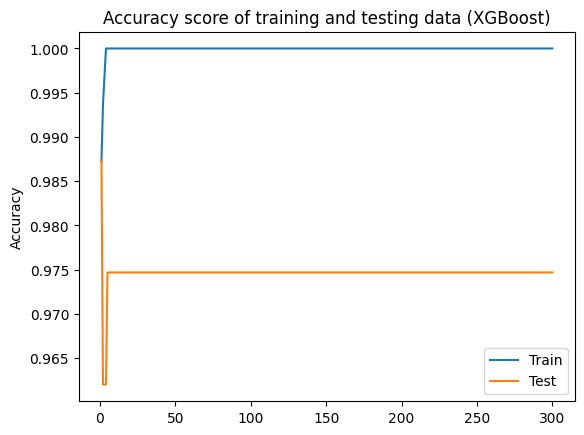

In [36]:
from sklearn.metrics import accuracy_score
train_scores, test_scores = [], []
values1 = [i for i in range(1, predict_img.shape[0]//100000)]
for i in values1:
    model = xgb.XGBClassifier(objective = "multi:softprob", random_state = 42, verbosity = 3, n_estimators = 500, max_depth = i, n_thread = 8, n_jobs = 8, learning_rate = 0.01)
    model.fit(X_train, Y_train)
    train_yhat = model.predict(X_train)
    train_acc = accuracy_score(Y_train, train_yhat)
    train_scores.append(train_acc)
    test_yhat = model.predict(X_test)
    test_acc = accuracy_score(Y_test, test_yhat)
    test_scores.append(test_acc)
    print('>%d, train: %.3f, test: %.3f' % (i, train_acc, test_acc))
plt.plot(values1, train_scores, label='Train')
plt.plot(values1, test_scores, label='Test')
plt.title('Accuracy score of training and testing data (XGBoost)')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

<font size="3">Confusion Matrix</font>

In [37]:
c_matrix = confusion_matrix(Y_test, Y_predict)

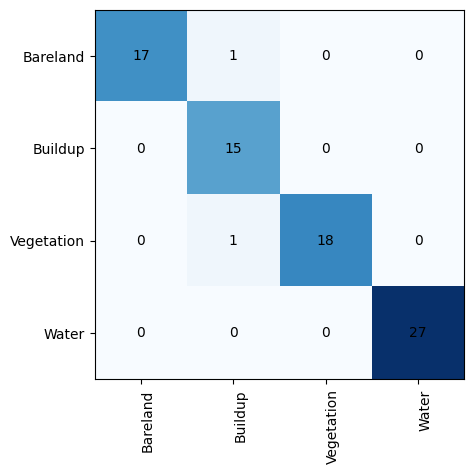

In [38]:
values = ['Bareland', 'Buildup', 'Vegetation', 'Water']
fig, ax = plt.subplots()
ax.imshow(c_matrix, cmap = 'Blues')

# Add the labels
ax.set_xticks(np.arange(len(values)), labels = values)
ax.set_yticks(np.arange(len(values)), labels = values)

# Rotate the labels of the X-axis
plt.setp(ax.get_xticklabels(), rotation = 90, ha = "right", rotation_mode = "anchor")


for i in range(len(values)):
    for j in range(len(values)):
        text = ax.text(j, i, round(c_matrix[i, j], 1), ha = "center", va = "center", color = "black")

plt.show()

<font size="3">Cohen Kappa Score:</font>

In [39]:
print("Cohen Kappa Score:", cohen_kappa_score(Y_test, Y_predict))

Cohen Kappa Score: 0.9657192449555219


In [40]:
#Omission Error
cover = ['Bareland', 'Buildup', 'Vegetation', 'Water']
def omission_error(confusion_m):
    print('Omission Error:\n')
    for i in range(len(confusion_m)):
        error = 0
        totalReferenceSites = 0
        for j in range(len(confusion_m[i])):
            if i == j:
                totalReferenceSites += confusion_m[i][j]
            if i != j:
                error += confusion_m[j][i]
                totalReferenceSites += confusion_m[j][i]
        omission_error = (error/totalReferenceSites) * 100
        print("{}: {}%".format(cover[i], omission_error))

#Commission Error
def commission_error(confusion_m):
    print('Commission Error:\n')
    for i in range(len(confusion_m)):
        error = 0
        totalClassifiedSites = 0
        for j in range(len(confusion_m[i])):
            if i == j:
                totalClassifiedSites += confusion_m[i][j]
            if i != j:
                error += confusion_m[i][j]
                totalClassifiedSites += confusion_m[j][i]
        commission_error = (error/totalClassifiedSites) * 100
        print("{}: {}%".format(cover[i], commission_error))

#Producers Accuracy
def producers_accuracy(confusion_m):
    print('Producers Accuracy:\n')
    for i in range(len(confusion_m)):
        error = 0
        totalReferenceSites = 0
        for j in range(len(confusion_m[i])):
            if i == j:
                correctlyClassified = confusion_m[i][j]
            totalReferenceSites += confusion_m[j][i]
        producers_accuracy = (correctlyClassified/totalReferenceSites) * 100
        print("{}: {}%".format(cover[i], producers_accuracy))
        
#Users Accuracy
def users_accuracy(confusion_m):
    print('Users Accuracy:\n')
    for i in range(len(confusion_m)):
        error = 0
        totalReferenceSites = 0
        for j in range(len(confusion_m[i])):
            if i == j:
                correctlyClassified = confusion_m[i][j]
            totalReferenceSites += confusion_m[i][j]
        users_accuracy = (correctlyClassified/totalReferenceSites) * 100
        print("{}: {}%".format(cover[i], users_accuracy))

In [41]:
omission_error(c_matrix)

Omission Error:

Bareland: 0.0%
Buildup: 11.76470588235294%
Vegetation: 0.0%
Water: 0.0%


In [42]:
commission_error(c_matrix)

Commission Error:

Bareland: 5.88235294117647%
Buildup: 0.0%
Vegetation: 5.555555555555555%
Water: 0.0%


In [43]:
producers_accuracy(c_matrix)

Producers Accuracy:

Bareland: 100.0%
Buildup: 88.23529411764706%
Vegetation: 100.0%
Water: 100.0%


In [44]:
users_accuracy(c_matrix)

Users Accuracy:

Bareland: 94.44444444444444%
Buildup: 100.0%
Vegetation: 94.73684210526315%
Water: 100.0%


### Classification results

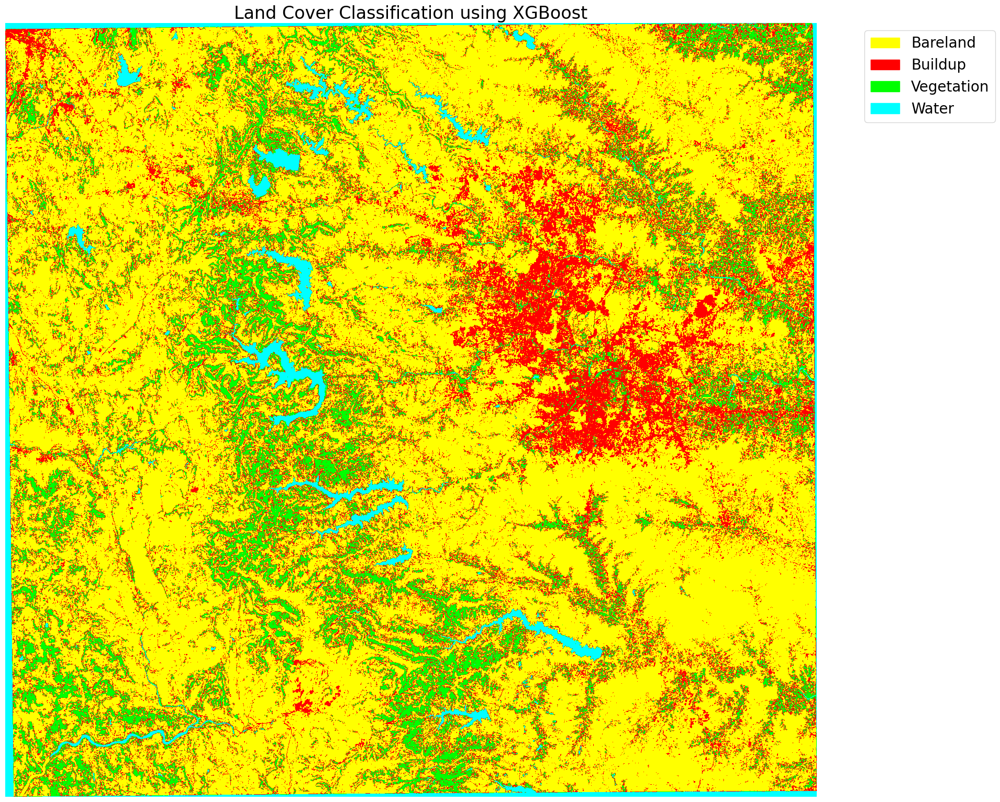

In [45]:
import matplotlib.patches as mpatches

plt.figure(figsize = (20,20))
im = plt.imshow(array_pred, cmap = cmap)
values = ['Bareland', 'Buildup', 'Vegetation', 'Water']
colors = ['yellow', 'red', 'lime', 'cyan']
patches = [ mpatches.Patch(color=colors[i], label=values[i]) for i in range(len(values)) ]
plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, fontsize = "20")
plt.title('Land Cover Classification using XGBoost', fontsize = 24)
plt.axis('off')
plt.show()

In [46]:
classes, quanti_arr = np.unique(array_pred, return_counts = True)

In [47]:
quanti_arr

array([19646586,  2988363,  6338639,  1171835], dtype=int64)

In [48]:
areas = quanti_arr * 20 * 20 /1000000

In [49]:
data_stack = np.stack((classes, quanti_arr, areas, values))

In [50]:
data_stack.T

array([['0', '19646586', '7858.6344', 'Bareland'],
       ['1', '2988363', '1195.3452', 'Buildup'],
       ['2', '6338639', '2535.4556', 'Vegetation'],
       ['3', '1171835', '468.734', 'Water']], dtype='<U32')

In [51]:
df_data = pd.DataFrame(data = data_stack.T, columns = ['ClassNo', 'Qtd', 'Area (sqkm)', 'Classes'])

In [52]:
df_data['Area (sqkm)'] = df_data['Area (sqkm)'].astype(np.float32)

In [53]:
df_data

,ClassNo,Qtd,Area (sqkm),Classes
0,0,19646586,7858.634277,Bareland
1,1,2988363,1195.345215,Buildup
2,2,6338639,2535.455566,Vegetation
3,3,1171835,468.734009,Water


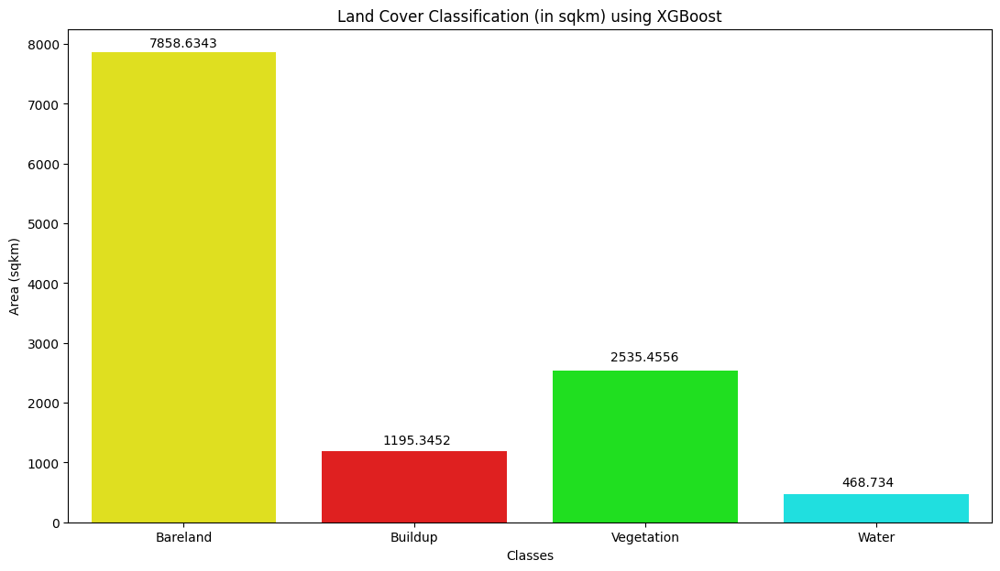

In [54]:
fig, ax3 = plt.subplots(figsize = (13, 7))
ax1 = sns.barplot(data = df_data, x = 'Classes', y = 'Area (sqkm)', palette = cmap.colors)


plt.text(-0.15, 7950, df_data['Area (sqkm)'][0], fontsize = 10)
plt.text(0.86, 1300, df_data['Area (sqkm)'][1], fontsize = 10)
plt.text(1.85, 2700, df_data['Area (sqkm)'][2], fontsize = 10)
plt.text(2.85, 600, df_data['Area (sqkm)'][3], fontsize = 10)
plt.title('Land Cover Classification (in sqkm) using XGBoost')
plt.show()

In [55]:
def draw_pieChart(data):
    cover = ['Bareland', 'Buildup', 'Vegetation', 'Water']
    palette_color = sns.color_palette('Reds')
    explode = [0.1, 0, 0, 0]
    plt.pie(data, labels=cover, colors=['yellow', 'red', 'lime', 'cyan'], explode=explode, autopct='%.0f%%')
    plt.show()

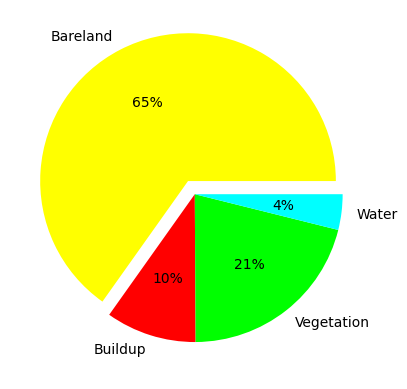

In [56]:
draw_pieChart(df_data['Area (sqkm)'])

# Random Forest

In [57]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(X_train, Y_train)

RandomForestClassifier()

In [58]:
Y_predict_rf = rf.predict(X_test)

In [59]:
array_pred_rf = rf.predict(predict_img)

In [60]:
array_pred_rf = array_pred_rf.reshape(img.shape[0], img.shape[1])

### Model Evaluation

<font size="3">Classification Report</font>

In [61]:
print(classification_report(Y_test, Y_predict_rf))

              precision    recall  f1-score   support

           0       1.00      0.94      0.97        18
           1       0.94      1.00      0.97        15
           2       1.00      1.00      1.00        19
           3       1.00      1.00      1.00        27

    accuracy                           0.99        79
   macro avg       0.98      0.99      0.98        79
weighted avg       0.99      0.99      0.99        79



<font size="3">Accuracy score of training and testing data</font>

>1, train: 0.962, test: 0.962
>2, train: 0.962, test: 0.987
>3, train: 0.971, test: 0.987
>4, train: 0.984, test: 1.000
>5, train: 0.994, test: 0.987
>6, train: 0.997, test: 0.987
>7, train: 1.000, test: 0.987
>8, train: 1.000, test: 0.987
>9, train: 1.000, test: 0.987
>10, train: 1.000, test: 1.000
>11, train: 1.000, test: 0.987
>12, train: 1.000, test: 1.000
>13, train: 1.000, test: 0.987
>14, train: 1.000, test: 0.987
>15, train: 1.000, test: 0.987
>16, train: 1.000, test: 0.987
>17, train: 1.000, test: 0.987
>18, train: 1.000, test: 0.987
>19, train: 1.000, test: 0.987
>20, train: 1.000, test: 0.987
>21, train: 1.000, test: 0.987
>22, train: 1.000, test: 1.000
>23, train: 1.000, test: 0.987
>24, train: 1.000, test: 1.000
>25, train: 1.000, test: 1.000
>26, train: 1.000, test: 0.987
>27, train: 1.000, test: 0.987
>28, train: 1.000, test: 1.000
>29, train: 1.000, test: 1.000
>30, train: 1.000, test: 0.987
>31, train: 0.997, test: 1.000
>32, train: 1.000, test: 0.987
>33, train: 1.000

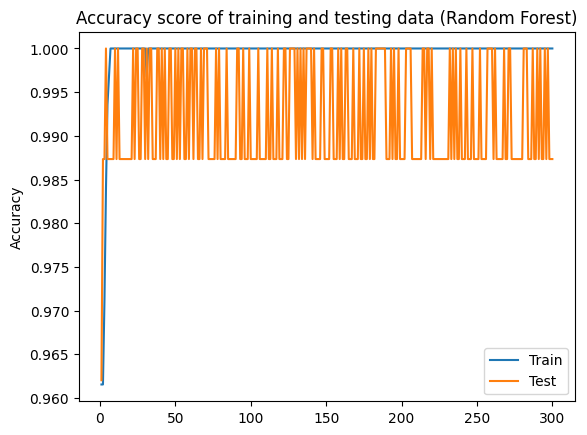

In [62]:
from sklearn.metrics import accuracy_score
train_scores, test_scores = [], []
values1 = [i for i in range(1, predict_img.shape[0]//100000)]
for i in values1:
    model = RandomForestClassifier(max_depth=i)
    model.fit(X_train, Y_train)
    train_yhat = model.predict(X_train)
    train_acc = accuracy_score(Y_train, train_yhat)
    train_scores.append(train_acc)
    test_yhat = model.predict(X_test)
    test_acc = accuracy_score(Y_test, test_yhat)
    test_scores.append(test_acc)
    print('>%d, train: %.3f, test: %.3f' % (i, train_acc, test_acc))
plt.plot(values1, train_scores, label='Train')
plt.plot(values1, test_scores, label='Test')
plt.title('Accuracy score of training and testing data (Random Forest)')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

<font size="3">Confusion matrix</font>

In [63]:
c_matrix_rf = confusion_matrix(Y_test, Y_predict_rf)

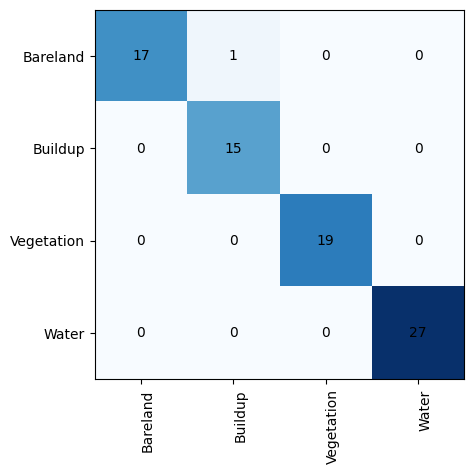

In [64]:
values = ['Bareland', 'Buildup', 'Vegetation', 'Water']
fig, ax = plt.subplots()
ax.imshow(c_matrix_rf, cmap = 'Blues')

# Add the labels
ax.set_xticks(np.arange(len(values)), labels = values)
ax.set_yticks(np.arange(len(values)), labels = values)

# Rotate the labels of the X-axis
plt.setp(ax.get_xticklabels(), rotation = 90, ha = "right", rotation_mode = "anchor")


for i in range(len(values)):
    for j in range(len(values)):
        text = ax.text(j, i, round(c_matrix_rf[i, j], 1), ha = "center", va = "center", color = "black")

plt.show()

<font size="3">Cohen Kappa Score</font>

In [65]:
print("Cohen Kappa Score:",cohen_kappa_score(Y_test, Y_predict_rf))

Cohen Kappa Score: 0.9828447339847991


In [66]:
omission_error(c_matrix_rf)

Omission Error:

Bareland: 0.0%
Buildup: 6.25%
Vegetation: 0.0%
Water: 0.0%


In [67]:
commission_error(c_matrix_rf)

Commission Error:

Bareland: 5.88235294117647%
Buildup: 0.0%
Vegetation: 0.0%
Water: 0.0%


In [68]:
producers_accuracy(c_matrix_rf)

Producers Accuracy:

Bareland: 100.0%
Buildup: 93.75%
Vegetation: 100.0%
Water: 100.0%


In [69]:
users_accuracy(c_matrix_rf)

Users Accuracy:

Bareland: 94.44444444444444%
Buildup: 100.0%
Vegetation: 100.0%
Water: 100.0%


### Classification results

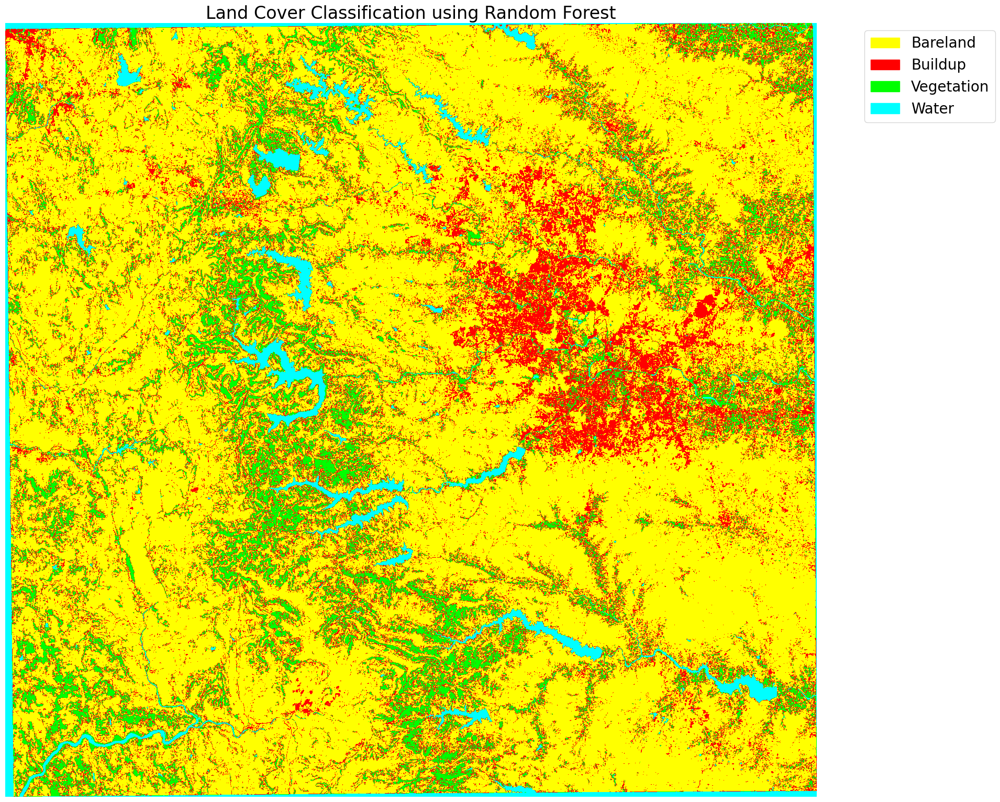

In [70]:
plt.figure(figsize = (20,20))
plt.imshow(array_pred_rf, cmap = cmap)
values = ['Bareland', 'Buildup', 'Vegetation', 'Water']
colors = ['yellow', 'red', 'lime', 'cyan']
patches = [ mpatches.Patch(color=colors[i], label=values[i]) for i in range(len(values)) ]
plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, fontsize = "20")
plt.title('Land Cover Classification using Random Forest', fontsize = 24)
plt.axis('off')
plt.show()

In [71]:
classes, quanti_arr_rf = np.unique(array_pred_rf, return_counts = True)

In [72]:
quanti_arr_rf

array([20622350,  1984858,  6360587,  1177628], dtype=int64)

In [73]:
areas = quanti_arr_rf * 20 * 20 /1000000

In [74]:
data_stack_rf = np.stack((classes, quanti_arr_rf, areas, values))

In [75]:
df_data_rf = pd.DataFrame(data = data_stack_rf.T, columns = ['Codigos', 'Qtd', 'Area (sqkm)', 'Classes'])

In [76]:
df_data_rf['Area (sqkm)'] = df_data_rf['Area (sqkm)'].astype(np.float32)

In [77]:
df_data_rf

,Codigos,Qtd,Area (sqkm),Classes
0,0,20622350,8248.940430,Bareland
1,1,1984858,793.943176,Buildup
2,2,6360587,2544.234863,Vegetation
3,3,1177628,471.051208,Water


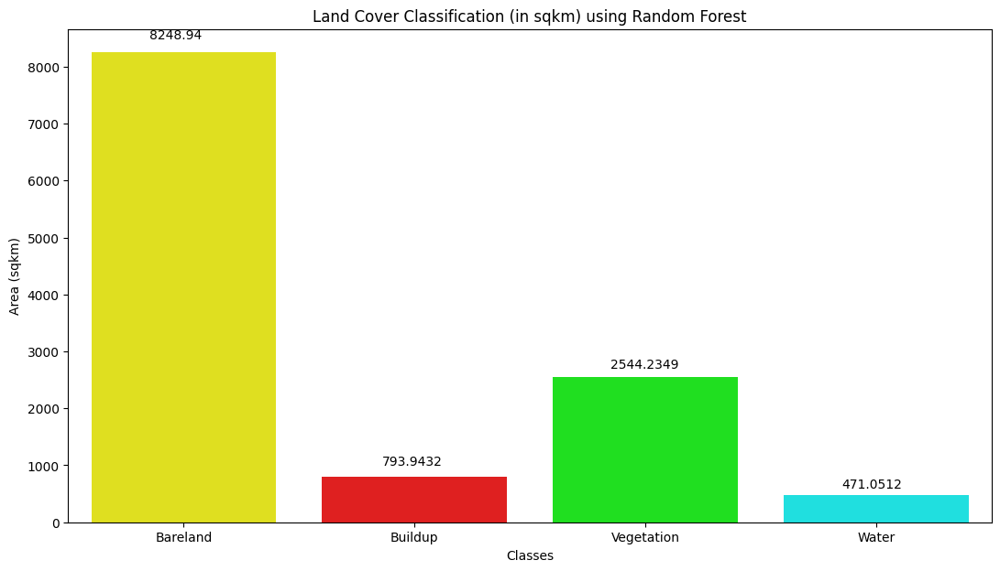

In [78]:
fig, ax3 = plt.subplots(figsize = (13, 7))
ax1 = sns.barplot(data = df_data_rf, x = 'Classes', y = 'Area (sqkm)', palette = cmap.colors)


plt.text(-0.15, 8490, df_data_rf['Area (sqkm)'][0], fontsize = 10)
plt.text(0.86, 1000, df_data_rf['Area (sqkm)'][1], fontsize = 10)
plt.text(1.85, 2700, df_data_rf['Area (sqkm)'][2], fontsize = 10)
plt.text(2.85, 600, df_data_rf['Area (sqkm)'][3], fontsize = 10)
plt.title('Land Cover Classification (in sqkm) using Random Forest')
plt.show()

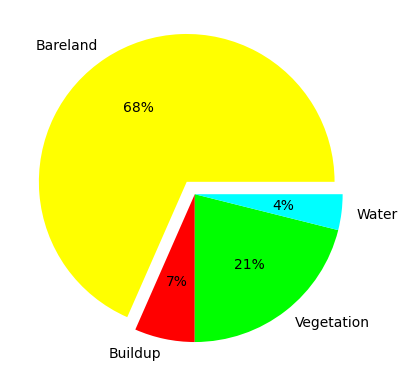

In [79]:
draw_pieChart(df_data_rf['Area (sqkm)'])